In [1]:
import pennylane as qml
import torch
import numpy as np
import random
import torch.nn as nn
from tqdm import tqdm
from sklearn.metrics import roc_auc_score

In [2]:
import functools
import inspect
import math
from collections.abc import Iterable
from typing import Callable, Dict, Union, Any

from pennylane import QNode

try:
    import torch
    from torch.nn import Module

    TORCH_IMPORTED = True
except ImportError:
    # The following allows this module to be imported even if PyTorch is not installed. Users
    # will instead see an ImportError when instantiating the TorchLayer.
    from unittest.mock import Mock

    Module = Mock
    TORCH_IMPORTED = False


class TorchLayer(Module):
    def __init__(self,qnode,weights):
        if not TORCH_IMPORTED:
            raise ImportError(
                "TorchLayer requires PyTorch. PyTorch can be installed using:\n"
                "pip install torch\nAlternatively, "
                "visit https://pytorch.org/get-started/locally/ for detailed "
                "instructions."
            )
        super().__init__()

        #weight_shapes = {
        #    weight: (tuple(size) if isinstance(size, Iterable) else () if size == 1 else (size,))
        #    for weight, size in weight_shapes.items()
        #}

        # validate the QNode signature, and convert to a Torch QNode.
        # TODO: update the docstring regarding changes to restrictions when tape mode is default.
        #self._signature_validation(qnode, weight_shapes)
        self.qnode = qnode
        self.qnode.interface = "torch"

        self.qnode_weights = weights

    def forward(self, inputs):  # pylint: disable=arguments-differ
        """Evaluates a forward pass through the QNode based upon input data and the initialized
        weights.

        Args:
            inputs (tensor): data to be processed

        Returns:
            tensor: output data
        """

        if len(inputs.shape) > 1:
            # If the input size is not 1-dimensional, unstack the input along its first dimension,
            # recursively call the forward pass on each of the yielded tensors, and then stack the
            # outputs back into the correct shape
            reconstructor = [self.forward(x) for x in torch.unbind(inputs)]
            return torch.stack(reconstructor)

        # If the input is 1-dimensional, calculate the forward pass as usual
        return self._evaluate_qnode(inputs)


    def _evaluate_qnode(self, x):
        """Evaluates the QNode for a single input datapoint.

        Args:
            x (tensor): the datapoint

        Returns:
            tensor: output datapoint
        """
        kwargs = {
            **{self.input_arg: x},
            **{arg: weight.to(x) for arg, weight in self.qnode_weights.items()},
        }
        res = self.qnode(**kwargs)

        if isinstance(res, torch.Tensor):
            return res.type(x.dtype)

        return torch.hstack(res).type(x.dtype)

    def __str__(self):
        detail = "<Quantum Torch Layer: func={}>"
        return detail.format(self.qnode.func.__name__)

    __repr__ = __str__
    _input_arg = "inputs"

    @property
    def input_arg(self):
        """Name of the argument to be used as the input to the Torch layer. Set to ``"inputs"``."""
        return self._input_arg

In [37]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def visualize_attention(alpha, img_shape=(8,8), patch_shape=(49,49)):
    """
    alpha: Attention values (torch tensor or numpy array)
    img_shape: Shape of the original image (height, width)
    patch_shape: Shape of the patch (height, width)
    """
    # Reshape alpha to match image shape
    alpha = alpha.detach().numpy() if isinstance(alpha, torch.Tensor) else alpha
    attention_map = np.mean(alpha, axis=0).reshape(patch_shape)  # Mean over the sequence
    
    # Normalize the attention map
    attention_map = (attention_map - attention_map.min()) / (attention_map.max() - attention_map.min())

    
    # Calculate the sum of each row (goro 합)
    row_sums = np.sum(attention_map, axis=1)
    print("Row sums:", row_sums)

    # Plot the attention map
    plt.figure(figsize=(6, 6))
    sns.heatmap(attention_map, annot=False, cmap="YlGnBu", cbar=True)
    plt.title("Attention Map")
    plt.show()

    # Plot bar chart for the row sums
    plt.figure(figsize=(10, 6))
    plt.bar(np.arange(len(row_sums)), row_sums, color='blue')
    plt.title("Sums of Attention Coefficients by Patch Index")
    plt.xlabel("Patch Index")
    plt.ylabel("Sum of Attention Coefficients")
    
    # Set x-axis ticks to be integers only
    plt.xticks(np.arange(len(row_sums)), np.arange(len(row_sums)).astype(int))
    plt.show()

In [4]:
def set_random_seed(seed):
    random.seed(seed)
    torch.manual_seed(seed)

In [5]:
class QSAL_pennylane(torch.nn.Module):
    def __init__(self,S,n,Denc,D):
        super().__init__()
        self.seq_num=S
        self.init_params_Q=torch.nn.Parameter(torch.stack([(np.pi/4) * (2 * torch.randn(n*(D+2)) - 1) for _ in range(self.seq_num)]))
        self.init_params_K=torch.nn.Parameter(torch.stack([(np.pi/4) * (2 * torch.randn(n*(D+2)) - 1) for _ in range(self.seq_num)]))
        self.init_params_V=torch.nn.Parameter(torch.stack([(np.pi/4) * (2 * torch.randn(n*(D+2)) - 1) for _ in range(self.seq_num)]))
        self.num_q=n
        self.Denc=Denc
        self.D=D
        self.d=n*(Denc+2)
        self.dev = qml.device("default.qubit", wires=self.num_q)
        
        self.vqnod=qml.QNode(self.circuit_v, self.dev, interface="torch")
        self.qnod=qml.QNode(self.circuit_qk, self.dev, interface="torch")
        self.weight_v = [{"weights": self.init_params_V[i]} for i in range(self.seq_num)]
        self.weight_q = [{"weights": self.init_params_Q[i]} for i in range(self.seq_num)]
        self.weight_k = [{"weights": self.init_params_K[i]} for i in range(self.seq_num)]
        #self.v_linear ={} #[qml.qnn.TorchLayer(self.vqnod[i], self.weight_shapes) for i in range(self.seq_num)]
        #for i in range(self.seq_num):
        self.v_linear = [TorchLayer(self.vqnod, self.weight_v[i]) for i in range(self.seq_num)]
        self.q_linear = [TorchLayer(self.qnod, self.weight_q[i]) for i in range(self.seq_num)]
        self.k_linear = [TorchLayer(self.qnod, self.weight_k[i]) for i in range(self.seq_num)]
        #self.qqnod=[qml.QNode(self.circuit_qk, self.dev, interface="torch") for i in range(self.seq_num)]
        
        # Add a variable to store the alpha values
        self.alpha = None

    def random_op(self):
        # 무작위 시드 고정
        set_random_seed(42)  # 원하는 시드 값 설정
        a=random.randint(0, 4)
        if a==0:
            op=qml.Identity(0)
        elif a==1:
            op=qml.PauliX(0)
        elif a==2:
            op=qml.PauliY(0)
        else:
            op=qml.PauliZ(0)

        op_elimated=qml.Identity(0)
        for i in range(1,self.num_q):
            op_elimated=op_elimated@qml.Identity(i)
        Select_wrong=True
        while Select_wrong:
            for i in range(1,self.num_q):
                a=random.randint(0, 4)
                if a==0:
                    op=op@qml.Identity(i)
                elif a==1:
                    op=op@qml.PauliX(i)
                elif a==2:
                    op=op@qml.PauliY(i)
                else:
                    op=op@qml.PauliZ(i)
            if op!=op_elimated:
                Select_wrong=False
        return op

    def circuit_v(self,inputs,weights):
            op=self.random_op()
            # feature_map
            indx=0
            for j in range(self.num_q):
                qml.RX(inputs[indx],j)
                qml.RY(inputs[indx+1],j)
                indx+=2
            for i in range(self.Denc):
                for j in range(self.num_q):
                    qml.CNOT(wires=(j,(j+1)%self.num_q))

                for j in range(self.num_q):
                    qml.RY(inputs[indx],j)
                    indx+=1
            # Ansatz
            indx=0
            for j in range(self.num_q):
                qml.RX(weights[indx],j)
                qml.RY(weights[indx+1],j)
                indx+=2
            for i in range(self.D):
                for j in range(self.num_q):
                    qml.CNOT(wires=(j,(j+1)%self.num_q))
                    
                for j in range(self.num_q):
                    #qc.rx(params[indx],j)
                    qml.RY(weights[indx],j)
                    indx+=1
            return [qml.expval(op) for i in range(self.d)] 

    def circuit_qk(self,inputs,weights):
        op=self.random_op()
        # feature_map
        indx=0
        for j in range(self.num_q):
            qml.RX(inputs[indx],j)
            qml.RY(inputs[indx+1],j)
            indx+=2
        for i in range(self.Denc):
            for j in range(self.num_q):
                qml.CNOT(wires=(j,(j+1)%self.num_q))

            for j in range(self.num_q):
                qml.RY(inputs[indx],j)
                indx+=1
        # Ansatz
        indx=0
        for j in range(self.num_q):
            qml.RX(weights[indx],j)
            qml.RY(weights[indx+1],j)
            indx+=2
        for i in range(self.D):
            for j in range(self.num_q):
                qml.CNOT(wires=(j,(j+1)%self.num_q))
                
            for j in range(self.num_q):
                #qc.rx(params[indx],j)
                qml.RY(weights[indx],j)
                indx+=1
        return [qml.expval(qml.PauliZ(0))]

    def forward(self,input):

        Q_output=torch.stack([self.q_linear[i](input[:,i]) for i in range(self.seq_num)])
        K_output=torch.stack([self.k_linear[i](input[:,i]) for i in range(self.seq_num)])
        V_output=torch.stack([self.v_linear[i](input[:,i]) for i in range(self.seq_num)])
    
        Q_output=Q_output.transpose(0,2).repeat((self.seq_num,1,1))
        K_output=K_output.transpose(0,2).repeat((self.seq_num,1,1)).transpose(0,2)

        
        # Calculate alpha and store it in the instance variable
        self.alpha = torch.exp(-(Q_output - K_output)**2).transpose(0, 1)
        # Example usage:
        visualize_attention(self.alpha)
        V_output=V_output.transpose(0,1)
        output=[]
        
        # print("Q_output size:", Q_output.size())
        # print("K_output size:", K_output.size())
        # print("V_output size:", V_output.size())


        for i in range(self.seq_num):
            
            Sum_a=torch.sum(self.alpha[:,i,:],-1)
            div_sum_a=(1/Sum_a).repeat(self.d,self.seq_num,1).transpose(0,2)
            
            Sum_w=torch.sum(self.alpha[:,:,i].repeat((self.d,1,1)).transpose(0,2).transpose(0,1)*V_output*div_sum_a,1)
            output.append(Sum_w)
        return input+torch.stack(output).transpose(0,1)


class QSANN_pennylane(torch.nn.Module):
    def __init__(self,S,n,Denc,D,num_layers):
        """
        # input: input data
        # weight: trainable parameter
        # n: # of of qubits
        # d: embedding dimension which is equal to n(Denc+2)
        # Denc: the # number of layers for encoding 
        # D: the # of layers of variational layers
        # type "K": key, "Q": Query, "V": value
        """
        super().__init__()
        self.qsal_lst=[QSAL_pennylane(S,n,Denc,D) for _ in range(num_layers)]
        self.qnn=nn.Sequential(*self.qsal_lst)

    def forward(self,input):
        return self.qnn(input)

class QSANN_text_classifier(torch.nn.Module):
    def __init__(self,S,n,Denc,D,num_layers):
        """
        # input: input data
        # weight: trainable parameter
        # n: # of of qubits
        # d: embedding dimension which is equal to n(Denc+2)
        # Denc: the # number of layers for encoding 
        # D: the # of layers of variational layers
        # type "K": key, "Q": Query, "V": value
        """
        super().__init__()
        self.Qnn=QSANN_pennylane(S,n,Denc,D,num_layers)
        self.final_layer=nn.Linear(n*(Denc+2)*S, 1)
        self.final_layer=self.final_layer.float()

    def forward(self,input):
        print(input.shape)
        x=self.Qnn(input)
        x=torch.flatten(x,start_dim=1)
        # print('done2')
        output = torch.sigmoid(self.final_layer(x))
        # print('done3')
        return output

In [6]:
from tensorflow.keras.datasets import mnist
from sklearn.model_selection import train_test_split

# MNIST 데이터 불러오기
(X_train_full, y_train_full), (X_test_full, y_test_full) = mnist.load_data()

# 데이터 정규화 (0-255 값을 0-1 사이로)
X_train_full = X_train_full.astype('float32') / 255.0
X_test_full = X_test_full.astype('float32') / 255.0

#torch.transform / normalize // imagenet mean sd 

# 숫자 1과 7만 선택하는 마스크 생성
train_mask = np.isin(y_train_full, [1, 7])
X_train, y_train = X_train_full[train_mask], y_train_full[train_mask]

test_mask = np.isin(y_test_full, [1, 7])
X_test, y_test = X_test_full[test_mask], y_test_full[test_mask]

# 시드 고정 (예: 42로 고정)
np.random.seed(42)

# 2000개의 데이터를 무작위로 선택
num_samples = 200
indices = np.random.choice(len(X_train), num_samples, replace=False)
X_sampled, y_sampled = X_train[indices], y_train[indices]

# 2000개의 샘플에서 train/test 데이터 분할 (80% train, 20% test 비율로 나눔)
X_train, X_test, y_train, y_test = train_test_split(
    X_sampled, y_sampled, test_size=0.2, random_state=42
)

# 결과
print(f"Training set size: {len(X_train)}")
print(f"Test set size: {len(X_test)}")


2024-10-16 21:40:33.795286: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-10-16 21:40:33.796283: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-10-16 21:40:33.800228: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-10-16 21:40:33.812617: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-16 21:40:33.832503: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been 

Training set size: 160
Test set size: 40


In [7]:
X_train.shape

(160, 28, 28)

In [8]:
# 2x2 크기로 겹치지 않게 패치로 나누는 함수
def split_into_non_overlapping_patches(image, patch_size=(4, 4)):
    patches = []
    for i in range(0, image.shape[0], patch_size[0]):
        for j in range(0, image.shape[1], patch_size[1]):
            patch = image[i:i+patch_size[0], j:j+patch_size[1]].flatten()
            patches.append(patch)
    return np.array(patches)

In [9]:
# 각 이미지를 2x2 겹치지 않는 패치로 나누기
X_train = np.array([split_into_non_overlapping_patches(img) for img in X_train])
X_test = np.array([split_into_non_overlapping_patches(img) for img in X_test])

In [10]:
# y_train이 numpy 배열일 경우
unique, counts = np.unique(y_train, return_counts=True)
class_distribution = dict(zip(unique, counts))
print(class_distribution)

{1: 76, 7: 84}


In [11]:
# y_train이 numpy 배열일 경우
unique, counts = np.unique(y_test, return_counts=True)
class_distribution = dict(zip(unique, counts))
print(class_distribution)

{1: 25, 7: 15}


In [12]:
# Model, optimizer, and criterion setup
model = QSANN_text_classifier(49, 4, 2, 1, 1)
optimizer = torch.optim.Adam(lr=0.01, params=model.parameters())
criterion = torch.nn.CrossEntropyLoss()

In [13]:
def binary_accuracy(preds, y):
    """
    Returns accuracy per batch, i.e. if you get 8/10 right, this returns 0.8, NOT 8
    """

    #round predictions to the closest integer
    rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2
    correct = (rounded_preds == y).float() #convert into float for division 
    acc = correct.sum() / len(correct)
    return acc

In [14]:
# 학습 후 모델 파라미터 저장 경로
model_save_path = "/home/jaeyeob/QVT/result/MNIST/qsann_classifier_1.pth"

  0%|          | 0/20 [00:00<?, ?it/s]

torch.Size([160, 49, 16])
Row sums: [46.29992  46.268784 46.150093 22.315367 46.138424 46.26472  46.308
 21.881042 46.295567 45.821907 41.91381  44.098614 44.54639  45.807014
 19.858322 44.244076 44.60382  45.14896  44.692894 45.858524 46.052822
 45.968063 29.640608 46.125145 45.888252 45.395966 42.83858  45.885204
 46.10056  46.08377  46.254223 44.671062 45.87817  46.218544 40.78894
 45.671455 46.27339  45.59404  44.722267 44.822292 46.233215 45.885685
 42.335476 41.36791  45.142586 46.036762 45.557545 38.940254 46.307793]


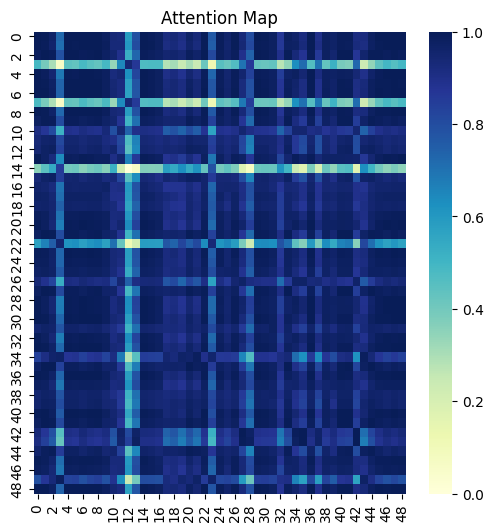

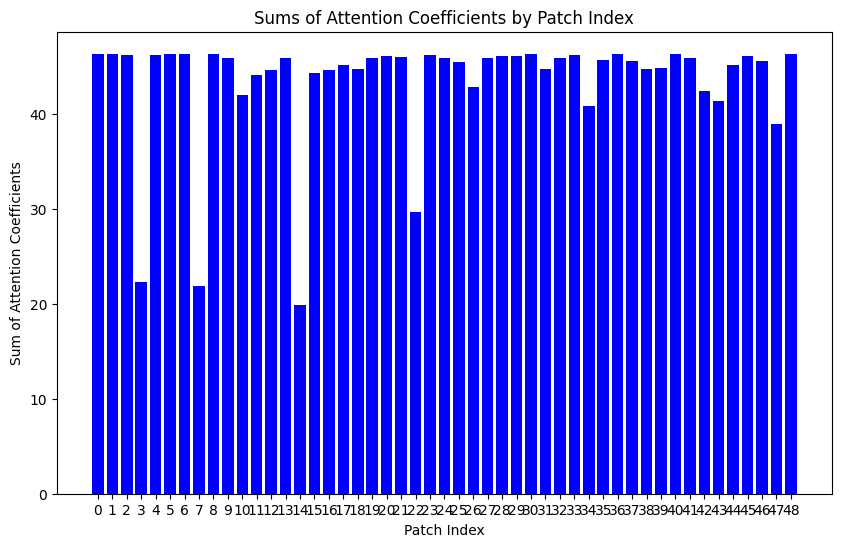

/tmp/ipykernel_196649/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2


Accuracy: 0.4375
Loss: 426.516357421875


  5%|▌         | 1/20 [10:45<3:24:16, 645.08s/it]

Complete 0 th
torch.Size([160, 49, 16])
Row sums: [46.317043 46.276527 46.214462 21.80926  46.17993  46.28993  46.33668
 22.15402  46.317024 45.88577  41.760666 44.034935 44.53485  45.881027
 19.591562 44.04967  44.617405 45.171917 44.7038   45.850018 46.016163
 45.99768  30.34874  46.139027 45.919796 45.48749  42.585205 45.97757
 46.0531   46.011234 46.278973 44.756016 45.864635 46.23478  40.48082
 45.620186 46.299583 45.56619  44.771507 44.846306 46.27275  45.97657
 42.59066  41.69654  45.26952  46.039715 45.54211  39.449665 46.336227]


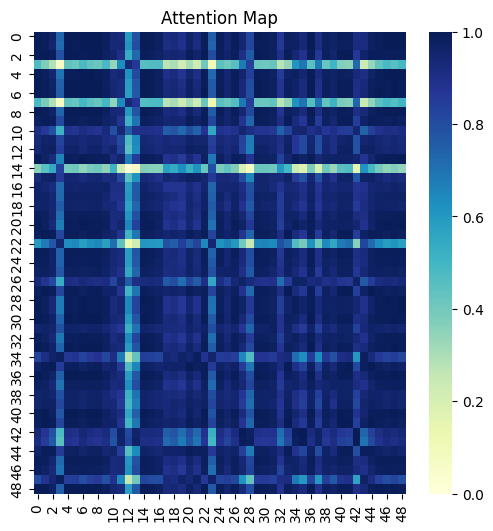

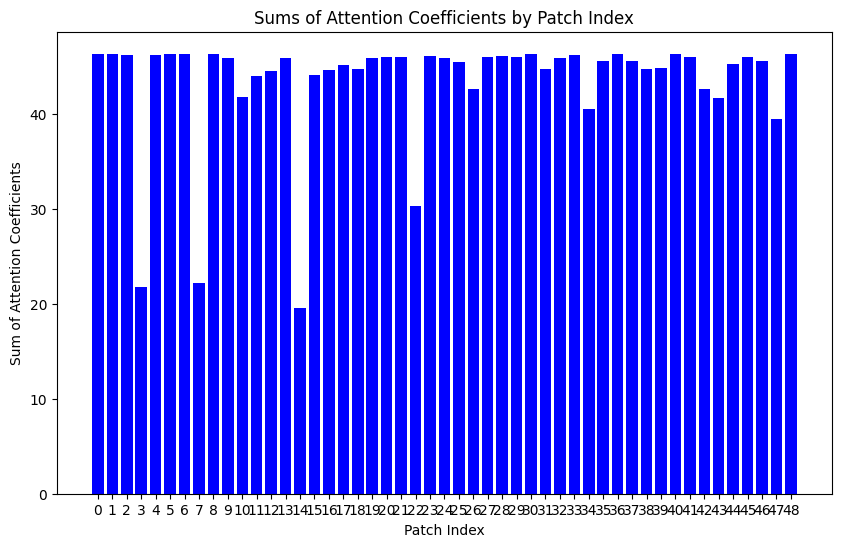

/tmp/ipykernel_196649/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2


Accuracy: 0.893750011920929
Loss: 419.38323974609375


 10%|█         | 2/20 [22:43<3:26:26, 688.15s/it]

Complete 1 th
torch.Size([160, 49, 16])
Row sums: [46.36611  46.327747 46.25123  21.283005 46.185596 46.335407 46.382935
 22.4015   46.363503 45.92658  41.62393  44.139713 44.60424  45.957176
 19.470488 44.256943 44.710125 45.206684 44.766956 45.866608 45.988533
 46.098503 30.97782  46.174603 45.967316 45.497005 42.377132 46.00438
 46.12183  45.948368 46.32396  44.784973 45.879322 46.273148 40.484364
 45.609936 46.342686 45.551537 44.818146 44.873955 46.328453 46.076283
 42.748447 42.007355 45.40738  46.078075 45.538925 39.799385 46.38285 ]


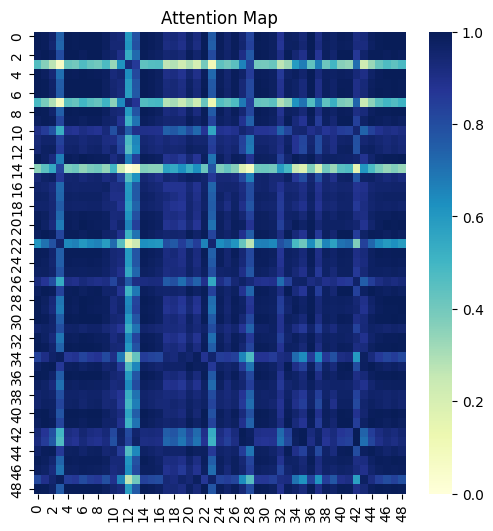

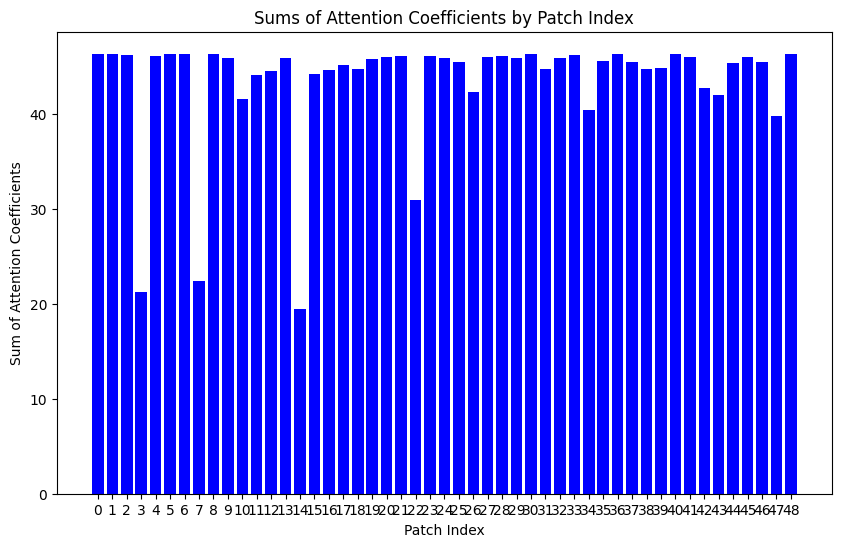

/tmp/ipykernel_196649/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2


Accuracy: 0.9624999761581421
Loss: 414.1096496582031


 15%|█▌        | 3/20 [35:04<3:21:47, 712.21s/it]

Complete 2 th
torch.Size([160, 49, 16])
Row sums: [46.385414 46.35048  46.24975  20.888014 46.154972 46.35166  46.398098
 22.56624  46.380157 45.92592  41.454613 44.226894 44.639137 46.005116
 19.616251 44.4637   44.772236 45.210415 44.800896 45.866615 45.92822
 46.160988 31.558922 46.178608 45.980247 45.460068 42.3157   45.986885
 46.175278 45.840336 46.338764 44.772972 45.8645   46.279358 40.740192
 45.550472 46.353592 45.49877  44.831127 44.859577 46.34985  46.134705
 42.876038 41.92733  45.498486 46.095306 45.496857 40.05722  46.398094]


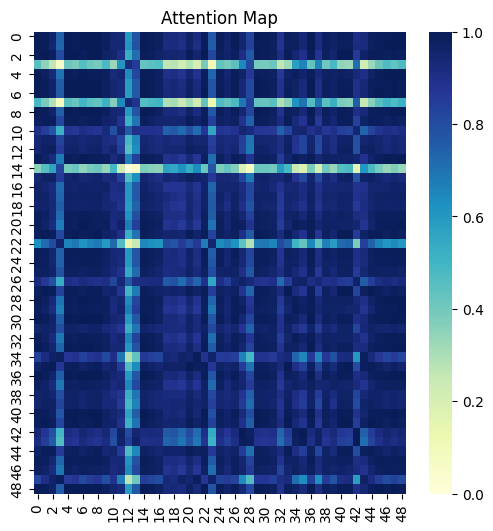

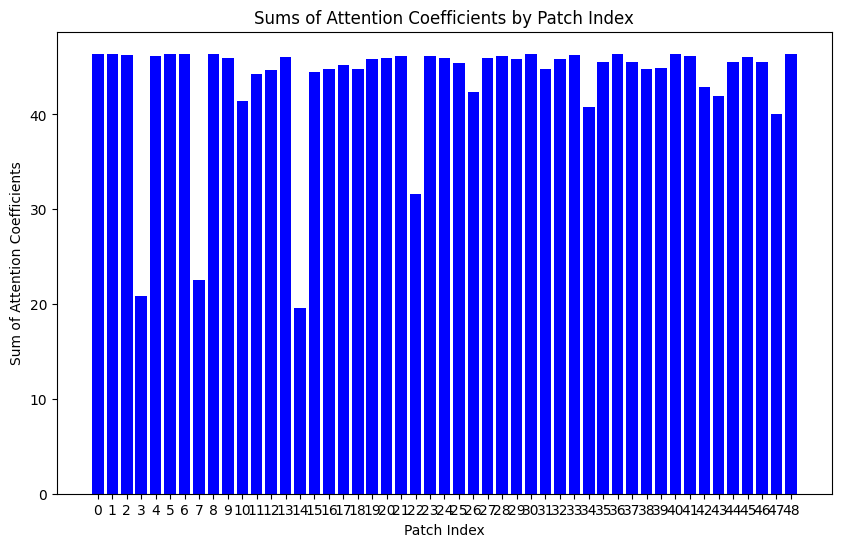

/tmp/ipykernel_196649/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2


Accuracy: 0.981249988079071
Loss: 410.22235107421875


 20%|██        | 4/20 [47:47<3:15:16, 732.30s/it]

Complete 3 th
torch.Size([160, 49, 16])
Row sums: [46.379436 46.348534 46.218163 20.608925 46.09255  46.34302  46.38811
 22.797771 46.37184  45.894253 41.266376 44.296856 44.653847 46.03016
 19.839218 44.652664 44.795223 45.19082  44.80813  45.849617 45.839638
 46.193985 32.143238 46.155315 45.962597 45.388905 42.39067  45.936817
 46.2071   45.685993 46.328857 44.73085  45.83022  46.258045 41.031963
 45.452915 46.337727 45.407753 44.819912 44.818623 46.344208 46.164246
 42.83901  41.682213 45.56142  46.09182  45.417767 40.269005 46.388073]


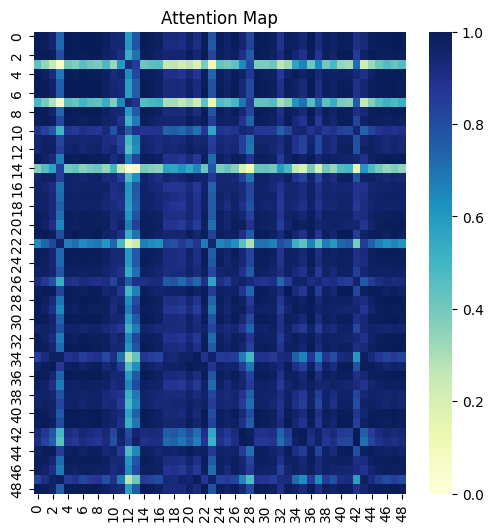

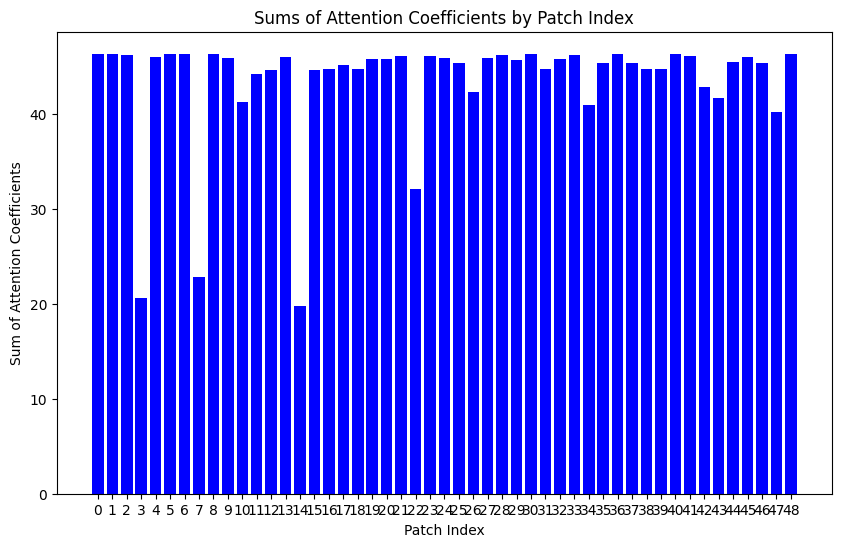

/tmp/ipykernel_196649/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2


Accuracy: 0.987500011920929
Loss: 407.205322265625


 25%|██▌       | 5/20 [1:00:39<3:06:40, 746.68s/it]

Complete 4 th
torch.Size([160, 49, 16])
Row sums: [46.363224 46.335052 46.178703 20.2373   46.00621  46.325466 46.36954
 23.026579 46.35366  45.855614 41.048733 44.36192  44.671104 46.036148
 20.131294 44.839264 44.789112 45.160553 44.801907 45.82459  45.725307
 46.218525 32.773525 46.11779  45.92831  45.304596 42.4989   45.880306
 46.22386  45.485226 46.309544 44.679302 45.785828 46.22178  41.362114
 45.34602  46.309566 45.282406 44.80439  44.77862  46.32902  46.18719
 42.63639  41.34504  45.6224   46.07901  45.310787 40.347893 46.369167]


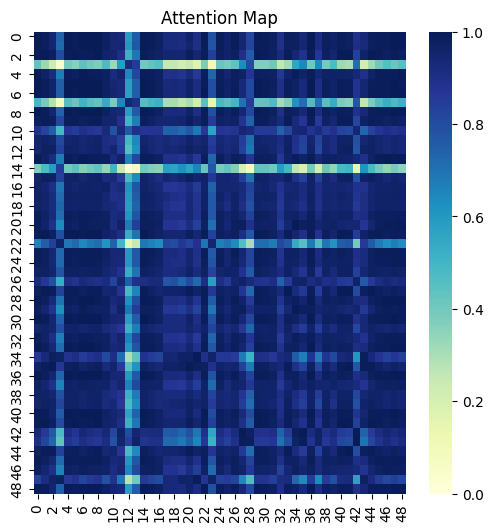

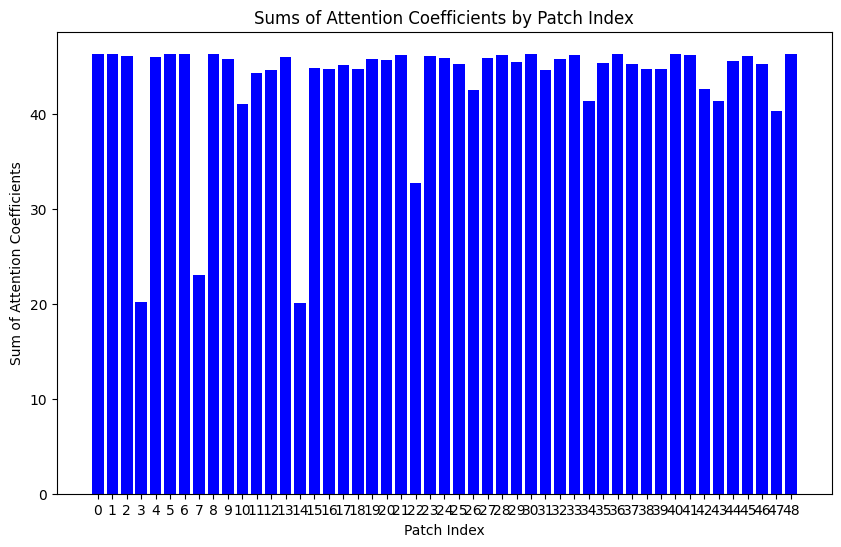

/tmp/ipykernel_196649/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2


Accuracy: 0.9937499761581421
Loss: 404.8511657714844


 30%|███       | 6/20 [1:13:35<2:56:32, 756.63s/it]

Complete 5 th
torch.Size([160, 49, 16])
Row sums: [46.363403 46.336143 46.158634 19.757597 45.918556 46.325424 46.368637
 23.193249 46.3518   45.83641  40.81494  44.434933 44.70888  46.0412
 20.444115 45.038143 44.768753 45.142365 44.80684  45.815117 45.604202
 46.258247 33.460255 46.090508 45.90156  45.233334 42.62648  45.843945
 46.24977  45.25844  46.306805 44.64433  45.75413  46.19482  41.724583
 45.25611  46.29419  45.14482  44.805714 44.76567  46.32954  46.2275
 42.367237 40.946255 45.70481  46.081364 45.207825 40.273037 46.367386]


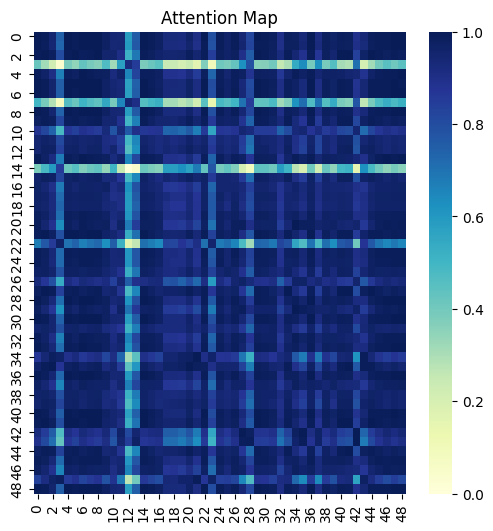

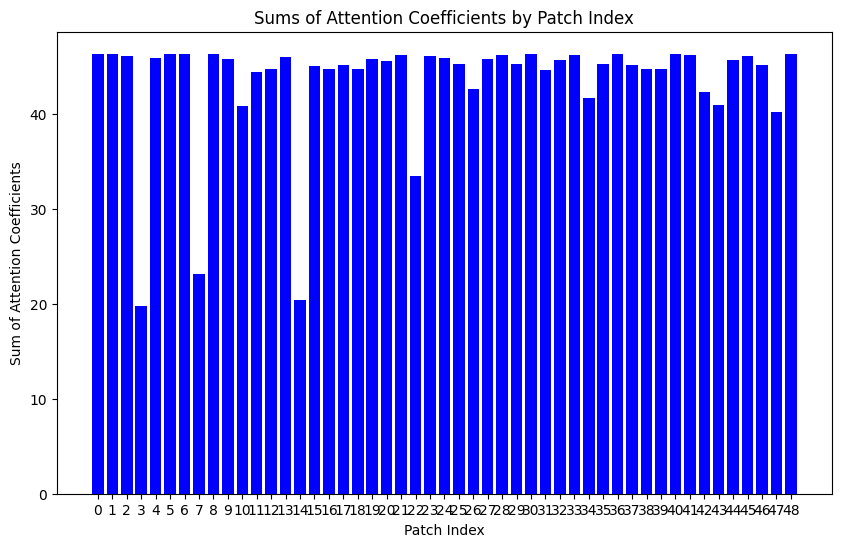

/tmp/ipykernel_196649/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2


Accuracy: 0.9937499761581421
Loss: 403.0864562988281


 35%|███▌      | 7/20 [1:26:47<2:46:28, 768.31s/it]

Complete 6 th
torch.Size([160, 49, 16])
Row sums: [46.379498 46.35219  46.153473 19.253157 45.8342   46.34162  46.383984
 23.22898  46.365658 45.830536 40.586243 44.509586 44.75529  46.04793
 20.644033 45.233696 44.730724 45.137398 44.824852 45.822937 45.480637
 46.306366 34.181442 46.074554 45.882774 45.172997 42.781452 45.819885
 46.285995 45.01515  46.31996  44.623753 45.7412   46.17928  42.065132
 45.17538  46.292088 45.00168  44.81666  44.773415 46.343773 46.277645
 42.069084 40.534817 45.798588 46.099575 45.126858 40.112434 46.38133 ]


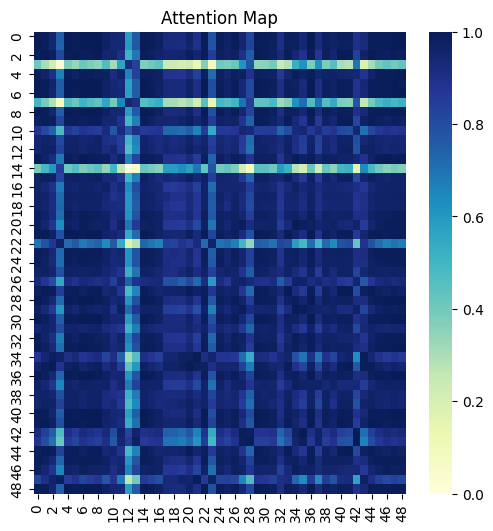

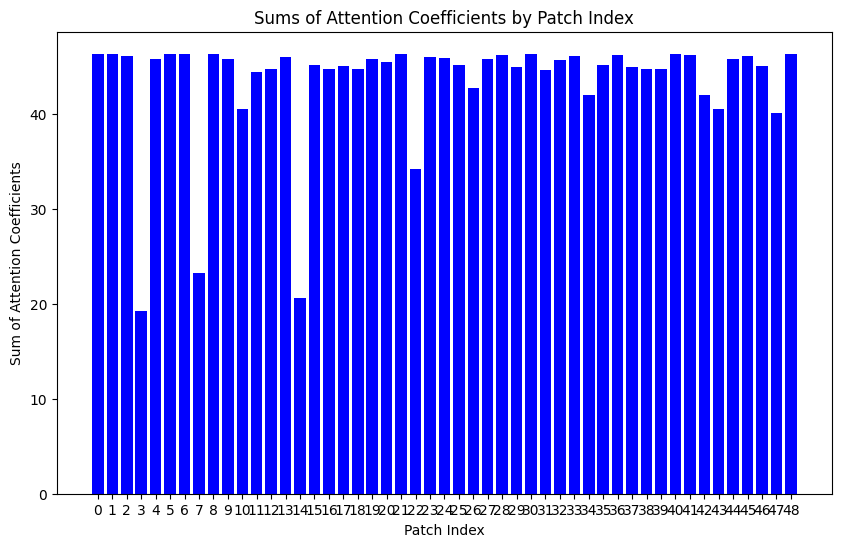

/tmp/ipykernel_196649/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2


Accuracy: 0.9937499761581421
Loss: 401.8460693359375


 40%|████      | 8/20 [1:39:43<2:34:06, 770.56s/it]

Complete 7 th
torch.Size([160, 49, 16])
Row sums: [46.409756 46.38206  46.16223  18.779709 45.757034 46.372013 46.4136
 23.075222 46.393665 45.835014 40.37946  44.58619  44.803688 46.06371
 20.659733 45.41492  44.67782  45.146515 44.85698  45.8482   45.358265
 46.359085 34.86886  46.071815 45.872467 45.122696 42.939213 45.8053
 46.331863 44.756054 46.34751  44.618248 45.74641  46.176613 42.316376
 45.10988  46.30366  44.860962 44.834812 44.79886  46.370567 46.333225
 41.77645  40.310783 45.897804 46.133045 45.071392 39.90018  46.40938 ]


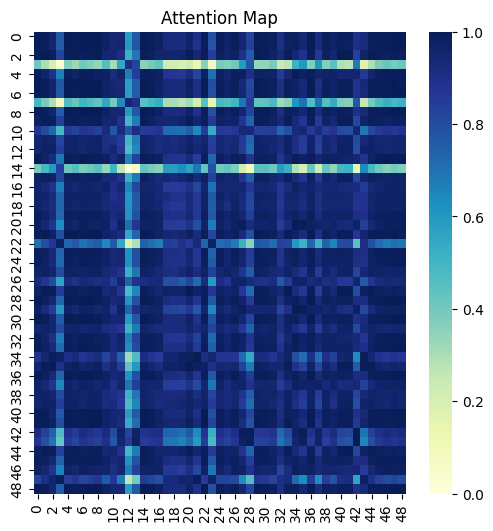

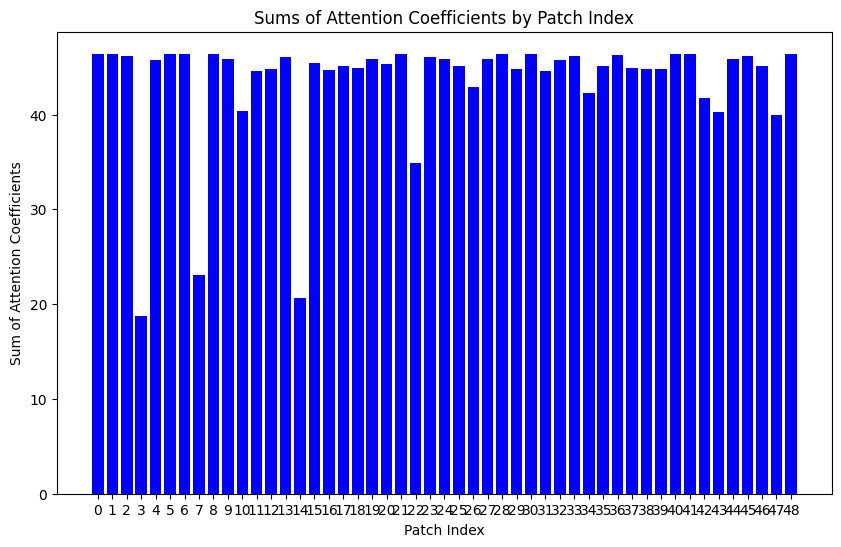

/tmp/ipykernel_196649/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2


Accuracy: 0.9937499761581421
Loss: 400.9771728515625


 45%|████▌     | 9/20 [1:52:44<2:21:54, 774.04s/it]

Complete 8 th
torch.Size([160, 49, 16])
Row sums: [46.4498   46.421745 46.184566 18.339518 45.685688 46.41214  46.45316
 22.798613 46.431606 45.846283 40.196136 44.6621   44.8466   46.09249
 20.55772  45.572765 44.612347 45.16592  44.89918  45.886906 45.237682
 46.41306  35.368946 46.080074 45.867992 45.07849  43.020374 45.801285
 46.38397  44.477844 46.385178 44.62575  45.761982 46.182816 42.44223
 45.07716  46.326164 44.722446 44.855434 44.836563 46.40679  46.390137
 41.557163 40.339657 45.996254 46.17756  45.027042 39.64848  46.44732 ]


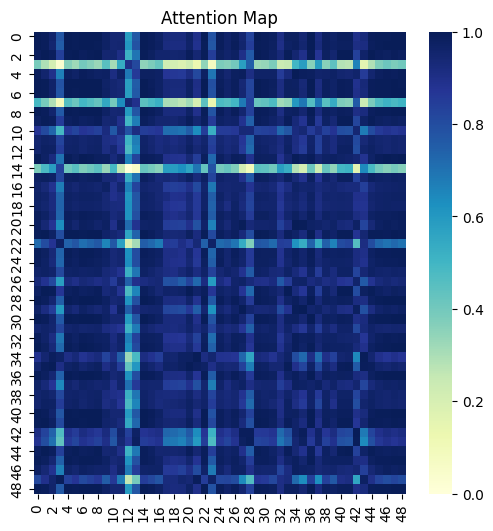

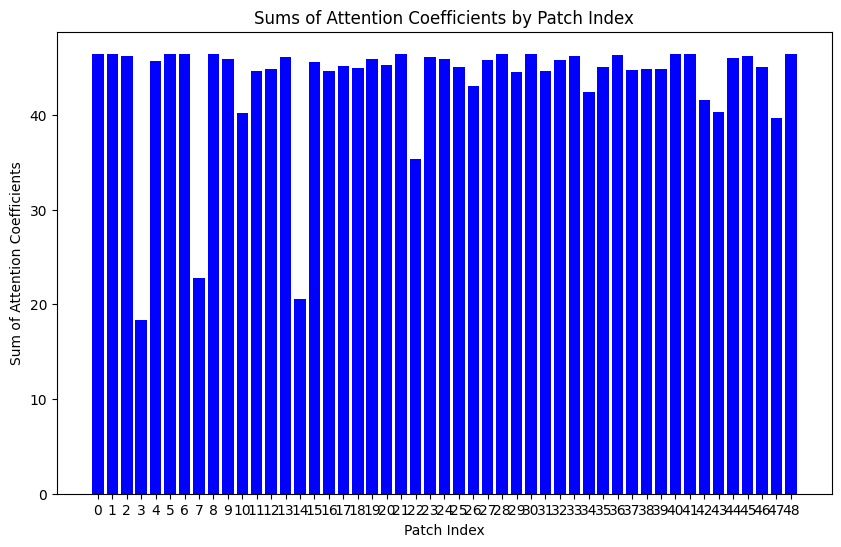

/tmp/ipykernel_196649/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2


Accuracy: 0.9937499761581421
Loss: 400.2658386230469


 50%|█████     | 10/20 [2:05:44<2:09:17, 775.75s/it]

Complete 9 th
torch.Size([160, 49, 16])
Row sums: [46.495262 46.466984 46.219776 17.928192 45.61584  46.457756 46.498447
 22.457312 46.475246 45.861794 40.031445 44.735916 44.882107 46.13307
 20.388025 45.706642 44.53484  45.191425 44.947037 45.934383 45.117115
 46.466843 35.633465 46.095562 45.86625  45.037334 43.016453 45.810585
 46.43843  44.17727  46.42865  44.643356 45.781136 46.19341  42.46962
 45.086956 46.356167 44.580532 44.875656 44.881756 46.449005 46.446495
 41.45447  40.49605  46.09076  46.22841  44.9814   39.370316 46.490974]


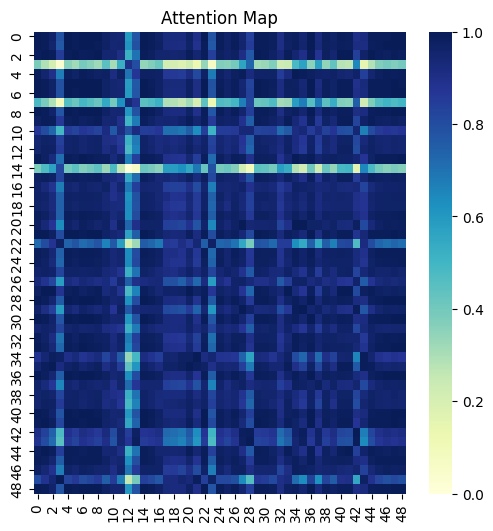

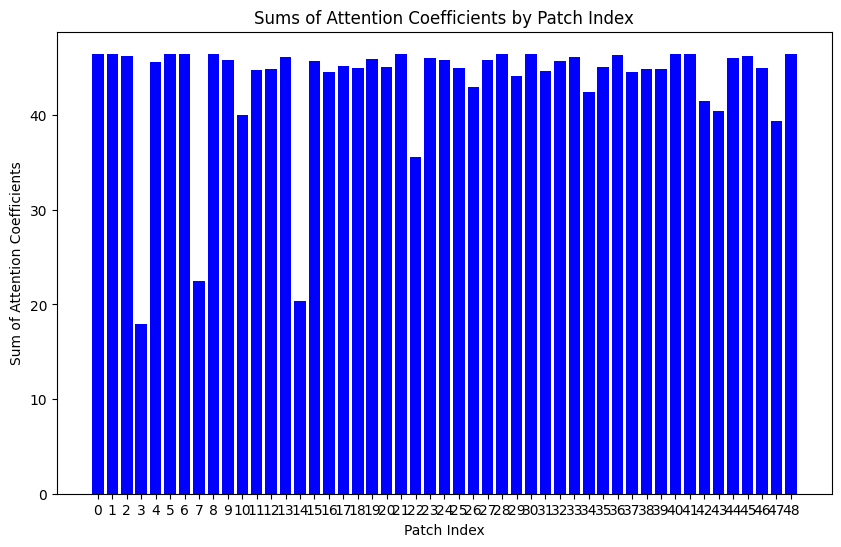

/tmp/ipykernel_196649/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2


Accuracy: 0.9937499761581421
Loss: 399.61614990234375


 55%|█████▌    | 11/20 [2:18:50<1:56:50, 778.95s/it]

Complete 10 th
torch.Size([160, 49, 16])
Row sums: [46.54277  46.514145 46.264847 17.536364 45.542015 46.505627 46.54604
 22.077906 46.521076 45.87941  39.87508  44.807262 44.91167  46.179695
 20.181122 45.82126  44.44527  45.2193   44.996956 45.98631  44.99004
 46.519672 35.731396 46.114864 45.86419  44.997257 42.95888  45.830963
 46.491898 43.844852 46.474396 44.667416 45.80112  46.20543  42.433037
 45.130657 46.390076 44.429607 44.894382 44.931    46.49399  46.501457
 41.43183  40.718548 46.180504 46.281525 44.929966 39.069496 46.536873]


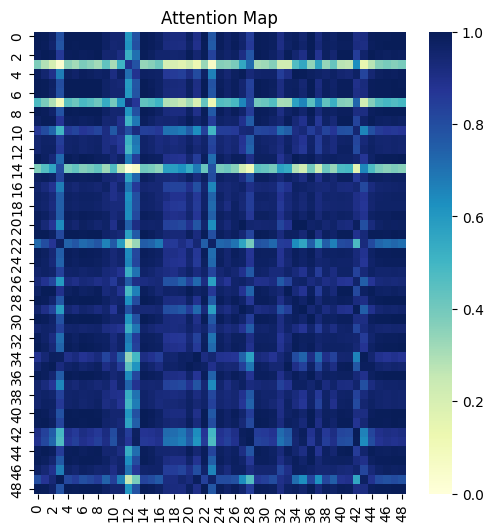

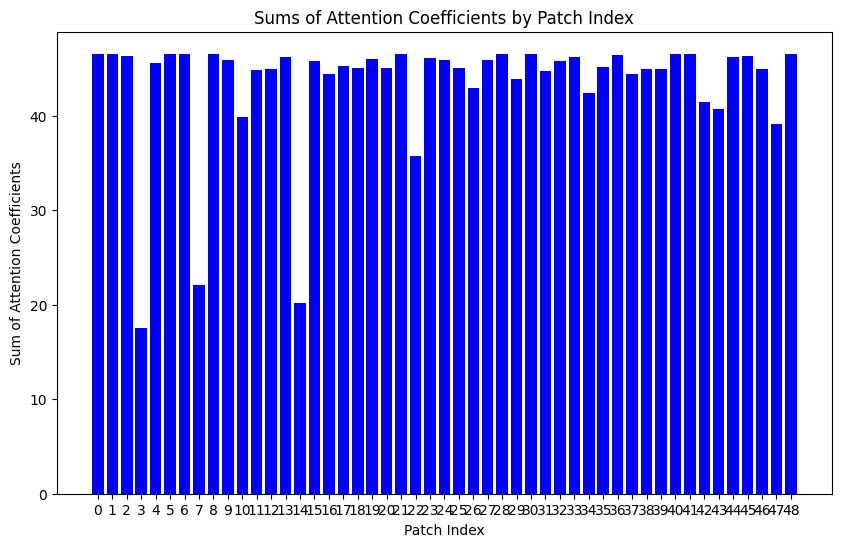

/tmp/ipykernel_196649/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2


Accuracy: 0.9937499761581421
Loss: 399.0497131347656


 60%|██████    | 12/20 [2:31:50<1:43:54, 779.31s/it]

Complete 11 th
torch.Size([160, 49, 16])
Row sums: [46.589462 46.560127 46.315052 17.154646 45.458923 46.553017 46.593018
 21.675385 46.566113 45.896282 39.715458 44.875866 44.93716  46.2246
 19.958649 45.921524 44.344124 45.246105 45.046165 46.038773 44.84715
 46.57039  35.744507 46.135292 45.858765 44.956345 42.872013 45.855293
 46.541714 43.47398  46.519413 44.69392  45.822147 46.21824  42.35803
 45.19255  46.42412  44.265118 44.91113  44.981354 46.538696 46.554047
 41.435284 40.96923  46.26506  46.333282 44.87612  38.741314 46.582005]


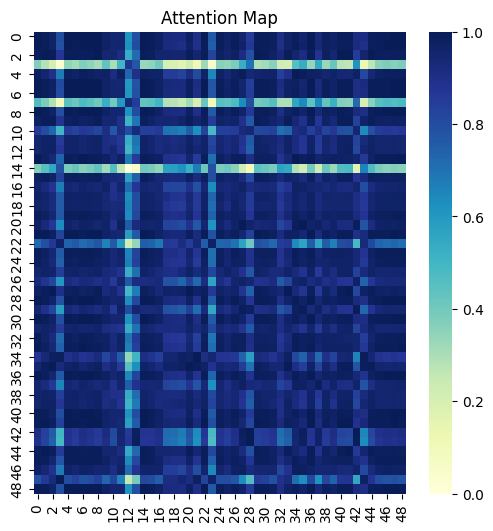

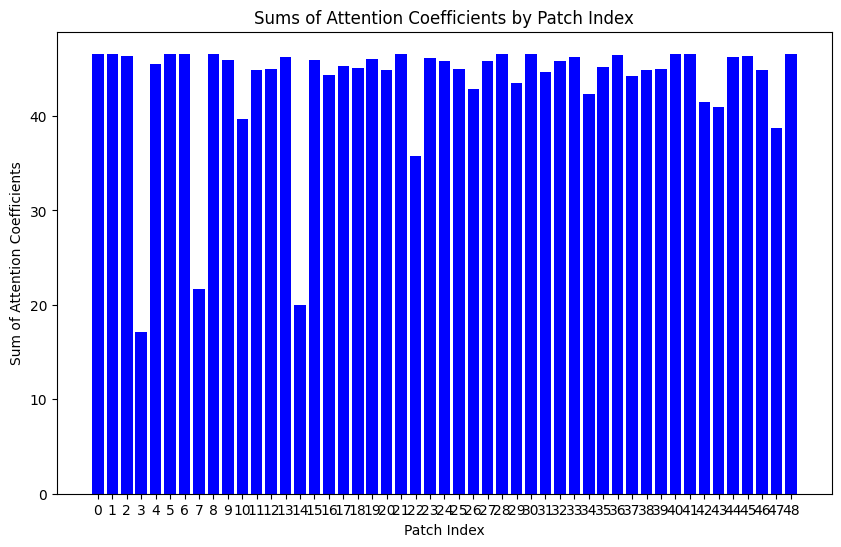

/tmp/ipykernel_196649/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2


Accuracy: 1.0
Loss: 398.603515625


 65%|██████▌   | 13/20 [2:44:50<1:30:55, 779.36s/it]

Complete 12 th
torch.Size([160, 49, 16])
Row sums: [46.63267  46.602245 46.364513 16.778442 45.36258  46.597267 46.636696
 21.26427  46.607586 45.908432 39.543514 44.940994 44.95967  46.260483
 19.735733 46.010376 44.233376 45.268803 45.092667 46.088432 44.680733
 46.617294 35.74379  46.154892 45.847412 44.912006 42.78191  45.874283
 46.585804 43.069763 46.560932 44.71835  45.845203 46.23396  42.265358
 45.255554 46.454712 44.085587 44.925266 45.02961  46.580143 46.60273
 41.412857 41.215427 46.343124 46.38062  44.832867 38.38128  46.623615]


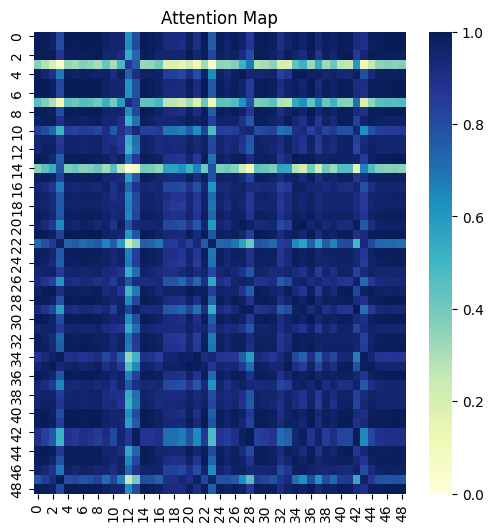

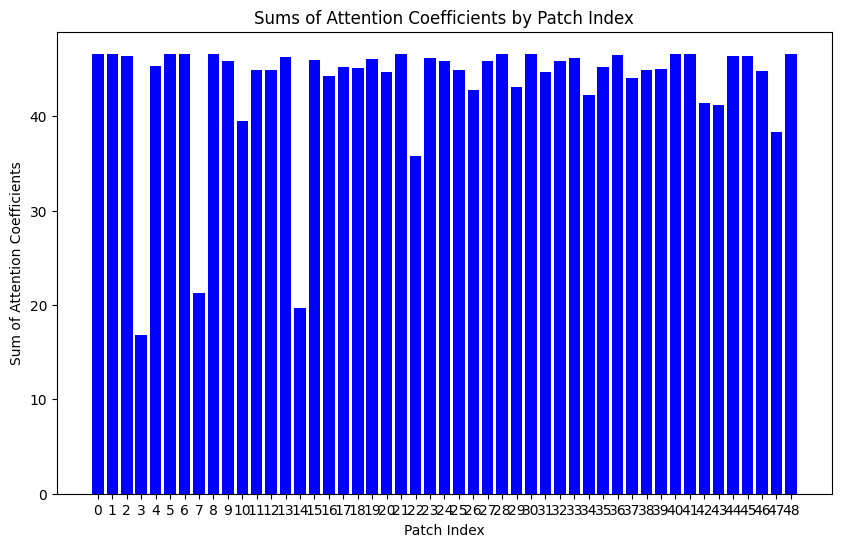

/tmp/ipykernel_196649/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2


Accuracy: 1.0
Loss: 398.2803649902344


 70%|███████   | 14/20 [2:57:51<1:17:59, 779.84s/it]

Complete 13 th
torch.Size([160, 49, 16])
Row sums: [46.670525 46.638596 46.40747  16.4094   45.251793 46.636314 46.675014
 20.86211  46.643547 45.911438 39.35426  45.001827 44.979645 46.282955
 19.521698 46.088882 44.117382 45.285423 45.135593 46.13318  44.487156
 46.65881  35.786465 46.17272  45.82912  44.86138  42.720013 45.87963
 46.623108 42.655056 46.597    44.7365   45.870186 46.25517  42.17467
 45.303715 46.479282 43.894554 44.93612  45.072712 46.616127 46.646076
 41.328182 41.427437 46.41299  46.421528 44.81695  37.987076 46.65974 ]


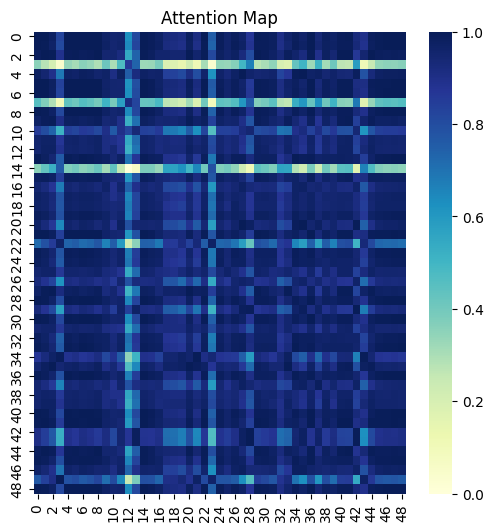

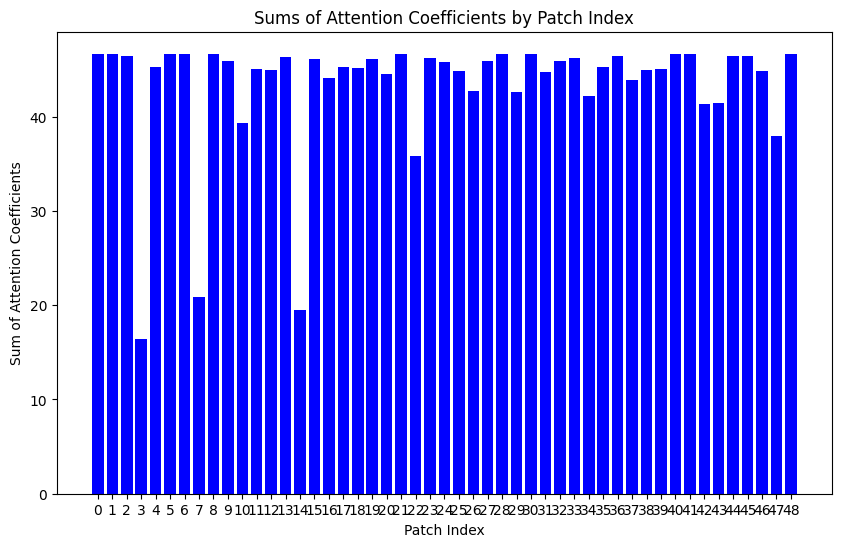

/tmp/ipykernel_196649/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2


Accuracy: 1.0
Loss: 398.0491027832031


 75%|███████▌  | 15/20 [3:10:42<1:04:47, 777.40s/it]

Complete 14 th
torch.Size([160, 49, 16])
Row sums: [46.701298 46.667645 46.43867  16.052692 45.12767  46.6682   46.70619
 20.486351 46.67226  45.900776 39.14578  45.05715  44.99647  46.29012
 19.321188 46.156292 44.00183  45.294506 45.174313 46.171333 44.265385
 46.693146 35.906193 46.187874 45.80391  44.801327 42.70816  45.86544
 46.652714 42.2662   46.625877 44.744595 45.895565 46.28079  42.10345
 45.324806 46.49583  43.6986   44.94249  45.107746 46.64473  46.68231
 41.173145 41.5827   46.47253  46.45444  44.83387  37.556866 46.68867 ]


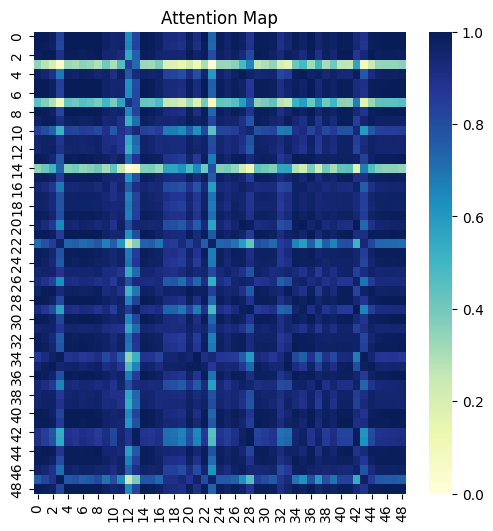

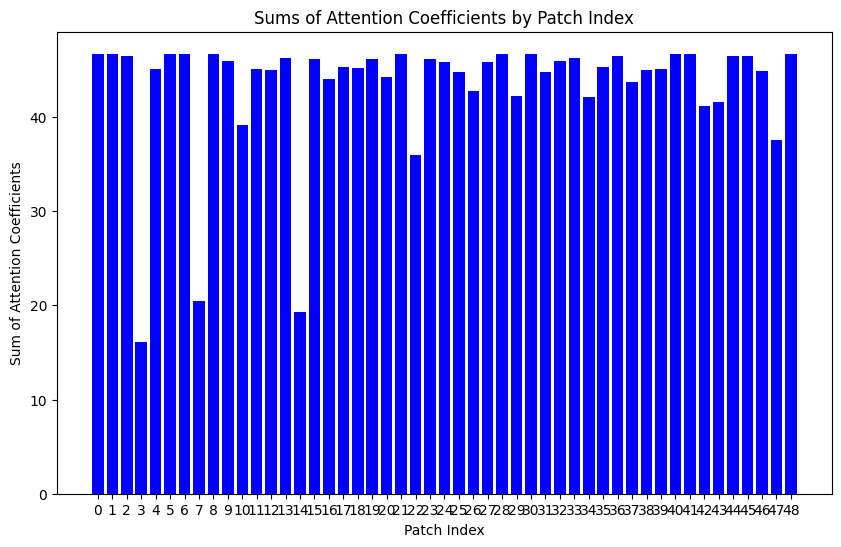

/tmp/ipykernel_196649/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2


Accuracy: 1.0
Loss: 397.8661804199219


 80%|████████  | 16/20 [3:23:42<51:52, 778.03s/it]  

Complete 15 th
torch.Size([160, 49, 16])
Row sums: [46.724033 46.688522 46.455173 15.71274  44.992664 46.69176  46.72918
 20.148058 46.69277  45.87335  38.917953 45.106224 45.009464 46.28165
 19.135962 46.21136  43.89242  45.295403 45.20846  46.201996 44.015686
 46.719124 36.109993 46.19965  45.772686 44.72988  42.74766  45.82887
 46.67431  41.93555  46.64658  44.740627 45.919674 46.307926 42.063183
 45.313465 46.50334  43.503906 44.943535 45.133137 46.66489  46.71029
 40.956352 41.672195 46.52043  46.47857  44.877293 37.0906   46.70944 ]


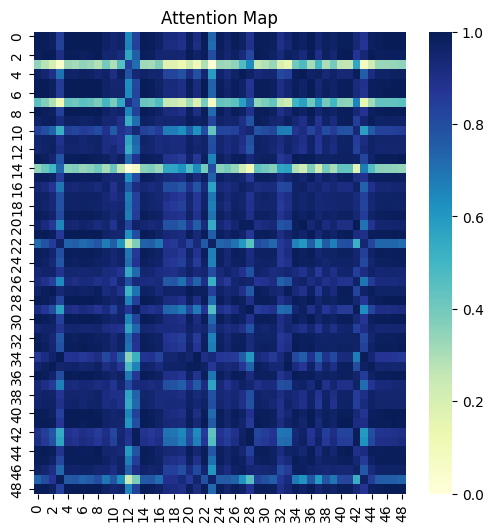

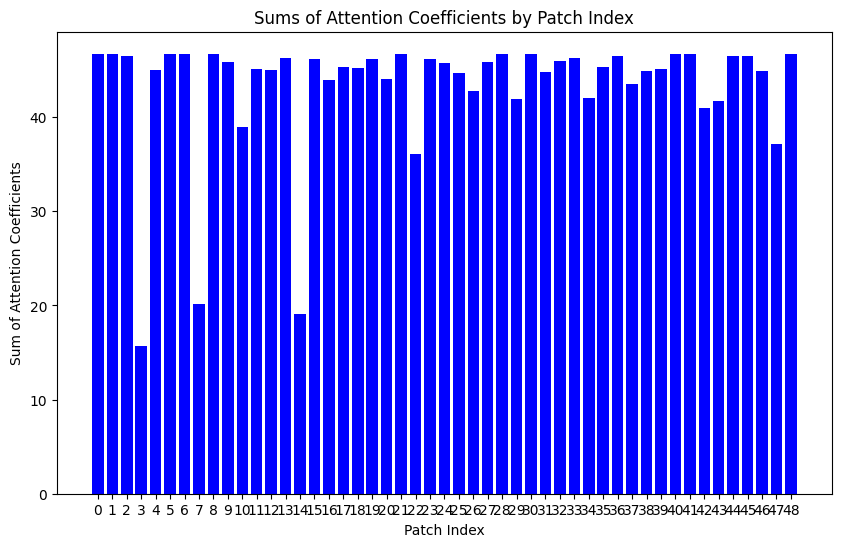

/tmp/ipykernel_196649/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2


Accuracy: 1.0
Loss: 397.698486328125


 85%|████████▌ | 17/20 [3:36:44<38:57, 779.24s/it]

Complete 16 th
torch.Size([160, 49, 16])
Row sums: [46.738987 46.70151  46.456825 15.39068  44.84963  46.707195 46.744205
 19.848091 46.70532  45.828392 38.671635 45.149433 45.018684 46.258255
 18.965366 46.25355  43.793762 45.288578 45.23826  46.225327 43.739025
 46.736828 36.38699  46.20797  45.73703  44.647156 42.82769  45.76988
 46.688328 41.673897 46.65931  44.72504  45.941704 46.334003 42.05634
 45.27063  46.501987 43.31325  44.939606 45.149216 46.67676  46.730064
 40.68881  41.700928 46.55698  46.494267 44.937817 36.591213 46.722282]


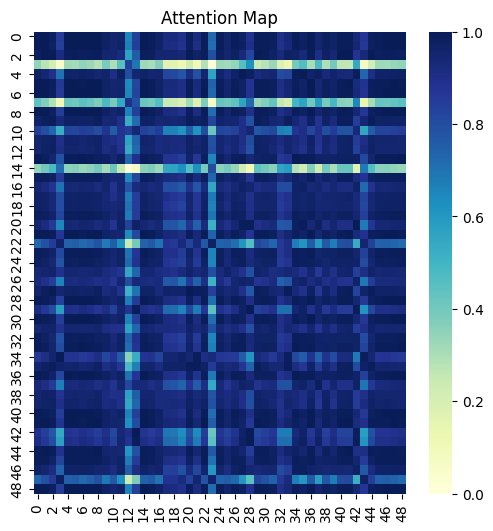

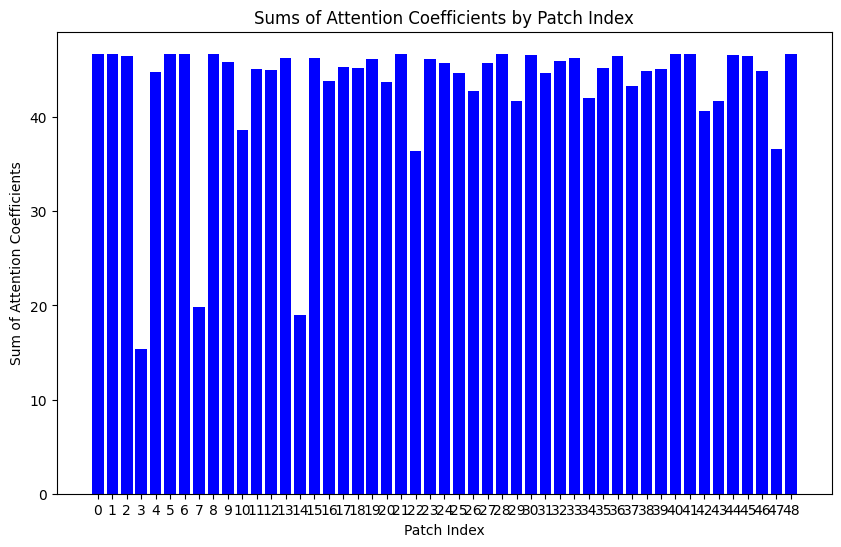

/tmp/ipykernel_196649/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2


Accuracy: 1.0
Loss: 397.5343933105469


 90%|█████████ | 18/20 [3:49:44<25:58, 779.47s/it]

Complete 17 th
torch.Size([160, 49, 16])
Row sums: [46.746117 46.70655  46.44441  15.084188 44.699093 46.714546 46.751286
 19.578077 46.709908 45.765945 38.407276 45.186794 45.023712 46.220116
 18.80606  46.281998 43.70716  45.274117 45.263092 46.241142 43.435356
 46.746162 36.716747 46.21207  45.69754  44.554077 42.93384  45.68922
 46.694565 41.467697 46.664043 44.698982 45.96042  46.35629  42.07597
 45.199936 46.491833 43.123737 44.930847 45.1565   46.680386 46.741554
 40.379143 41.681698 46.582428 46.50159  45.00576  36.063267 46.72717 ]


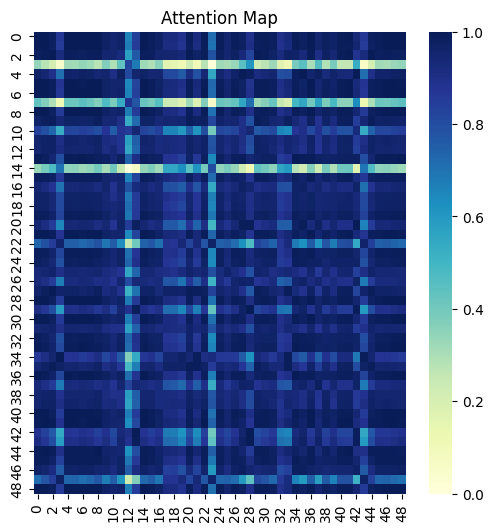

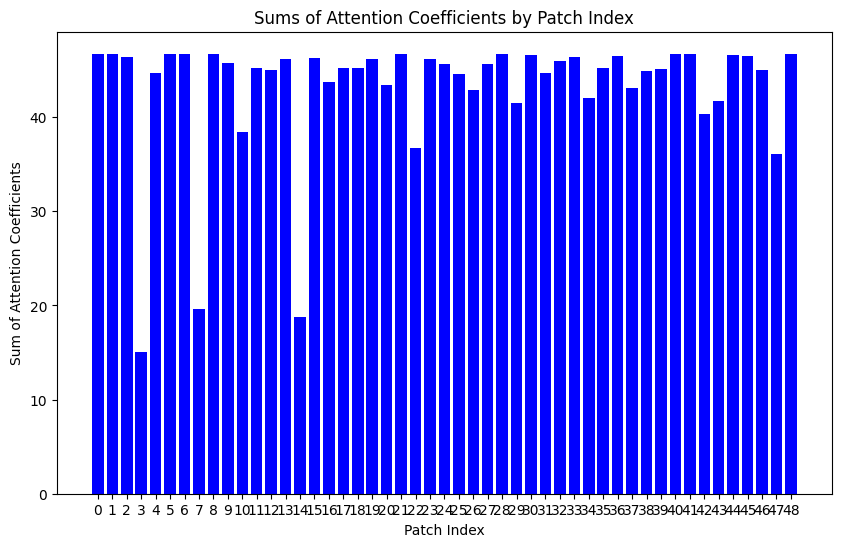

/tmp/ipykernel_196649/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2


Accuracy: 1.0
Loss: 397.3798828125


 95%|█████████▌| 19/20 [4:02:46<13:00, 780.22s/it]

Complete 18 th
torch.Size([160, 49, 16])
Row sums: [46.76183  46.720184 46.43818  15.007518 44.56941  46.730537 46.76679
 19.513887 46.723186 45.710045 38.19617  45.244286 45.051174 46.1875
 18.847466 46.315445 43.666935 45.277767 45.307575 46.268757 43.14376
 46.76356  37.151146 46.230766 45.677593 44.48325  43.09103  45.612545
 46.709255 41.3382   46.677727 44.693806 45.99574  46.39119  42.154877
 45.134083 46.491207 42.96872  44.945374 45.18218  46.69271  46.76119
 40.094204 41.680115 46.61459  46.518528 45.09958  35.600704 46.740654]


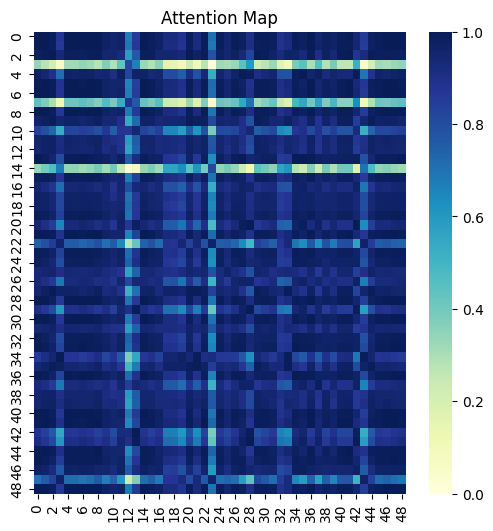

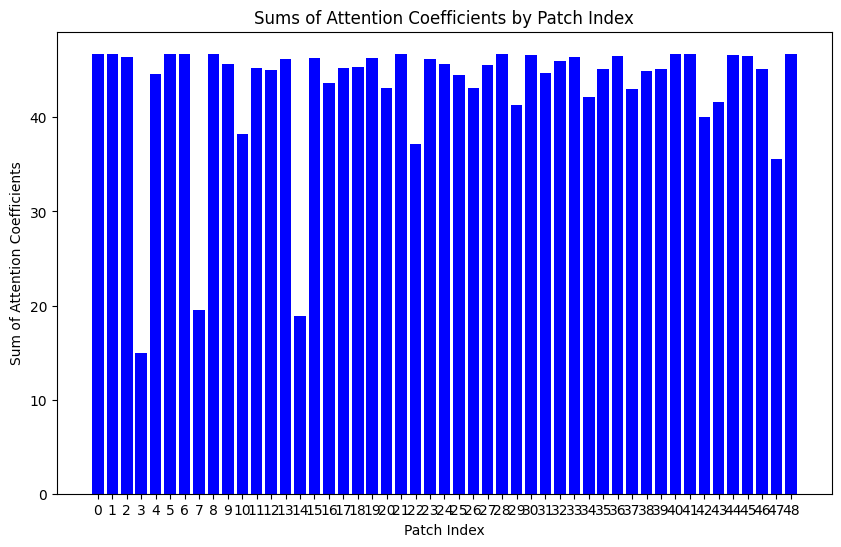

/tmp/ipykernel_196649/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2


Accuracy: 1.0
Loss: 397.2476806640625


100%|██████████| 20/20 [4:15:48<00:00, 767.44s/it]

Complete 19 th
Model parameters saved.


In [15]:
# Training the model
for iepoch in tqdm(range(20)):
    optimizer.zero_grad()
    X_tensor = torch.tensor(X_train)
    predictions = model(X_tensor.float()).squeeze(1)
    
    label = torch.tensor(y_train)
    for i in range(len(label)):
        label[i] = 0 if label[i] == 1 else 1
    
    loss = criterion(predictions, label.float())
    acc = binary_accuracy(predictions, label)
    print(f'Accuracy: {acc}')
    print(f'Loss: {loss}')
    
    loss.backward()
    optimizer.step()
    print(f"Complete {iepoch} th")

# Save the model parameters
torch.save(model.state_dict(), model_save_path)
print("Model parameters saved.")

torch.Size([40, 49, 16])
Row sums: [46.671963 46.62452  46.35031  14.994159 44.29585  46.525352 46.677254
 19.480827 46.483555 45.381214 40.03976  45.033894 44.378063 46.026802
 18.547903 46.273388 44.50675  45.904232 44.657814 46.46939  42.72284
 46.660465 37.549755 46.11014  45.507473 43.827557 43.175213 45.507553
 46.61327  41.04126  46.45252  44.55733  45.99167  46.338013 42.19052
 45.01647  46.379807 41.96057  45.181805 44.65477  46.623936 46.68282
 39.67063  41.34377  46.55313  46.409397 44.814682 35.19334  46.646294]


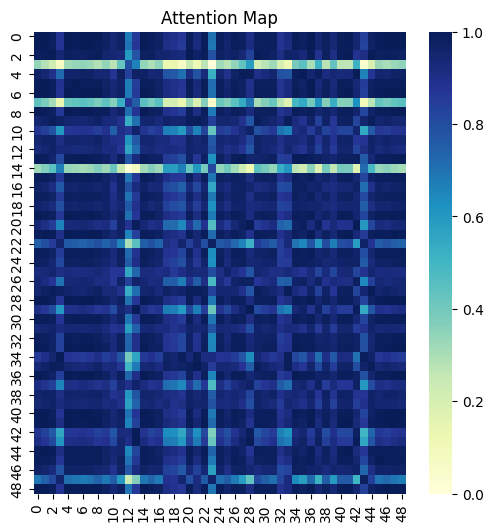

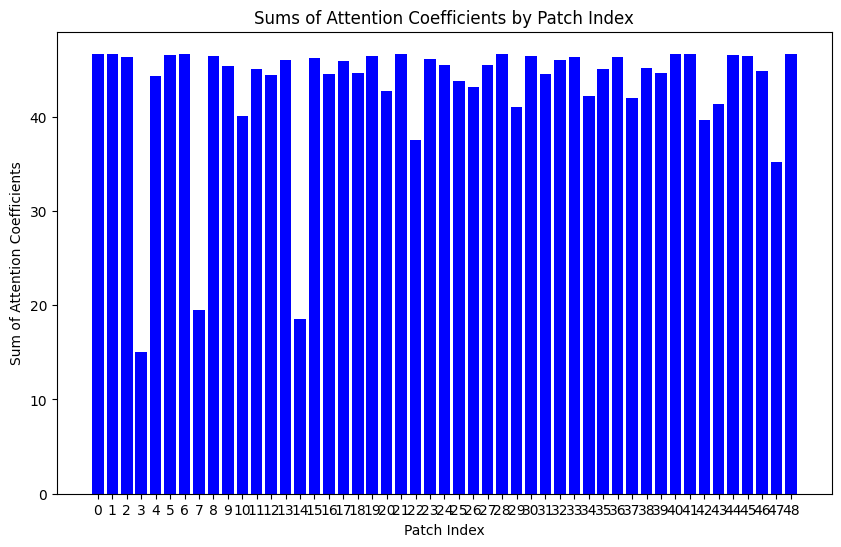


Accuracy: 0.9750000238418579

Loss: 48.26152801513672

AUROC: 1.0



/tmp/ipykernel_196649/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2


In [16]:
from sklearn.metrics import roc_auc_score

X_tensor=torch.tensor(X_test)
predictions=model(X_tensor.float()).squeeze(1)
label=torch.tensor(y_test)
for i in range(len(label)):
        if label[i]==1:
            label[i] = 0
        else:
            label[i]=1
loss = criterion(predictions, label.float())
acc = binary_accuracy(predictions, label.float())

# Calculate AUROC
preds_np = predictions.detach().numpy()  # Detach predictions from the graph and convert to numpy
labels_np = label.numpy()  # Convert labels to numpy
auroc = roc_auc_score(labels_np, preds_np)

# Print results
print(f'\nAccuracy: {acc}\n')
print(f'Loss: {loss}\n')
print(f'AUROC: {auroc}\n')

In [47]:
# # Now load the model and make predictions on a single data sample
# # Create a new instance of the model and load the saved parameters
# loaded_model = QSANN_text_classifier(4, 4, 2, 1, 1)
# loaded_model.load_state_dict(torch.load(model_save_path))
# loaded_model.eval()
# print("Model loaded and ready for inference.")


In [38]:
# Select a single sample from the test set
single_sample = torch.tensor(X_test[0:1].astype(np.float32))  # Select one sample


In [39]:
# # Make a prediction for the single sample
# with torch.no_grad():
#     prediction = loaded_model(single_sample).squeeze()
#     predicted_class = (torch.round(torch.sigmoid(prediction))).item()
#     print(f"Predicted class for the sample: {predicted_class}")


In [40]:
# Attention value extraction (after forward pass, assuming attention is part of the output)
class AttentionExtractor(QSANN_text_classifier):
    def __init__(self, S, n, Denc, D, num_layers):
        super().__init__(S, n, Denc, D, num_layers)
        self.attention_values = None

    def forward(self, input):
        x = self.Qnn(input)
        x = torch.flatten(x, start_dim=1)
        
        # Extract attention values from the QSAL layers (assuming alpha in the QSAL_pennylane)
        self.attention_values = self.Qnn.qsal_lst[0].alpha  # Example for first QSAL layer
        output = torch.sigmoid(self.final_layer(x))
        return output


In [41]:
# Create an instance of the new model with attention extraction
attention_model = AttentionExtractor(49, 4, 2, 1, 1)
attention_model.load_state_dict(torch.load(model_save_path))
attention_model.eval()

AttentionExtractor(
  (Qnn): QSANN_pennylane(
    (qnn): Sequential(
      (0): QSAL_pennylane()
    )
  )
  (final_layer): Linear(in_features=784, out_features=1, bias=True)
)

Row sums: [46.78166  46.76891  46.291275 17.311747 44.87765  46.761295 46.780827
 21.63526  46.7755   46.554516 25.552341 46.77963  46.645226 46.34468
 18.965261 43.297184 42.58579  46.76366  44.537052 46.777477 43.481144
 46.76317  36.51671  46.51286  46.6941   46.508427 43.668934 45.32527
 46.763752 41.88269  46.76903  43.26853  46.03838  46.656204 42.0177
 44.84481  46.626366 40.796425 46.78169  43.50399  46.76775  46.73869
 40.707417 42.235565 46.713108 46.50122  46.778038 35.09952  46.777256]


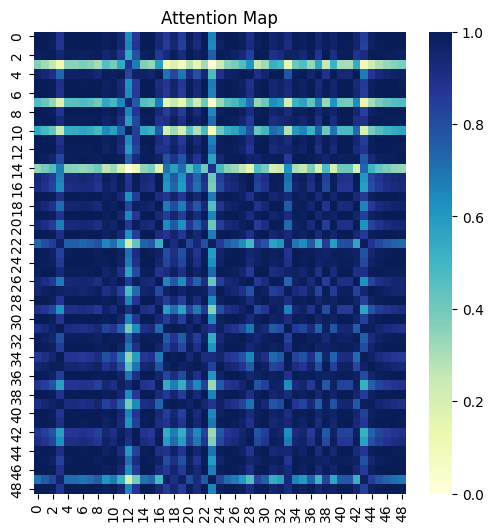

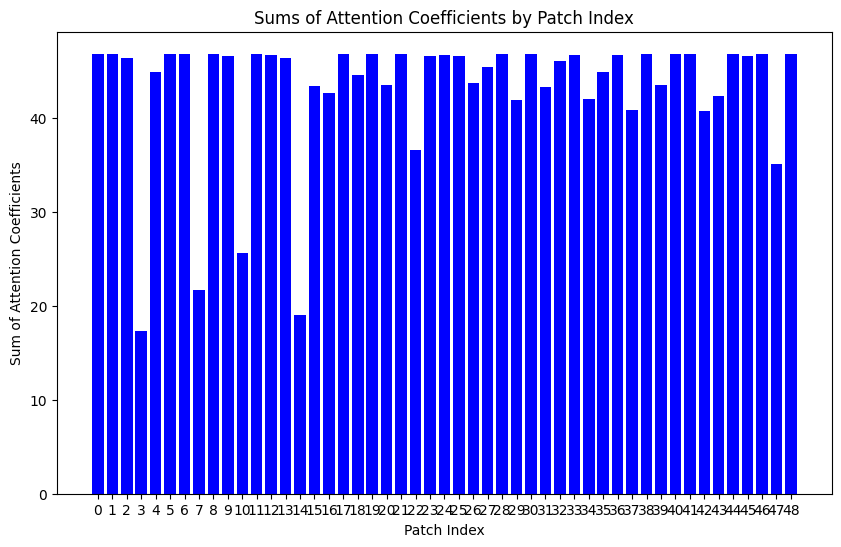

Predicted class for the sample: 1.0
Row sums: [46.78166  46.76891  46.291275 17.311747 44.87765  46.761295 46.780827
 21.63526  46.7755   46.554516 25.552341 46.77963  46.645226 46.34468
 18.965261 43.297184 42.58579  46.76366  44.537052 46.777477 43.481144
 46.76317  36.51671  46.51286  46.6941   46.508427 43.668934 45.32527
 46.763752 41.88269  46.76903  43.26853  46.03838  46.656204 42.0177
 44.84481  46.626366 40.796425 46.78169  43.50399  46.76775  46.73869
 40.707417 42.235565 46.713108 46.50122  46.778038 35.09952  46.777256]


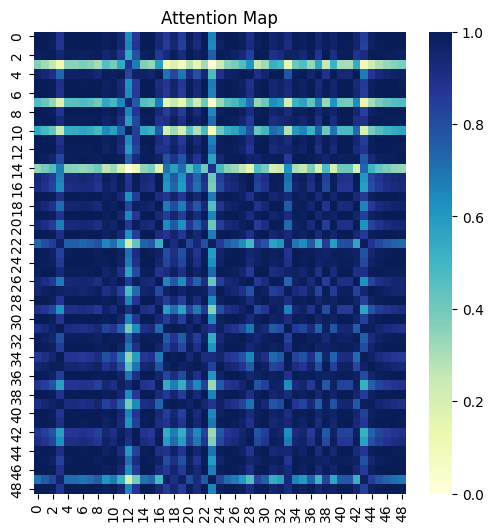

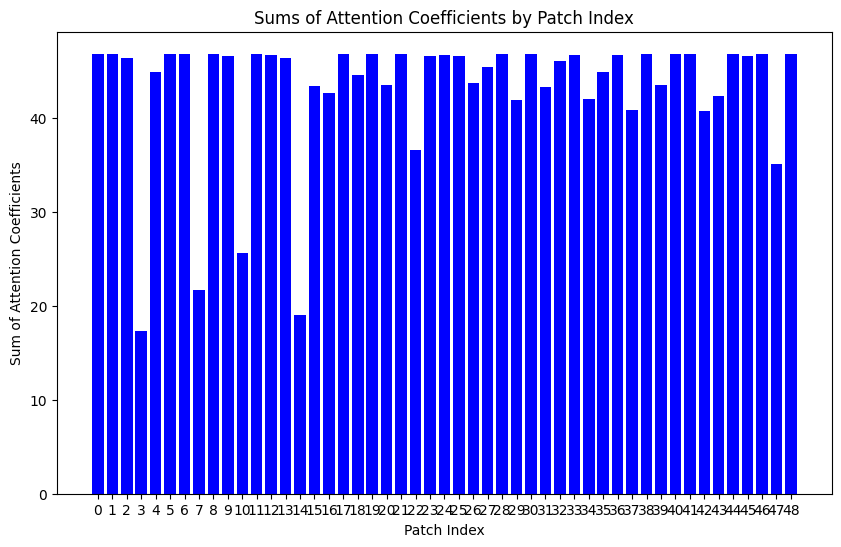

Extracted attention values: tensor([[[0.9986, 0.9994, 0.9890,  ..., 1.0000, 0.9992, 0.9977],
         [0.9996, 0.9982, 0.9850,  ..., 0.9994, 0.9999, 0.9991],
         [0.9809, 0.9942, 1.0000,  ..., 0.9911, 0.9834, 0.9780],
         ...,
         [0.9979, 0.9997, 0.9905,  ..., 1.0000, 0.9987, 0.9969],
         [0.7253, 0.7756, 0.8358,  ..., 0.7613, 0.7330, 0.7168],
         [0.9993, 0.9987, 0.9866,  ..., 0.9997, 0.9997, 0.9986]]])


In [73]:
# Make a prediction for the single sample
# Get the attention values for a single sample
with torch.no_grad():
    prediction = attention_model(single_sample).squeeze()
    predicted_class = (torch.round(prediction)).item()
    print(f"Predicted class for the sample: {predicted_class}")

    _ = attention_model(single_sample)  # Forward pass to calculate attention
    attention_values = attention_model.attention_values  # Extracted attention values
    print(f"Extracted attention values: {attention_values}")

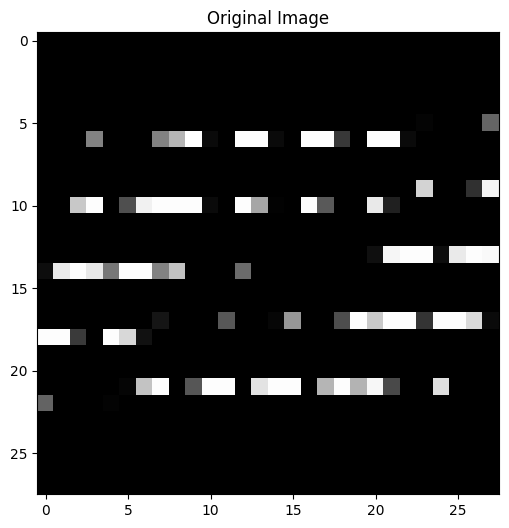

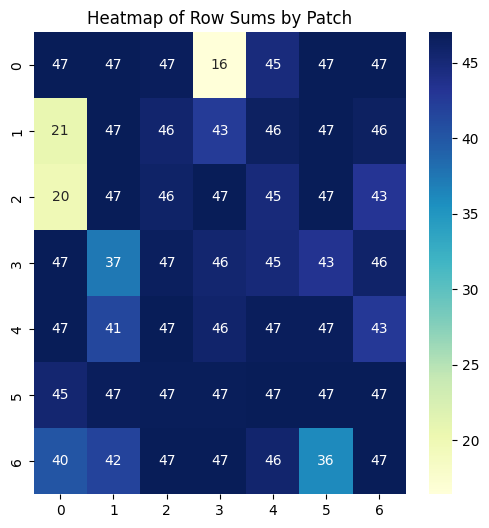

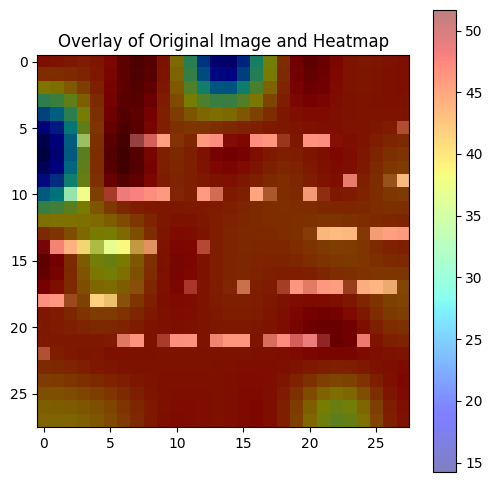

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import torch

def visualize_sample_and_heatmap(sample, row_sums, patch_shape=(7, 7)):
    """
    sample: The original image (2D numpy array)
    row_sums: The sums corresponding to each patch
    patch_shape: Shape of the patch grid (e.g., (2, 2))
    """
    # 1. Plot the original sample image
    plt.figure(figsize=(6, 6))
    plt.imshow(sample, cmap='gray', interpolation='none')
    plt.title("Original Image")
    plt.show()

    # 2. Create the heatmap using the row sums
    heatmap_values = np.array(row_sums).reshape(patch_shape)

    plt.figure(figsize=(6, 6))
    sns.heatmap(heatmap_values, annot=True, cmap="YlGnBu", cbar=True)
    plt.title("Heatmap of Row Sums by Patch")
    plt.show()

    # 3. Resize the heatmap to match the sample size
    from scipy.ndimage import zoom
    resized_heatmap = zoom(heatmap_values, (sample.shape[0] / patch_shape[0], sample.shape[1] / patch_shape[1]))

    # Overlay the heatmap on the original image
    plt.figure(figsize=(6, 6))
    plt.imshow(sample, cmap='gray', interpolation='none')
    plt.imshow(resized_heatmap, cmap='jet', alpha=0.5, interpolation='none')
    plt.colorbar()
    plt.title("Overlay of Original Image and Heatmap")
    plt.show()

# Example usage
# Select a single sample from the test set
single_sample = torch.tensor(X_test[0:1].astype(np.float32))  # Select one sample

# Reshape the single sample back to its 2D form for visualization (assuming it's 8x8 based on CIFAR-10 patching)
original_image = single_sample.squeeze().reshape(28, 28).numpy()  # Reshape to 2D

# Example row sums based on output
row_sums =[46.99568,  46.945675, 46.708828, 16.399942, 44.654503, 47.016266, 47.001553,
 20.689674, 46.96286,  45.65099,  42.526474, 46.389076, 46.96769,  46.349625,
 19.767338, 47.015923, 45.969364, 46.906597, 44.789043, 46.96905,  43.122356,
 47.016113, 37.42488,  46.56294,  45.508087, 44.928642, 43.326183, 45.87838,
 46.93409,  41.405605, 46.98992,  45.731926, 46.719006, 46.757965, 42.786407,
 45.443813, 46.71562,  46.808575, 46.840958, 47.016327, 46.94298,  47.013058,
 40.158867, 41.78221,  47.003757, 46.961964, 45.659706, 36.02321,  46.968307]


# Visualize the sample and the heatmap
visualize_sample_and_heatmap(original_image, row_sums, patch_shape=(7, 7))


Row sums: [46.867233 46.817974 46.580578 16.462336 44.548122 46.887268 46.87299
 20.73679  46.834915 45.529034 43.541626 45.171738 46.8384   46.22815
 19.782854 46.886955 45.851425 46.779488 44.949112 46.841022 43.02877
 46.88713  37.355137 46.439392 46.886948 41.10578  43.230934 45.754997
 46.806538 41.325787 46.85933  46.577248 46.593872 46.63242  42.683
 45.323174 46.59052  45.581043 46.692917 46.887302 46.81531  46.883896
 40.088726 41.699417 46.8745   46.834038 45.544563 35.961796 46.840294]


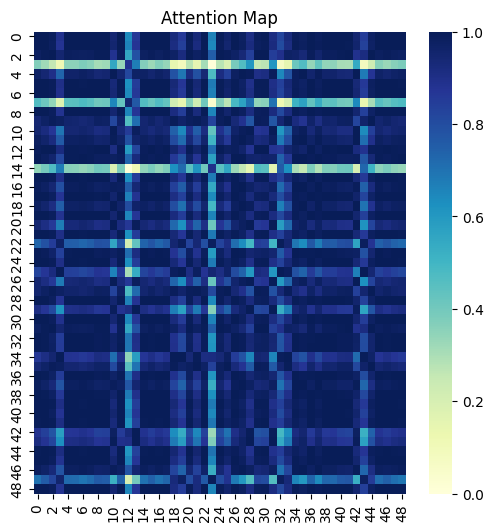

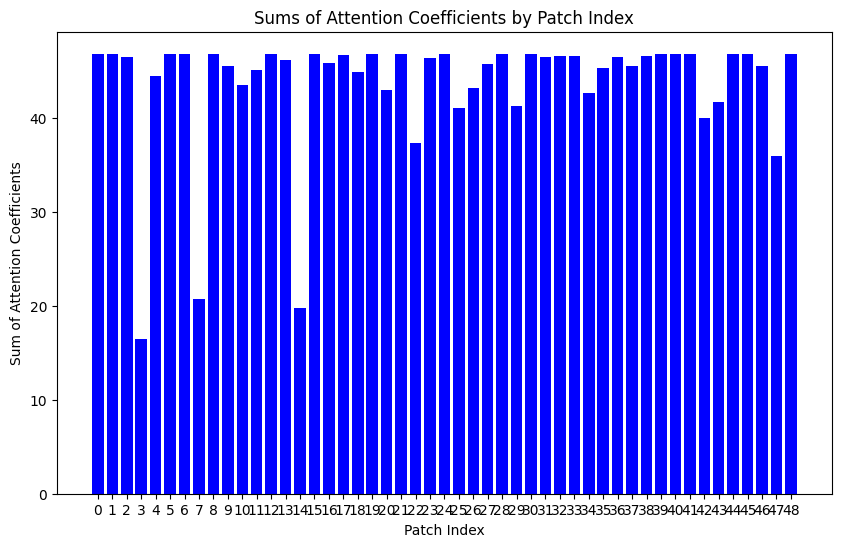

Predicted class for the sample: 1.0
Row sums: [46.867233 46.817974 46.580578 16.462336 44.548122 46.887268 46.87299
 20.73679  46.834915 45.529034 43.541626 45.171738 46.8384   46.22815
 19.782854 46.886955 45.851425 46.779488 44.949112 46.841022 43.02877
 46.88713  37.355137 46.439392 46.886948 41.10578  43.230934 45.754997
 46.806538 41.325787 46.85933  46.577248 46.593872 46.63242  42.683
 45.323174 46.59052  45.581043 46.692917 46.887302 46.81531  46.883896
 40.088726 41.699417 46.8745   46.834038 45.544563 35.961796 46.840294]


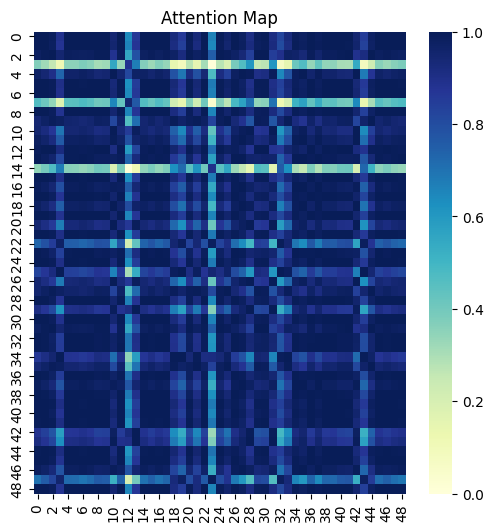

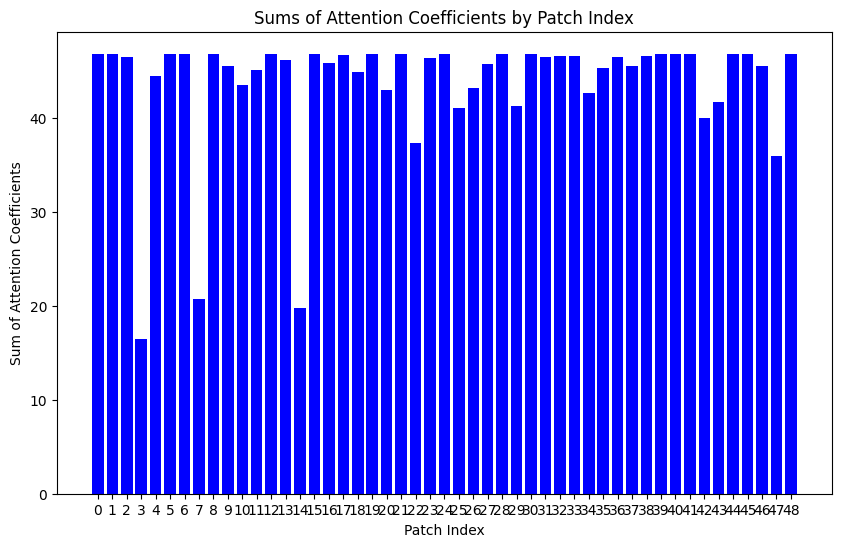

Extracted attention values: tensor([[[0.9986, 0.9994, 0.9890,  ..., 0.9999, 0.9992, 0.9977],
         [0.9996, 0.9982, 0.9850,  ..., 0.9992, 0.9999, 0.9991],
         [0.9809, 0.9942, 1.0000,  ..., 0.9919, 0.9834, 0.9780],
         ...,
         [0.9878, 0.9704, 0.9376,  ..., 0.9750, 0.9857, 0.9900],
         [0.7253, 0.7756, 0.8358,  ..., 0.7645, 0.7330, 0.7168],
         [0.9993, 0.9987, 0.9866,  ..., 0.9995, 0.9997, 0.9986]]])


In [47]:
# Select a single sample from the test set
single_sample = torch.tensor(X_test[1:2].astype(np.float32))  # Select one sample

# Make a prediction for the single sample
# Get the attention values for a single sample
with torch.no_grad():
    prediction = attention_model(single_sample).squeeze()
    predicted_class = (torch.round(torch.sigmoid(prediction))).item()
    print(f"Predicted class for the sample: {predicted_class}")

    _ = attention_model(single_sample)  # Forward pass to calculate attention
    attention_values = attention_model.attention_values  # Extracted attention values
    print(f"Extracted attention values: {attention_values}")

-----------------------------------------

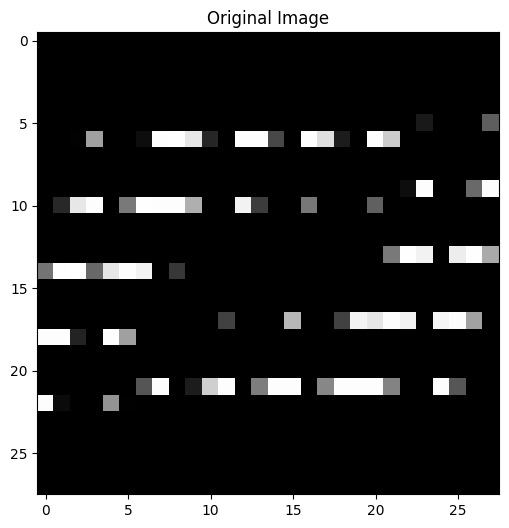

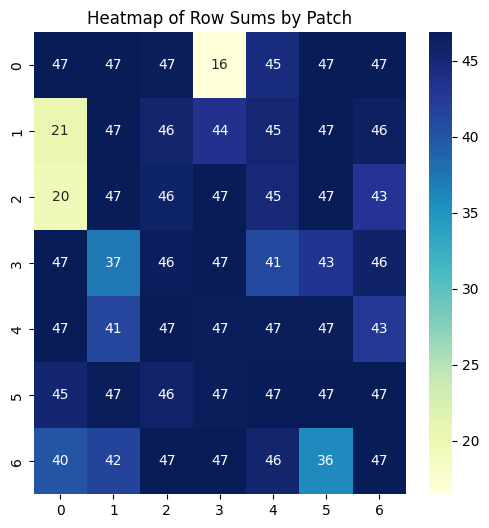

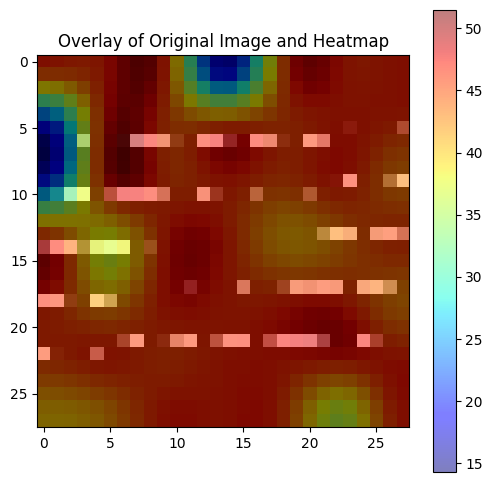

In [48]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import torch

def visualize_sample_and_heatmap(sample, row_sums, patch_shape=(7, 7)):
    """
    sample: The original image (2D numpy array)
    row_sums: The sums corresponding to each patch
    patch_shape: Shape of the patch grid (e.g., (2, 2))
    """
    # 1. Plot the original sample image
    plt.figure(figsize=(6, 6))
    plt.imshow(sample, cmap='gray', interpolation='none')
    plt.title("Original Image")
    plt.show()

    # 2. Create the heatmap using the row sums
    heatmap_values = np.array(row_sums).reshape(patch_shape)

    plt.figure(figsize=(6, 6))
    sns.heatmap(heatmap_values, annot=True, cmap="YlGnBu", cbar=True)
    plt.title("Heatmap of Row Sums by Patch")
    plt.show()

    # 3. Resize the heatmap to match the sample size
    from scipy.ndimage import zoom
    resized_heatmap = zoom(heatmap_values, (sample.shape[0] / patch_shape[0], sample.shape[1] / patch_shape[1]))

    # Overlay the heatmap on the original image
    plt.figure(figsize=(6, 6))
    plt.imshow(sample, cmap='gray', interpolation='none')
    plt.imshow(resized_heatmap, cmap='jet', alpha=0.5, interpolation='none')
    plt.colorbar()
    plt.title("Overlay of Original Image and Heatmap")
    plt.show()

# Example usage
# Select a single sample from the test set
single_sample = torch.tensor(X_test[1:2].astype(np.float32))  # Select one sample

# Reshape the single sample back to its 2D form for visualization (assuming it's 8x8 based on CIFAR-10 patching)
original_image = single_sample.squeeze().reshape(28, 28).numpy()  # Reshape to 2D

# Example row sums based on output
row_sums =[46.867233, 46.817974, 46.580578, 16.462336, 44.548122, 46.887268, 46.87299, 
           20.73679, 46.834915, 45.529034, 43.541626, 45.171738, 46.8384, 46.22815, 
           19.782854, 46.886955, 45.851425, 46.779488, 44.949112, 46.841022, 43.02877, 
           46.88713, 37.355137, 46.439392, 46.886948, 41.10578, 43.230934, 45.754997, 
           46.806538, 41.325787, 46.85933, 46.577248, 46.593872, 46.63242, 42.683, 
           45.323174, 46.59052, 45.581043, 46.692917, 46.887302, 46.81531, 46.883896, 
           40.088726, 41.699417, 46.8745, 46.834038, 45.544563, 35.961796, 46.840294]


# Visualize the sample and the heatmap
visualize_sample_and_heatmap(original_image, row_sums, patch_shape=(7, 7))


Row sums: [46.694305 46.65163  46.373016 16.534037 44.45794  46.70719  46.698887
 20.819025 46.666695 45.380383 46.4604   42.062725 46.64675  46.09326
 19.461601 46.70753  46.682045 44.410103 45.011627 46.67205  42.966927
 46.707413 37.066326 46.23165  46.282097 42.78593  43.16566  45.52548
 46.641342 41.289845 46.67494  37.299587 43.061783 46.47959  42.41937
 45.08637  46.439976 40.27127  42.442505 46.707325 46.649246 46.700466
 40.06902  41.658188 46.688282 46.66592  45.430866 35.66883  46.671413]


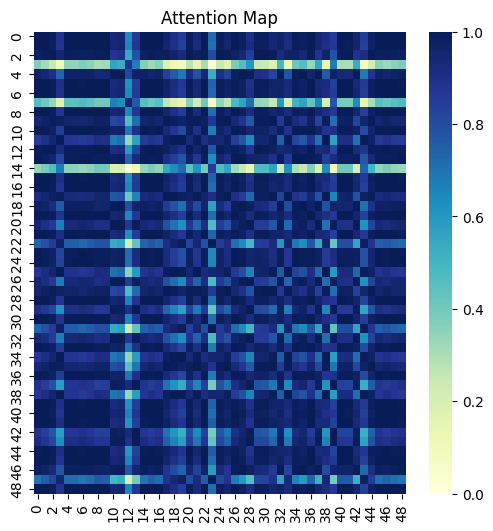

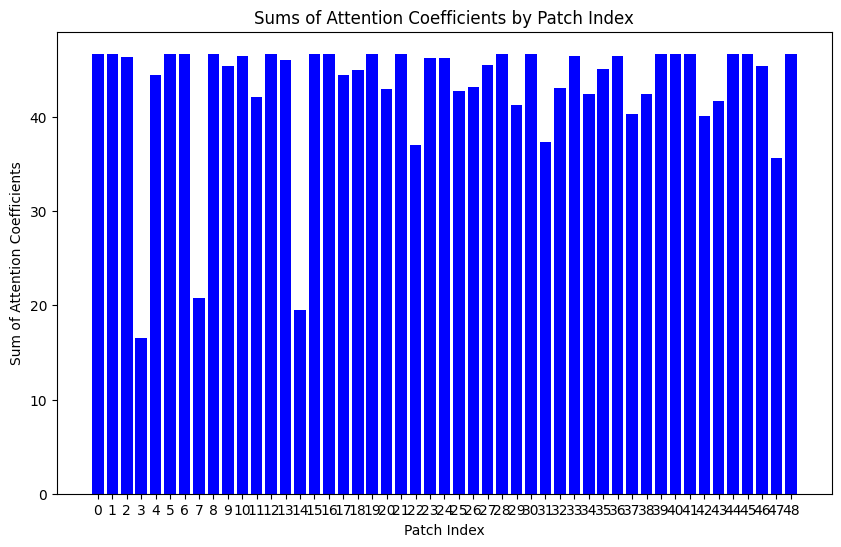

Predicted class for the sample: 1.0
Row sums: [46.694305 46.65163  46.373016 16.534037 44.45794  46.70719  46.698887
 20.819025 46.666695 45.380383 46.4604   42.062725 46.64675  46.09326
 19.461601 46.70753  46.682045 44.410103 45.011627 46.67205  42.966927
 46.707413 37.066326 46.23165  46.282097 42.78593  43.16566  45.52548
 46.641342 41.289845 46.67494  37.299587 43.061783 46.47959  42.41937
 45.08637  46.439976 40.27127  42.442505 46.707325 46.649246 46.700466
 40.06902  41.658188 46.688282 46.66592  45.430866 35.66883  46.671413]


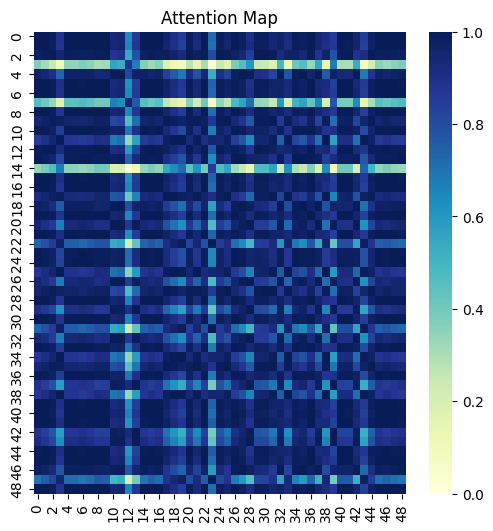

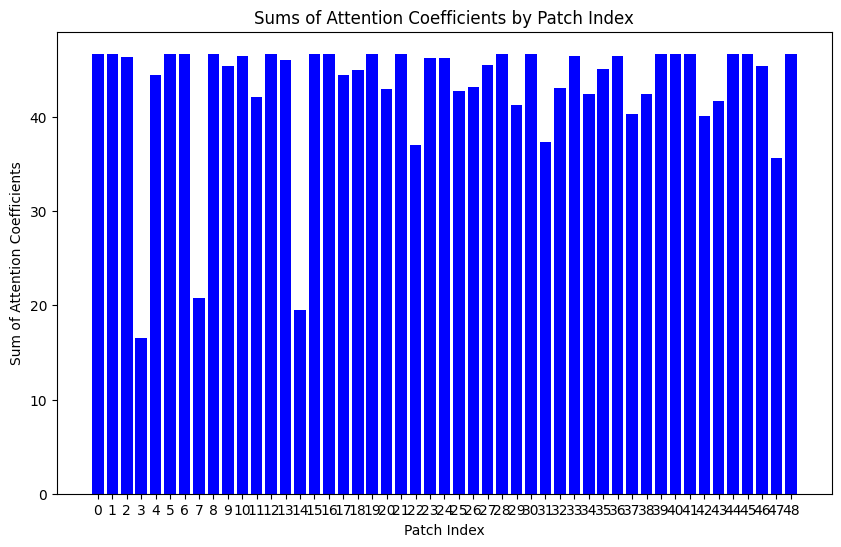

Extracted attention values: tensor([[[0.9986, 0.9994, 0.9890,  ..., 0.9999, 0.9992, 0.9977],
         [0.9996, 0.9982, 0.9850,  ..., 0.9992, 0.9999, 0.9991],
         [0.9809, 0.9942, 1.0000,  ..., 0.9919, 0.9834, 0.9780],
         ...,
         [0.9878, 0.9704, 0.9376,  ..., 0.9750, 0.9857, 0.9900],
         [0.7253, 0.7756, 0.8358,  ..., 0.7645, 0.7330, 0.7168],
         [0.9993, 0.9987, 0.9866,  ..., 0.9995, 0.9997, 0.9986]]])


In [57]:
# Select a single sample from the test set
single_sample = torch.tensor(X_test[20:21].astype(np.float32))  # Select one sample

# Make a prediction for the single sample
# Get the attention values for a single sample
with torch.no_grad():
    prediction = attention_model(single_sample).squeeze()
    predicted_class = (torch.round(torch.sigmoid(prediction))).item()
    print(f"Predicted class for the sample: {predicted_class}")

    _ = attention_model(single_sample)  # Forward pass to calculate attention
    attention_values = attention_model.attention_values  # Extracted attention values
    print(f"Extracted attention values: {attention_values}")

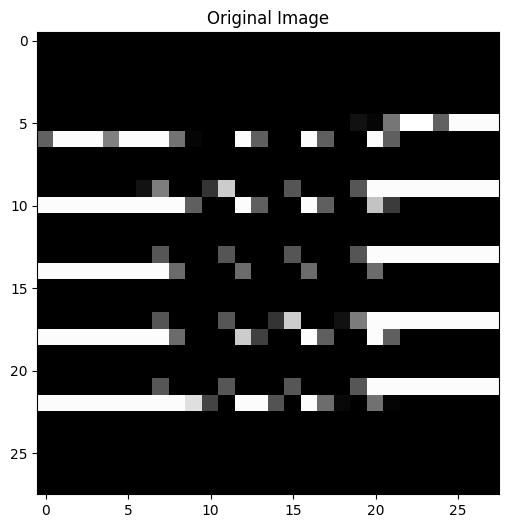

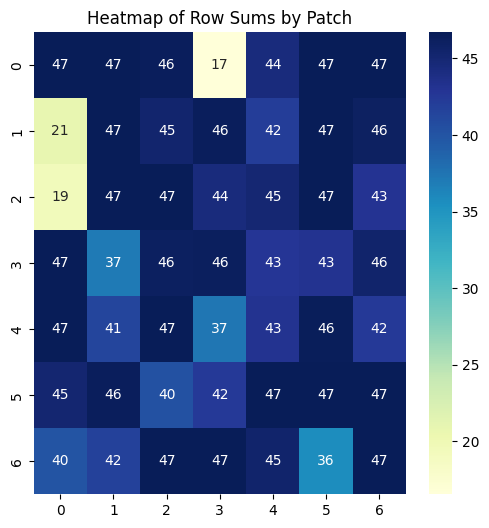

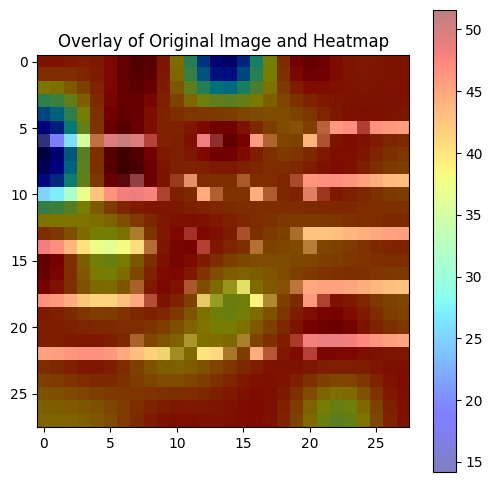

In [59]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import torch

def visualize_sample_and_heatmap(sample, row_sums, patch_shape=(7, 7)):
    """
    sample: The original image (2D numpy array)
    row_sums: The sums corresponding to each patch
    patch_shape: Shape of the patch grid (e.g., (2, 2))
    """
    # 1. Plot the original sample image
    plt.figure(figsize=(6, 6))
    plt.imshow(sample, cmap='gray', interpolation='none')
    plt.title("Original Image")
    plt.show()

    # 2. Create the heatmap using the row sums
    heatmap_values = np.array(row_sums).reshape(patch_shape)

    plt.figure(figsize=(6, 6))
    sns.heatmap(heatmap_values, annot=True, cmap="YlGnBu", cbar=True)
    plt.title("Heatmap of Row Sums by Patch")
    plt.show()

    # 3. Resize the heatmap to match the sample size
    from scipy.ndimage import zoom
    resized_heatmap = zoom(heatmap_values, (sample.shape[0] / patch_shape[0], sample.shape[1] / patch_shape[1]))

    # Overlay the heatmap on the original image
    plt.figure(figsize=(6, 6))
    plt.imshow(sample, cmap='gray', interpolation='none')
    plt.imshow(resized_heatmap, cmap='jet', alpha=0.5, interpolation='none')
    plt.colorbar()
    plt.title("Overlay of Original Image and Heatmap")
    plt.show()

# Example usage
# Select a single sample from the test set
single_sample = torch.tensor(X_test[20:21].astype(np.float32))  # Select one sample

# Reshape the single sample back to its 2D form for visualization (assuming it's 8x8 based on CIFAR-10 patching)
original_image = single_sample.squeeze().reshape(28, 28).numpy()  # Reshape to 2D

# Example row sums based on output
row_sums =[46.694305, 46.65163, 46.373016, 16.534037, 44.45794, 46.70719, 46.698887, 20.819025, 46.666695, 45.380383, 46.4604, 42.062725, 46.64675, 46.09326, 19.461601, 46.70753, 46.682045, 44.410103, 45.011627, 46.67205, 42.966927, 46.707413, 37.066326, 46.23165, 46.282097, 42.78593, 43.16566, 45.52548, 46.641342, 41.289845, 46.67494, 37.299587, 43.061783, 46.47959, 42.41937, 45.08637, 46.439976, 40.27127, 42.442505, 46.707325, 46.649246, 46.700466, 40.06902, 41.658188, 46.688282, 46.66592, 45.430866, 35.66883, 46.671413]



# Visualize the sample and the heatmap
visualize_sample_and_heatmap(original_image, row_sums, patch_shape=(7, 7))


Row sums: [46.75529  46.728363 46.34596  16.994888 44.69605  46.750732 46.757027
 21.292423 46.738968 45.196667 45.713497 36.459175 46.661247 46.241096
 19.30281  46.75265  45.90325  46.686367 44.51791  46.742542 43.256268
 46.75182  36.81773  46.425476 46.158432 42.54304  43.449047 45.43801
 46.72078  41.62219  46.7285   46.366444 46.556015 46.587677 42.233482
 44.978157 46.55324  40.51692  46.757736 46.749313 46.726627 46.735695
 40.426502 41.98204  46.71651  46.56876  45.622993 35.41419  46.742126]


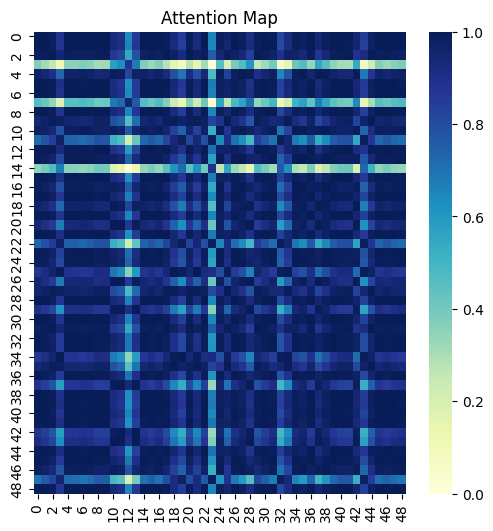

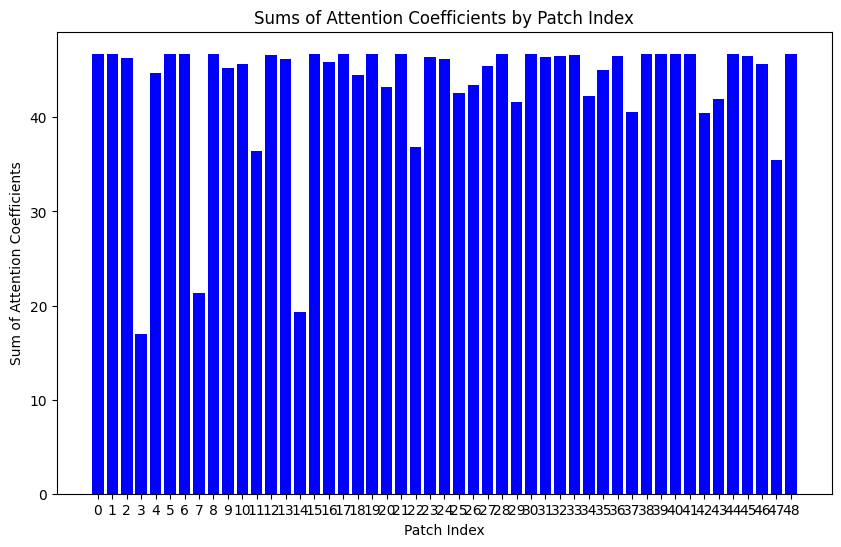

Predicted class for the sample: 1.0
Row sums: [46.75529  46.728363 46.34596  16.994888 44.69605  46.750732 46.757027
 21.292423 46.738968 45.196667 45.713497 36.459175 46.661247 46.241096
 19.30281  46.75265  45.90325  46.686367 44.51791  46.742542 43.256268
 46.75182  36.81773  46.425476 46.158432 42.54304  43.449047 45.43801
 46.72078  41.62219  46.7285   46.366444 46.556015 46.587677 42.233482
 44.978157 46.55324  40.51692  46.757736 46.749313 46.726627 46.735695
 40.426502 41.98204  46.71651  46.56876  45.622993 35.41419  46.742126]


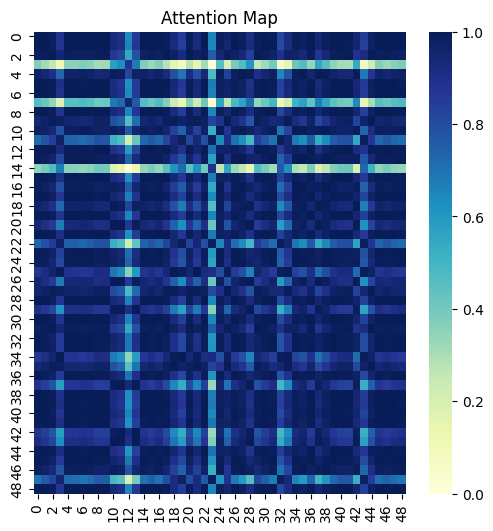

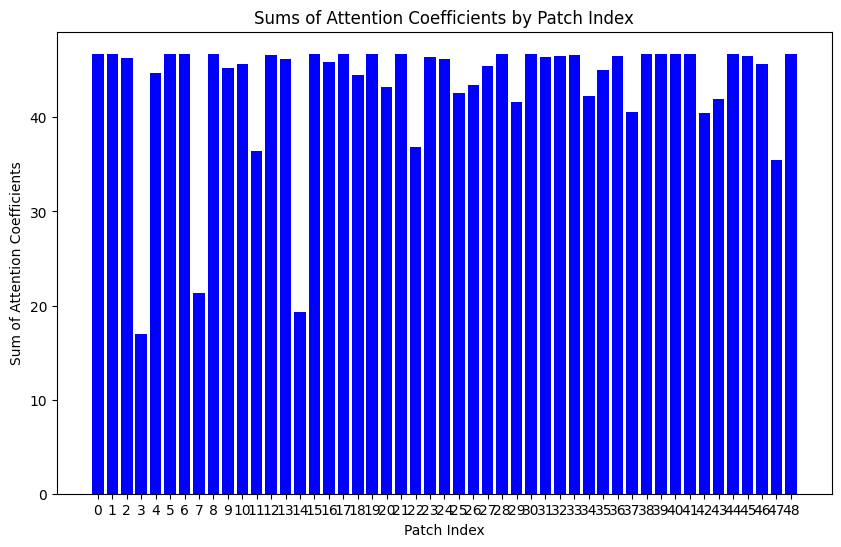

Extracted attention values: tensor([[[0.9986, 0.9994, 0.9890,  ..., 0.9999, 0.9992, 0.9977],
         [0.9996, 0.9982, 0.9850,  ..., 0.9992, 0.9999, 0.9991],
         [0.9809, 0.9942, 1.0000,  ..., 0.9919, 0.9834, 0.9780],
         ...,
         [0.9878, 0.9704, 0.9376,  ..., 0.9750, 0.9857, 0.9900],
         [0.7253, 0.7756, 0.8358,  ..., 0.7645, 0.7330, 0.7168],
         [0.9993, 0.9987, 0.9866,  ..., 0.9995, 0.9997, 0.9986]]])


In [67]:
# Select a single sample from the test set
single_sample = torch.tensor(X_test[15:16].astype(np.float32))  # Select one sample

# Make a prediction for the single sample
# Get the attention values for a single sample
with torch.no_grad():
    prediction = attention_model(single_sample).squeeze()
    predicted_class = (torch.round(torch.sigmoid(prediction))).item()
    print(f"Predicted class for the sample: {predicted_class}")

    _ = attention_model(single_sample)  # Forward pass to calculate attention
    attention_values = attention_model.attention_values  # Extracted attention values
    print(f"Extracted attention values: {attention_values}")

Row sums: [46.99568  46.945675 46.708828 16.399942 44.654503 47.016266 47.001553
 20.689674 46.96286  45.65099  42.526474 46.389076 46.96769  46.349625
 19.767338 47.015923 45.969364 46.906597 44.789043 46.96905  43.122356
 47.016113 37.42488  46.56294  45.508087 44.928642 43.326183 45.87838
 46.93409  41.405605 46.98992  45.731926 46.719006 46.757965 42.786407
 45.443813 46.71562  46.808575 46.840958 47.016327 46.94298  47.013058
 40.158867 41.78221  47.003757 46.961964 45.659706 36.02321  46.968307]


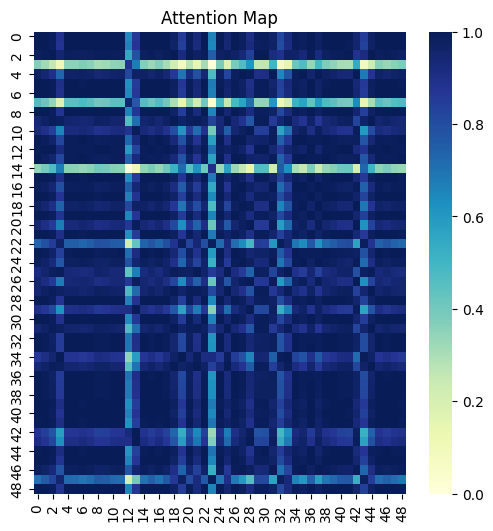

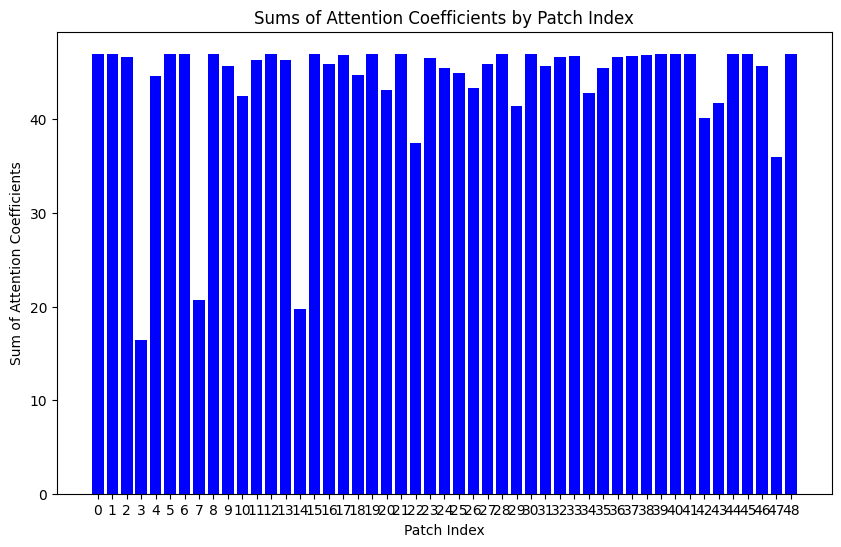

Predicted class for sample 0: 1.0
Row sums: [46.867233 46.817974 46.580578 16.462336 44.548122 46.887268 46.87299
 20.73679  46.834915 45.529034 43.541626 45.171738 46.8384   46.22815
 19.782854 46.886955 45.851425 46.779488 44.949112 46.841022 43.02877
 46.88713  37.355137 46.439392 46.886948 41.10578  43.230934 45.754997
 46.806538 41.325787 46.85933  46.577248 46.593872 46.63242  42.683
 45.323174 46.59052  45.581043 46.692917 46.887302 46.81531  46.883896
 40.088726 41.699417 46.8745   46.834038 45.544563 35.961796 46.840294]


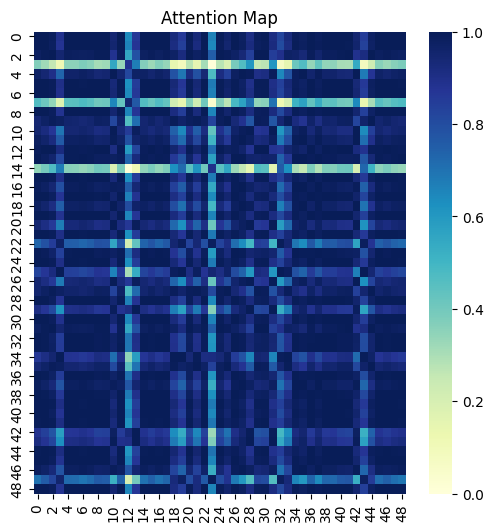

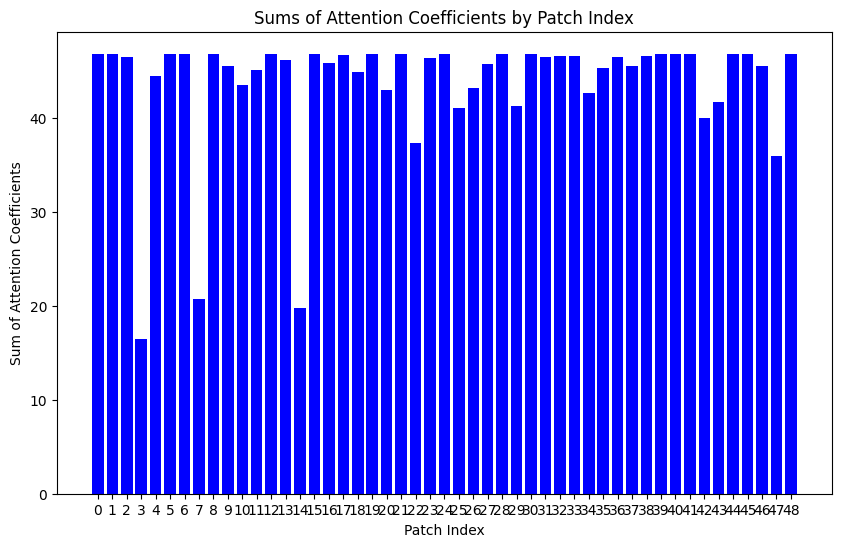

Predicted class for sample 1: 1.0
Row sums: [46.87219  46.814487 46.633175 16.280586 44.45901  46.901596 46.879475
 20.540573 46.83382  45.62137  46.703632 40.75571  46.868412 46.186745
 19.968014 46.900436 45.796024 46.869587 46.086937 46.840878 42.912792
 46.900997 37.541245 46.407787 46.78838  44.34452  43.11807  45.840958
 46.801598 41.18745  46.832382 44.98478  46.571075 46.612175 42.82596
 45.420784 46.567513 43.84021  36.443127 46.902187 46.811478 46.902702
 39.937443 41.565475 46.897087 46.83281  45.479694 36.15405  46.840034]


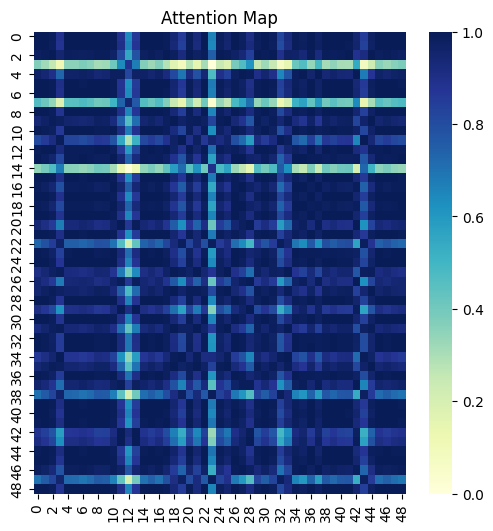

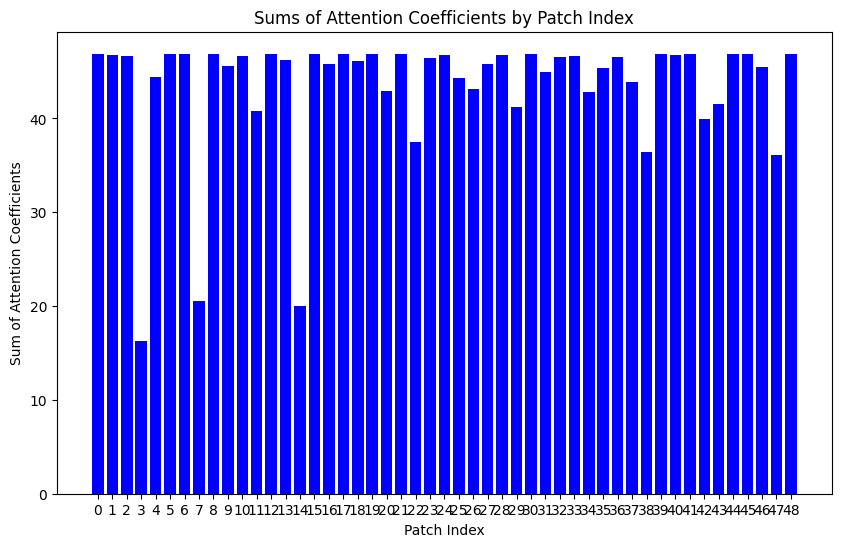

Predicted class for sample 2: 1.0
Row sums: [46.43567  46.381317 46.2088   17.212048 44.152992 46.46324  46.442516
 21.314653 46.39954  45.252724 40.20867  46.460308 46.43152  45.7884
 26.225792 45.9784   44.901154 44.292175 43.003437 46.40619  42.687057
 45.413254 42.203873 45.997326 45.664066 45.654293 42.881783 45.46012
 46.369167 41.049232 46.381542 46.429447 46.25379  46.190407 42.613796
 45.063293 46.148224 39.950996 46.21383  45.559925 46.37848  46.464176
 39.861423 41.40826  46.458786 46.398586 41.07086  36.314777 46.405396]


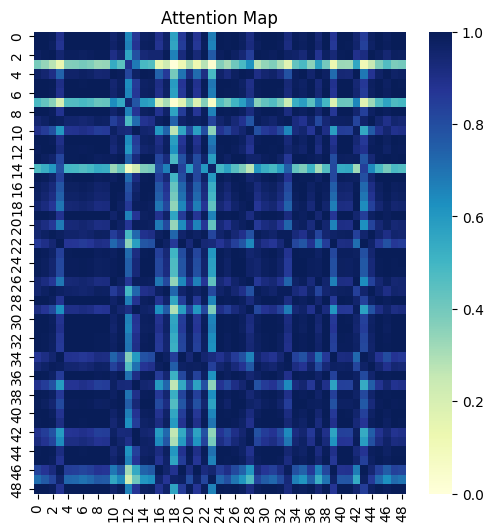

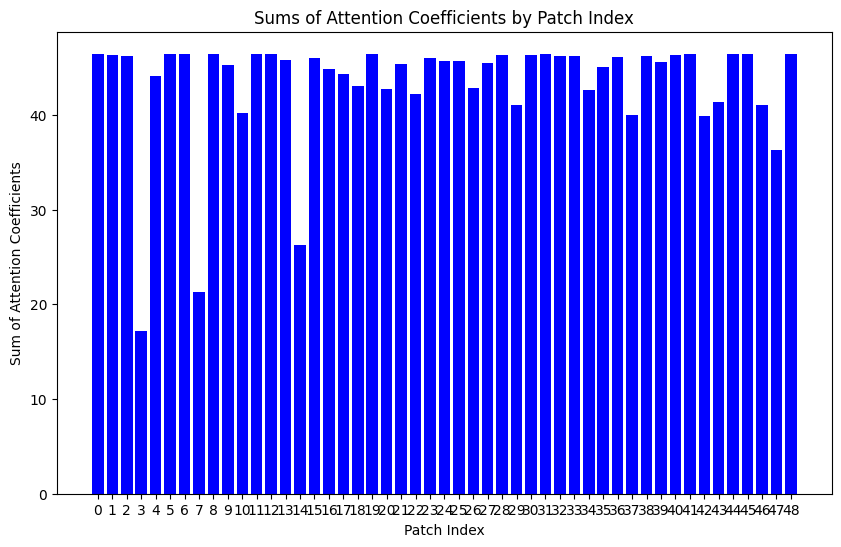

Predicted class for sample 3: 1.0
Row sums: [46.543667 46.482677 46.333714 16.314217 44.126797 46.577377 46.55161
 20.523546 46.502888 45.36091  45.747513 46.356396 46.552917 45.847076
 20.113602 46.575798 45.4564   46.018253 44.33102  46.510307 42.59508
 46.57655  37.465332 46.069046 46.16717  41.00691  42.798214 45.573227
 46.46928  40.889355 46.540768 43.698837 46.233837 46.275486 42.64094
 45.166676 46.23023  45.19971  44.63928  43.158623 46.47955  46.58078
 39.65488  41.26287  46.57722  46.501823 45.141083 36.10271  46.509415]


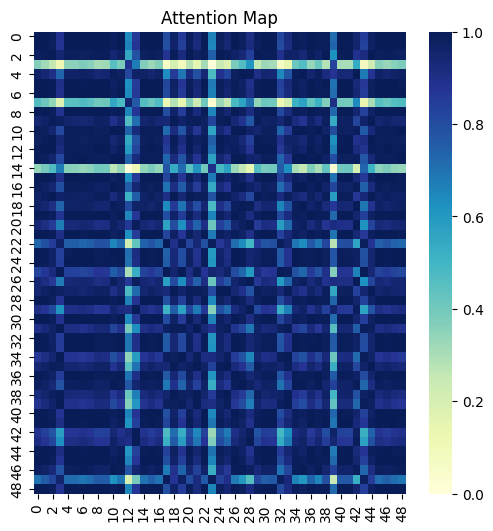

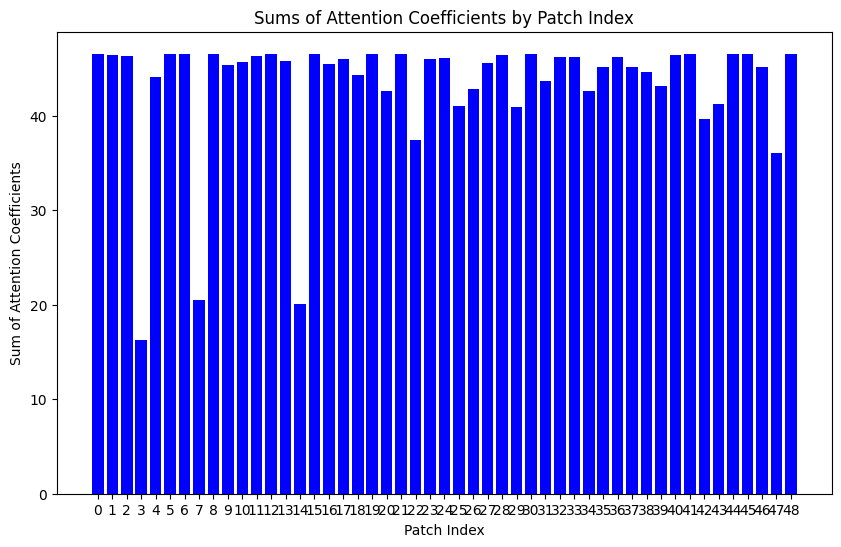

Predicted class for sample 4: 1.0
Row sums: [47.100735 47.008778 47.049397 15.343444 44.283916 47.167812 47.114193
 19.597351 47.03785  46.18745  40.581764 45.756855 41.173088 46.222954
 20.817204 47.16324  45.77183  47.06851  47.175865 47.04878  42.610397
 47.16535  38.435043 46.485558 47.15755  46.618073 42.83082  46.38339
 46.98998  40.77235  47.13171  46.796993 46.685787 46.737503 43.5745
 46.00636  46.68133  46.850685 46.802788 47.17063  47.00436  47.18677
 39.453182 41.17314  47.196144 47.036293 45.41397  37.066845 47.047462]


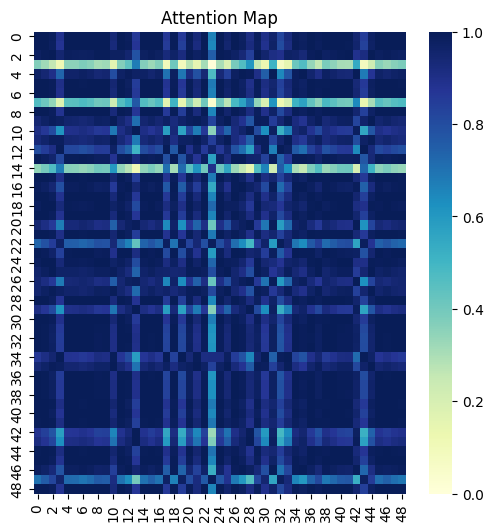

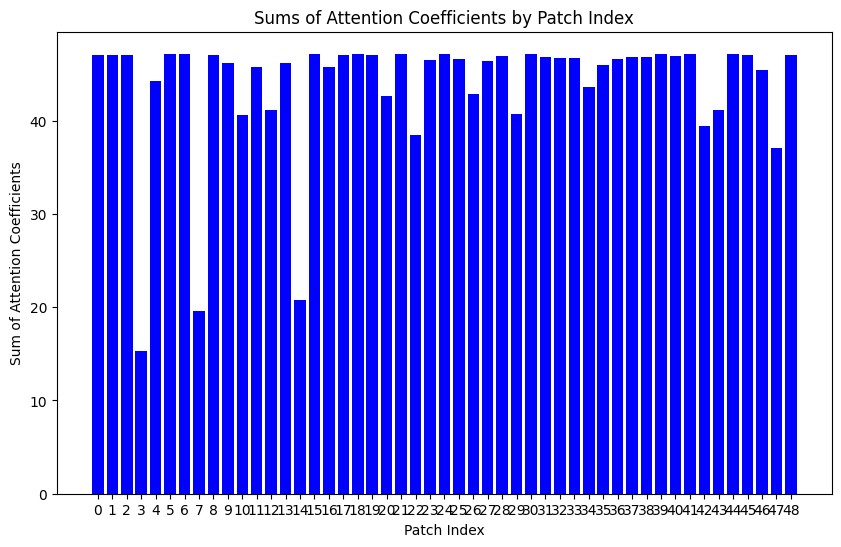

Predicted class for sample 5: 1.0
Row sums: [46.59678  46.544373 46.34449  16.798378 44.29213  46.62132  46.603203
 20.983915 46.56695  42.218777 36.345383 46.616436 46.582405 45.950943
 20.388166 46.618927 39.82856  46.057617 24.926554 46.568565 42.79968
 46.62094  37.46975  46.161465 45.824917 46.58594  42.99806  45.561733
 46.532486 41.129967 46.544598 46.5349   46.616325 46.355103 42.613514
 45.149227 46.312916 40.009617 46.333702 46.62178  46.541607 46.620476
 39.91822  41.496113 46.613415 46.602333 45.273975 36.121307 46.5678  ]


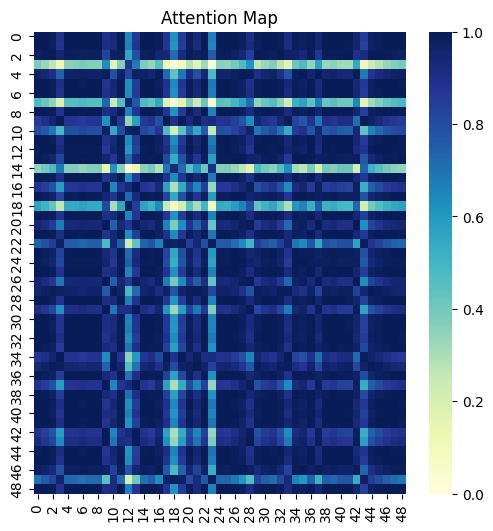

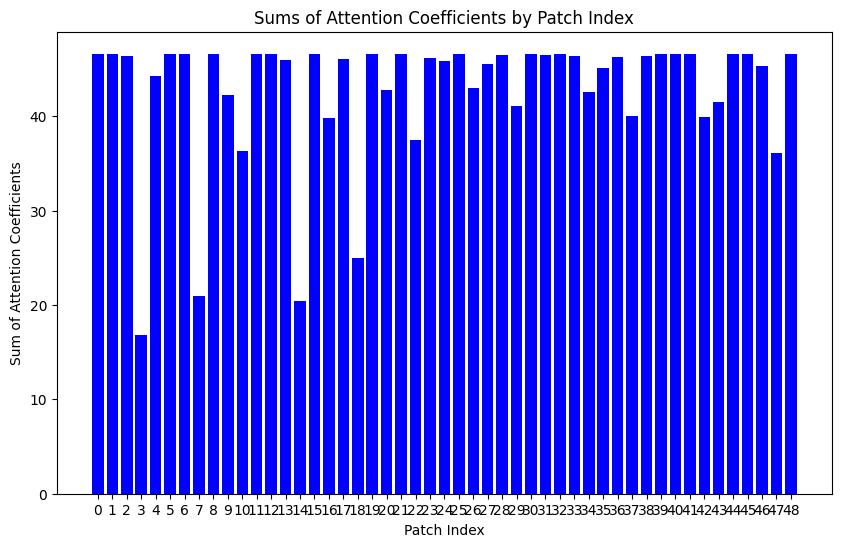

Predicted class for sample 6: 1.0
Row sums: [47.421066 47.390263 46.99212  15.789588 45.191578 47.418274 47.423275
 20.30036  47.402187 45.76661  41.70655  47.42435  30.222809 46.85883
 18.168827 47.38849  45.866993 35.42681  47.17236  46.591587 43.643658
 47.41934  42.048767 46.247105 46.69567  40.01693  43.850716 46.02438
 47.381798 41.890575 47.39042  47.362812 43.82934  47.235485 42.59683
 45.533115 47.197906 40.706615 47.404568 45.944126 47.38832  47.40313
 40.609818 42.276344 47.383377 46.76959  46.1906   35.301678 47.405766]


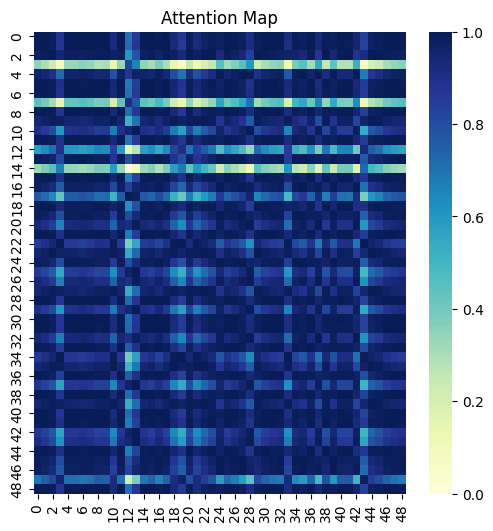

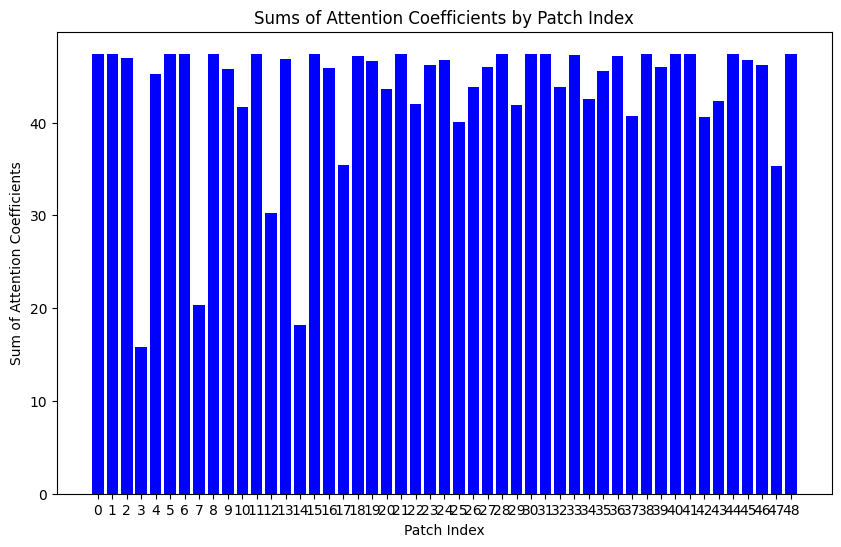

Predicted class for sample 7: 1.0
Row sums: [46.88203  46.81692  46.687847 16.275705 44.39568  46.919846 46.890675
 20.500721 46.838345 45.717876 40.87332  46.59922  38.6873   46.15791
 20.290302 45.247616 46.375072 46.087646 46.00968  46.872524 42.832973
 46.918827 44.593773 46.71581  45.81974  45.580254 43.040024 45.93044
 46.802784 41.0961   46.81719  46.70418  46.761143 46.600395 42.98421
 45.523228 46.259575 43.500618 41.730934 46.3059   46.89011  46.925034
 39.84068  41.476204 46.922897 46.83721  45.43316  36.39456  46.845284]


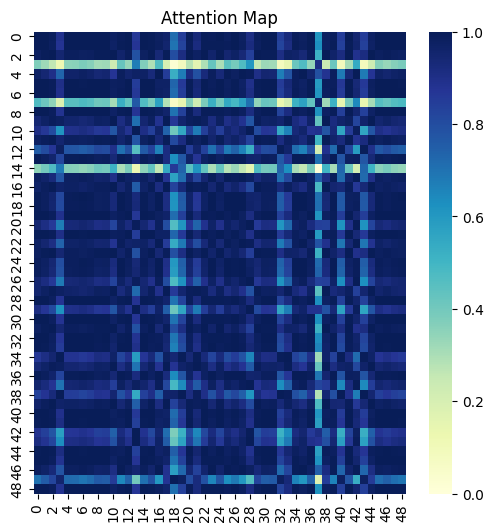

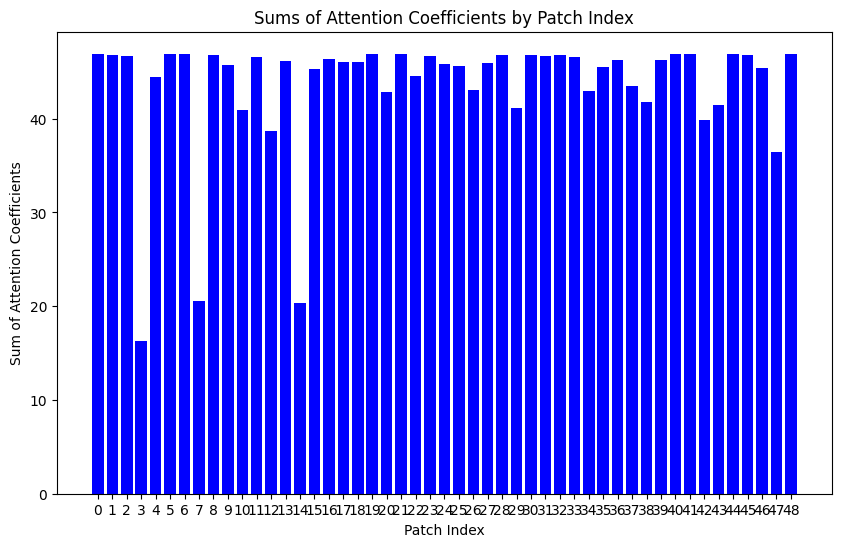

Predicted class for sample 8: 1.0
Row sums: [46.706264 46.682148 46.250103 15.520681 44.58441  46.696693 46.707317
 20.042234 46.692123 45.016262 41.194614 46.704662 46.594322 46.18774
 22.881067 46.13276  42.246403 45.37761  39.05665  46.046307 43.082348
 46.707447 45.06513  43.06575  45.33222  46.61803  45.68273  45.274426
 46.67489  41.374237 46.68228  46.694077 46.523483 45.42491  41.858776
 44.78275  46.50742  40.217705 46.26739  46.70643  46.680496 46.67856
 40.123062 41.750595 46.656403 46.63325  45.548386 34.618996 46.695026]


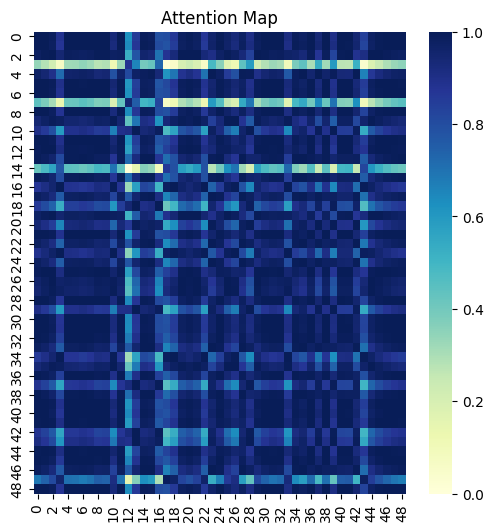

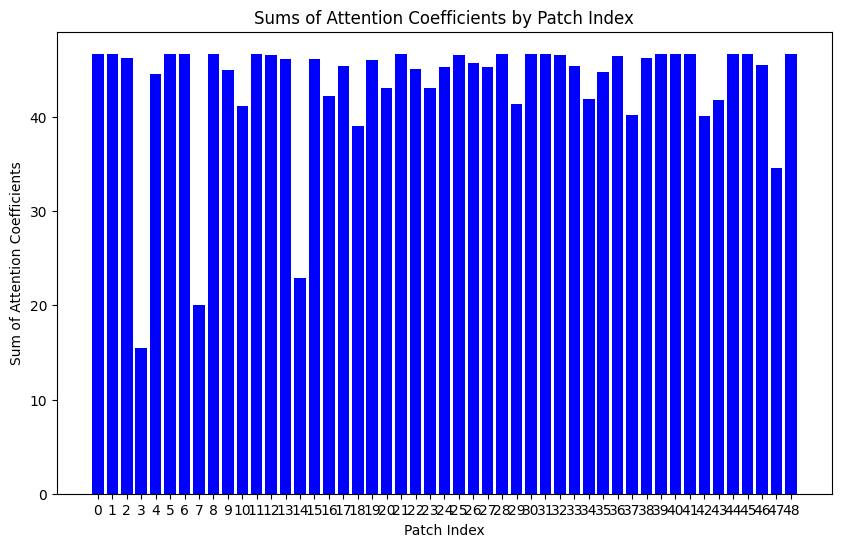

Predicted class for sample 9: 1.0
Row sums: [46.328682 46.29745  45.957264 17.069395 44.265007 46.329758 46.33128
 21.296219 46.309196 44.85841  44.876705 35.49729  46.251663 45.799896
 19.463345 46.331127 45.46217  46.33103  46.2033   46.31325  42.844864
 46.33054  36.712593 45.98548  42.557896 40.42219  43.034748 45.09038
 46.289196 41.237446 46.2976   44.79267  46.15553  46.15036  41.991585
 44.648064 46.11515  40.151707 45.195747 28.241682 46.295547 46.31772
 40.062923 41.591156 46.30122  46.308506 45.18329  35.339417 46.312775]


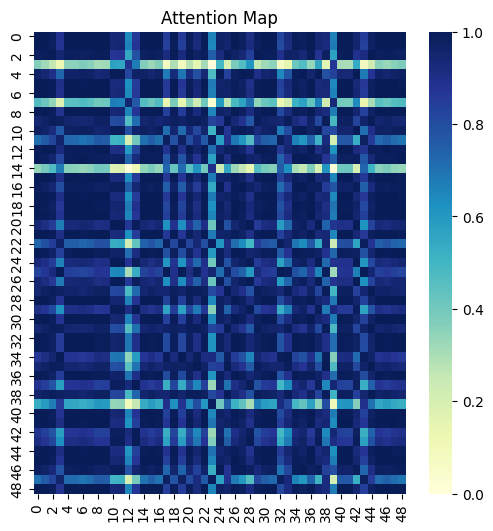

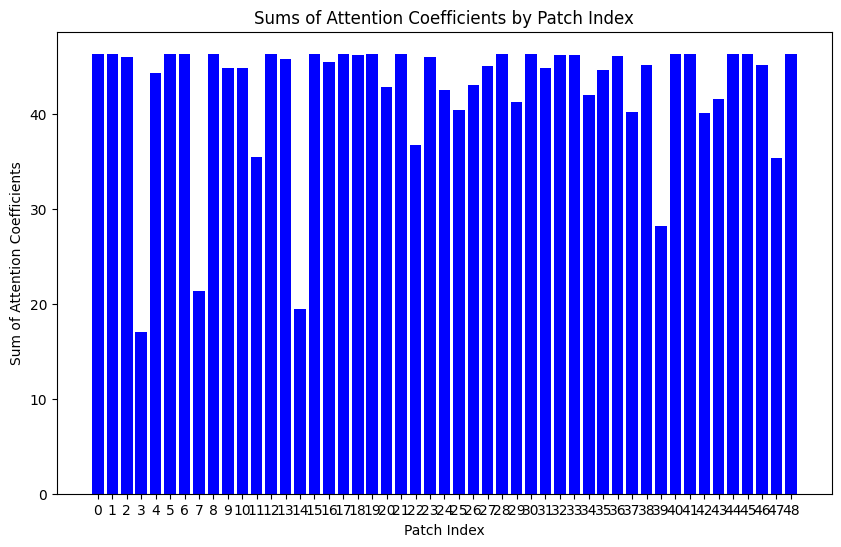

Predicted class for sample 10: 1.0
Row sums: [46.322746 46.335236 45.699978 18.000498 44.737316 46.275    46.3174
 22.304338 46.33463  45.93453  41.35663  45.850815 46.114635 46.03179
 18.152563 45.85904  46.28536  46.18641  46.334682 46.33374  43.451324
 46.278225 35.95122  46.294266 46.038906 45.72174  43.62569  44.650894
 46.33448  41.95525  46.327576 46.230755 42.242455 45.744385 41.21988
 44.143234 46.253307 40.933353 46.334885 33.395565 46.335136 46.239555
 40.84517  42.28708  46.20327  46.31392  45.73777  34.221848 46.33387 ]


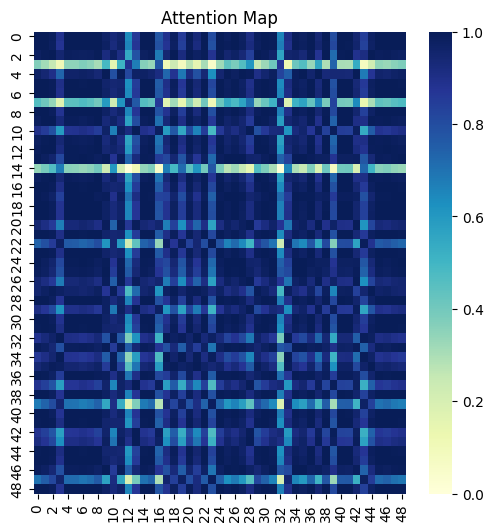

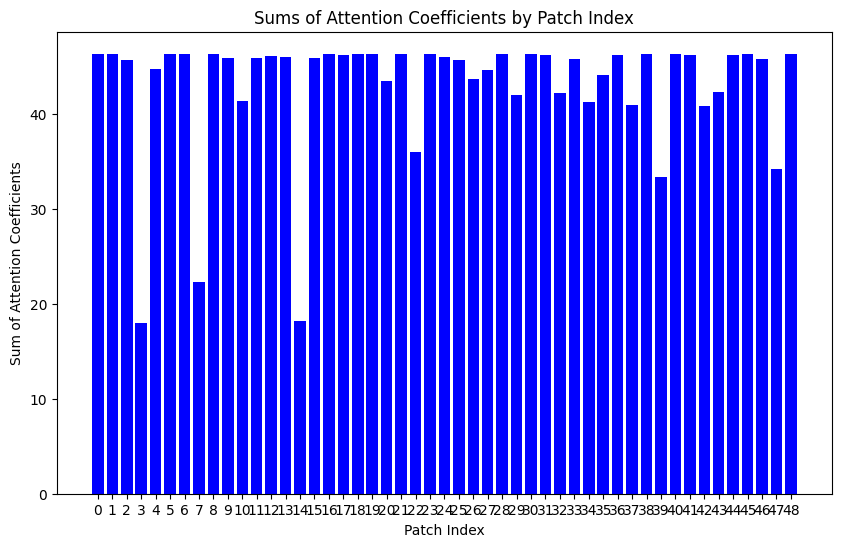

Predicted class for sample 11: 1.0
Row sums: [46.884243 46.85703  46.472237 16.964521 44.808964 46.879738 46.886005
 21.27572  46.867737 45.314537 40.54162  46.161983 46.789715 46.36575
 19.260975 46.81164  41.252995 45.519672 46.825764 46.87135  43.35874
 46.880825 36.875275 46.551594 46.252506 46.71129  43.55289  45.55766
 46.849373 41.713245 46.85717  46.813972 43.482338 46.71512  42.329514
 45.09441  46.6804   40.600494 46.43549  45.81716  46.855274 46.864628
 40.50947  42.075573 46.84533  42.86106  45.742863 35.462204 46.870926]


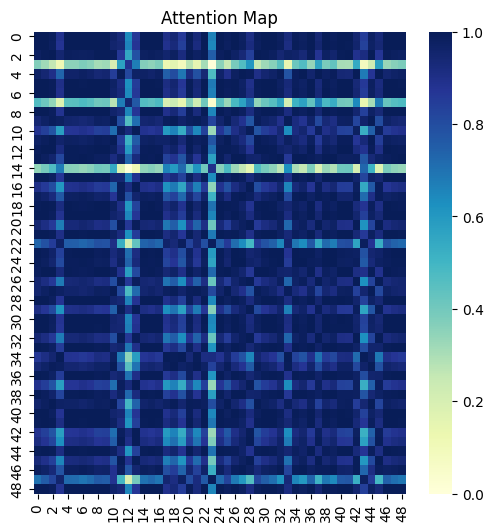

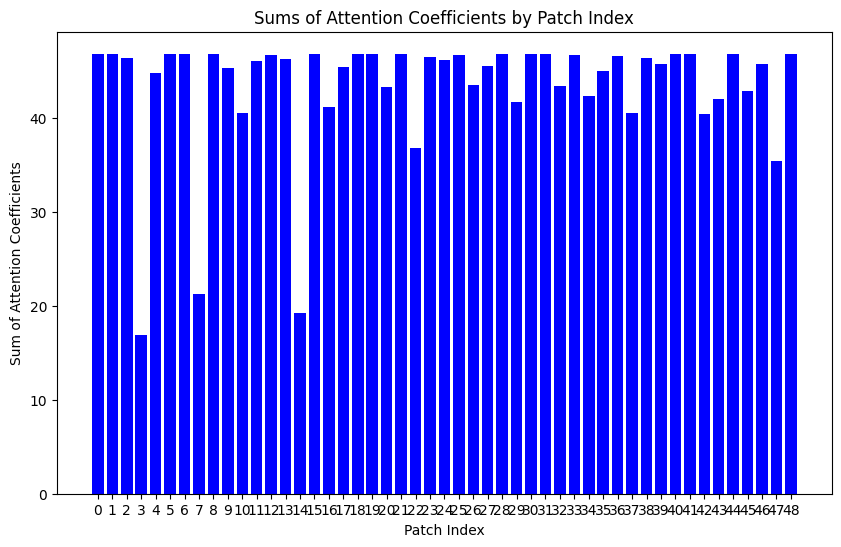

Predicted class for sample 12: 1.0
Row sums: [46.6986   46.640522 46.472237 16.552595 44.31355  46.729073 46.706013
 20.756195 46.65991  45.486122 40.914604 46.476078 39.441345 46.017902
 20.271326 46.697884 41.26439  46.19429  46.26737  46.667    42.79052
 46.7284   37.568386 46.236538 45.96727  45.317078 42.99266  45.700523
 46.627625 41.091854 46.640762 46.67895  46.644882 46.439095 42.750996
 45.290176 46.394783 39.954166 46.713295 46.72975  46.63751  46.730923
 39.861412 41.463993 46.726063 44.907936 45.31981  36.206383 46.66615 ]


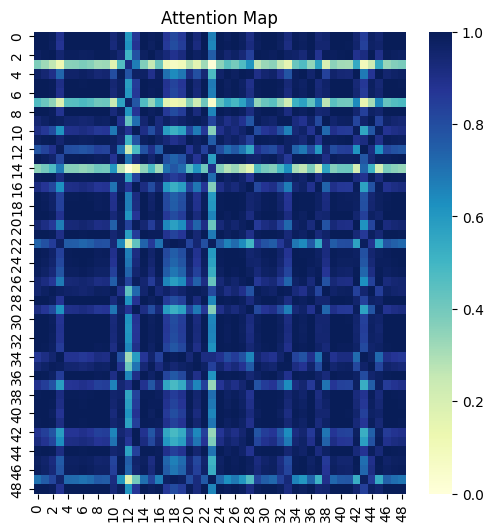

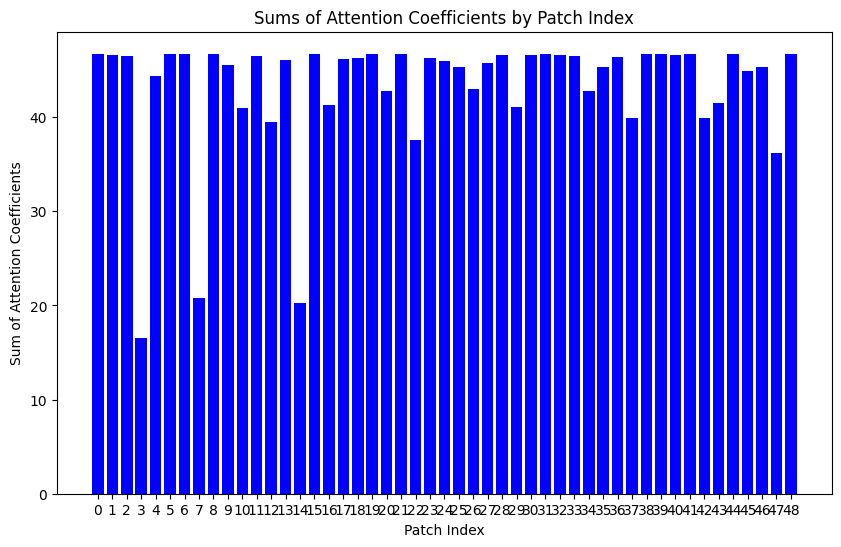

Predicted class for sample 13: 1.0
Row sums: [47.25352  47.191685 47.026157 15.998342 44.755295 47.286793 47.261494
 20.315174 47.212257 46.008305 41.165512 46.80559  37.16632  46.537384
 20.050323 47.28531  46.133327 47.2635   46.150635 47.279335 43.165543
 47.28602  37.824207 46.37693  45.36206  45.689953 43.37644  46.229908
 47.178024 41.394157 47.284542 39.345066 47.011    46.979282 43.179466
 45.805725 46.932705 46.433315 47.27916  47.28759  47.188496 47.289467
 40.111996 41.782093 47.285038 47.211174 45.806816 36.418736 47.218887]


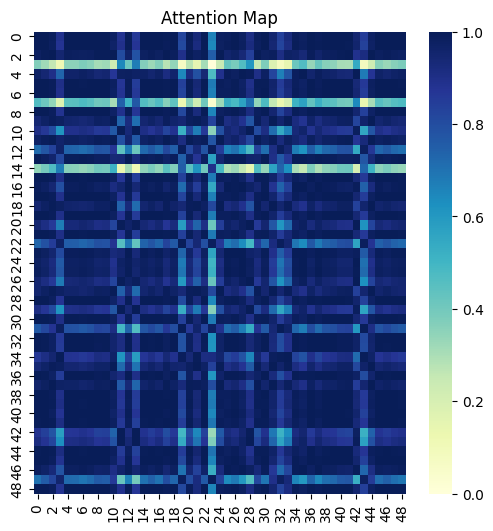

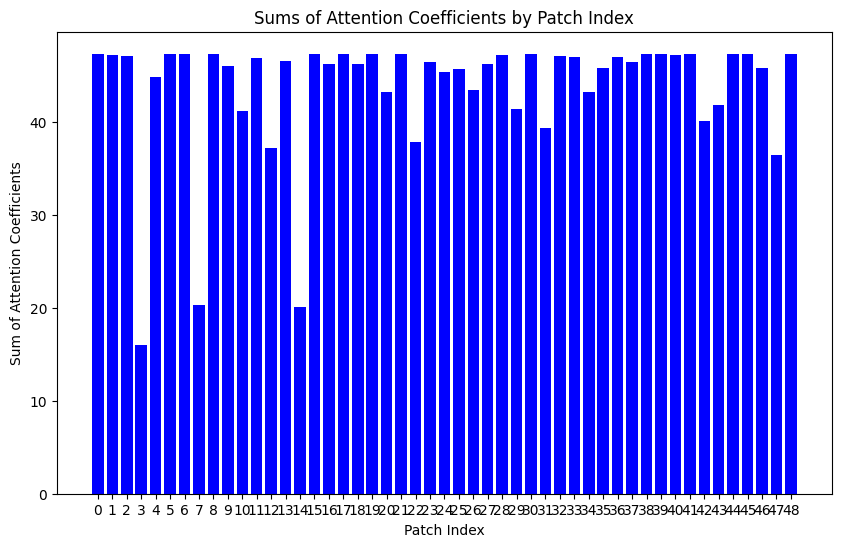

Predicted class for sample 14: 1.0
Row sums: [46.75529  46.728363 46.34596  16.994888 44.69605  46.750732 46.757027
 21.292423 46.738968 45.196667 45.713497 36.459175 46.661247 46.241096
 19.30281  46.75265  45.90325  46.686367 44.51791  46.742542 43.256268
 46.75182  36.81773  46.425476 46.158432 42.54304  43.449047 45.43801
 46.72078  41.62219  46.7285   46.366444 46.556015 46.587677 42.233482
 44.978157 46.55324  40.51692  46.757736 46.749313 46.726627 46.735695
 40.426502 41.98204  46.71651  46.56876  45.622993 35.41419  46.742126]


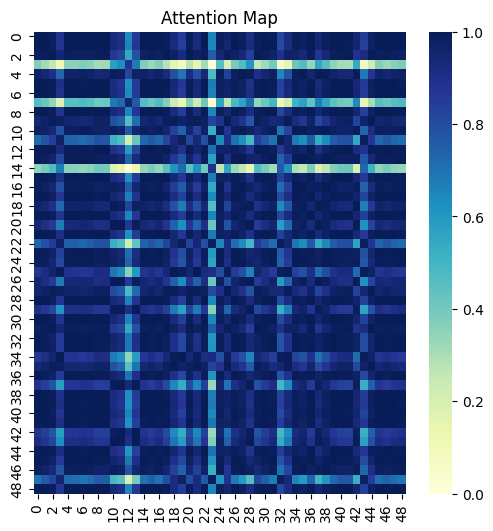

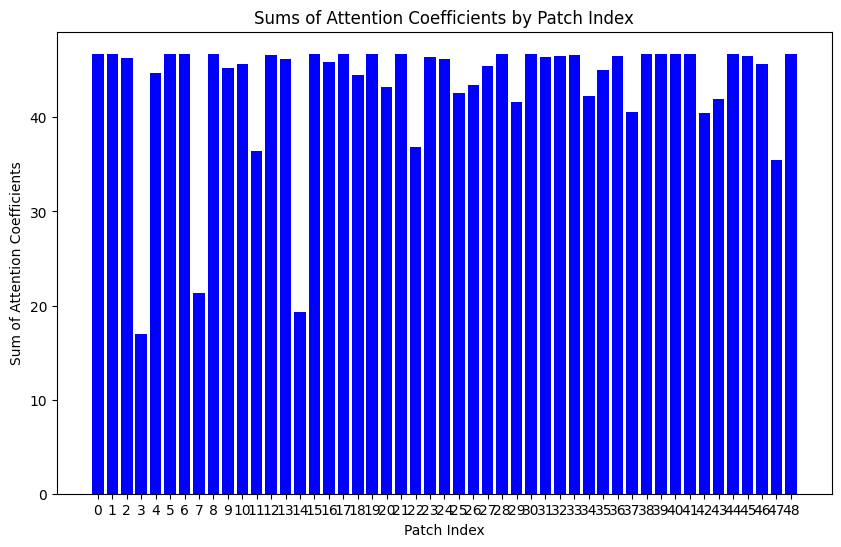

Predicted class for sample 15: 1.0
Row sums: [47.224903 47.135433 47.155094 15.364775 44.422375 47.288948 47.23788
 19.636831 47.163822 46.271454 40.713017 44.287827 47.042496 46.357933
 20.716969 47.284653 45.908684 47.159985 46.22877  47.280838 42.74679
 47.28664  38.427853 46.618843 47.310673 44.044754 42.967625 46.47131
 47.11704  40.904163 47.20728  44.599804 46.81727  46.868412 43.619724
 46.086975 46.812855 47.30634  46.944546 47.291573 47.131115 47.306355
 39.5808   41.3061   46.789963 47.162304 45.551704 37.048317 47.17319 ]


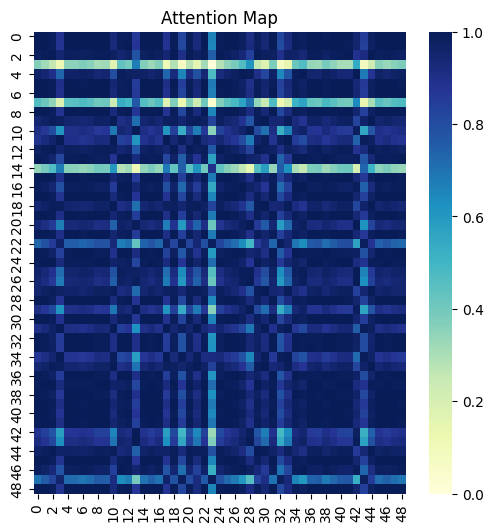

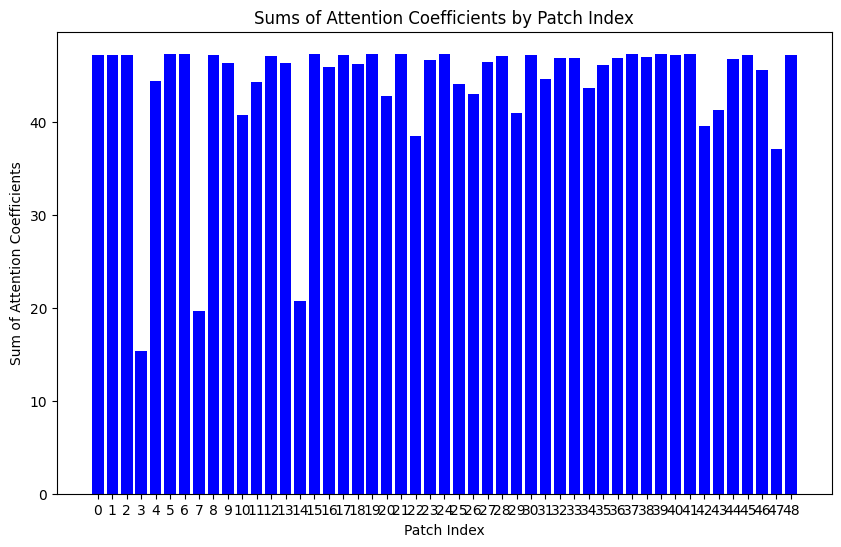

Predicted class for sample 16: 1.0
Row sums: [46.96362  46.948727 46.48362  17.495604 45.03198  46.945526 46.963158
 21.793901 46.955936 45.518925 37.955585 45.76695  39.517853 46.513973
 19.156752 42.004845 39.94086  46.25289  46.814014 45.589603 43.626556
 46.94729  36.71452  46.685005 46.406384 46.624252 43.815384 45.52292
 46.943195 42.020702 46.948822 46.84289  45.785774 46.831547 42.21935
 45.043854 46.800945 41.52692  45.91562  46.943302 46.947475 46.92397
 40.84132  42.37502  46.90892  46.96306  45.927265 35.29581  46.9579  ]


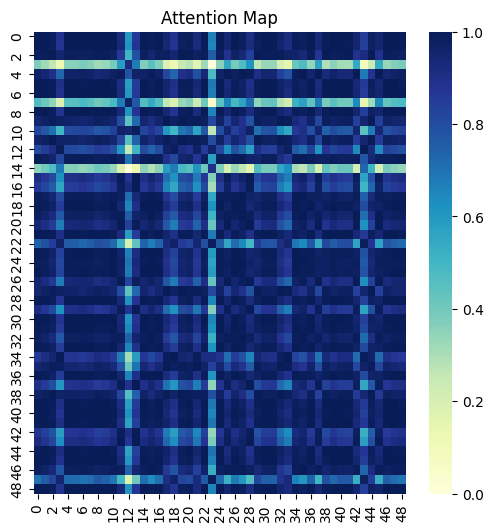

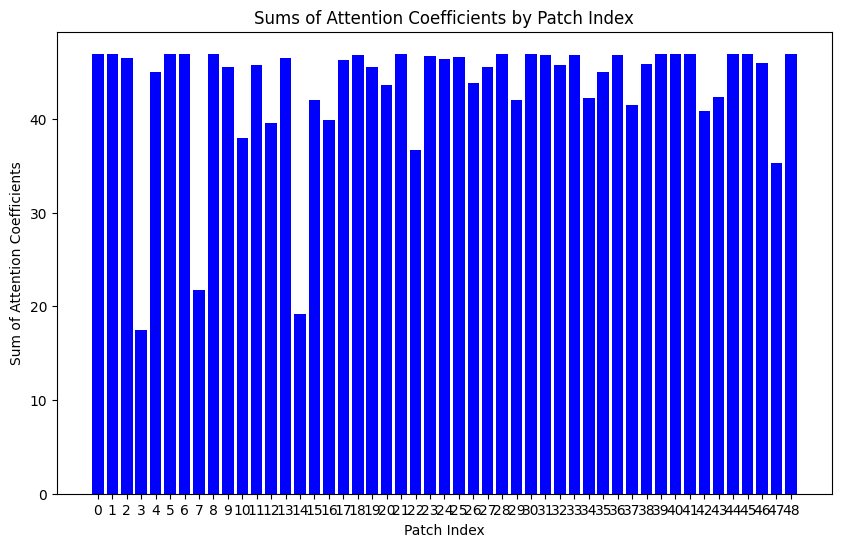

Predicted class for sample 17: 1.0
Row sums: [46.316788 46.32417  45.727383 17.938921 44.684345 46.27498  46.312393
 22.229467 44.015133 45.456455 28.240627 46.284615 46.125175 46.000145
 18.586239 46.203194 38.163483 45.960796 45.956512 46.32466  43.38816
 46.277897 35.8621   46.140865 45.910263 46.32137  43.56365  44.70756
 46.32255  41.884495 44.6747   46.318214 45.890152 44.680767 39.729588
 44.211662 46.231186 38.86357  46.32099  36.48832  46.324196 46.242462
 40.770367 42.217754 46.208702 46.325005 45.491158 34.458656 46.32473 ]


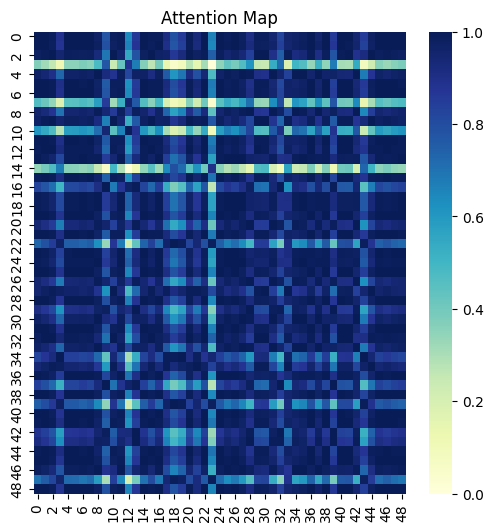

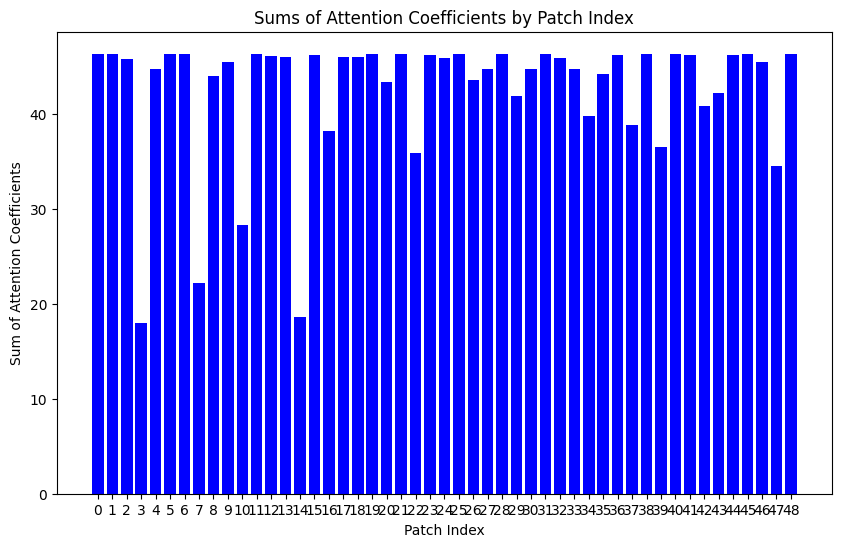

Predicted class for sample 18: 1.0
Row sums: [46.834225 46.784863 46.5465   16.317696 44.50851  46.85427  46.839993
 20.6105   46.801846 45.491714 45.918102 45.352165 46.805187 46.193462
 19.660988 46.853962 45.81567  46.830433 46.663147 46.807964 42.98449
 46.854137 37.29317  46.407364 43.2551   41.05522  43.187283 45.718365
 46.7734   41.276093 46.785072 42.279194 46.560192 46.598843 42.637157
 45.285233 46.556828 40.503895 44.327698 46.854305 46.782196 46.850864
 40.035004 41.650925 46.84143  46.800964 45.507915 35.895504 46.80723 ]


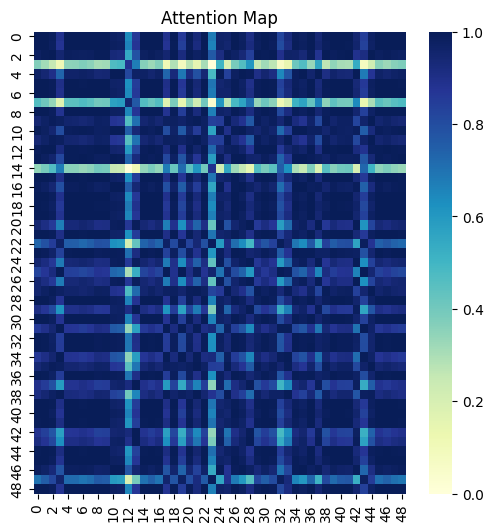

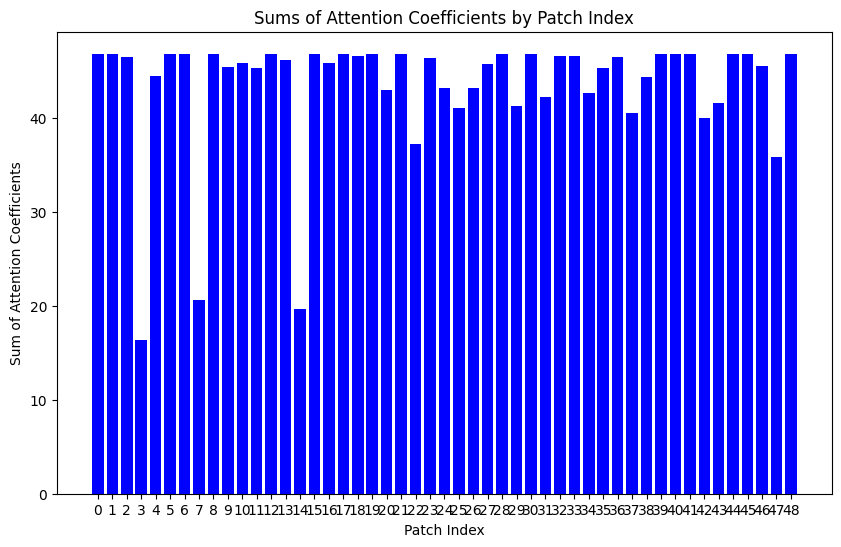

Predicted class for sample 19: 1.0
Row sums: [46.694305 46.65163  46.373016 16.534037 44.45794  46.70719  46.698887
 20.819025 46.666695 45.380383 46.4604   42.062725 46.64675  46.09326
 19.461601 46.70753  46.682045 44.410103 45.011627 46.67205  42.966927
 46.707413 37.066326 46.23165  46.282097 42.78593  43.16566  45.52548
 46.641342 41.289845 46.67494  37.299587 43.061783 46.47959  42.41937
 45.08637  46.439976 40.27127  42.442505 46.707325 46.649246 46.700466
 40.06902  41.658188 46.688282 46.66592  45.430866 35.66883  46.671413]


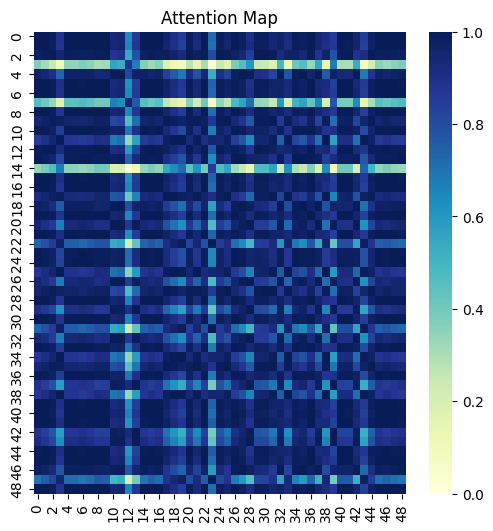

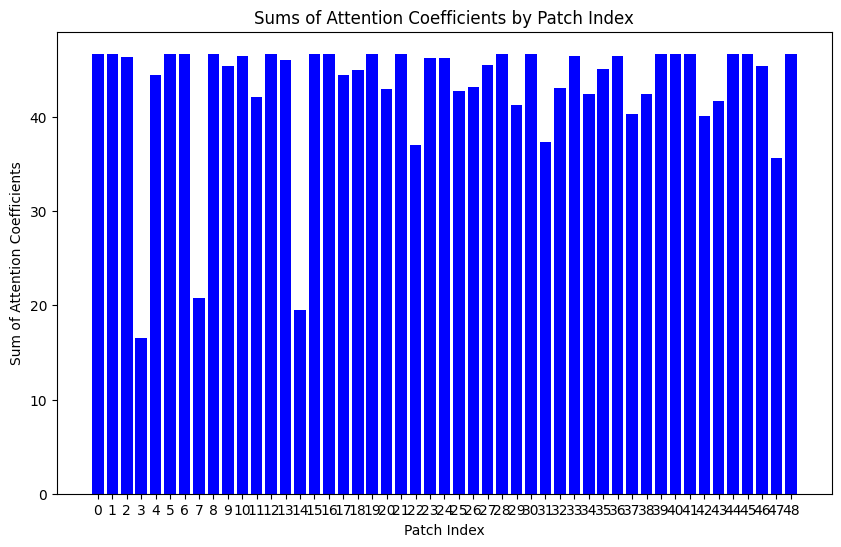

Predicted class for sample 20: 1.0
Row sums: [46.503098 46.511536 45.898697 17.819502 44.85695  46.45956  46.498455
 22.152533 45.768246 45.79825  41.973442 46.479733 46.305576 46.186775
 18.26668  46.037384 46.15348  43.783092 42.437477 46.50909  43.545532
 46.462578 37.3862   45.866318 46.32903  46.509777 46.196465 46.19156
 46.51006  42.331867 41.094643 36.78555  46.474033 45.758495 41.22421
 44.352192 46.419292 40.982178 40.96743  46.387497 46.51126  46.426018
 40.8966   42.36119  46.391293 46.510128 45.672794 34.413593 46.511745]


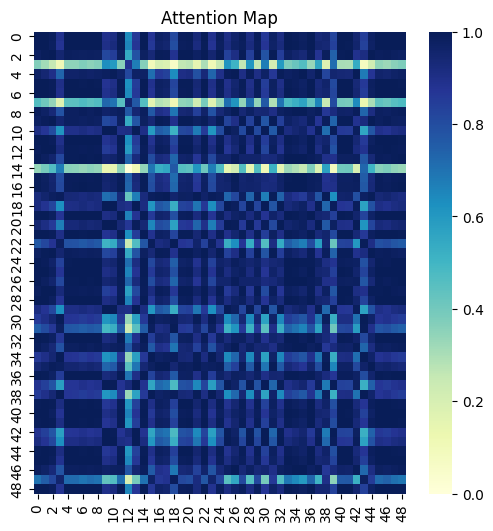

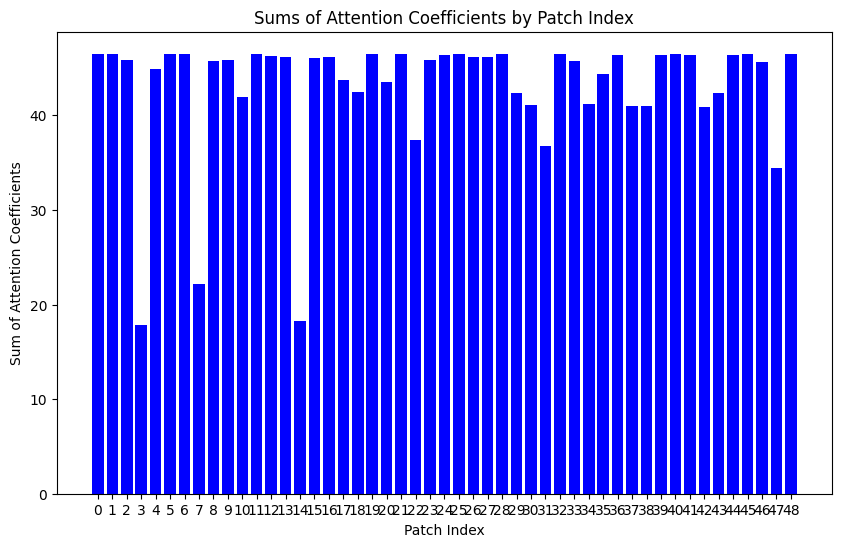

Predicted class for sample 21: 1.0
Row sums: [46.79717  46.764904 46.42098  17.15857  44.68952  46.79873  46.79989
 21.407297 46.777004 45.303234 40.96939  45.524384 38.85789  46.255848
 19.587048 45.133205 46.400013 46.316517 46.621273 43.215218 43.241947
 46.79951  37.091743 46.447662 46.369835 46.707836 43.43543  45.53926
 46.75642  41.604816 46.776325 45.422657 46.336967 46.614132 42.38669
 45.08921  46.578102 45.263477 38.978134 46.797688 46.76295  46.786686
 40.409412 41.964954 42.977173 46.799454 45.626297 35.628933 46.780685]


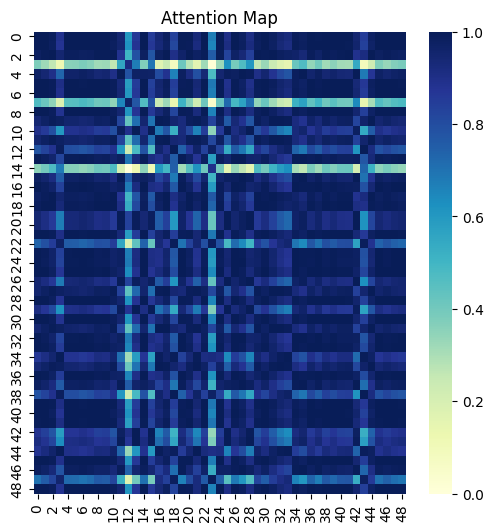

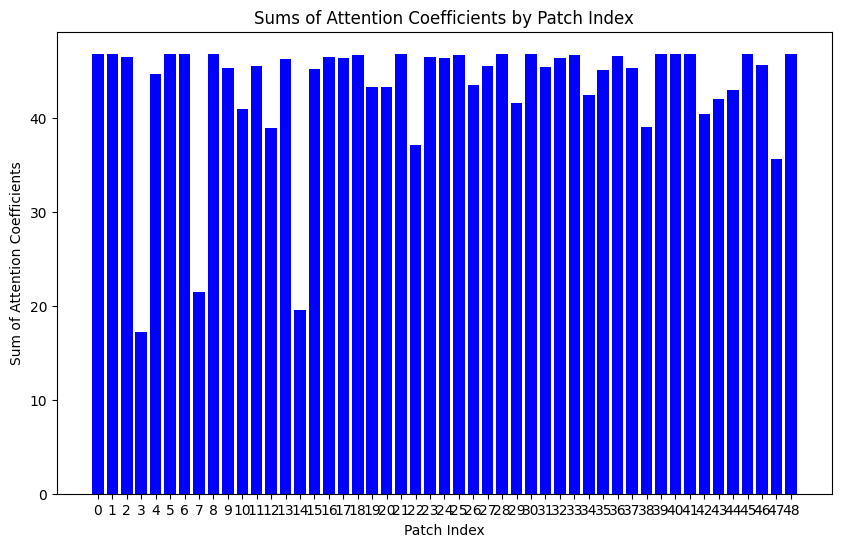

Predicted class for sample 22: 1.0
Row sums: [46.59932  46.55409  46.295277 16.51689  44.343803 46.61521  46.604378
 20.782084 44.91783  46.554874 20.677256 46.600334 46.560223 45.986195
 19.527592 46.564384 39.366302 45.875786 45.679012 46.57551  42.851814
 46.615276 34.868164 45.888203 46.12434  46.532627 46.603767 45.46287
 46.54338  44.14424  46.35454  46.57004  46.512527 46.37745  42.390125
 45.02972  46.33713  40.049446 46.38454  46.155014 46.551605 46.60999
 39.95746  41.54404  46.599102 46.517338 28.650278 35.68463  46.574833]


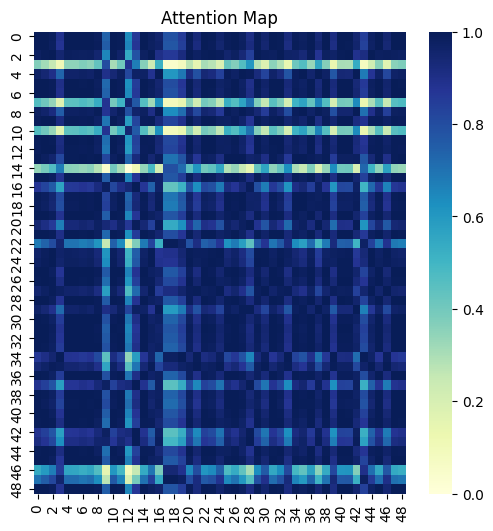

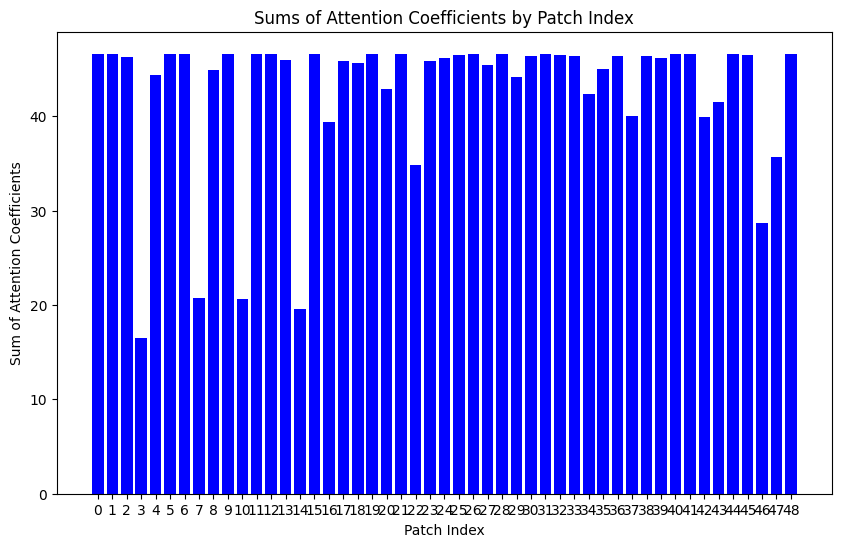

Predicted class for sample 23: 1.0
Row sums: [47.0617   46.9928   46.876514 15.83779  44.495636 47.102966 47.070957
 20.124887 47.015358 45.895977 40.428883 45.637238 47.088253 46.308838
 19.958372 47.10075  45.89483  47.1044   45.758095 47.02368  42.892715
 47.101795 37.795483 46.44009  45.76855  42.09899  43.10493  46.111515
 46.977943 41.113873 47.04176  37.41035  46.208214 46.766846 43.115158
 45.698444 46.718105 40.79226  43.575096 47.104244 46.989326 47.10952
 39.82942  41.502968 47.108395 47.014164 45.56194  36.393238 47.02268 ]


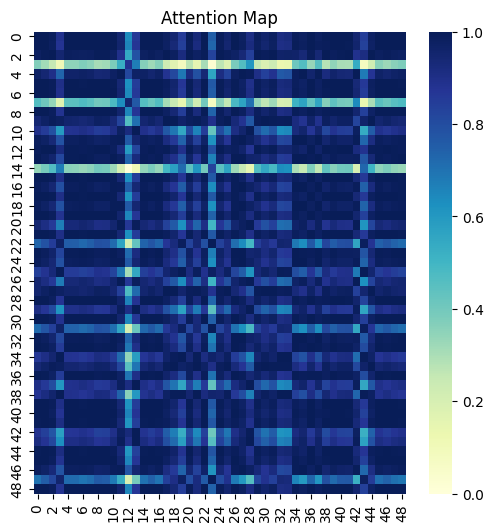

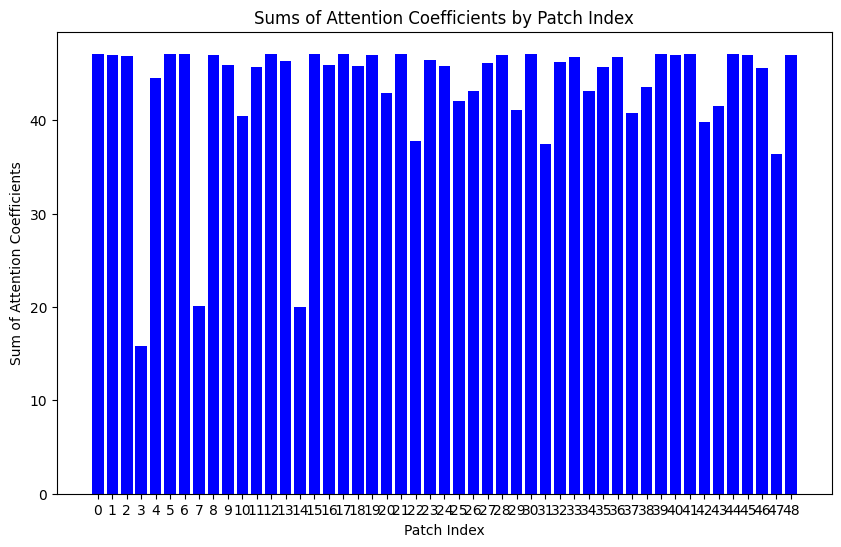

Predicted class for sample 24: 1.0
Row sums: [46.65752  46.608883 46.374203 16.489939 44.365383 46.677277 46.663204
 20.745747 46.625618 45.33559  46.312355 46.03004  46.628944 46.026176
 19.86685  46.67697  45.653866 46.39467  46.040535 46.63165  42.86259
 46.677147 37.261734 46.23491  43.870396 40.967087 43.062588 45.558758
 46.59759  41.177383 46.62946  42.443043 46.387535 46.425617 42.524864
 45.13228  46.38422  40.01609  44.097565 46.677307 46.60626  46.673923
 39.95275  41.54718  46.66464  46.62475  45.350555 35.88478  46.630928]


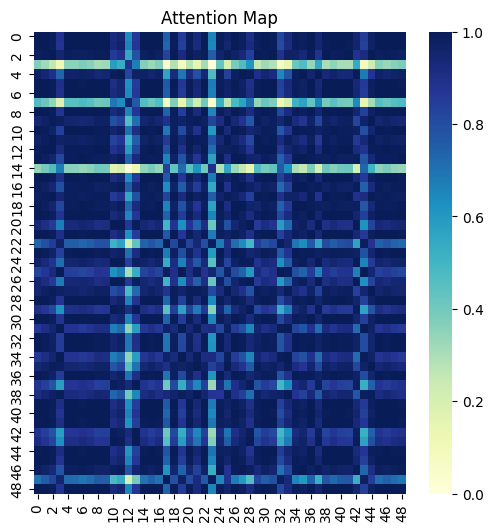

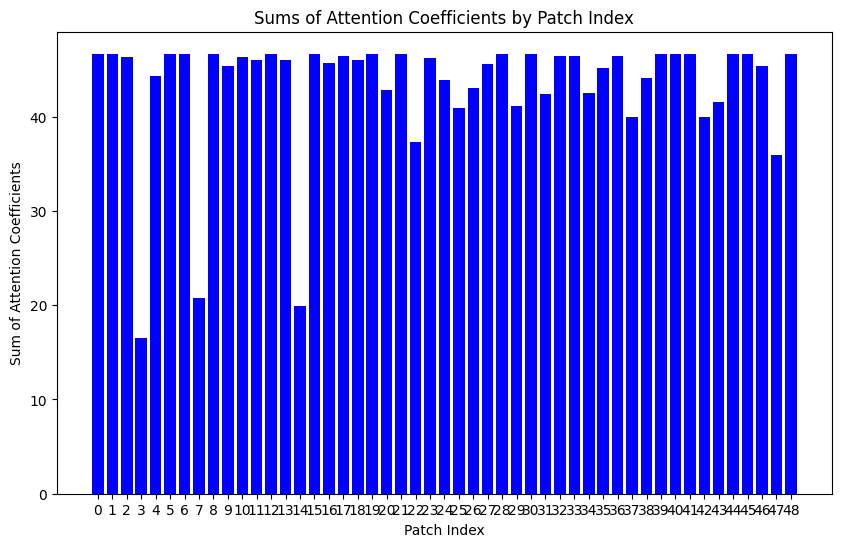

Predicted class for sample 25: 1.0
Row sums: [46.598022 46.539227 46.374283 16.360083 44.198673 40.41054  46.605564
 20.580355 46.558826 45.3879   40.79273  42.85036  44.360214 45.91263
 20.050062 46.62786  45.524914 46.63145  46.177433 46.566    42.673782
 46.628506 37.44509  45.969387 46.496483 41.112926 42.876514 45.602547
 46.526207 40.97044  46.61114  43.341717 46.29515  46.33619  42.646633
 45.19169  46.29159  46.612503 46.38726  46.629925 46.53619  46.63137
 39.736847 41.343567 46.626755 46.5578   45.211468 36.077095 46.56514 ]


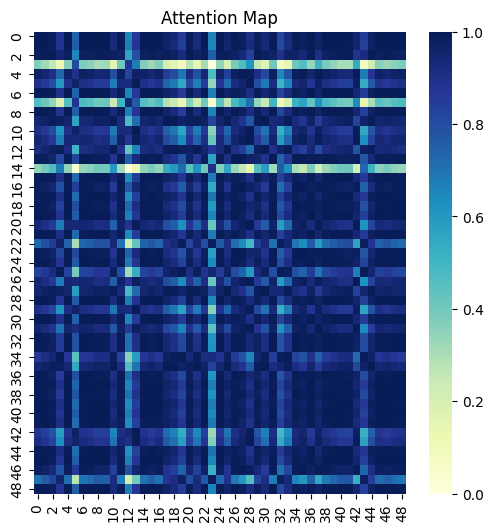

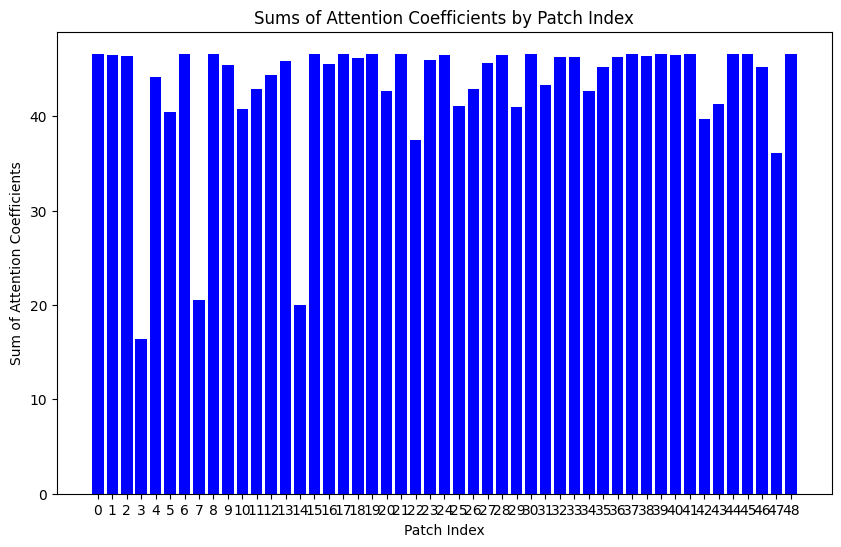

Predicted class for sample 26: 1.0
Row sums: [46.94247  46.90844  46.56762  16.78914  44.78648  46.94546  46.945465
 21.099937 46.92108  45.43912  33.990704 44.686565 36.69591  46.385582
 19.419456 43.390762 43.544445 46.921658 46.719112 46.783455 43.310787
 46.94618  37.0587   46.579742 46.26618  46.50046  46.891144 45.677673
 46.899605 41.64278  46.9086   46.309883 46.848145 46.75277  42.488434
 45.22274  46.715748 43.60825  46.072834 44.09788  46.906403 46.933895
 40.425217 42.00965  46.744907 46.91626  45.742287 35.648163 46.924953]


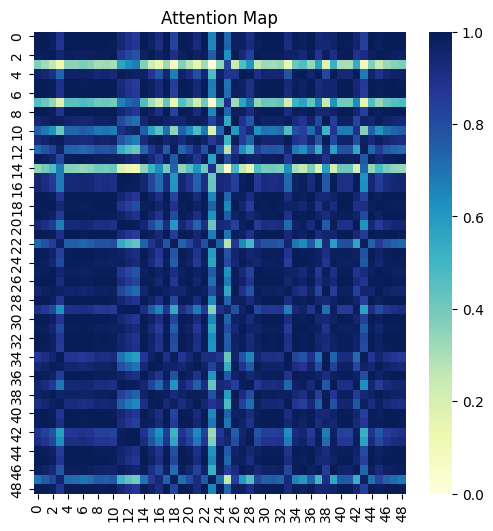

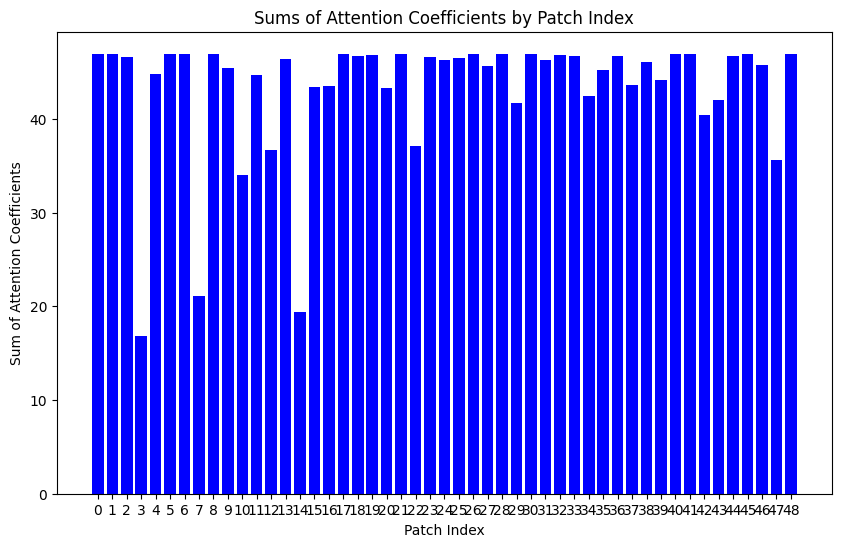

Predicted class for sample 27: 1.0
Row sums: [46.74196  46.6985   46.426693 16.656755 44.50131  46.75581  46.746693
 20.921646 46.713783 45.96188  46.073723 46.754944 46.69721  46.137577
 19.663    46.75605  46.41156  46.654392 46.585754 46.719227 43.011112
 46.755974 37.17057  46.340897 45.655533 40.91763  43.20969  45.585392
 46.688084 41.33578  46.698692 46.653217 46.20326  46.52514  42.496464
 45.148983 46.485336 40.20865  45.752018 39.801033 46.696087 46.749577
 40.11661  41.70368  46.737827 46.712994 45.47438  35.78022  46.71858 ]


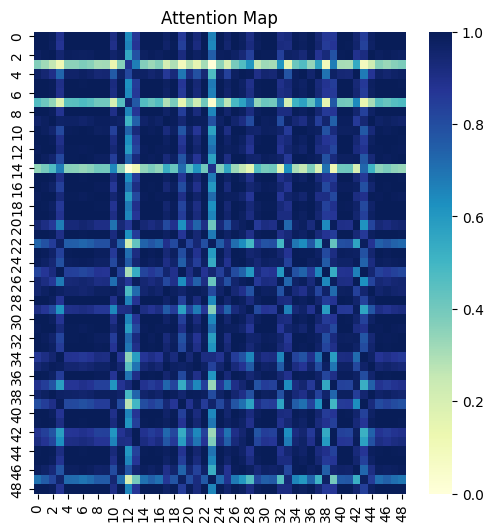

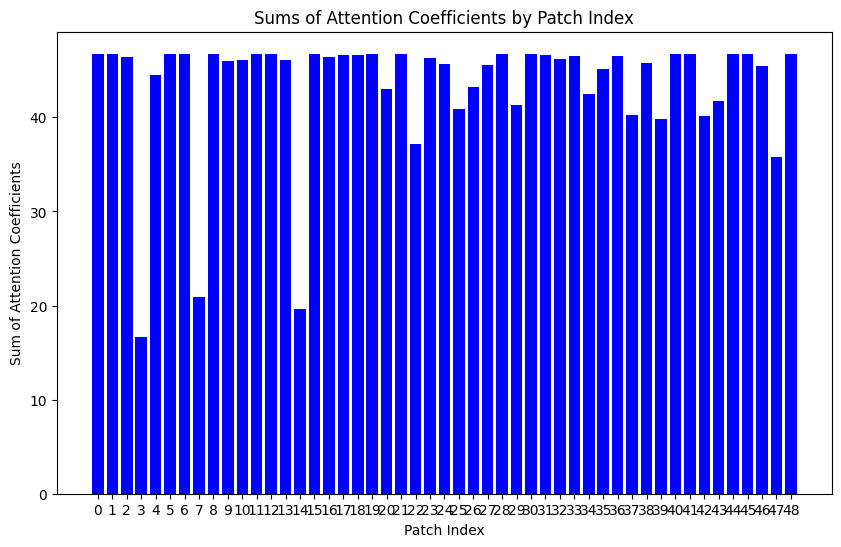

Predicted class for sample 28: 1.0
Row sums: [46.704613 46.6572   46.413242 16.543846 44.423374 46.72295  46.71007
 20.803627 46.67359  45.36589  41.031067 44.46628  46.672077 46.079323
 19.801022 46.72278  45.708576 46.721615 45.025215 46.67948  42.922764
 46.72289  37.25328  46.2869   46.505825 40.974415 43.122528 45.59062
 46.646107 41.239063 46.657406 44.189713 46.43843  46.47619  42.539505
 45.16123  46.435146 40.10753  46.161938 46.722893 46.65462  46.718895
 40.015163 41.60859  46.709    46.672745 45.406242 35.87085  46.67878 ]


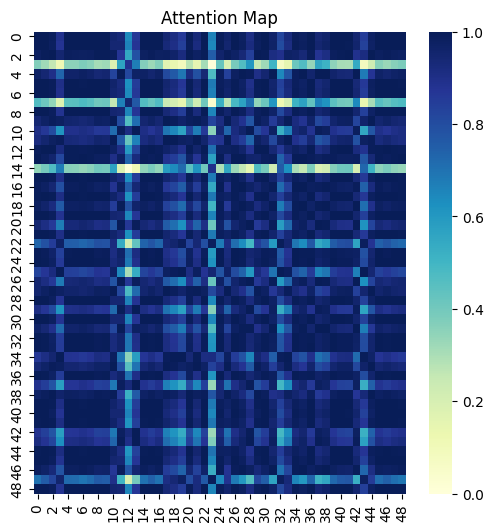

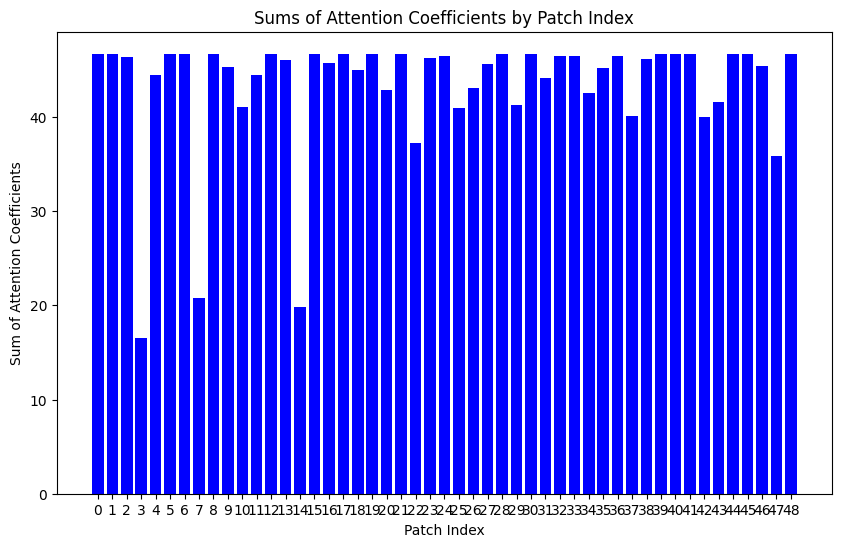

Predicted class for sample 29: 1.0
Row sums: [47.143253 47.080692 46.923798 16.018702 44.648937 47.17756  47.15137
 20.320908 47.101448 46.575012 32.408848 44.64844  45.999588 46.425667
 20.09712  47.175972 46.02242  47.072517 46.985897 47.109062 43.06587
 47.176727 37.795406 46.65465  46.410213 46.513916 43.27583  46.137257
 47.06693  41.302692 47.08095  47.11676  46.79676  46.86746  43.113747
 45.717396 46.490894 46.363426 46.647144 46.12157  47.077477 47.180817
 40.026722 41.68879  47.17693  47.100357 45.6968   36.39835  47.108147]


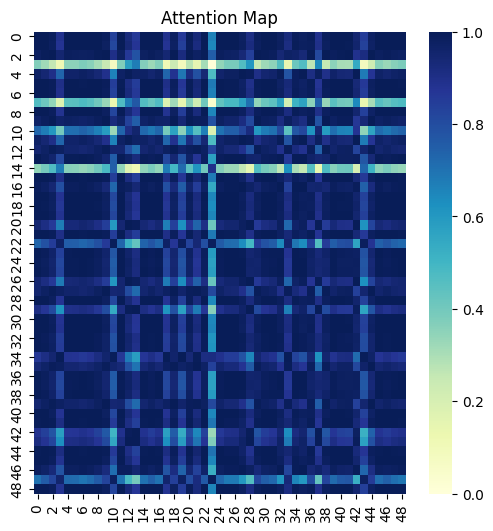

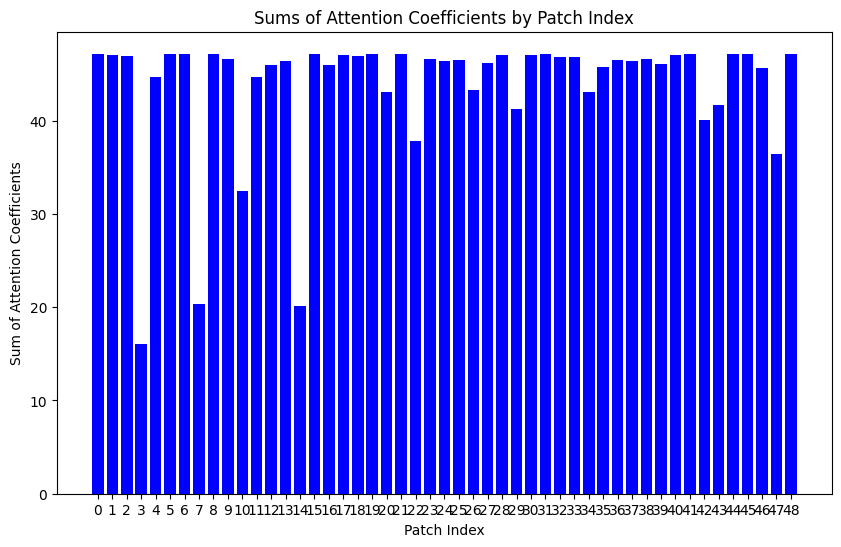

Predicted class for sample 30: 1.0
Row sums: [46.205173 46.16905  45.890522 18.163654 44.17477  46.21344  46.20881
 22.466692 44.916565 45.67375  26.092892 46.21431  46.15165  45.6681
 20.976887 46.200466 39.01799  45.978973 33.171417 46.186604 42.805138
 46.21382  37.26314  45.85163  45.56954  46.1825   42.987953 45.09647
 46.16011  41.259937 46.169212 46.095116 46.214527 46.01671  42.212727
 44.68734  45.9812   42.932228 46.047073 46.011505 46.166985 46.20551
 40.13284  41.599648 46.19806  46.21203  45.06508  35.972168 46.186058]


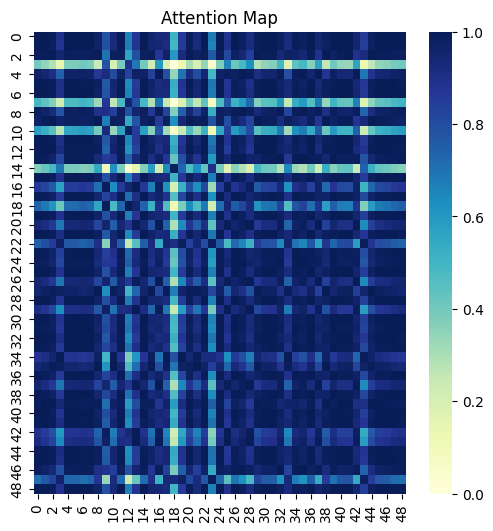

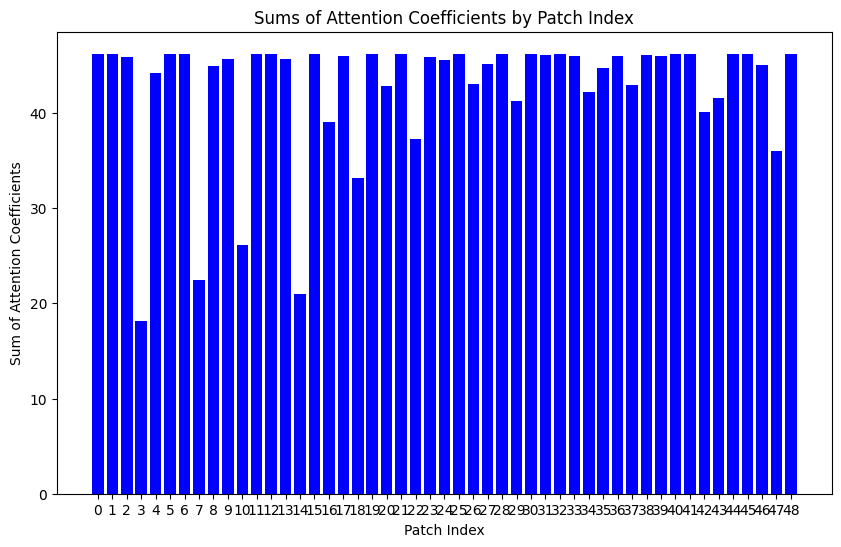

Predicted class for sample 31: 1.0
Row sums: [46.991573 46.92803  46.781586 16.098356 44.50046  47.02723  46.999897
 20.365475 46.949043 45.788593 41.287933 45.480843 47.0039   46.2714
 20.080692 47.025505 45.868847 47.03089  45.064297 46.95676  42.925785
 47.026325 37.72191  46.50033  46.941425 45.848488 43.13454  46.005524
 46.91412  41.173687 46.978363 43.719986 46.670464 46.713497 43.008278
 45.590107 46.666737 47.00355  46.970623 47.028183 46.924778 47.03122
 39.9065   41.55724  47.027996 46.947937 45.544136 36.331657 46.95584 ]


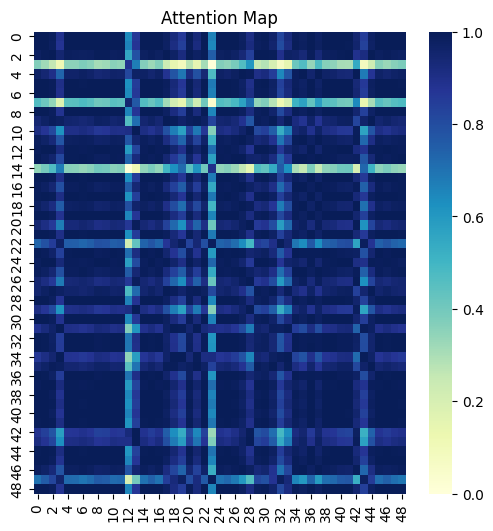

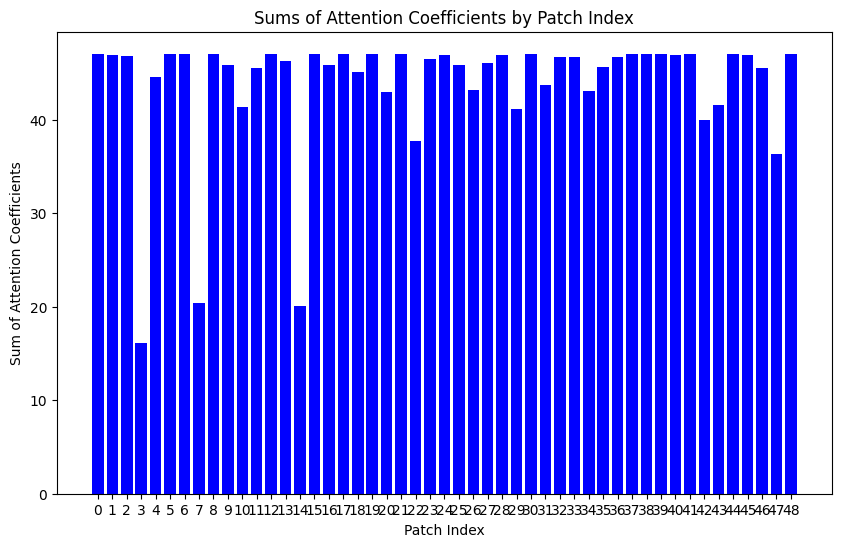

Predicted class for sample 32: 1.0
Row sums: [46.82295  46.76959  46.56109  16.371819 44.462826 46.847633 46.82946
 20.63621  46.78769  45.682446 34.75505  46.842808 46.806793 46.16238
 19.90284  46.846897 45.77965  46.800247 46.663067 46.794254 42.93372
 46.847267 37.43123  46.37796  42.97021  40.870758 43.13696  45.754803
 46.757458 41.22345  46.76982  46.72232  46.53643  46.576153 42.721016
 45.33017  46.53298  40.076187 45.86101  46.847946 46.766766 46.84652
 39.9826   41.598442 46.839054 46.786743 45.46885  36.045128 46.793465]


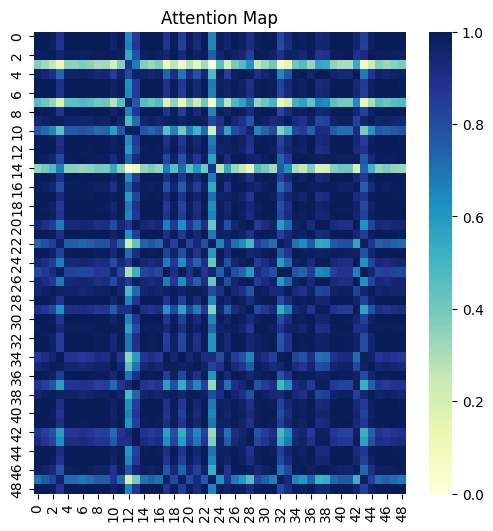

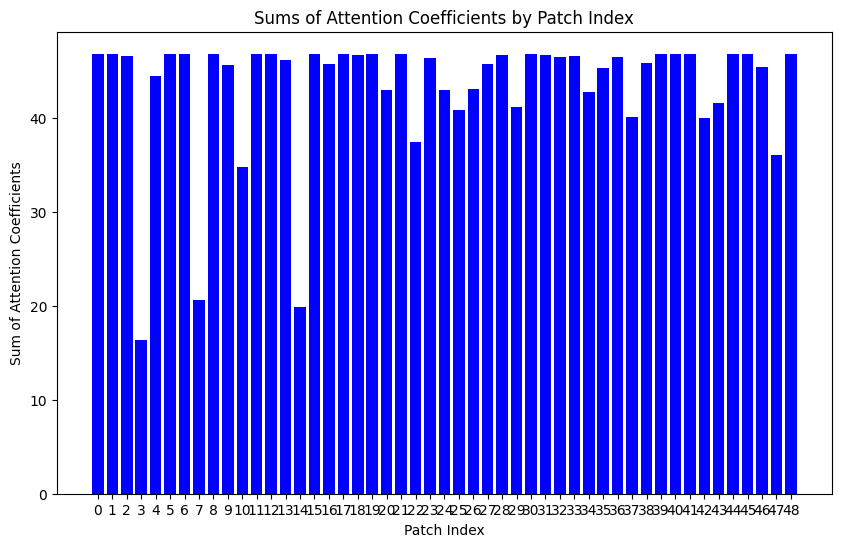

Predicted class for sample 33: 1.0
Row sums: [47.179703 47.099976 47.056374 15.597635 44.490444 47.23302  47.190926
 19.880383 47.125595 46.13005  40.84843  44.027607 38.763237 46.367195
 20.508604 47.229702 45.934887 47.124027 46.41961  47.13515  42.8495
 47.231243 38.196526 46.43118  47.218685 47.246063 43.06625  46.336617
 47.08326  41.036827 47.102585 46.118675 46.804375 46.852516 43.42708
 45.94004  46.79528  46.82239  45.11419  47.23501  47.096054 47.24534
 39.731426 41.432774 47.249077 47.124233 45.5895   36.81242  47.134   ]


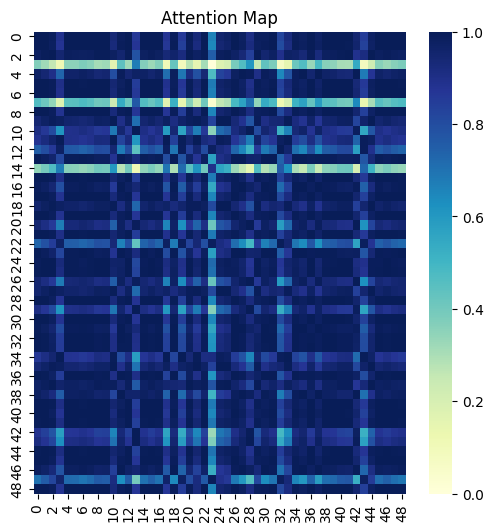

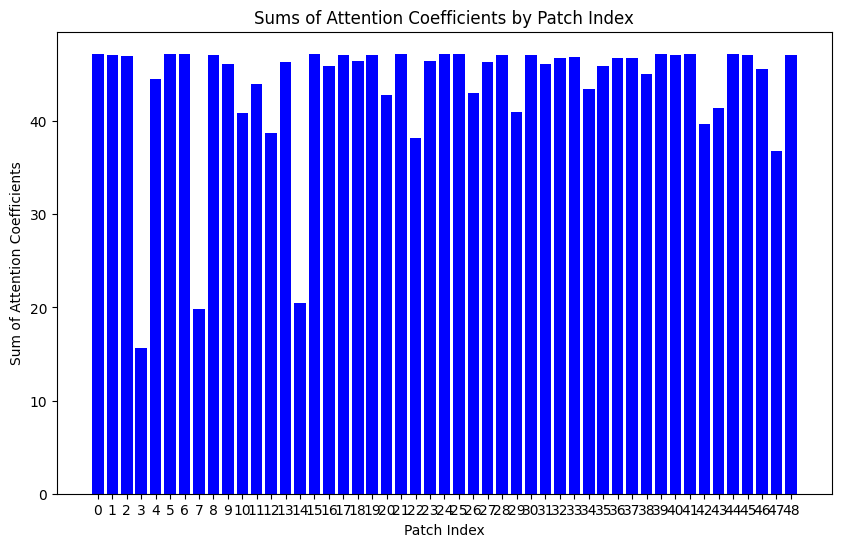

Predicted class for sample 34: 1.0
Row sums: [47.166153 47.102814 46.946217 15.979093 44.65307  47.201042 47.174385
 20.282606 47.12381  45.93148  41.10613  47.192577 47.17518  46.441837
 19.765594 45.411396 47.0755   47.204227 46.031292 46.688324 43.06157
 47.200195 47.102203 46.730503 46.304893 45.453827 40.862614 46.15289
 47.088898 41.290714 47.103073 47.05786  46.96766  46.887413 43.096706
 45.728947 46.84035  40.106564 46.365913 44.01392  47.099564 47.20448
 40.010086 41.67836  47.20068  44.890816 45.707584 36.29482  47.13059 ]


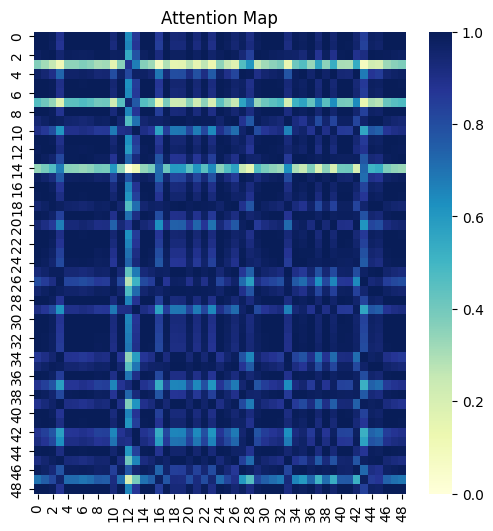

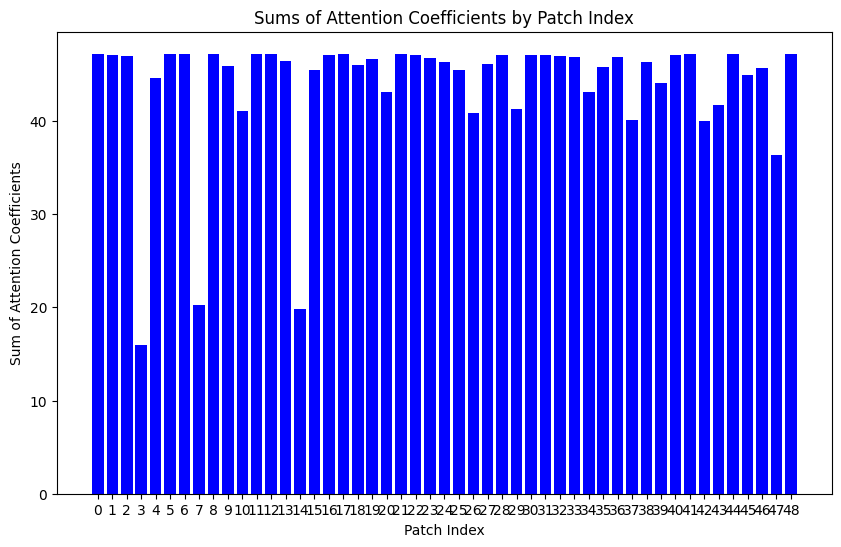

Predicted class for sample 35: 1.0
Row sums: [46.756443 46.723244 46.382614 16.874315 44.628048 46.758858 46.75932
 21.158958 46.735626 45.26295  46.521152 46.373547 46.681046 46.207943
 19.42976  46.760143 45.859806 46.76094  45.888683 46.73991  43.168987
 46.759594 36.95246  46.39954  46.31126  46.139294 43.363983 45.499546
 46.71459  41.519154 46.723404 46.750603 46.4209   46.570137 42.337257
 45.04837  46.533657 40.405552 45.862423 46.01289  46.72125  46.747154
 40.314518 41.882072 46.730778 46.734997 45.572624 35.55306  46.739403]


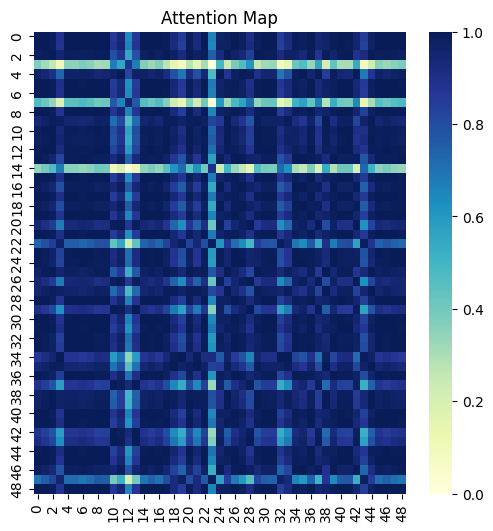

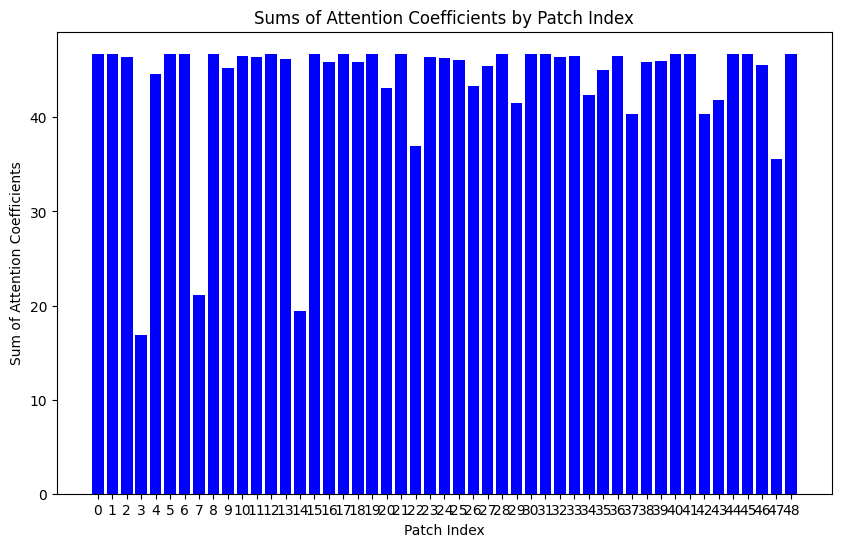

Predicted class for sample 36: 1.0
Row sums: [46.775356 46.74181  46.40276  16.861652 44.64092  46.77811  46.778286
 21.147457 46.754288 45.2831   43.874645 46.781326 46.70076  46.22449
 19.429342 46.779366 45.875416 45.301796 46.64205  46.758617 43.179142
 46.77883  36.966278 46.416683 42.845413 40.662323 43.374485 45.519764
 46.73309  41.5266   46.74197  42.900185 45.44619  46.587906 42.35563
 45.06844  46.55128  40.411312 46.748024 40.76191  46.7398   46.766552
 40.32015  41.890087 46.75029  46.753662 45.587532 35.56563  46.758106]


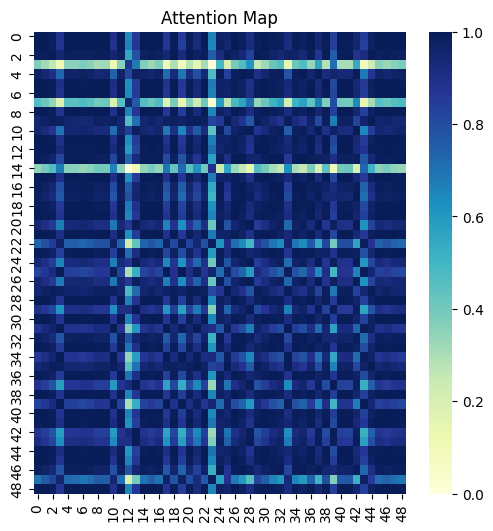

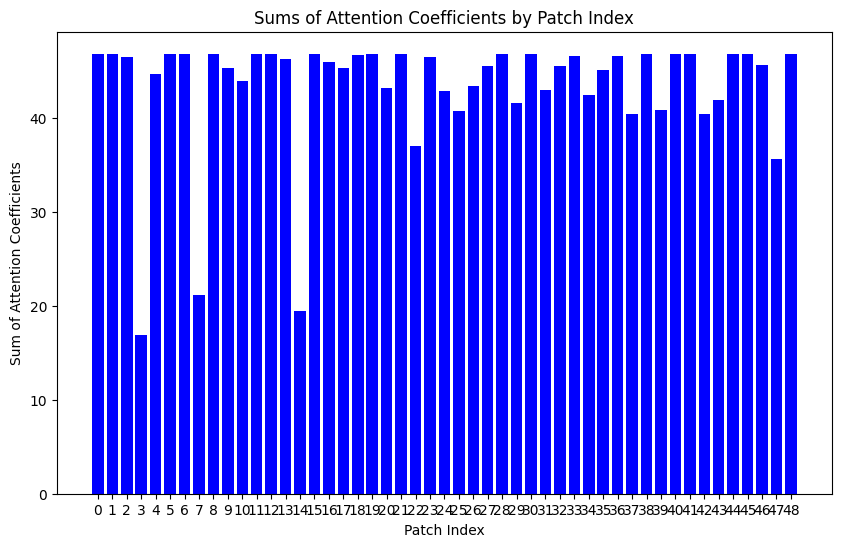

Predicted class for sample 37: 1.0
Row sums: [46.148796 46.096478 45.91318  17.106102 43.8994   46.174294 46.155296
 21.206564 46.114117 46.083824 42.414257 46.16893  46.1395   45.514786
 20.620775 46.173393 46.133816 45.494568 45.973763 46.12053  42.448563
 46.173836 37.31919  45.751324 40.698128 40.837788 42.64136  45.160717
 46.084698 40.826214 46.0967   41.865223 46.087402 45.910084 42.31105
 44.762943 45.868713 39.737774 46.04576  39.833202 46.093735 46.1743
 39.648975 41.181942 46.16816  46.11319  45.93084  36.007614 46.119762]


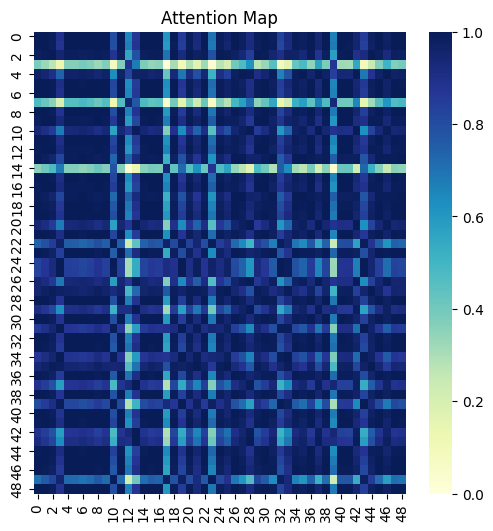

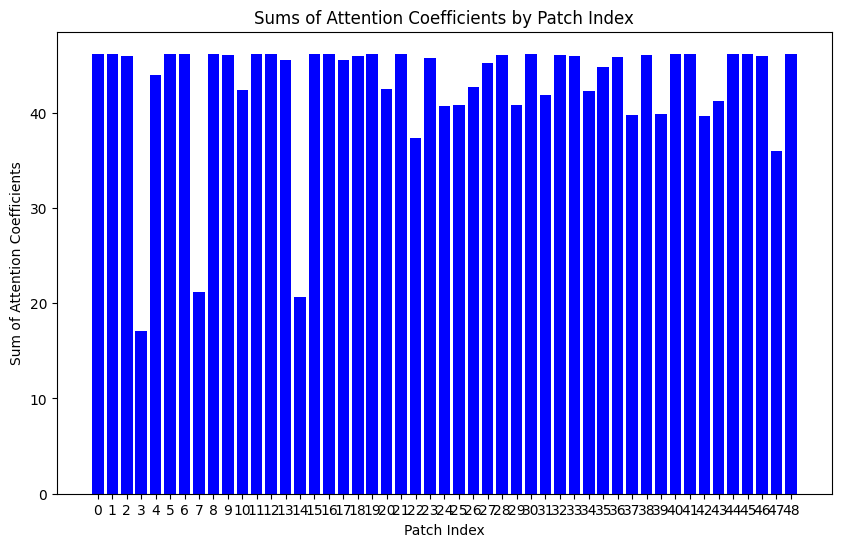

Predicted class for sample 38: 1.0
Row sums: [46.824856 46.784958 46.4867   16.68065  44.614285 46.834576 46.82893
 20.966179 46.799248 45.394028 44.288445 46.83525  46.76866  46.238052
 19.585175 46.8352   45.87756  46.83355  46.677017 46.804287 43.127934
 46.834953 37.133682 46.438065 44.964134 40.905907 43.32621  45.626465
 46.775135 41.453392 46.78514  44.035835 46.582535 46.618195 42.498627
 45.18284  46.57942  40.325466 46.418324 45.39224  46.782684 46.82631
 40.23333  41.821342 46.81281  46.798374 45.581795 35.736027 46.80369 ]


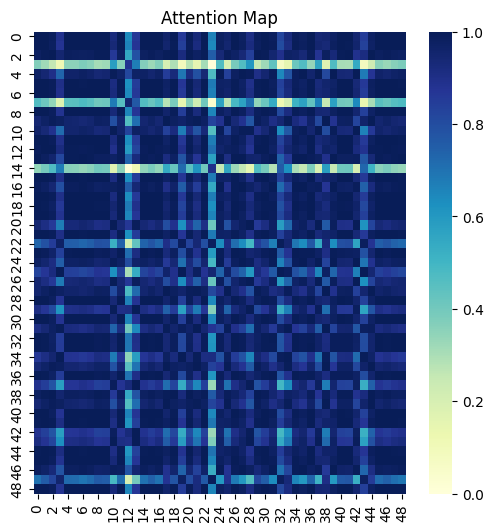

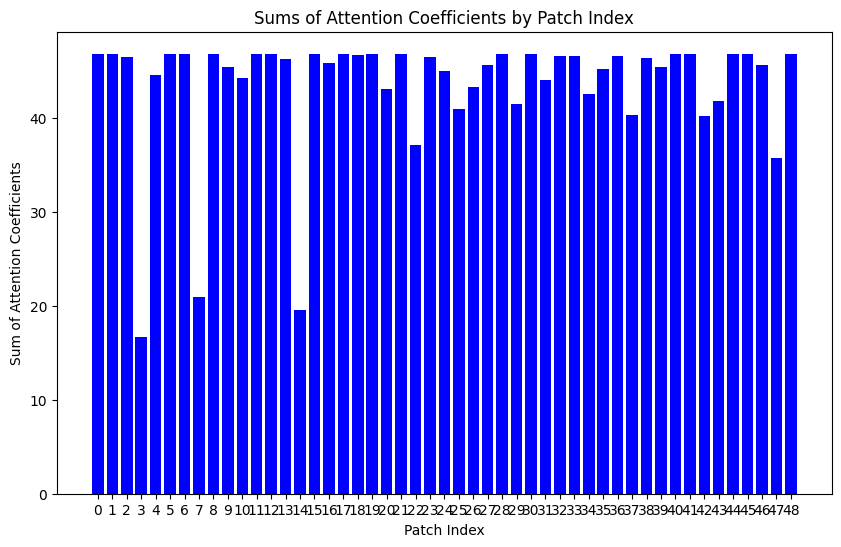

Predicted class for sample 39: 1.0


In [68]:
for i in range(len(X_test)):
    single_sample = torch.tensor(X_test[i:i+1].astype(np.float32))
    with torch.no_grad():
        prediction = attention_model(single_sample).squeeze()
        predicted_class = (torch.round(torch.sigmoid(prediction))).item()
        print(f"Predicted class for sample {i}: {predicted_class}")


Row sums: [46.66297  46.619884 46.34769  16.706085 44.433575 46.67654  46.66765
 20.956196 46.635048 45.280563 46.127792 46.67576  46.617775 46.062057
 19.64621  46.676804 45.699043 45.327026 46.50786  46.640446 42.950256
 46.67672  37.11615  46.26434  46.34805  40.853462 43.147923 45.50848
 46.60954  41.282608 46.620075 43.352604 46.554623 46.447594 42.428024
 45.07325  46.40801  40.16062  41.81454  32.649723 46.617485 46.670223
 40.069004 41.64882  46.65843  46.634262 45.40208  35.72927  46.6398  ]


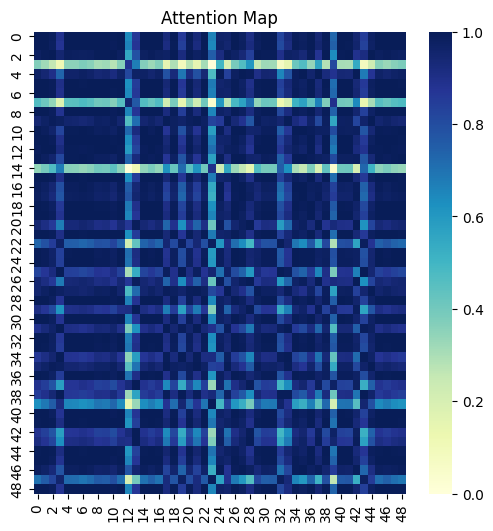

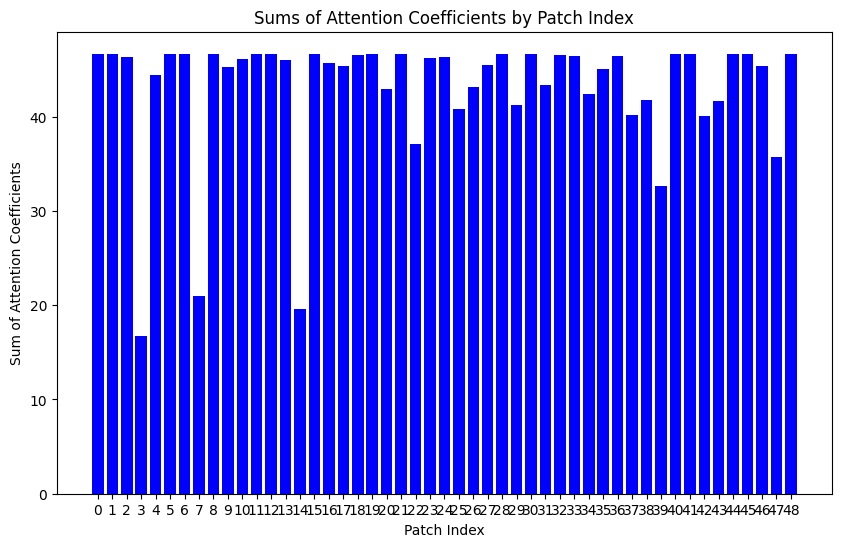

Predicted class for sample 0: 1.0
Row sums: [46.78625  46.73243  46.528225 16.368917 44.424706 46.81152  46.79285
 20.628479 46.75065  45.50485  41.178135 46.79382  46.77184  46.123943
 39.513527 45.621727 43.22457  46.73146  44.799664 46.757267 42.896893
 46.811123 37.42678  46.339725 45.993336 46.51185  43.09993  45.72599
 46.720226 41.188473 46.732655 46.759502 46.732582 46.53827  42.70269
 45.30309  46.495    40.04259  46.584362 45.95195  46.729584 46.810715
 39.949123 41.563034 46.803524 46.749695 40.24183  36.043823 46.756477]


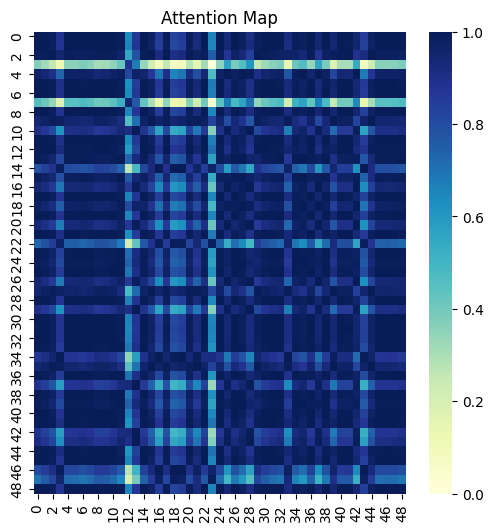

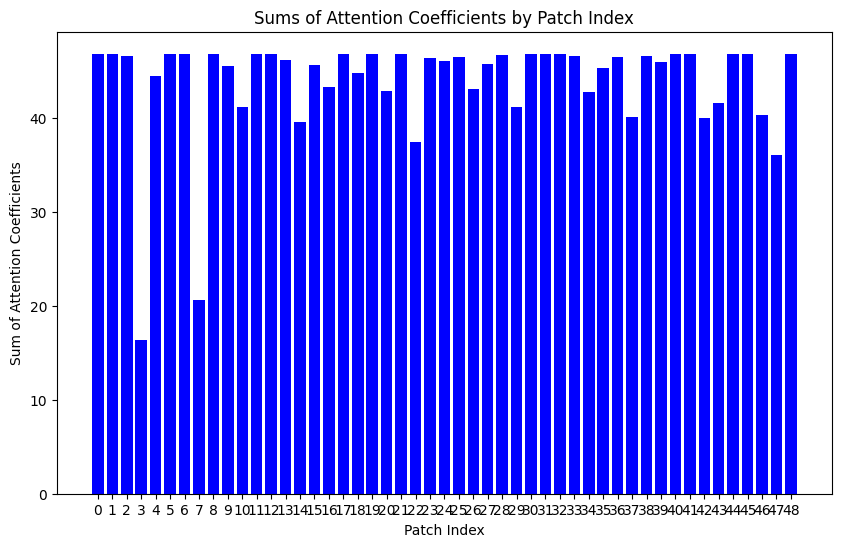

Predicted class for sample 1: 1.0
Row sums: [46.878506 46.812855 46.68438  16.08559  44.376278 46.916733 46.88723
 20.336021 46.834442 45.71031  40.87466  45.19202  46.898308 46.1494
 20.165329 46.914764 45.74542  46.90961  45.46113  46.842396 42.8041
 46.91569  37.724022 46.379684 46.90993  44.651714 43.0124   45.923813
 46.798607 41.05673  46.844734 45.650616 46.551277 46.594776 42.96409
 45.51479  46.54751  46.182156 45.95689  46.917847 46.809525 46.92205
 39.79372  41.439125 46.919987 46.833305 45.420113 36.343803 46.841442]


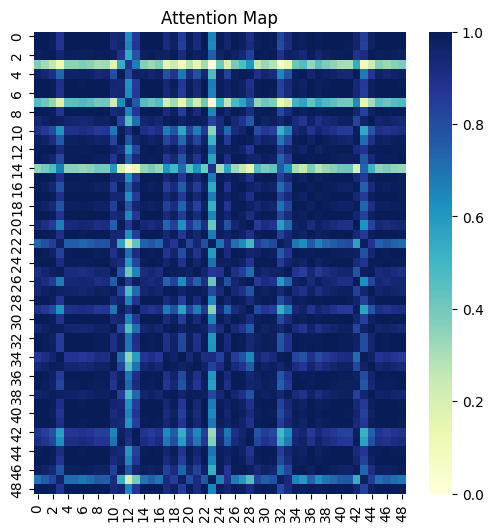

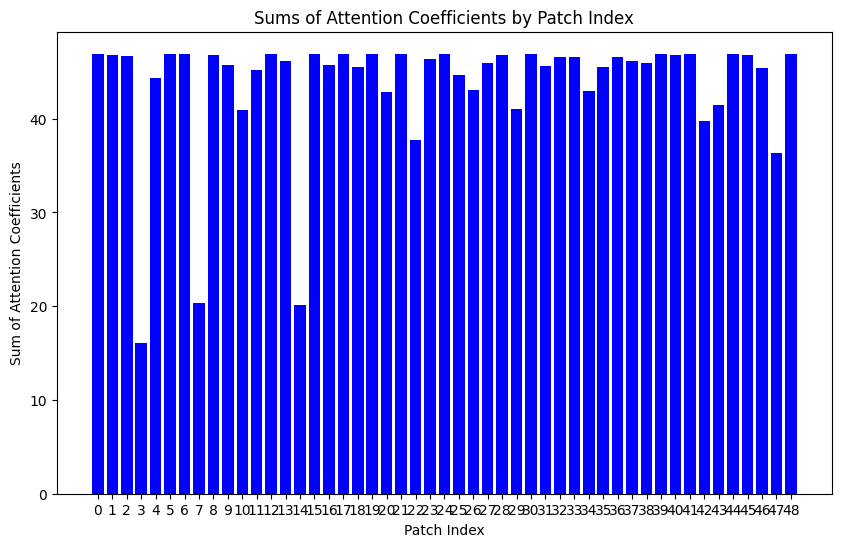

Predicted class for sample 2: 1.0
Row sums: [46.54682  46.535137 46.058094 17.421814 44.67915  46.52575  46.54584
 21.714886 46.52151  46.489304 27.79644  46.53625  46.409615 46.12081
 18.98956  46.20612  42.13639  46.100727 43.0241   46.54324  43.30462
 46.527645 36.389404 46.285618 46.384556 46.472546 46.523994 44.97864
 46.53021  44.14657  45.172703 41.87221  45.707462 46.467278 41.83037
 44.626175 46.396637 40.659554 46.45883  38.864147 46.534035 46.50298
 40.57181  42.077785 46.477352 46.541103 45.55179  34.986996 46.54303 ]


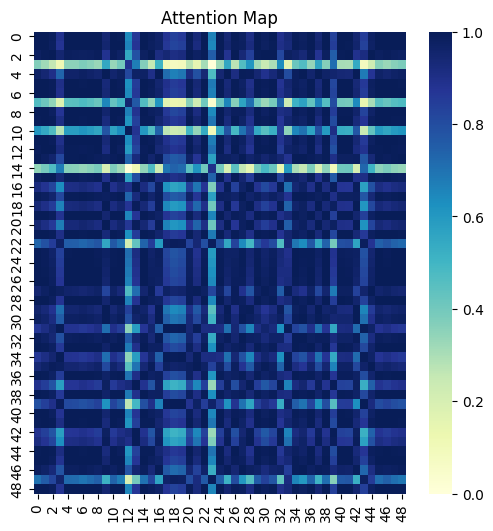

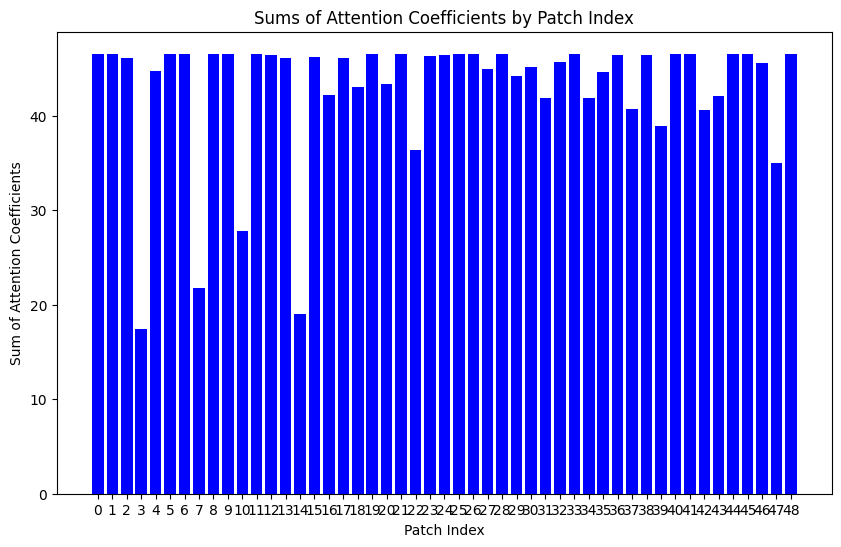

Predicted class for sample 3: 1.0
Row sums: [47.007244 46.950275 46.759457 16.243668 44.587505 47.035553 47.014378
 20.522913 46.96943  45.733864 42.098396 44.282597 46.999847 46.322746
 19.921352 47.034508 45.930775 46.98965  46.14574  46.976406 43.03246
 47.035015 37.5823   46.544228 47.01228  43.713333 43.238956 45.9561
 46.93749  41.296406 46.961098 46.270065 46.70761  46.748688 42.90989
 45.53095  46.704044 43.384113 46.84915  47.03607  46.947292 47.036026
 40.03835  41.676826 47.029827 46.96843  45.61317  36.18534  46.97557 ]


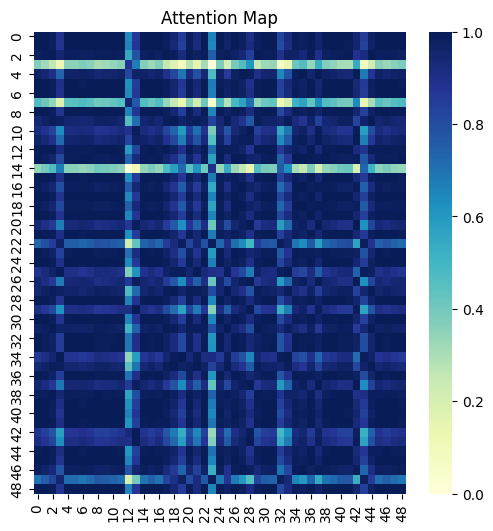

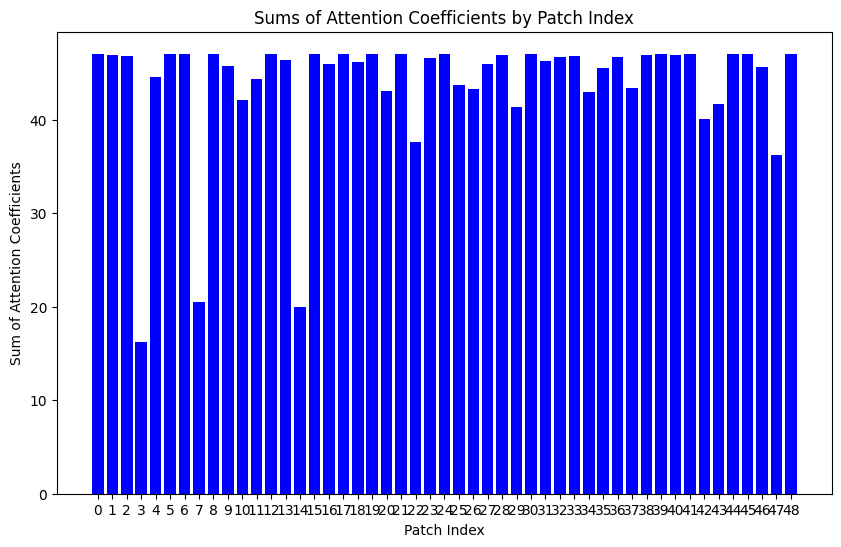

Predicted class for sample 4: 1.0
Row sums: [46.74139  46.659588 46.643955 15.757948 44.075245 46.797897 46.75307
 19.968906 46.68572  45.758533 40.501507 46.712616 41.461113 45.927036
 20.598461 46.79425  45.49898  46.80444  45.554226 46.69549  42.46336
 46.795944 38.034184 46.09256  45.466515 41.708336 42.676075 45.957256
 46.64259  40.686092 46.74983  45.766277 46.362114 46.41027  43.1398
 45.575447 46.35787  46.329006 46.55888  46.80011  46.655598 46.812073
 39.407433 41.0741   46.81754  46.684326 45.157852 36.678295 46.694313]


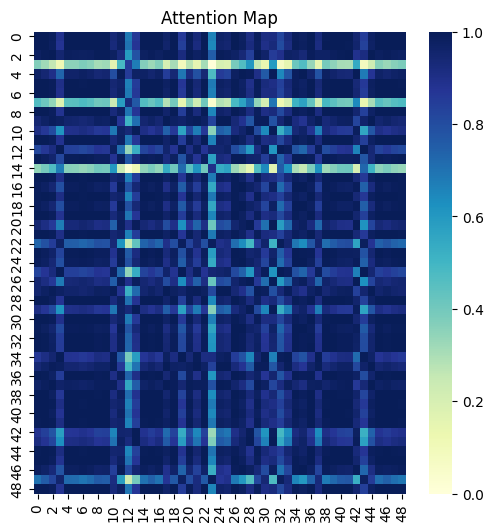

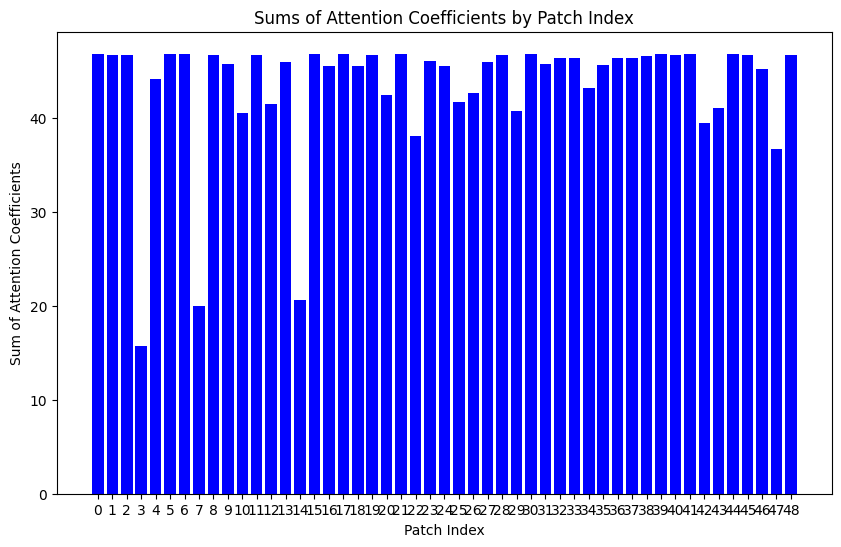

Predicted class for sample 5: 1.0
Row sums: [46.70847  46.664448 46.39751  16.64083  44.464592 46.72301  46.713306
 20.902363 46.67988  45.33298  42.035233 46.72188  46.665733 46.10166
 19.69679  46.723183 45.736443 46.721012 45.36305  46.685387 42.97476
 46.72314  37.17171  46.30536  43.482204 42.894306 43.173264 45.560535
 46.653934 41.30027  46.664642 45.208225 44.633705 46.490128 42.48268
 45.125957 46.450188 40.173847 46.17646  39.042706 46.662006 46.717136
 40.081867 41.66796  46.7057   46.67889  45.437855 35.784813 46.68473 ]


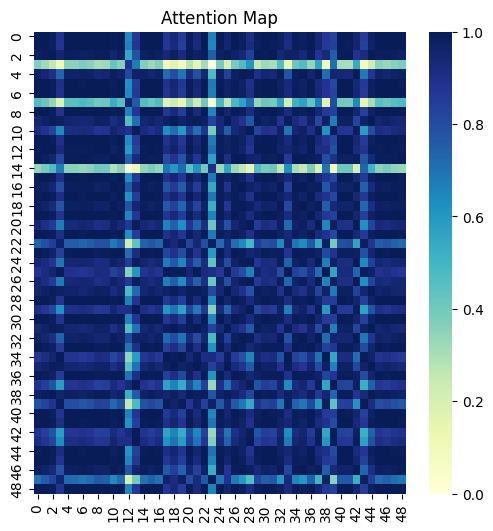

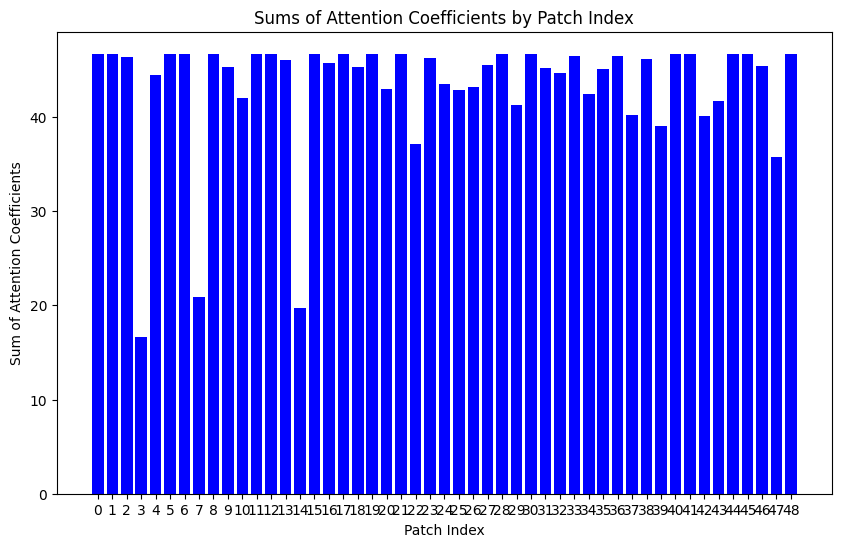

Predicted class for sample 6: 1.0
Row sums: [47.168358 47.121548 46.85463  16.323473 44.83766  47.18486  47.173595
 20.657309 47.13787  45.761024 41.387882 47.18315  47.128178 46.53443
 19.403706 46.500687 45.69481  46.63022  46.617424 46.033188 43.297363
 46.5637   38.77558  46.914494 46.37323  47.173363 43.90295  45.99513
 47.110466 41.5687   47.121758 47.172077 47.184853 45.64921  42.824787
 45.547962 46.89719  40.40706  46.98303  46.476395 47.134605 47.179504
 40.312252 41.948086 47.168285 47.137028 47.093716 35.92243  47.14301 ]


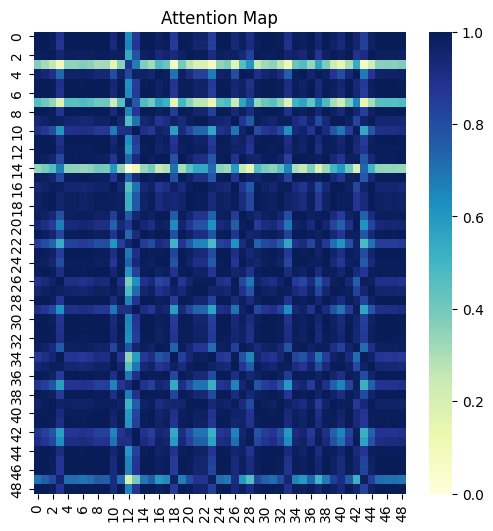

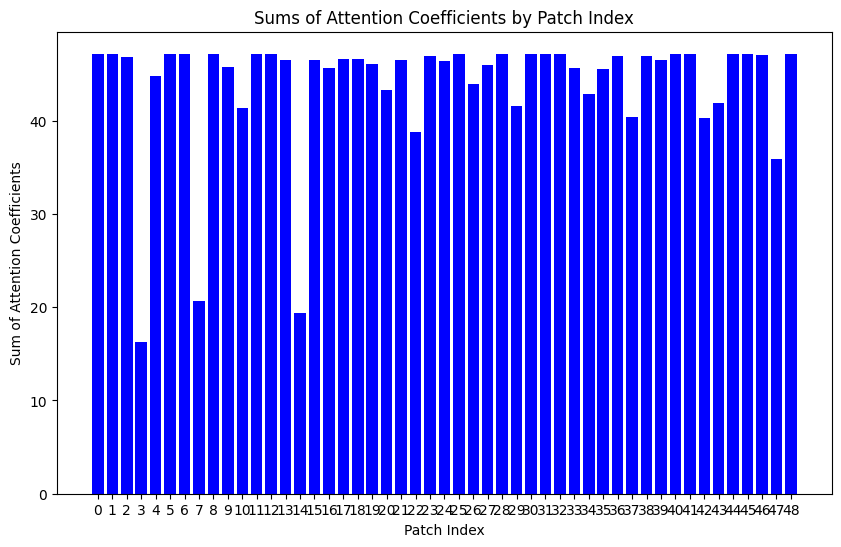

Predicted class for sample 7: 1.0
Row sums: [46.63515  46.593037 46.31472  16.692282 44.41688  46.647648 46.639652
 20.94437  46.607925 45.24419  41.09679  46.647263 46.58715  46.03972
 19.655363 46.323162 44.587425 28.303246 45.355694 46.571503 42.93655
 46.647877 45.755898 46.24083  45.918774 45.971783 45.055367 45.472576
 46.582867 41.271175 46.59323  45.204308 42.682175 46.422726 42.38987
 45.036526 46.383472 46.291862 41.294952 46.64725  46.590683 46.64083
 40.058758 41.636963 46.63629  46.60716  45.382553 35.698235 46.612587]


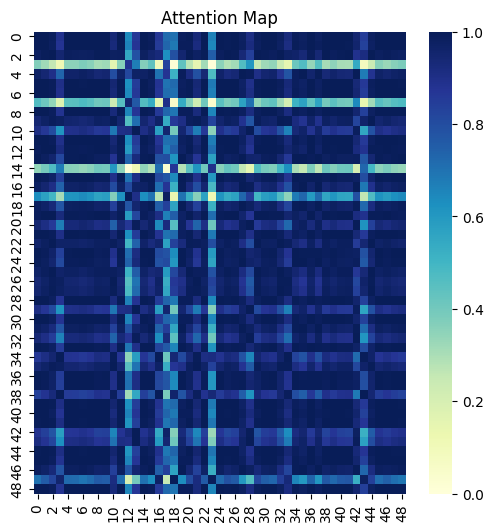

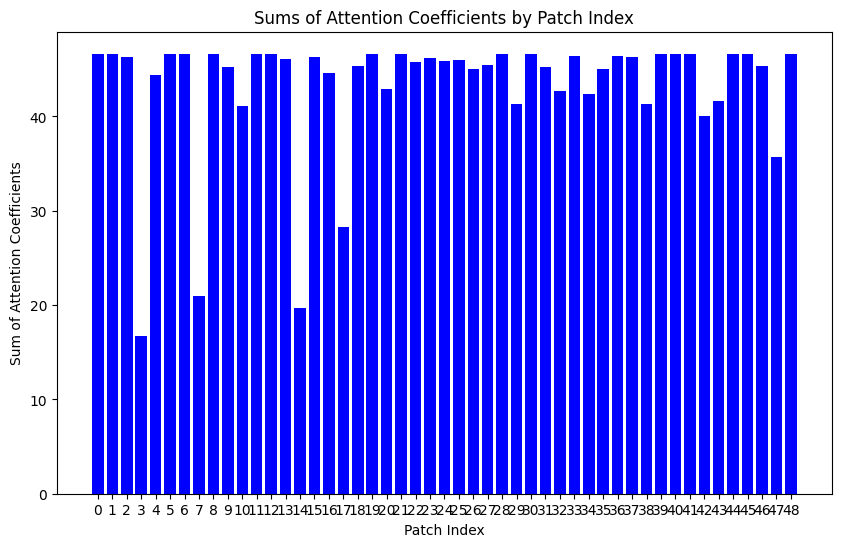

Predicted class for sample 8: 1.0
Row sums: [46.562714 46.557873 46.034298 17.585558 44.76878  46.53398  46.560486
 21.887571 46.562195 46.376457 21.760143 46.54799  46.40488  46.173683
 18.803474 46.52722  43.854404 46.562515 44.18215  46.563267 43.414482
 46.53626  36.23523  46.330788 46.077145 46.435257 43.597057 45.048595
 46.554115 41.85662  46.557938 46.536087 46.501377 46.46194  41.723785
 44.56274  46.435005 40.794983 46.388664 40.448303 46.55705  46.507523
 40.70791  42.20104  46.47878  46.310425 43.931477 34.82466  46.563156]


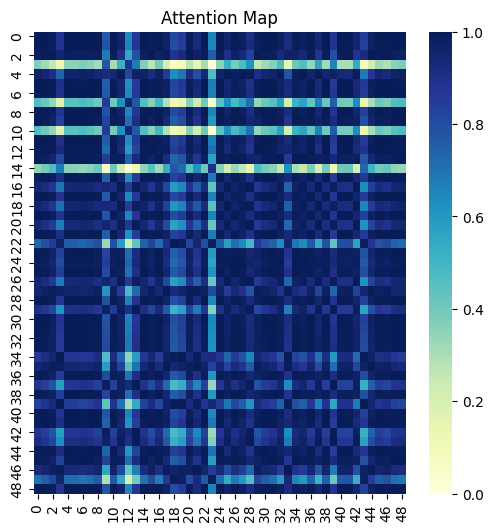

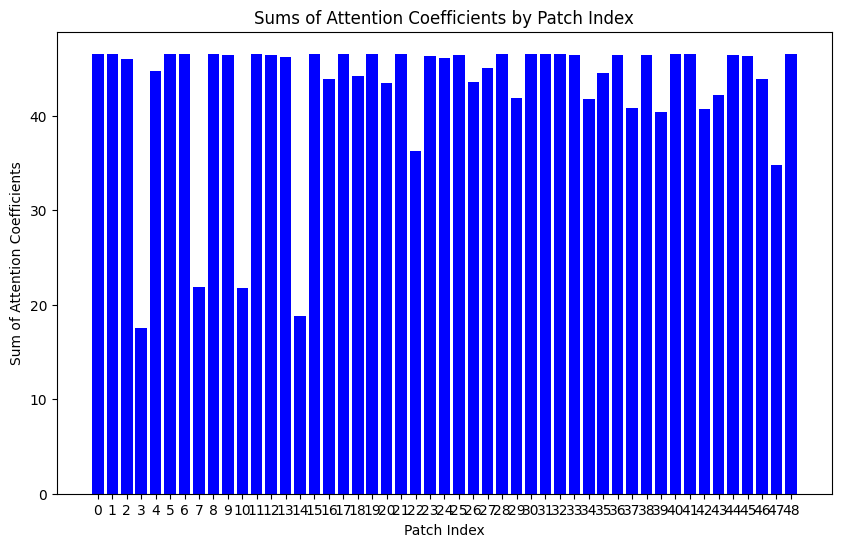

Predicted class for sample 9: 1.0
Row sums: [47.39016  47.37975  46.862465 17.073902 45.439747 47.365726 47.388767
 21.492851 47.385807 45.577873 42.169964 47.379112 47.239338 46.950638
 18.496244 46.5748   46.0056   47.381985 44.41455  44.475117 43.99684
 46.923843 42.17436  47.29821  46.802475 47.36802  47.33272  45.8435
 47.37487  42.344215 47.37983  47.38931  44.88852  47.267998 42.375385
 45.33841  47.23785  41.221104 47.29874  46.730278 47.378662 47.340622
 41.129093 42.709072 47.31266  47.385536 46.328053 35.158512 47.38735 ]


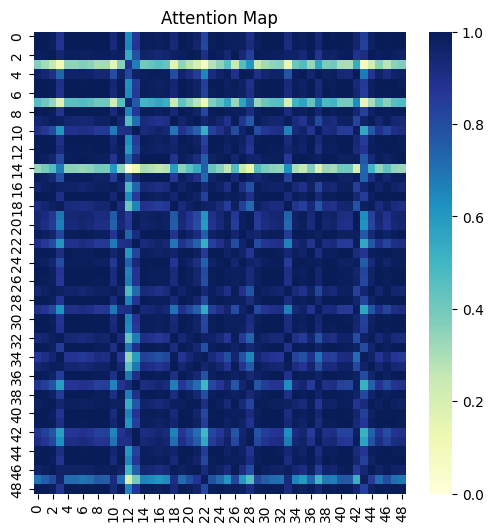

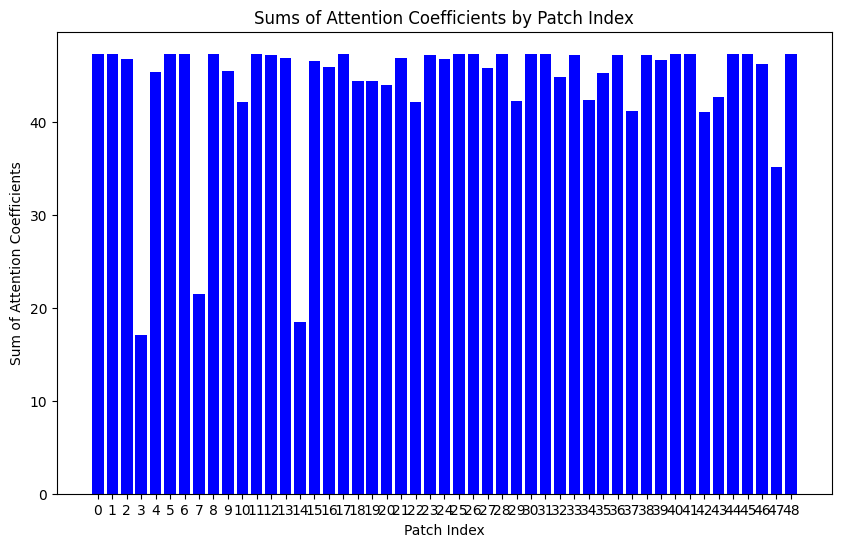

Predicted class for sample 10: 1.0
Row sums: [47.14806  47.149364 46.56631  17.534485 45.364174 47.111347 47.14461
 21.927391 47.004044 41.136536 29.918951 46.493797 38.972366 46.78053
 18.538168 47.03423  42.541977 47.00008  45.785667 47.139122 43.98517
 47.114056 36.364952 46.921967 45.147366 45.05808  46.873203 45.52304
 47.146564 42.393356 47.149925 37.470577 47.030197 45.214996 42.049168
 45.012573 46.317883 47.151684 47.13798  47.13412  47.14877  47.080658
 41.217587 44.533318 46.398678 47.151955 46.22873  34.910416 47.152412]


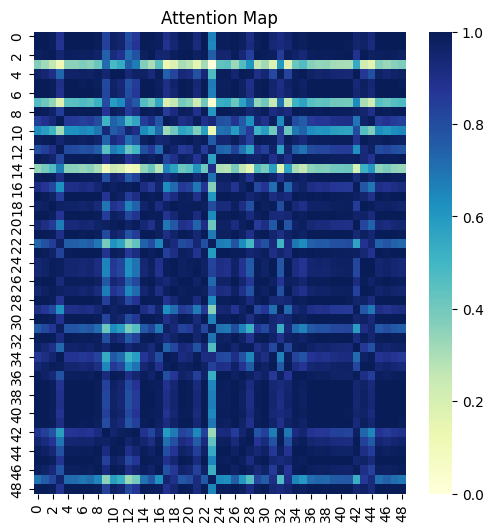

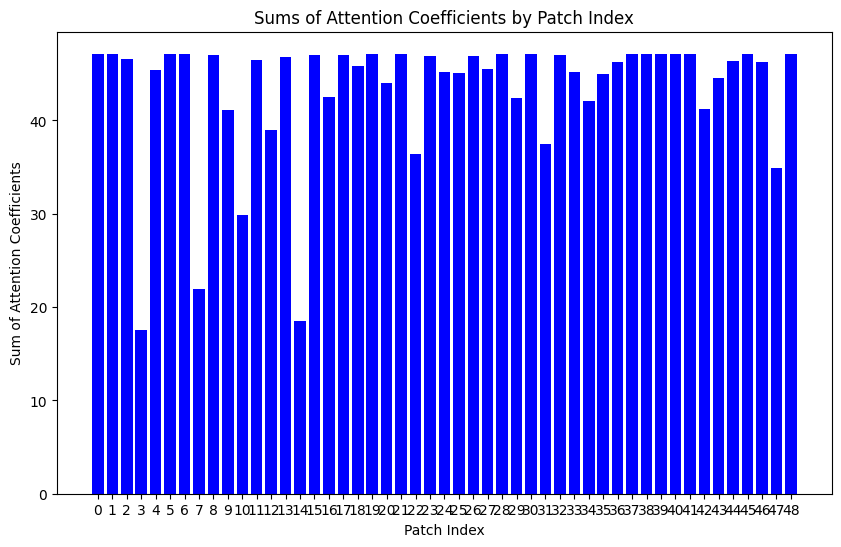

Predicted class for sample 11: 1.0
Row sums: [46.359894 46.36002  45.81036  17.749815 44.642593 46.326065 46.356804
 22.036974 46.362896 46.361835 20.884295 46.34044  46.18947  46.002632
 18.759346 46.334286 41.46286  46.28875  45.285892 46.363407 43.32002
 46.328587 36.046722 46.152103 45.956364 45.400112 43.49863  44.81744
 46.35715  41.793186 46.360065 46.362568 43.04265  46.27502  41.49932
 44.330753 46.250027 40.750538 46.350376 41.99216  46.35941  46.29734
 40.66496  42.131104 46.26676  45.27037  45.472248 34.647232 46.36336 ]


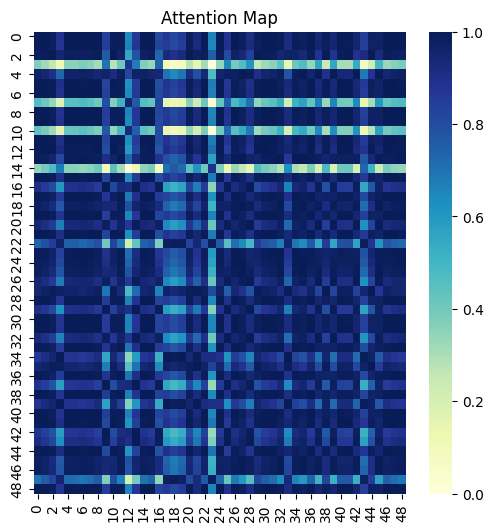

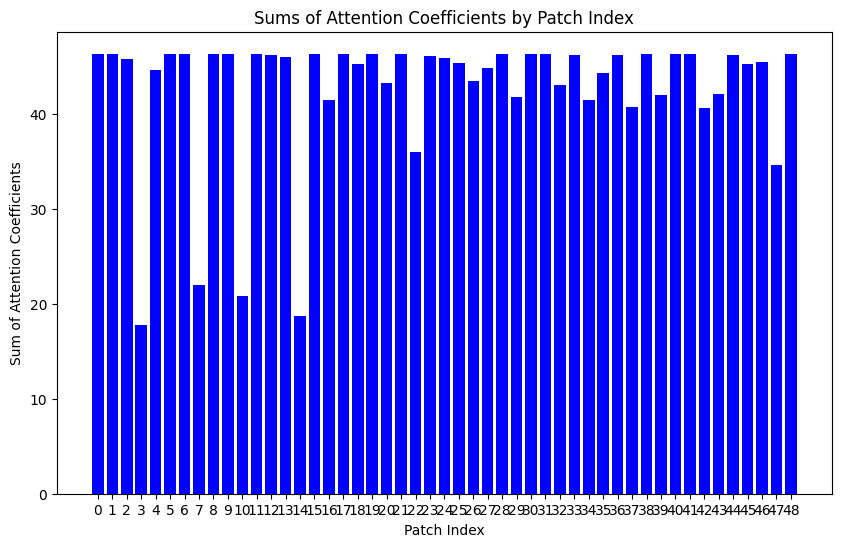

Predicted class for sample 12: 1.0
Row sums: [46.914093 46.891804 46.452755 16.07557  44.82801  46.902798 46.91484
 20.543213 46.90123  45.22246  41.4764   46.91136  46.7983   46.40884
 36.20214  42.97429  46.9047   46.86018  46.77561  46.91339  43.343605
 46.910442 46.91195  45.866486 43.032852 46.105125 38.343163 45.47947
 46.884884 41.654118 46.891926 46.85061  46.682533 46.756374 42.085587
 44.99009  46.722298 40.509716 46.539062 46.070908 46.890232 46.883957
 40.41605  42.02646  46.86127  45.630287 40.09471  34.91362  46.90395 ]


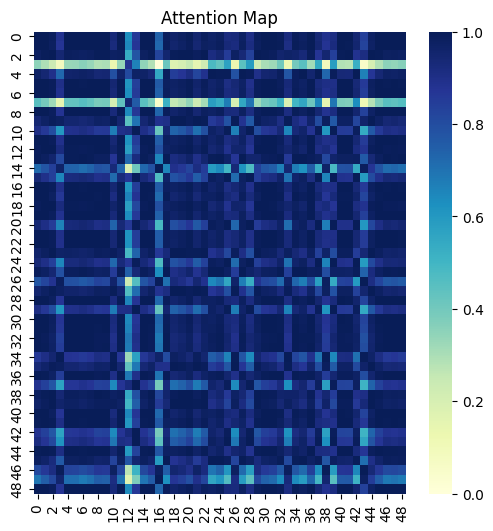

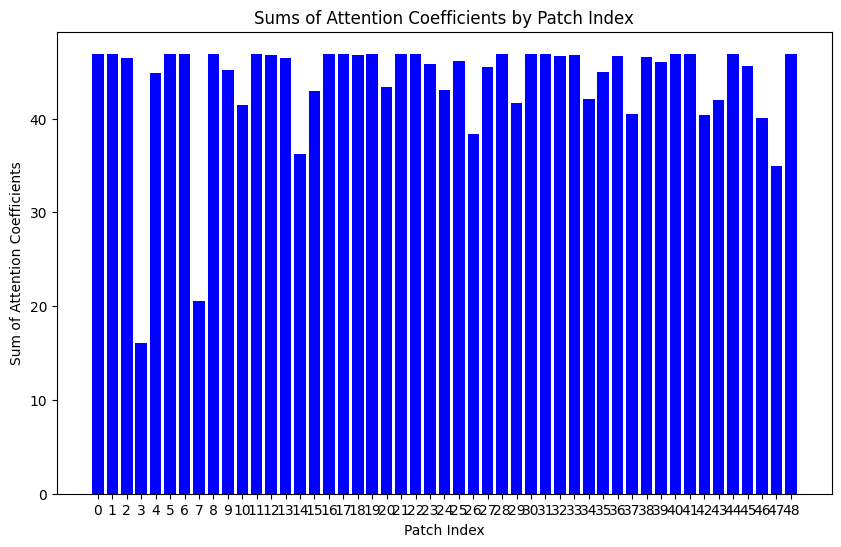

Predicted class for sample 13: 1.0
Row sums: [46.90593  46.85104  46.64602  16.157377 44.50895  46.931908 46.91268
 20.451162 46.86961  45.60946  41.048706 46.92666  46.892254 46.232746
 19.69898  37.218803 46.848007 46.93209  44.58669  46.141033 42.96029
 46.931488 38.124123 46.485294 45.989185 45.819145 45.127747 45.83354
 46.838615 41.22945  46.851273 46.37474  44.57226  46.653557 42.768867
 45.40499  46.60959  45.843025 42.506466 46.932285 46.848152 46.93126
 39.974346 41.60886  46.038475 46.900867 45.528816 36.01784  46.875546]


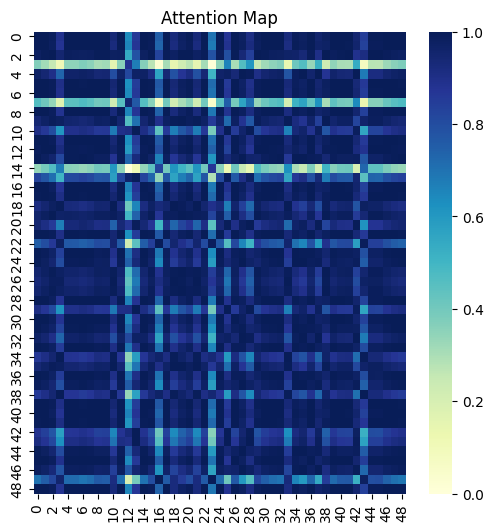

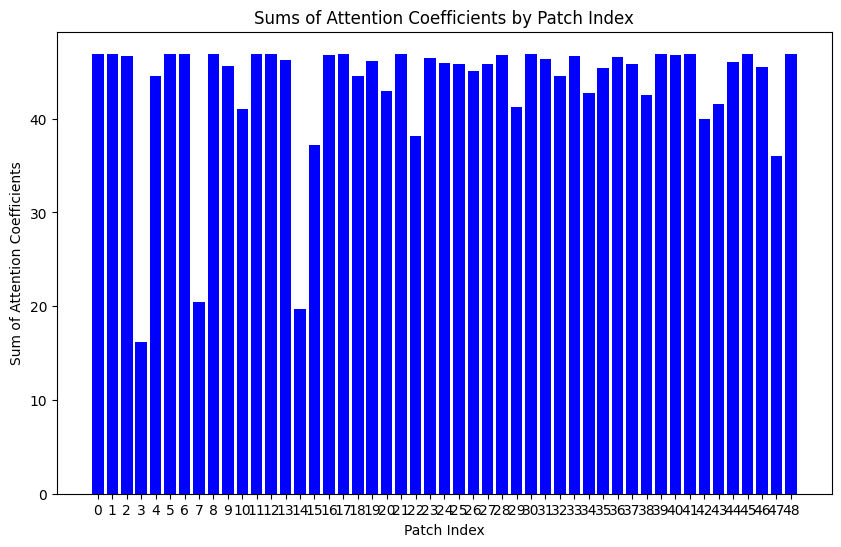

Predicted class for sample 14: 1.0
Row sums: [46.6591   46.617374 46.33663  16.713537 44.445473 46.67119  46.663536
 20.97073  46.63215  46.19657  24.258785 46.247944 46.610016 46.065838
 19.647013 46.669655 42.8758   46.66821  45.793884 46.637394 42.966625
 46.67144  37.095947 46.26647  46.295578 46.272163 43.16378  45.49307
 46.607265 41.302483 46.61756  46.207134 46.46874  46.44783  42.407413
 45.0565   46.408703 40.18225  46.47808  46.67076  46.615032 46.664173
 40.090755 41.66803  46.651794 46.639652 45.409855 35.710014 46.636772]


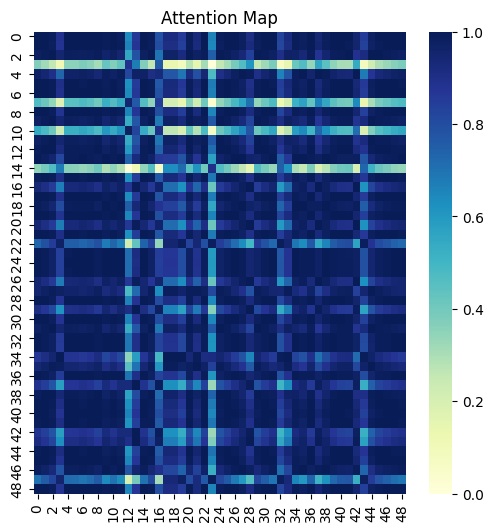

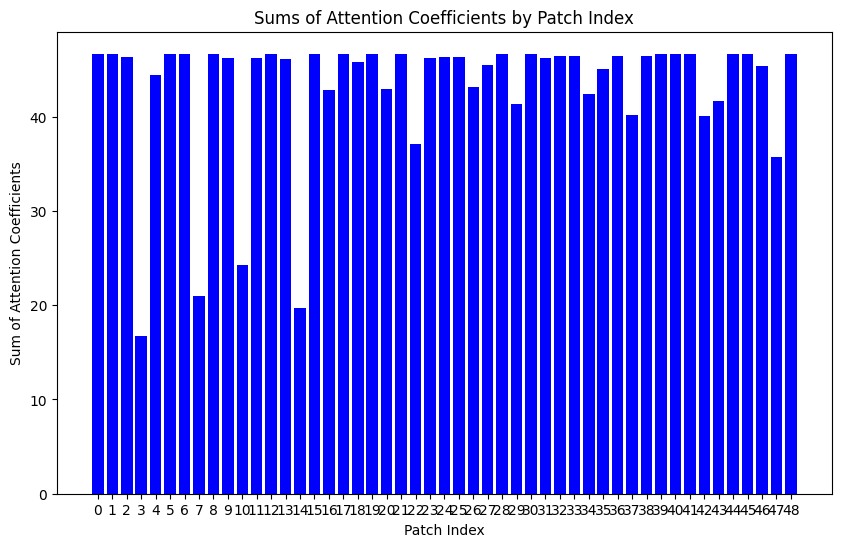

Predicted class for sample 15: 1.0
Row sums: [47.380035 47.312325 47.159042 14.700705 44.733234 47.418182 47.38892
 19.187891 47.3347   46.10796  41.160507 47.108574 45.78304  46.614265
 19.013878 47.41633  46.18659  47.40895  45.809772 47.376965 43.061302
 47.41721  37.578613 45.788303 42.240376 42.193054 43.28292  46.33761
 47.297516 41.20156  47.403797 39.776875 47.038372 47.084118 43.165653
 45.897835 47.03441  46.643887 47.165676 47.419216 47.30887  47.422577
 39.856922 41.608627 47.419292 47.333523 45.84167  36.110973 47.341938]


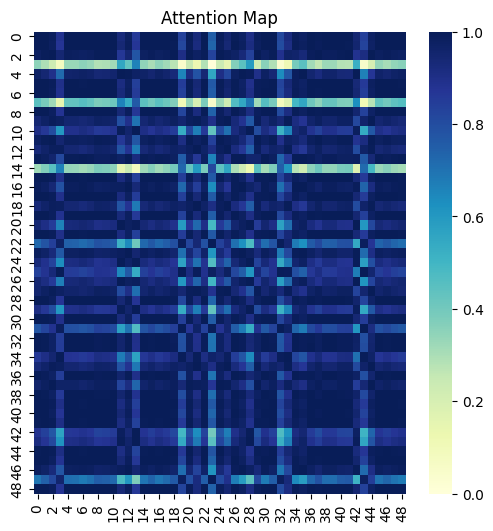

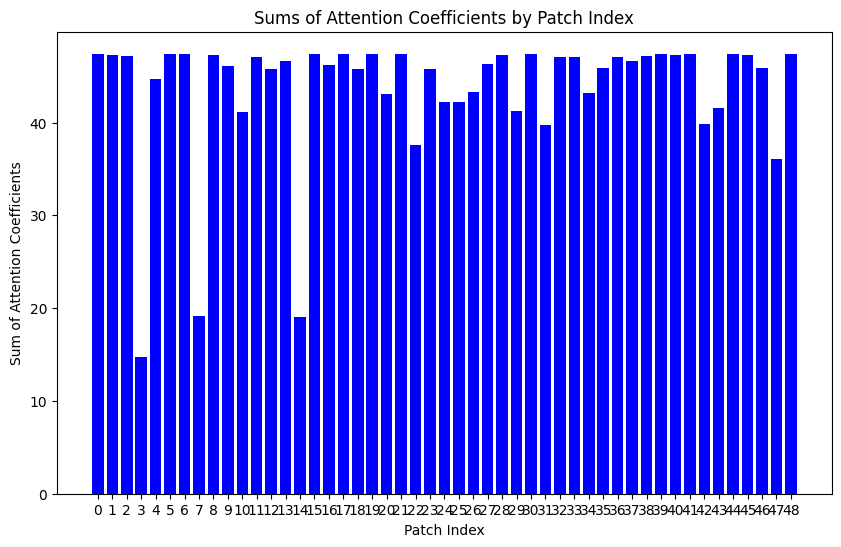

Predicted class for sample 16: 1.0
Row sums: [47.38313  47.33897  47.05144  16.357338 45.068222 47.396492 47.38788
 20.71962  47.35456  45.939953 41.60715  47.395023 46.658707 46.984524
 19.607645 47.396835 46.3841   47.32957  47.37594  47.390953 42.769707
 47.39671  37.490494 46.517742 47.05202  44.208992 43.730373 46.17704
 47.32832  41.788853 47.391197 47.323345 47.123245 47.16095  42.979675
 45.724392 46.170708 45.16173  47.20428  47.396095 47.3365   47.389557
 40.52575  46.348465 47.376972 47.35376  46.07547  36.06145  47.359444]


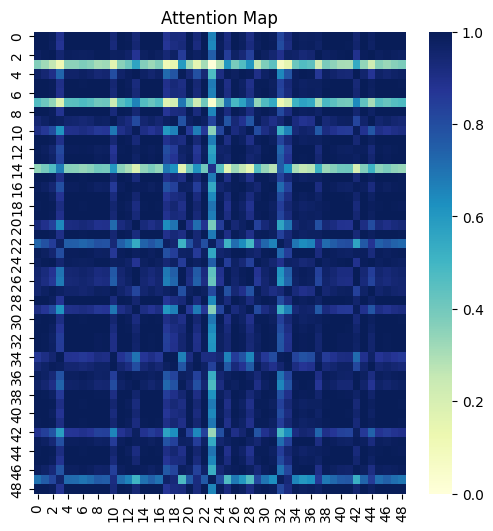

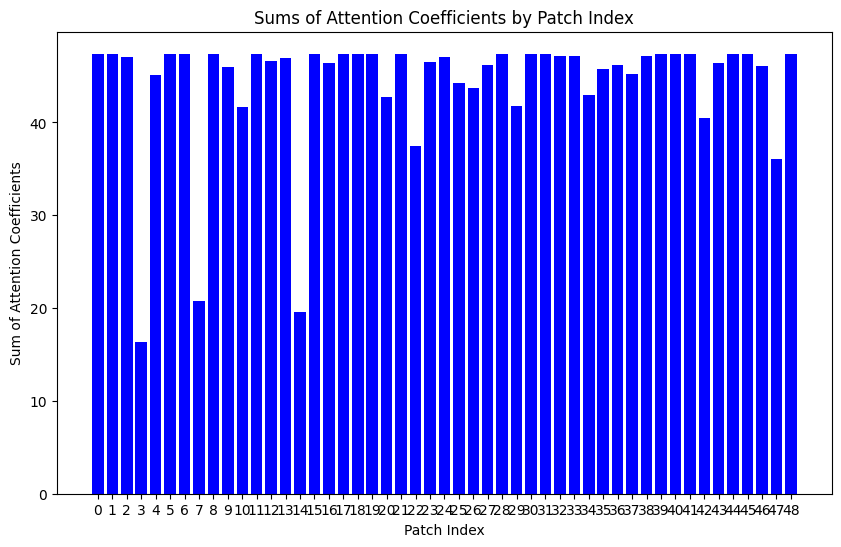

Predicted class for sample 17: 1.0
Row sums: [46.823772 46.764072 46.59817  16.225863 44.393894 46.855537 46.83144
 20.48239  46.783962 45.600796 40.93833  46.714027 44.684223 46.1286
 20.061497 46.85415  45.73552  46.85773  45.268696 46.79125  42.845123
 46.854816 37.577976 46.35145  46.516495 46.358894 43.05064  45.81783
 46.75085  41.118473 46.791946 45.693546 46.516476 46.558098 42.830048
 45.40241  46.512867 46.85773  46.6414   46.856266 46.760983 46.857803
 39.868107 41.49669  46.8532   46.78292  45.417744 36.197807 46.790375]


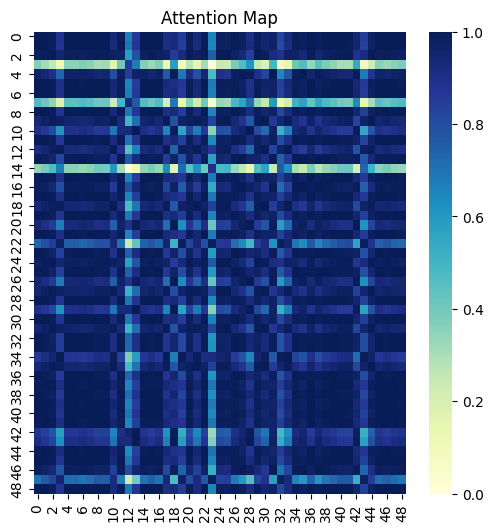

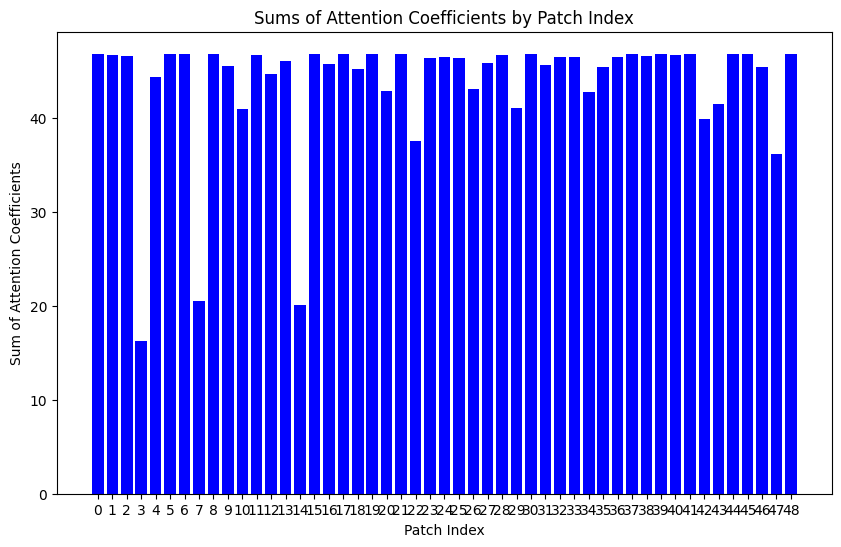

Predicted class for sample 18: 1.0
Row sums: [46.892162 46.84629  46.58546  16.521606 44.607903 46.90837  46.897305
 20.80603  46.86228  45.51599  44.938198 41.129036 46.85298  46.271095
 19.705902 46.90841  45.89951  46.908382 45.394814 46.868    43.097065
 46.90843  37.292854 46.478657 45.645836 41.05881  43.298275 45.744907
 46.835434 41.400448 46.869286 41.285408 46.62977  46.667328 42.64512
 45.307655 46.6265   40.363194 35.493042 46.908176 46.843773 46.90315
 40.166676 41.77289  46.892323 46.87019  45.596024 35.895416 46.86732 ]


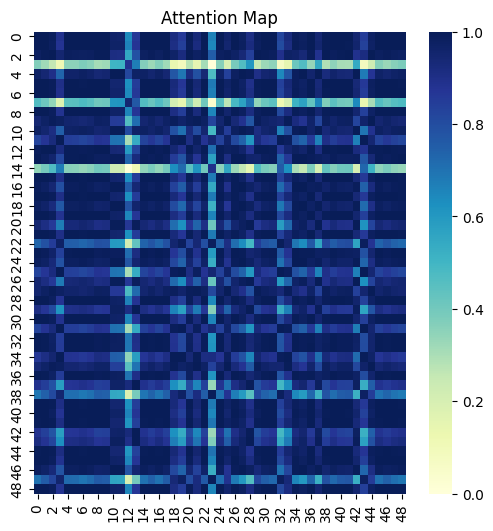

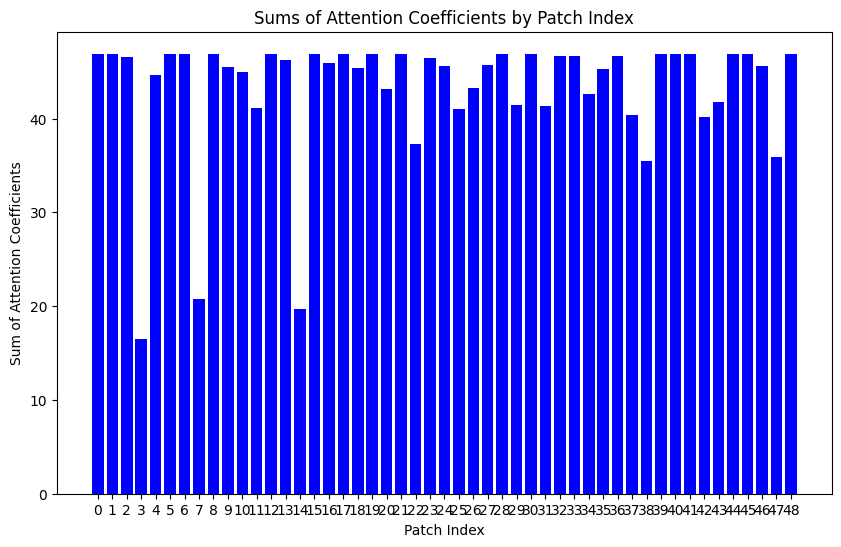

Predicted class for sample 19: 1.0
Row sums: [46.609642 46.590508 46.17408  17.84128  44.691868 46.59751  46.610065
 22.0416   46.598816 45.84993  25.70817  46.60256  46.49796  46.14972
 19.844265 42.44719  37.39317  46.088364 44.25282  46.60149  43.318336
 46.59895  36.7059   45.62734  46.39669  46.595535 46.549606 45.26754
 46.584362 41.781948 46.05092  32.183495 46.310535 46.468277 42.117905
 44.81271  46.43696  40.690044 45.874554 46.595684 46.589115 46.579266
 40.60307  42.097572 46.557583 46.093884 45.57019  35.472206 46.60118 ]


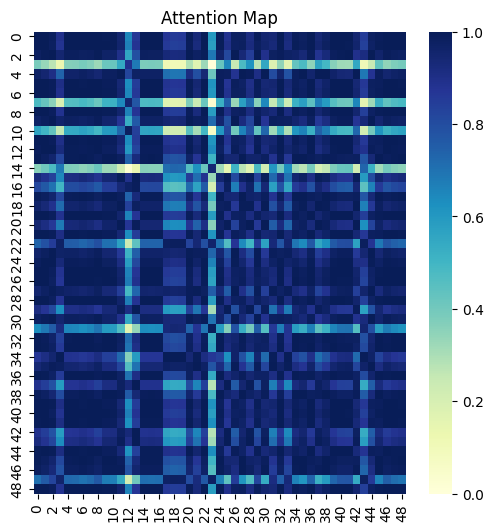

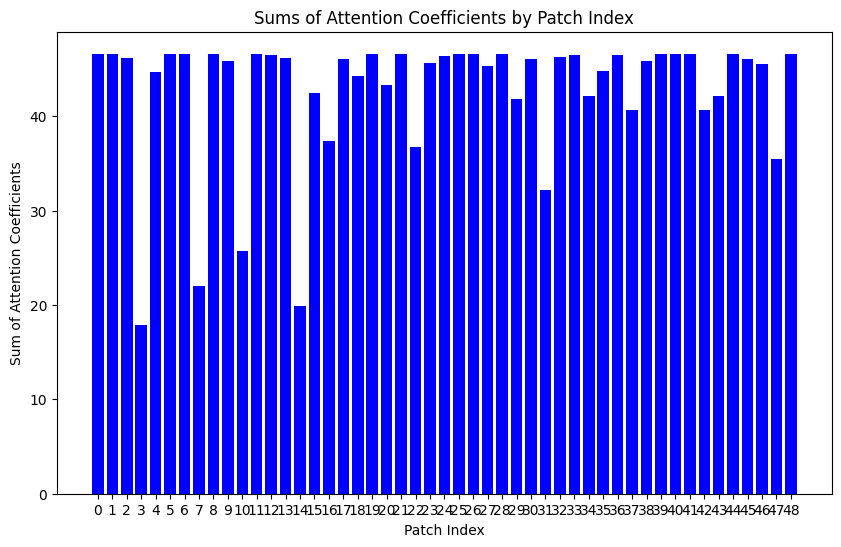

Predicted class for sample 20: 1.0
Row sums: [46.805225 46.759968 46.498013 16.535429 44.536068 46.820934 46.81027
 20.813742 46.77577  46.39133  43.393456 44.069485 46.765137 46.189304
 19.739794 46.821014 45.819733 46.753765 46.797733 46.781418 43.03314
 46.821014 37.24913  46.395416 46.10167  46.675335 43.23334  45.660458
 46.749226 41.344692 46.76696  46.82058  46.545387 46.58265  42.574867
 45.225037 46.54214  46.493206 46.63043  46.820717 46.757473 46.815544
 40.11648  41.715393 46.786606 46.801327 45.518524 35.85862  46.780746]


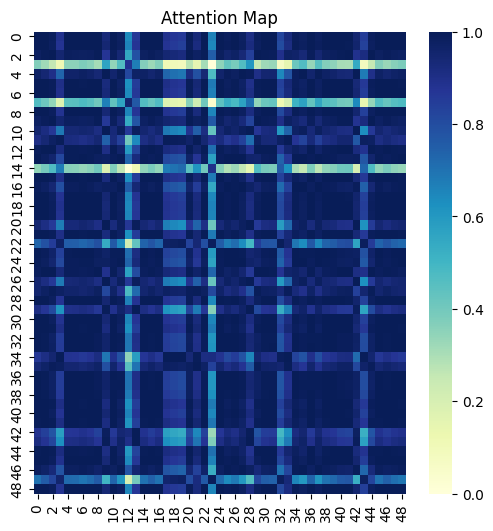

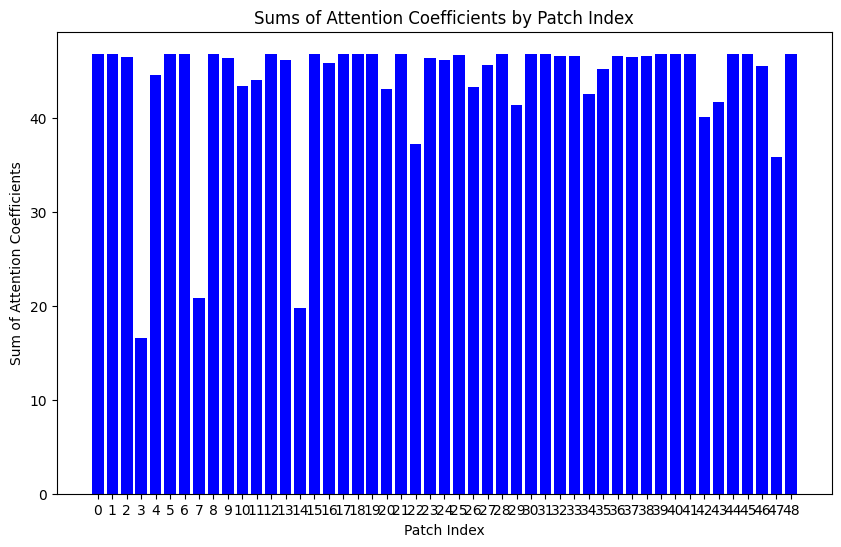

Predicted class for sample 21: 1.0
Row sums: [46.627182 46.57565  46.361073 16.515501 44.307766 46.65022  46.633396
 20.749859 46.5932   45.33732  45.157223 46.64595  46.607506 45.980816
 19.865685 46.649612 45.604496 46.60513  46.45172  46.599552 42.800365
 46.64992  37.292507 46.19252  43.10862  40.992138 43.000782 45.558105
 46.563866 41.113293 46.575874 45.98039  46.544228 46.38682  42.544647
 45.13597  46.34454  39.981133 46.358902 32.990833 46.57291  46.648457
 39.888767 41.483276 46.640514 46.592285 45.298637 35.91594  46.59879 ]


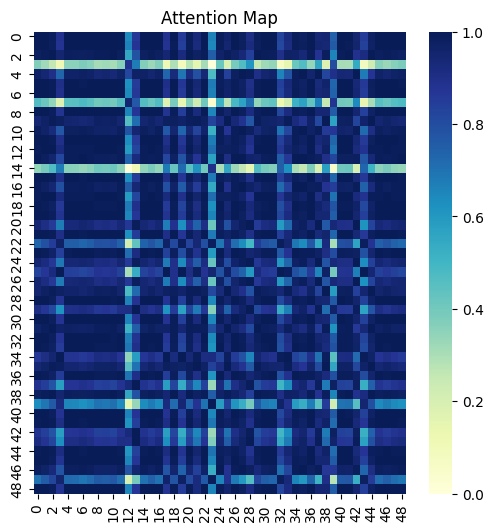

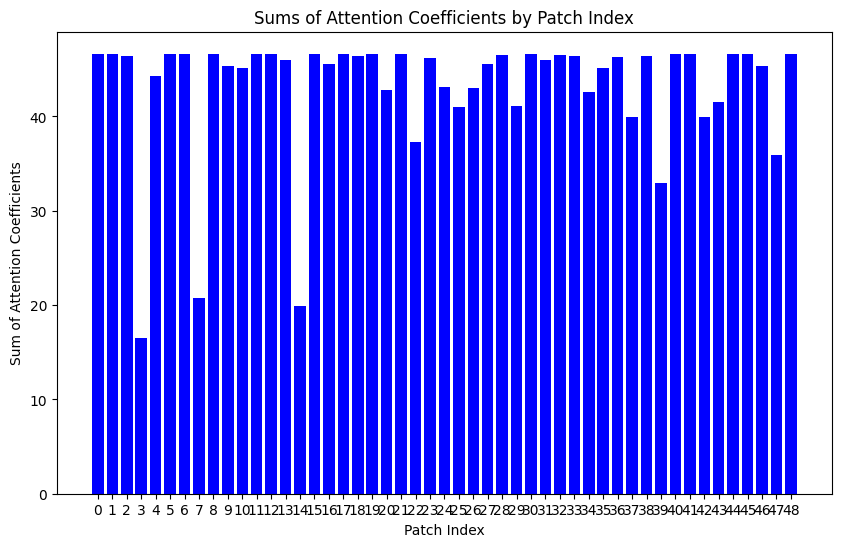

Predicted class for sample 22: 1.0
Row sums: [46.789547 46.76993  46.33752  17.155327 44.807842 46.776787 46.78995
 21.467472 46.778473 45.150463 45.373966 40.605206 46.673363 46.314636
 19.115234 46.779457 45.988247 46.54617  46.69098  46.781223 43.388554
 46.77828  36.667175 46.49089  46.12644  40.501823 43.579002 45.39802
 46.7636   41.770863 46.77005  45.886147 46.614044 46.64355  42.135044
 44.92675  46.611446 43.69333  46.353046 46.774876 46.768494 46.757797
 40.584305 42.12754  46.735264 46.77806  45.71563  35.254654 46.78091 ]


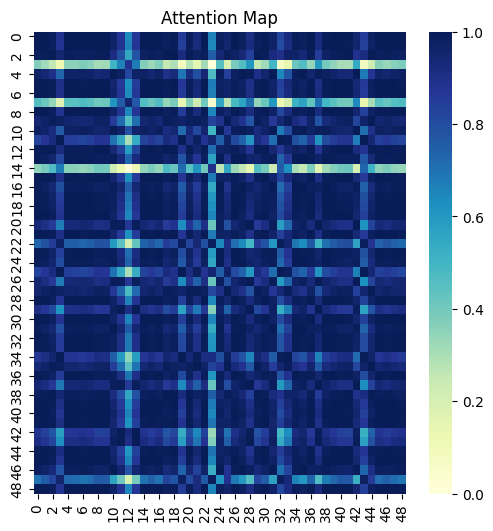

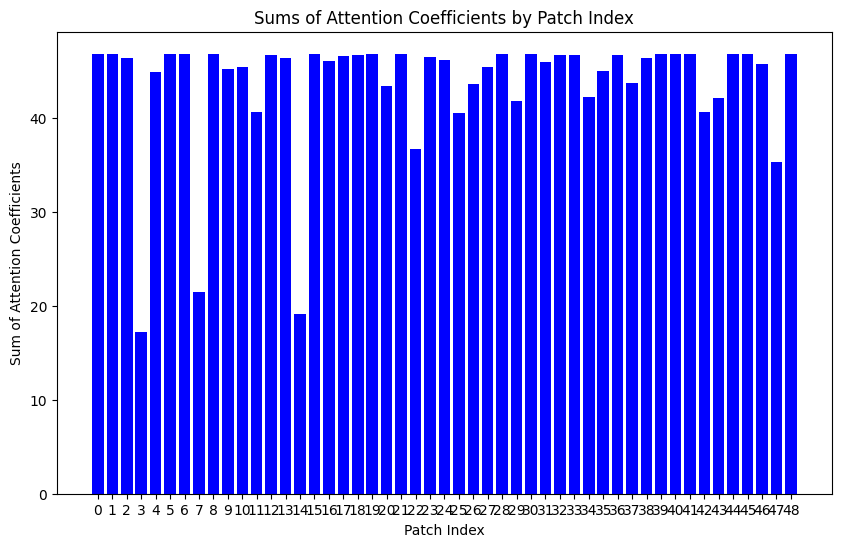

Predicted class for sample 23: 1.0
Row sums: [46.519367 46.486156 46.174896 17.934134 44.478622 46.52357  46.522404
 22.040062 46.49839  46.521442 21.0024   46.525997 46.45302  45.989414
 20.715263 43.89879  37.2173   45.771038 35.516994 46.502647 43.085384
 46.52419  42.038593 46.173286 45.87744  45.765347 43.271553 45.34565
 46.477657 41.510273 46.486317 46.461075 46.51236  46.337494 42.366398
 44.921074 46.302322 40.447033 46.388935 46.4917   46.484196 46.513386
 40.36011  41.856762 46.49864  46.497757 42.463768 35.96606  46.502144]


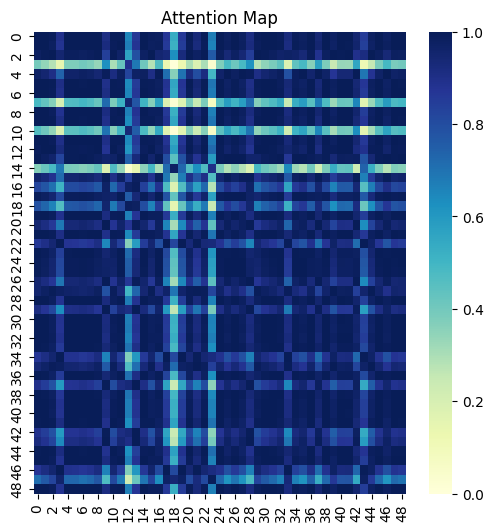

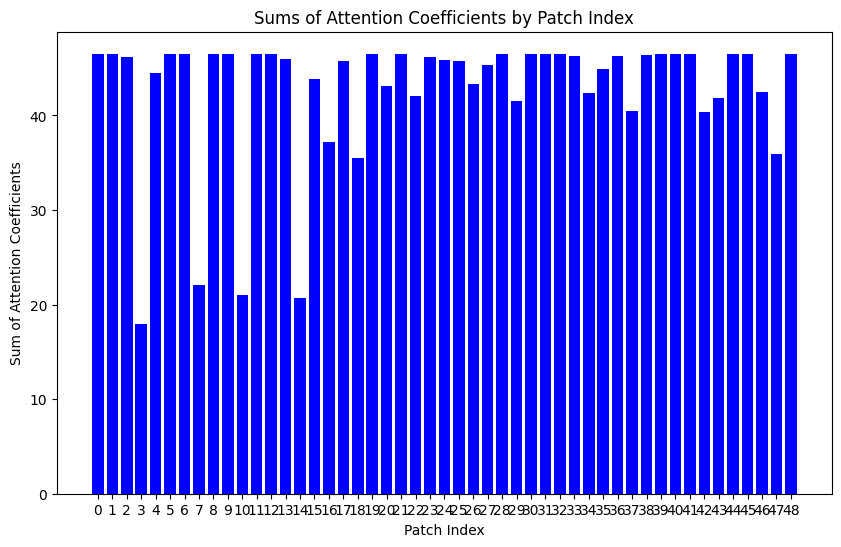

Predicted class for sample 24: 1.0
Row sums: [46.741028 46.738667 46.18943  17.488693 44.948746 46.708973 46.738293
 21.834349 46.743603 45.602783 41.333107 46.72499  46.57301  46.36004
 18.453968 46.590942 41.058083 46.441433 46.63996  43.797962 43.58335
 46.711433 36.985664 46.742474 46.262054 45.622147 43.767536 45.17696
 46.7353   42.010914 46.738724 46.718616 46.131573 46.64632  41.777008
 44.67925  46.61981  40.938797 46.67261  38.90782  46.73794  46.680733
 40.850853 42.358658 46.65037  46.475643 34.836456 34.74039  46.743053]


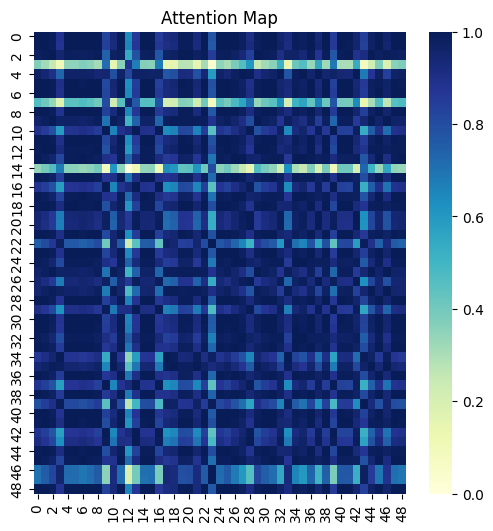

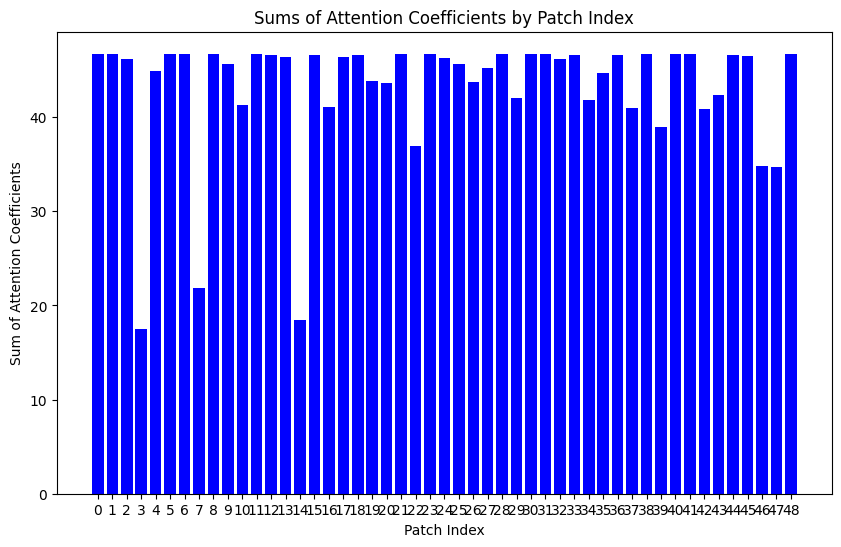

Predicted class for sample 25: 1.0
Row sums: [46.908726 46.834915 46.75923  15.866413 44.310978 46.95593  46.918922
 20.111197 46.858826 45.820446 45.6965   45.42316  46.9523   46.13387
 20.315826 46.95315  45.7156   46.94667  43.099022 46.8677   42.70926
 46.954445 37.905582 45.96503  44.182266 43.31272  42.921047 46.028416
 46.819263 40.936153 46.93724  37.52778  46.755287 46.600418 43.11586
 45.629456 46.55042  43.632633 42.339806 46.957577 46.83125  46.965496
 39.657608 41.32371  46.967003 46.85756  45.38048  36.52843  46.86663 ]


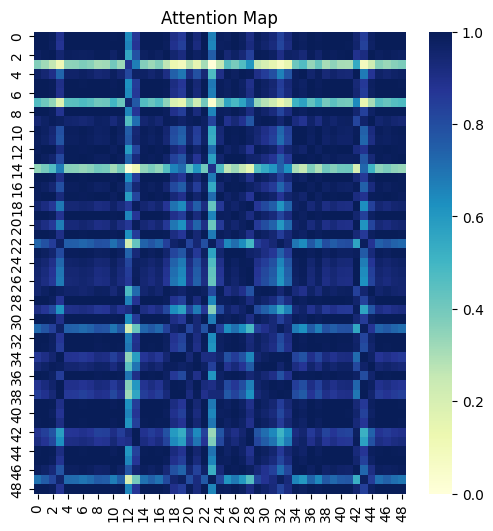

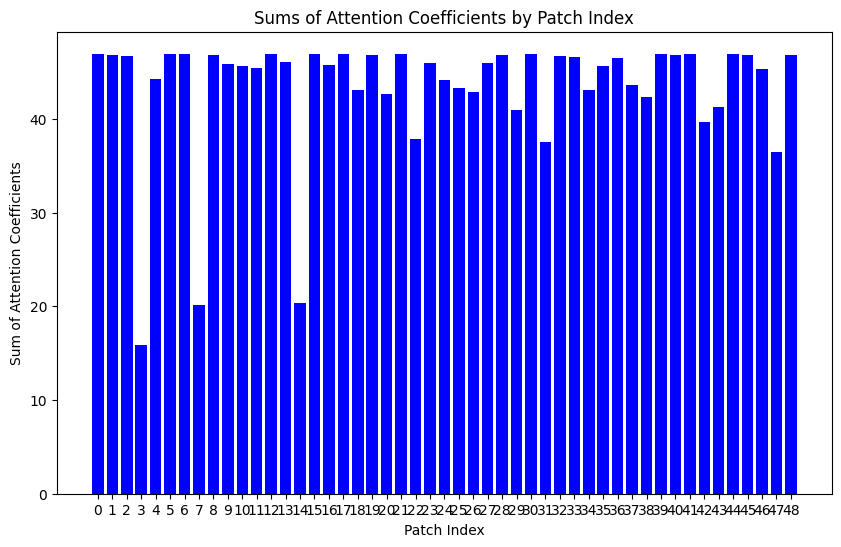

Predicted class for sample 26: 1.0
Row sums: [46.990295 46.959187 46.59739  16.705744 44.858196 46.989906 46.99274
 21.046345 46.971016 45.452995 25.756952 45.578323 46.858482 46.44793
 19.47761  46.991474 46.09883  46.954525 46.749187 46.993816 43.383812
 46.9908   37.047604 46.993786 45.71517  46.933193 43.58104  45.69409
 46.950848 42.704338 46.975582 42.4368   46.353317 45.622322 42.48394
 45.234535 46.77283  46.994427 46.84681  46.988728 46.95727  46.9767
 40.49267  42.081158 46.980244 46.97042  45.81015  35.638584 46.974594]


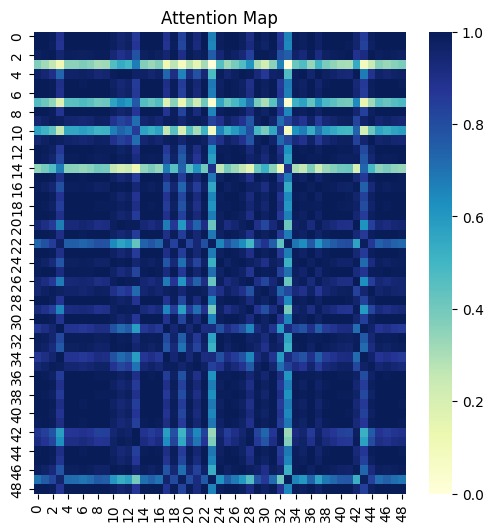

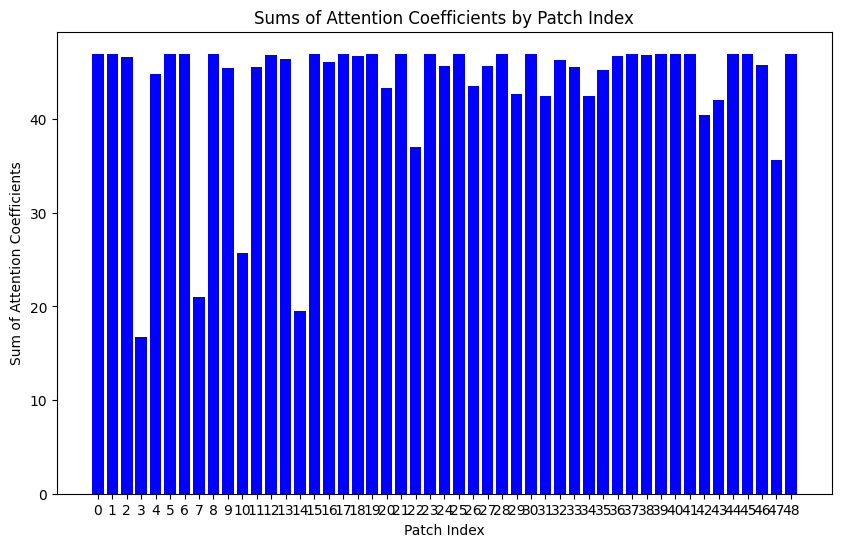

Predicted class for sample 27: 1.0
Row sums: [47.028557 46.968002 46.796757 15.984957 44.55617  47.060574 47.0363
 20.28673  46.988194 45.77843  41.269875 44.294853 47.030468 46.32174
 19.807537 47.0592   45.921703 46.961876 45.79548  46.995575 42.980003
 47.05986  36.72721  46.75178  46.937996 41.372948 43.18913  45.999935
 46.954582 42.09025  46.997356 46.565247 46.716354 46.75868  42.952297
 45.575985 46.71268  45.292164 46.899    47.061302 46.964874 47.06272
 39.95157  41.608055 47.057888 46.987133 45.59827  36.195587 46.994694]


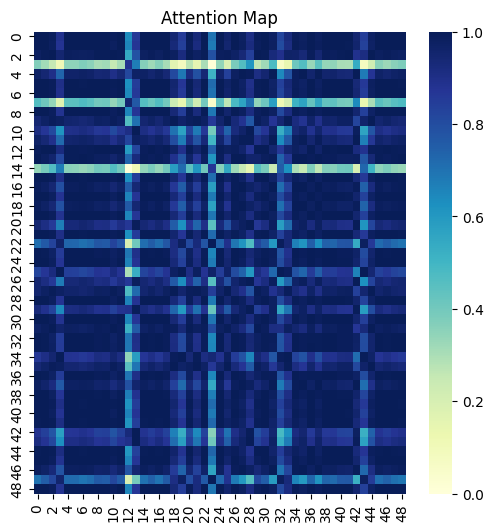

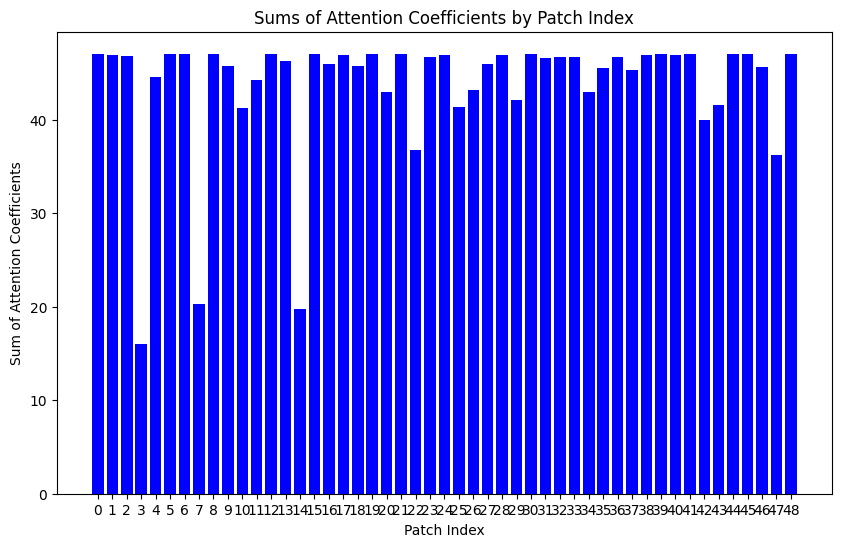

Predicted class for sample 28: 1.0
Row sums: [46.60136  46.55843  46.287876 16.695612 44.380833 46.614914 46.606026
 20.94619  46.573532 45.226376 45.07292  43.836536 46.55652  46.0029
 19.704975 46.615166 45.641365 46.46931  45.181553 46.578915 42.90287
 46.61509  37.104362 46.204346 43.82262  40.82257  43.099846 45.453094
 46.548122 41.240726 46.558617 45.90922  46.35058  46.386837 42.38889
 45.020157 46.347416 40.12217  43.276962 46.293343 46.55604  46.60865
 40.03082  41.605774 46.59693  46.572693 45.345592 35.72434  46.578274]


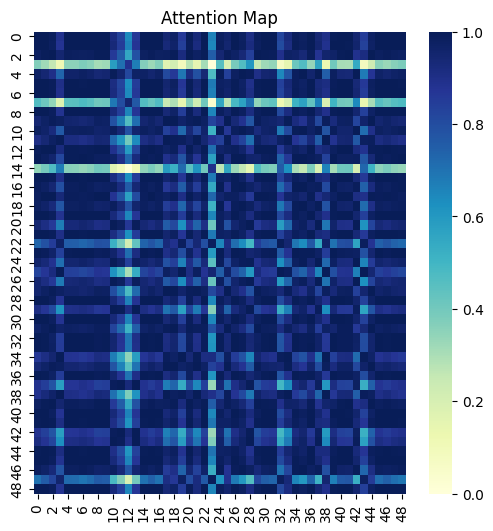

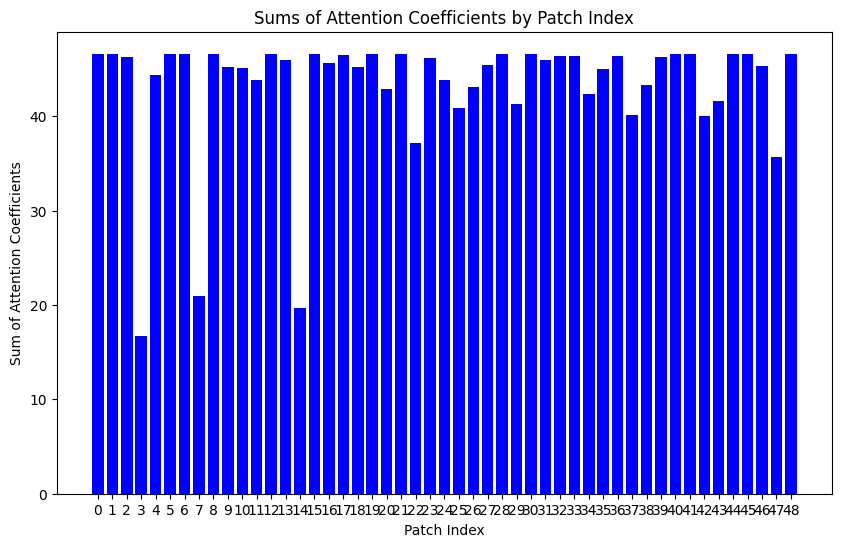

Predicted class for sample 29: 1.0
Row sums: [47.044758 46.99844  46.73533  16.48831  44.739914 47.06115  47.04995
 20.787436 47.014587 45.655872 40.14113  46.84488  47.005295 46.417877
 19.642286 46.205563 45.396786 44.075108 46.89265  46.7225   43.216248
 47.06121  37.532013 46.632515 46.291565 46.72884  43.41914  45.886936
 46.987476 41.505795 46.998642 46.862514 44.953655 46.81778  42.75815
 45.44558  46.77656  41.959328 43.881706 47.06096  46.99589  47.055897
 40.262318 41.88122  47.049007 47.01101  45.73672  35.947926 47.019672]


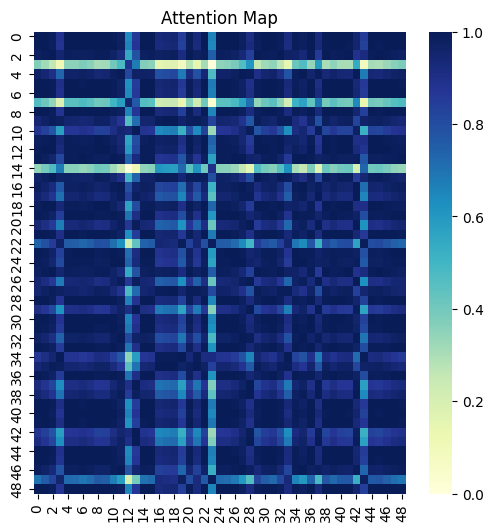

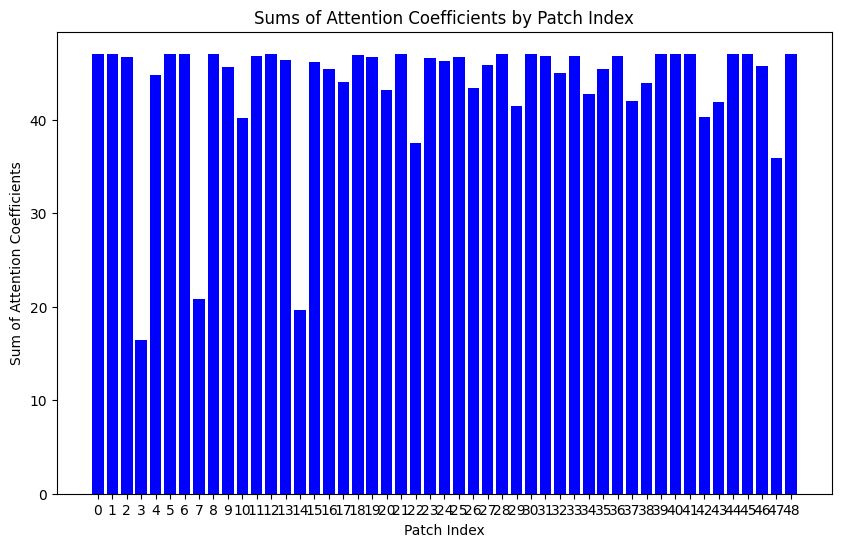

Predicted class for sample 30: 1.0
Row sums: [46.786587 46.75211  46.418865 16.860516 44.641224 46.790356 46.789684
 21.142849 46.764854 45.302517 45.54985  44.13708  46.714653 46.23044
 19.426708 46.79152  45.879715 46.762978 45.62331  46.769283 43.176327
 46.791027 36.986103 46.423775 46.219364 46.78508  43.37202  45.538715
 46.74322  41.521297 46.75227  45.97521  46.2262   46.596306 42.377438
 45.088226 46.55937  40.404762 46.374874 46.78943  46.750057 46.779274
 40.313507 41.885265 46.76341  46.26909  45.590714 35.58429  46.76876 ]


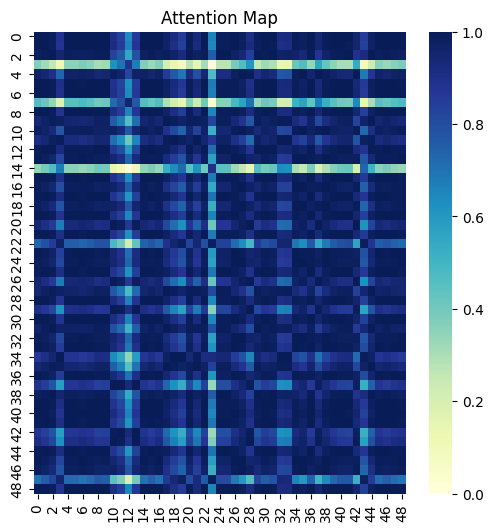

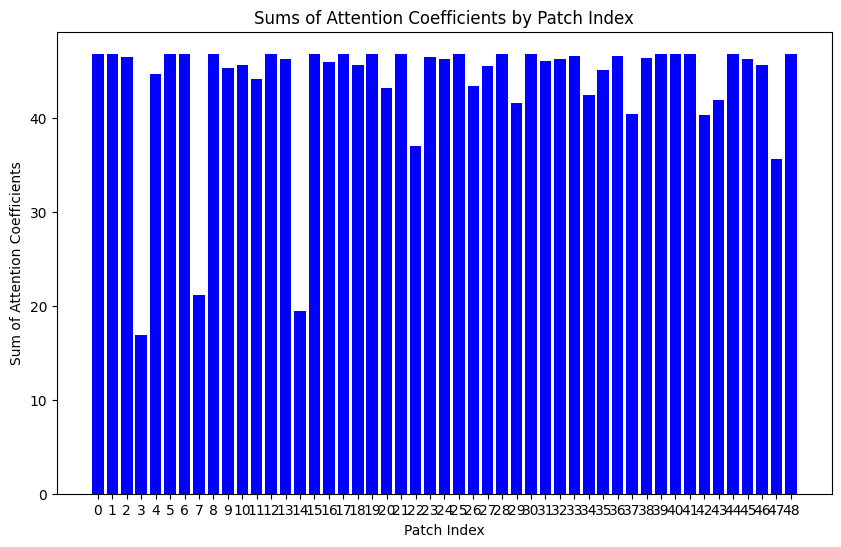

Predicted class for sample 31: 1.0
Row sums: [46.710358 46.67931  46.32583  16.924633 44.610065 46.71048  46.712852
 21.208294 46.69107  45.19933  44.235027 41.992825 46.62903  46.174545
 19.401405 46.711967 45.830677 46.706158 45.388317 46.695114 43.1609
 46.711323 36.88702  46.36328  46.533215 40.0683   43.354702 45.436874
 46.671024 41.52016  46.67946  46.554432 46.49784  46.530678 42.268803
 44.984013 46.49497  40.411873 43.252216 46.70934  46.677402 46.69771
 40.321247 41.881218 46.680447 46.690483 45.546494 35.48954  46.694637]


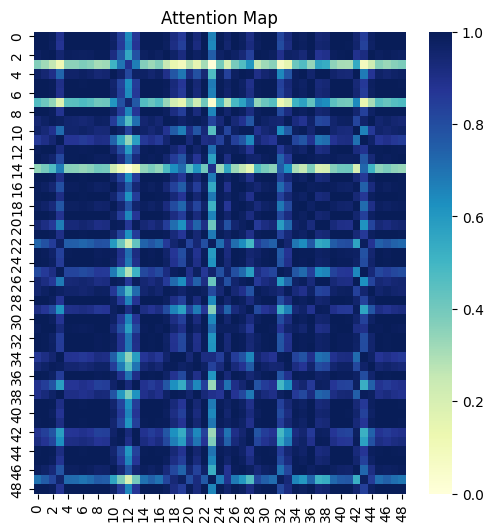

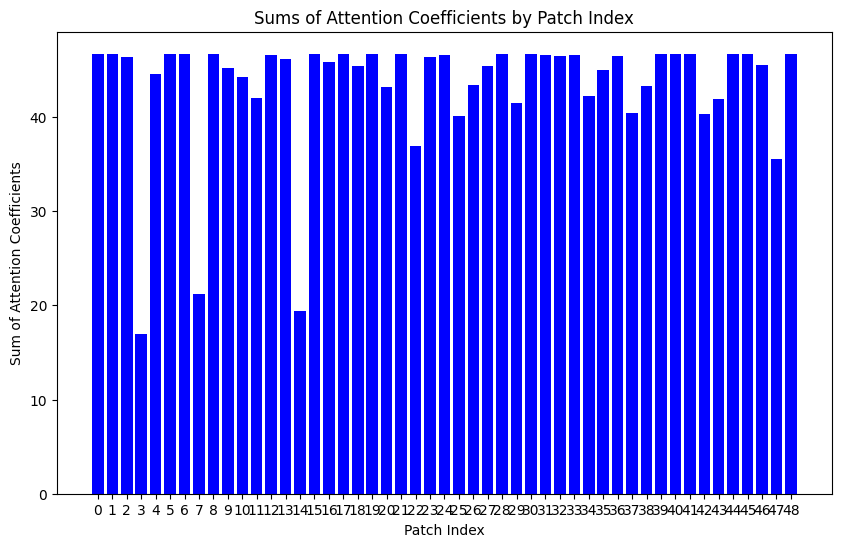

Predicted class for sample 32: 1.0
Row sums: [46.80447  46.741047 46.600197 16.174383 44.335026 46.840385 46.81281
 20.416668 46.761993 45.620876 40.861065 46.83367  46.844463 46.089214
 20.11921  46.838623 45.690258 46.838844 46.552982 46.76969  42.77615
 46.83946  37.639957 46.31623  46.758297 45.411716 42.98279  45.83501
 46.727192 41.041847 46.785187 43.96332  46.485046 46.52777  42.87311
 45.424892 46.481346 45.97221  46.666977 46.841366 46.737812 46.84465
 39.787514 41.4215   46.841732 46.760887 45.368584 36.262302 46.76877 ]


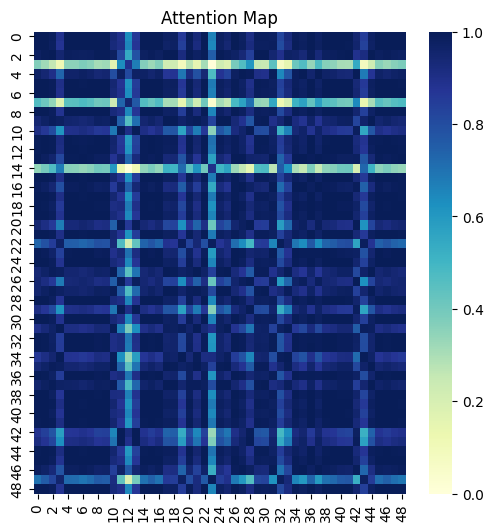

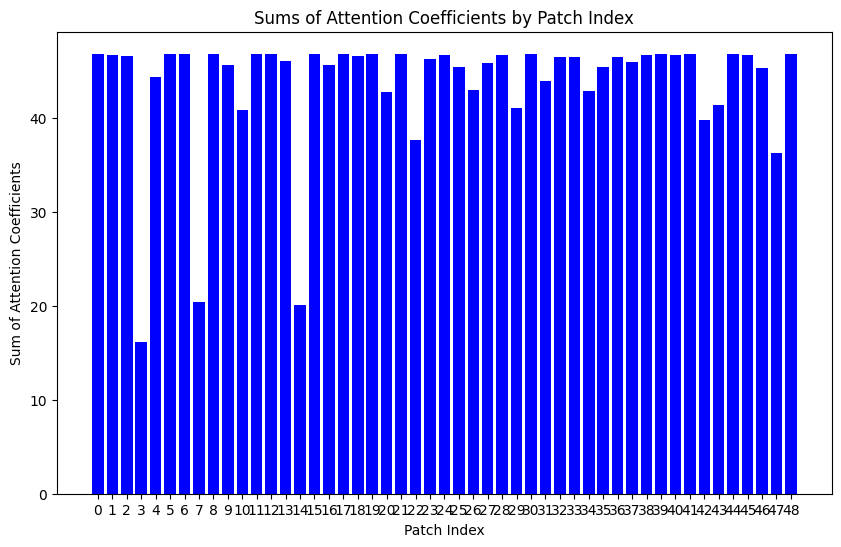

Predicted class for sample 33: 1.0
Row sums: [46.777054 46.730743 46.48895  16.937025 44.531895 46.794712 46.78236
 21.151575 46.746777 46.385372 30.17947  45.560745 46.675095 46.163197
 20.532152 46.79458  46.152973 46.677498 45.467773 46.752533 43.051098
 46.794678 37.526672 46.160652 46.78987  46.79329  43.24832  45.680542
 46.71989  41.391945 46.710728 46.529568 46.686077 46.553246 42.69097
 45.25917  46.512947 46.149002 45.77916  46.79464  46.72822  46.790543
 40.17796  41.75303  46.57469  46.79439  45.500637 36.178204 46.751846]


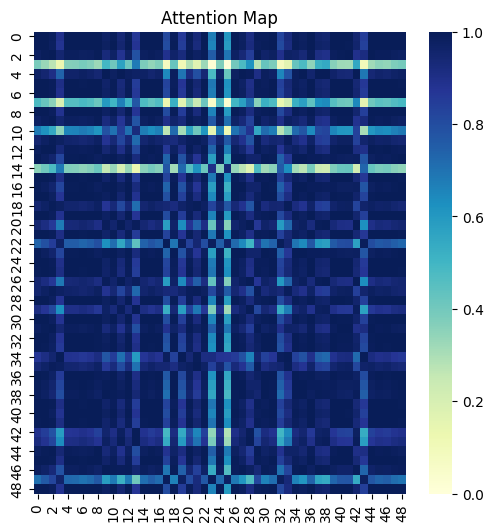

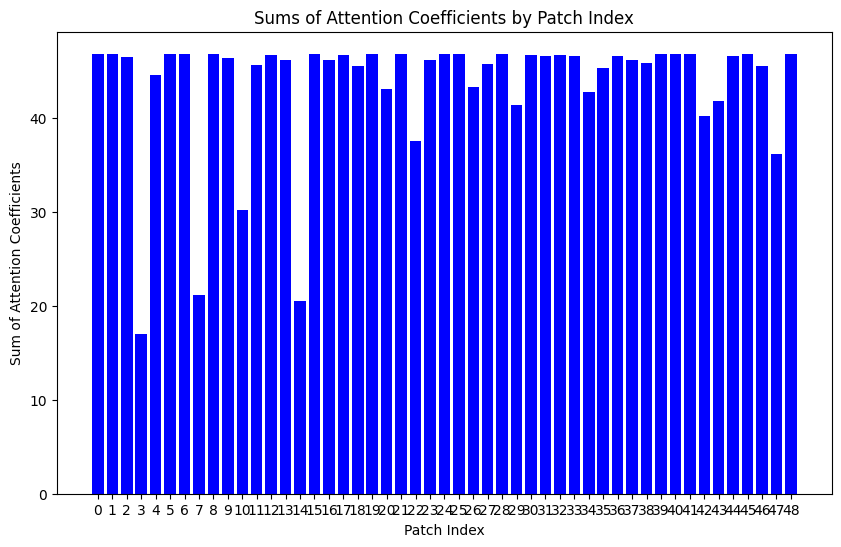

Predicted class for sample 34: 1.0
Row sums: [46.825253 46.79334  46.441742 16.869164 44.703407 46.826088 46.827877
 21.166225 46.805367 46.15768  46.41413  46.829865 46.745285 46.282192
 19.38573  46.827522 45.95636  43.28035  46.299755 46.809505 43.242523
 46.82691  36.95325  46.461887 46.45604  41.817513 43.43784  45.549316
 46.784885 41.58936  46.793495 44.279106 43.879776 46.6424   42.364754
 45.094303 46.606228 40.473057 43.564903 41.573753 46.79139  46.813576
 40.381798 41.95309  46.79649  46.804756 45.64805  35.548187 46.80902 ]


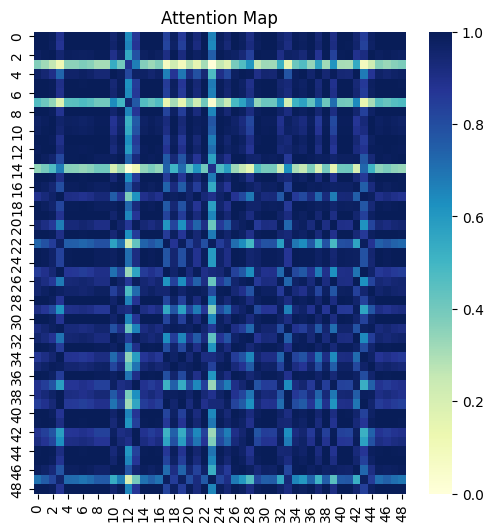

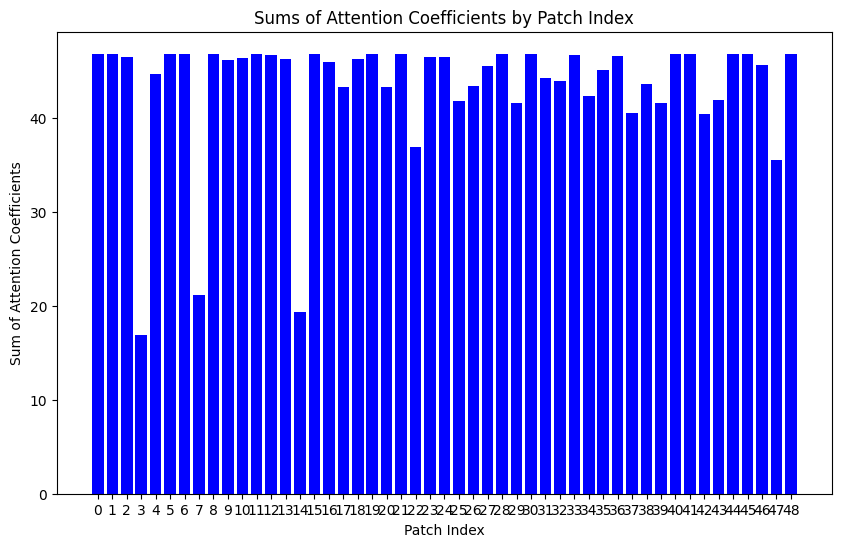

Predicted class for sample 35: 1.0
Row sums: [46.923157 46.88126  46.593834 16.607592 44.68237  46.934944 46.927578
 20.906517 46.896126 46.93535  20.751442 45.35756  32.011124 46.32373
 43.91213  46.911858 40.69471  46.362896 46.683994 46.075638 43.18349
 46.93524  37.231907 46.52675  46.105232 44.39355  46.124203 45.737144
 46.87108  41.496513 46.881447 46.904175 46.846355 46.710136 42.608665
 45.294167 46.67059  46.900307 42.84086  44.238174 46.8789   46.92761
 40.2681   41.86709  46.241592 46.932346 45.65947  35.830296 46.900772]


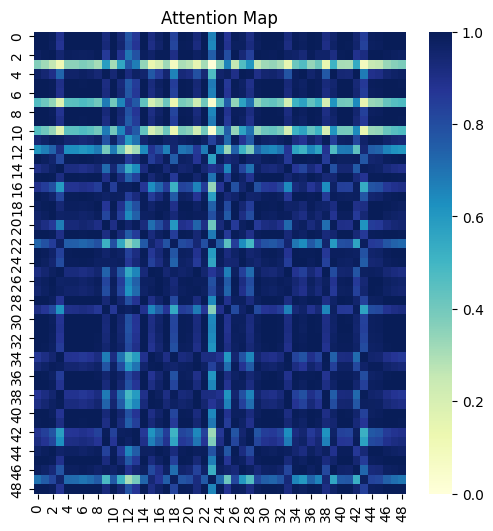

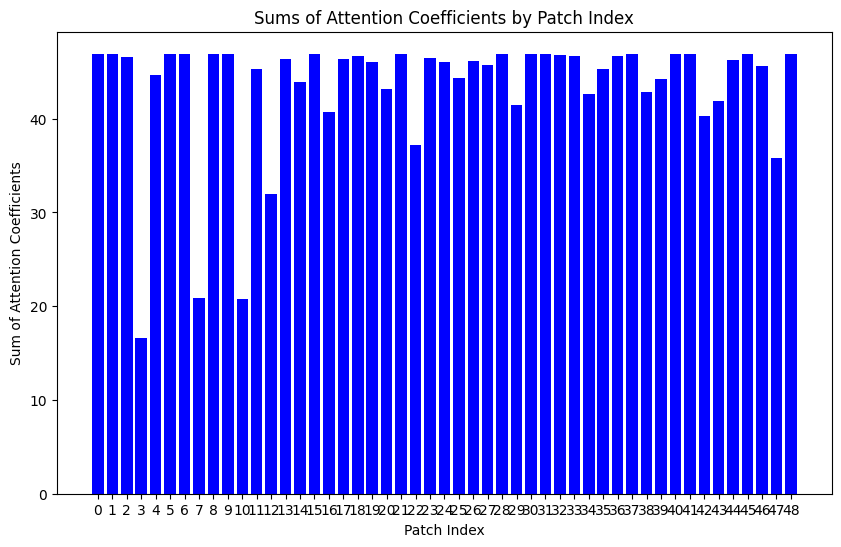

Predicted class for sample 36: 1.0
Row sums: [46.960125 46.90736  46.690163 16.352638 44.59225  46.983856 46.966503
 20.63322  46.925316 45.648266 44.74326  46.24545  46.940735 46.29977
 19.839272 46.98322  45.915607 46.95105  46.26642  46.931816 43.05438
 46.983547 37.471176 46.51593  46.543938 41.960182 43.258816 45.87297
 46.895306 41.33375  46.954437 45.15725  46.674633 46.71437  42.80719
 45.443348 46.67118  45.623516 46.881165 46.984108 46.904552 46.982178
 40.08525  41.71104  46.974186 46.924377 45.60343  36.07422  46.931038]


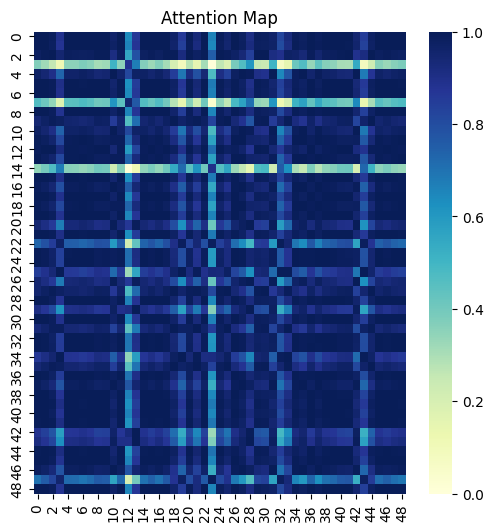

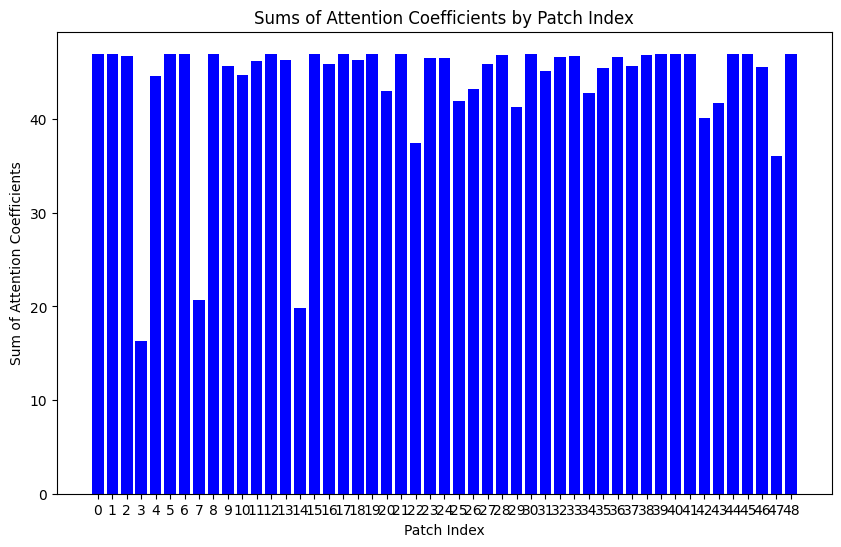

Predicted class for sample 37: 1.0
Row sums: [46.61343  46.569717 46.30386  16.672388 44.38265  46.627823 46.618233
 20.923035 46.585045 45.244946 45.733562 44.608902 46.57075  46.010357
 19.718819 46.628002 45.647266 46.618732 44.31367  46.590515 42.901035
 46.627956 37.12528  46.212845 45.692654 40.629852 43.098454 45.471294
 46.55928  41.23551  46.569912 46.282726 46.40643  46.3965   42.409657
 45.039024 46.3568   40.114964 45.95378  38.170982 46.567295 46.621944
 40.02346  41.601257 46.610546 46.58426  45.3504   35.744957 46.589863]


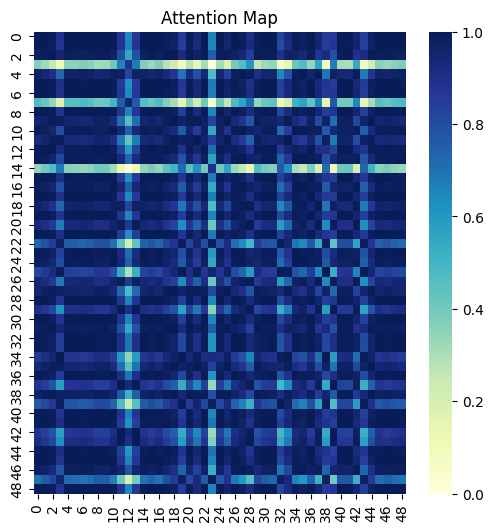

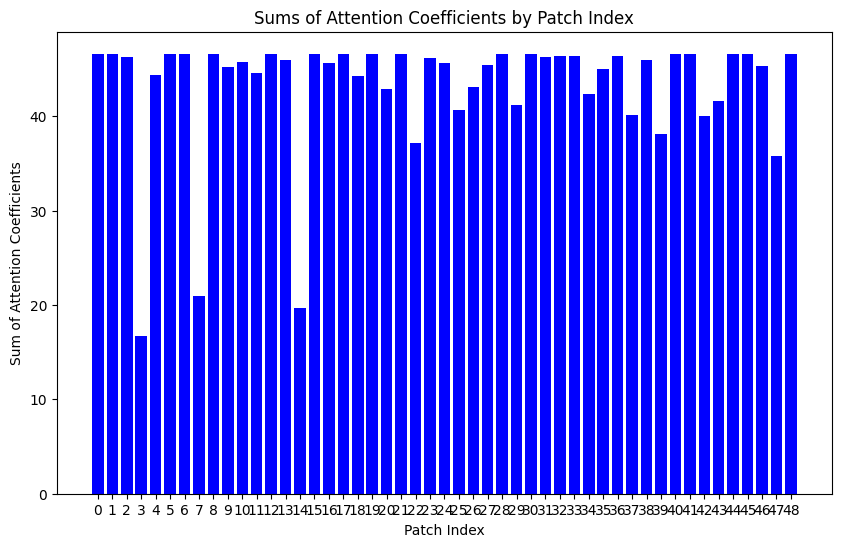

Predicted class for sample 38: 1.0
Row sums: [47.20545  47.115414 47.139645 15.370102 44.39921  47.27018  47.218533
 19.63757  47.143955 46.260315 40.691154 47.27845  45.49195  46.33588
 20.727524 47.265823 45.88612  47.10508  47.24392  47.154675 42.723907
 47.267834 38.431496 46.59722  46.89402  47.16605  42.944668 46.459415
 47.09692  40.882187 47.179066 42.958775 46.796093 46.84738  43.61551
 46.076477 46.79772  44.877487 46.907787 47.272846 47.111065 47.287933
 39.559727 41.283882 47.296246 47.14243  45.528873 37.053406 47.15338 ]


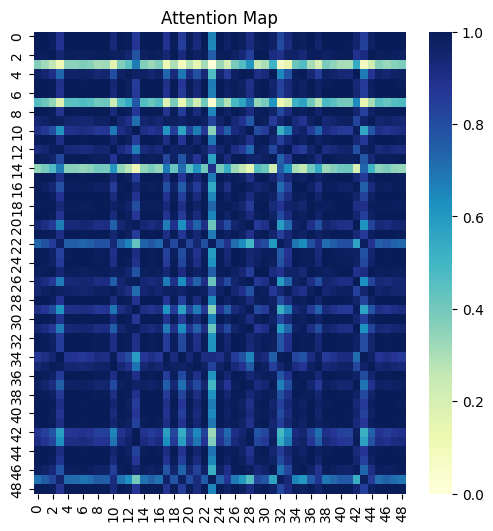

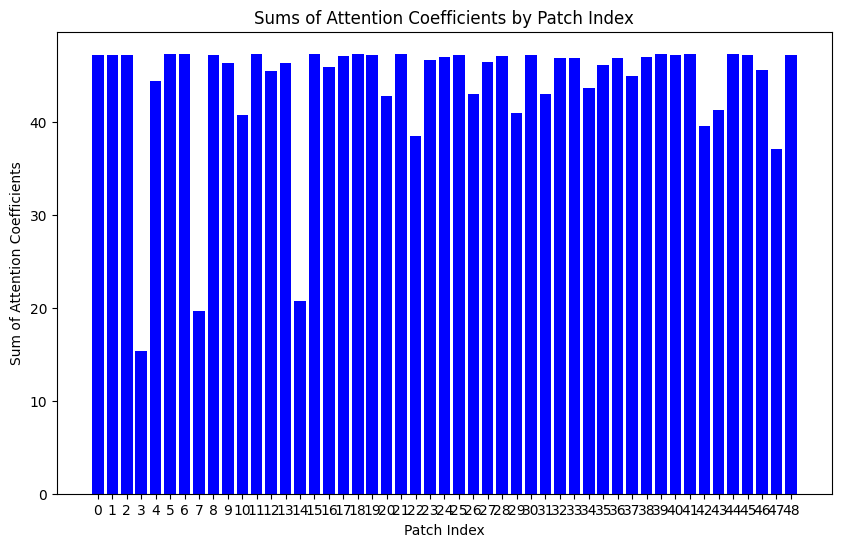

Predicted class for sample 39: 1.0
Row sums: [46.495422 46.468117 46.11334  17.837996 44.507874 46.492805 46.497368
 21.985926 45.09779  46.49482  25.955112 46.498478 46.410236 45.995205
 20.308786 46.454853 28.048721 44.681442 42.884037 46.482292 43.123993
 46.493763 37.04755  46.17334  45.89295  46.07936  43.30925  45.252777
 46.460606 41.553776 46.468258 46.459583 46.498554 46.33053  42.205784
 44.816063 46.297096 40.49168  46.157288 42.828045 46.466393 46.47927
 40.404797 41.89955  46.46165  44.525158 45.948914 35.709602 46.481873]


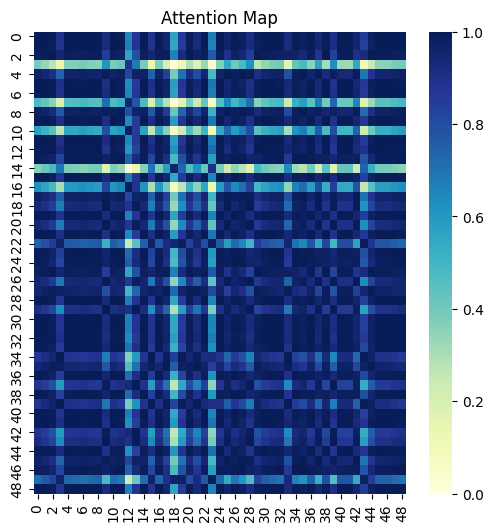

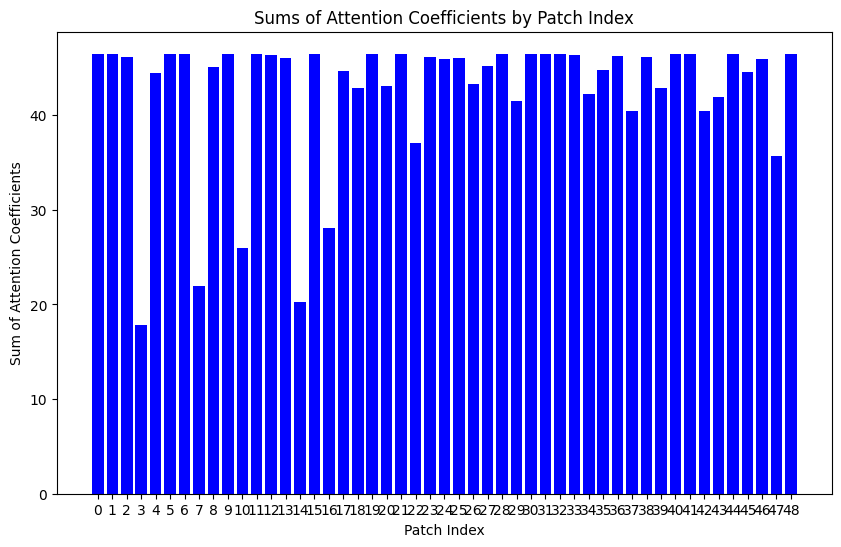

Predicted class for sample 40: 1.0
Row sums: [46.591335 46.526714 46.40103  16.211645 44.13105  46.62902  46.599922
 20.426739 46.54796  45.443462 44.509254 42.950325 46.611088 45.874233
 20.193481 46.627083 45.477062 46.328716 42.815994 46.555786 42.585304
 46.628002 37.575535 46.055492 45.25169  46.61502  42.790123 45.653416
 46.51269  40.866932 46.57824  37.408382 46.5738   46.312183 42.740788
 45.25116  46.265697 42.565735 40.579597 39.757732 46.523434 46.6343
 39.624554 41.243023 46.63232  46.28429  45.157238 36.213364 46.554848]


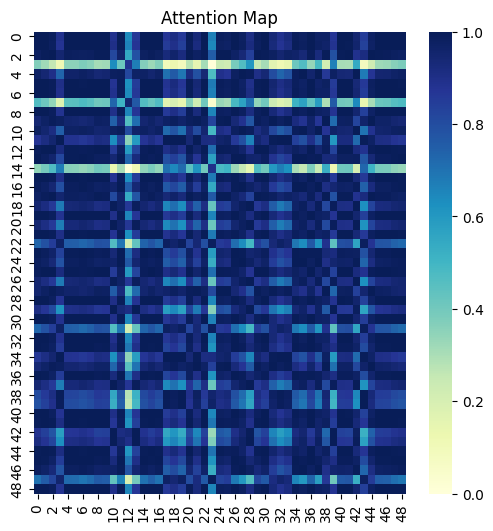

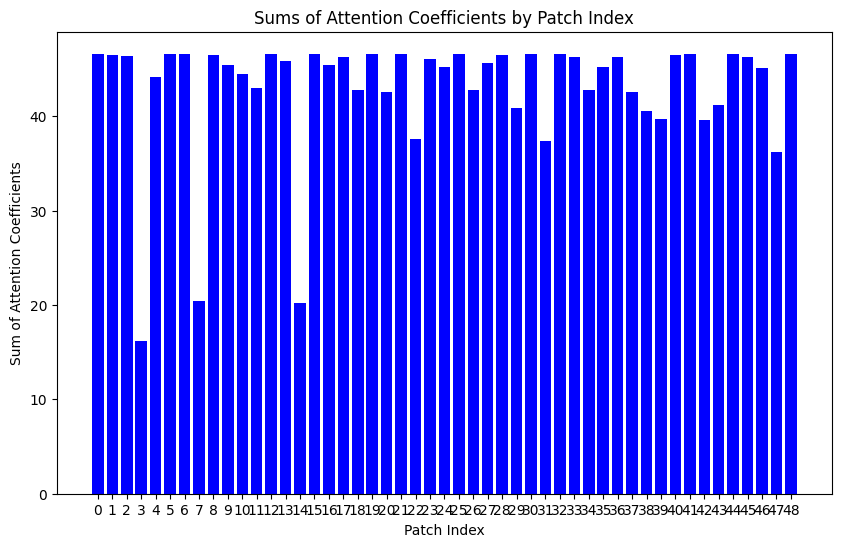

Predicted class for sample 41: 1.0
Row sums: [46.805824 46.78452  46.36277  17.11406  44.803493 46.794907 46.806534
 21.424896 46.79354  45.18237  45.63013  42.635098 46.69448  46.321247
 19.146534 46.79741  45.991753 46.804996 45.867146 46.796486 43.377502
 46.796307 36.709793 46.49962  44.154076 40.542656 43.56875  45.428913
 46.77789  41.753853 46.784637 46.468143 46.624645 46.654686 42.174026
 44.95948  46.622005 40.73709  46.22706  46.793106 46.78301  46.77678
 40.563644 42.11174  46.754974 46.7931   45.716988 35.297318 46.796143]


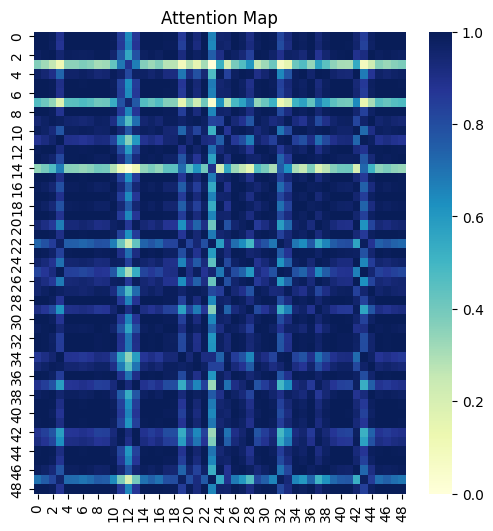

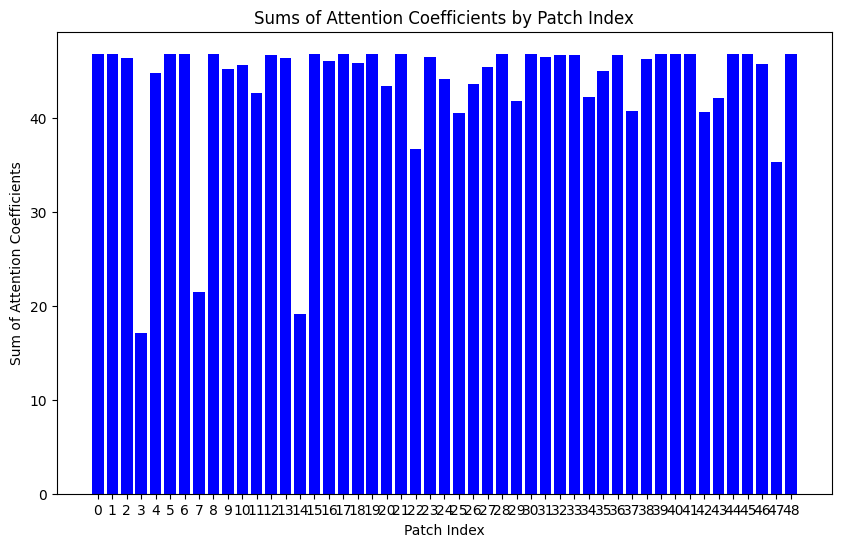

Predicted class for sample 42: 1.0
Row sums: [46.858757 46.790134 46.6787   15.846773 44.314922 46.900124 46.868004
 20.116823 46.81258  45.712418 46.383396 46.80654  46.88654  46.11157
 20.057447 46.897877 45.701256 42.00145  43.066395 46.82087  42.726692
 46.898933 37.715267 45.605648 45.9382   44.468586 42.936985 45.924953
 46.77536  40.963776 46.79662  37.9014   43.36813  46.56574  42.968563
 45.517605 46.517376 46.864388 45.02816  46.90142  46.786682 46.90687
 39.6905   41.349426 46.90599  46.811394 45.371403 36.329716 46.819874]


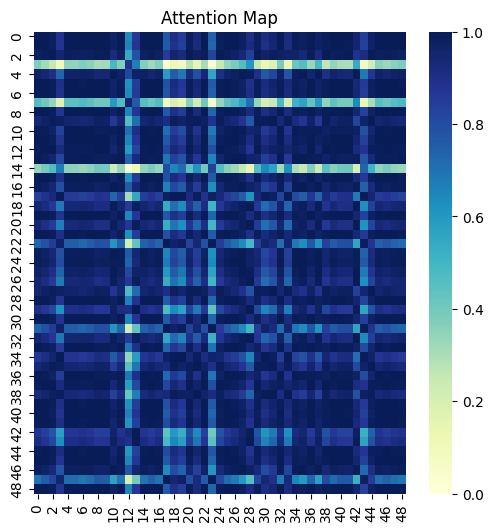

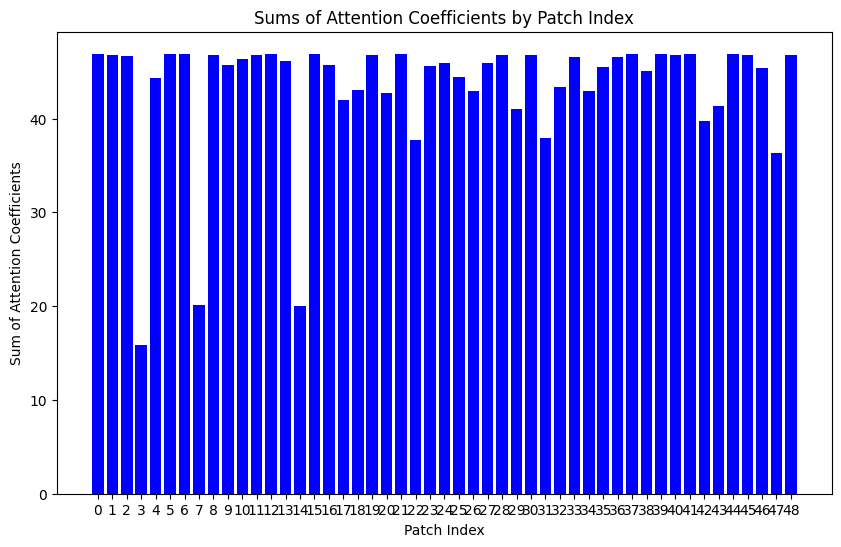

Predicted class for sample 43: 1.0
Row sums: [46.669785 46.65131  46.211895 17.049238 44.703003 46.655785 46.669983
 21.373934 46.659523 46.19574  32.338295 46.478004 46.550396 46.201614
 18.932697 45.618465 41.596695 46.29177  43.345963 46.662144 43.288925
 46.657345 42.450882 46.661003 46.096165 45.491226 43.47875  45.26877
 46.64518  41.675884 46.65142  46.634113 46.31017  46.527306 41.999706
 44.796284 46.495617 40.581734 46.641293 46.65381  46.649925 46.636223
 40.492138 42.031635 46.613216 45.78365  45.60647  35.11     46.661846]


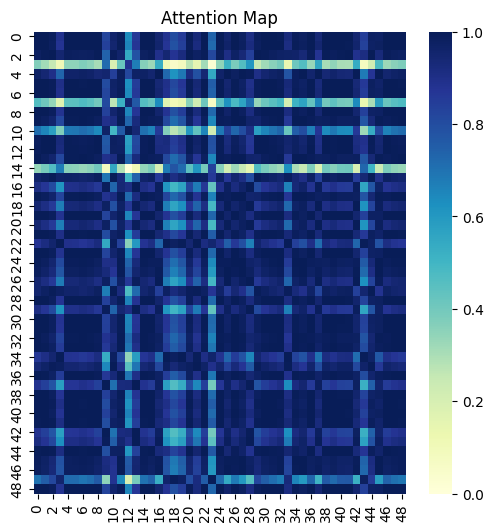

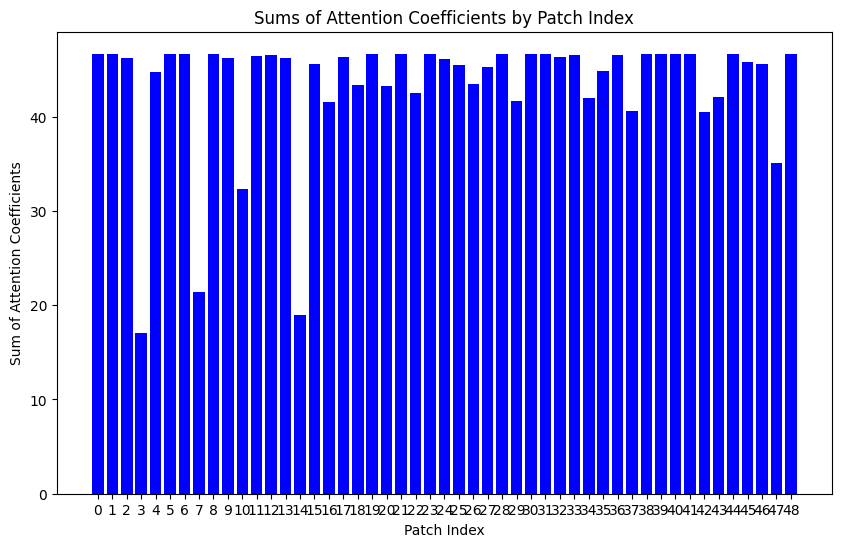

Predicted class for sample 44: 1.0
Row sums: [46.83417  46.802372 46.449673 16.868052 44.71243  46.83486  46.836777
 21.165974 46.81437  45.317295 46.51668  40.059467 46.753757 46.29149
 19.384266 46.83631  45.94418  46.837585 44.5822   46.818497 43.251026
 46.83569  36.95457  46.482243 46.447258 40.75756  43.44642  45.556187
 46.793938 41.597176 46.811546 46.753376 46.618355 46.651596 42.36904
 45.100735 46.615444 41.01947  42.01393  46.833748 46.800426 46.822273
 40.389072 41.961063 46.80511  46.813763 45.657295 35.548927 46.818012]


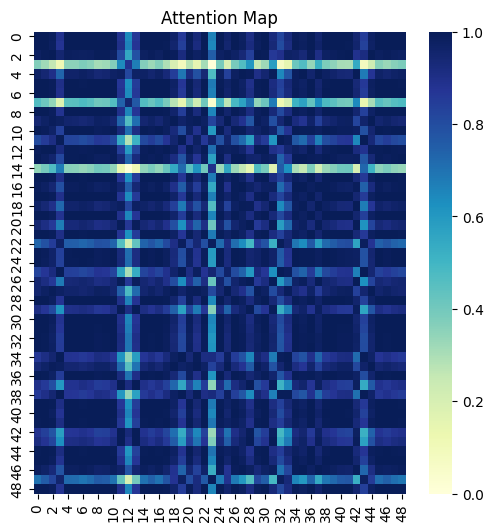

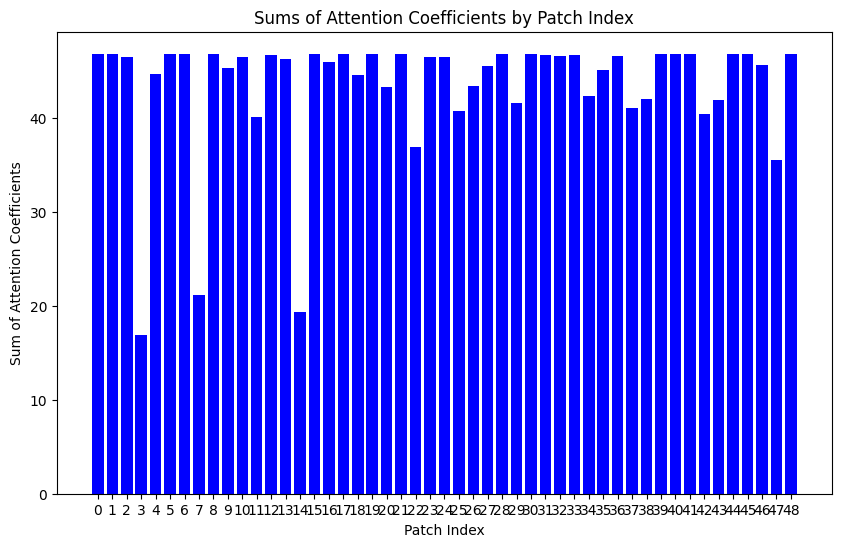

Predicted class for sample 45: 1.0
Row sums: [46.42887  46.37308  46.19401  16.459082 44.07908  39.88616  46.4359
 20.667091 46.391796 45.20673  40.721603 43.11929  41.83457  45.763676
 20.050426 46.455986 45.383884 46.396538 46.23424  46.398624 42.578068
 46.45652  37.315903 45.978428 45.46945  43.641594 42.777966 45.42094
 46.3606   40.897106 46.440666 43.395855 46.136997 46.176895 42.47928
 45.01107  46.133537 45.44797  46.27142  46.457634 46.37017  46.457954
 39.678444 41.265522 46.452316 46.390816 45.076298 35.95867  46.397808]


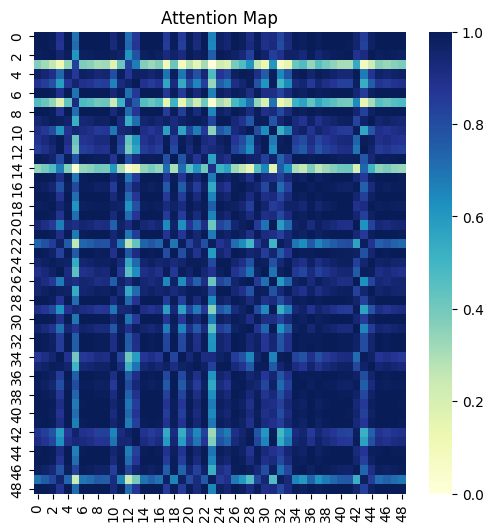

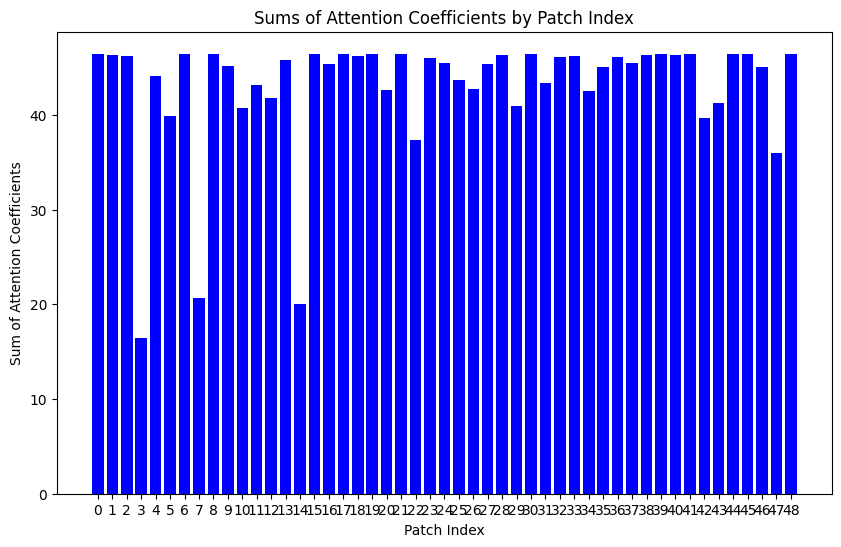

Predicted class for sample 46: 1.0
Row sums: [46.966602  46.892838  46.816376  15.8313055 44.366013  47.013725
 46.976788  20.090717  46.916733  45.876728  40.79934   46.73394
 38.454983  46.191402  20.391645  47.010956  45.772682  47.00712
 47.01509   46.92561   42.761276  47.01225   37.963867  46.43176
 47.022354  46.97981   42.9735    46.08483   46.877182  40.984226
 46.947952  45.73857   46.612247  46.658295  43.171738  45.685646
 46.608265  46.256504  46.26488   47.015358  46.889168  47.02324
 39.702507  41.37269   47.024693  46.915466  45.43714   36.587757
 46.92454  ]


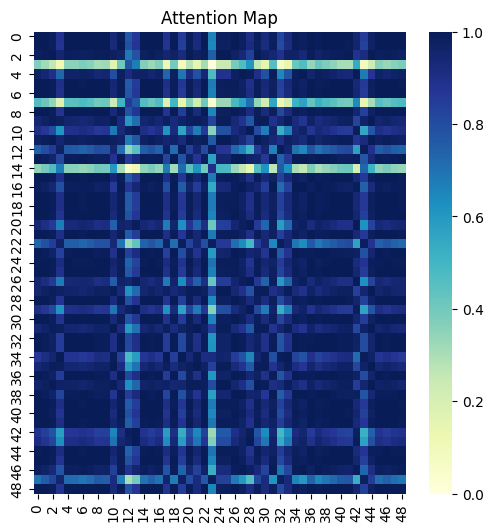

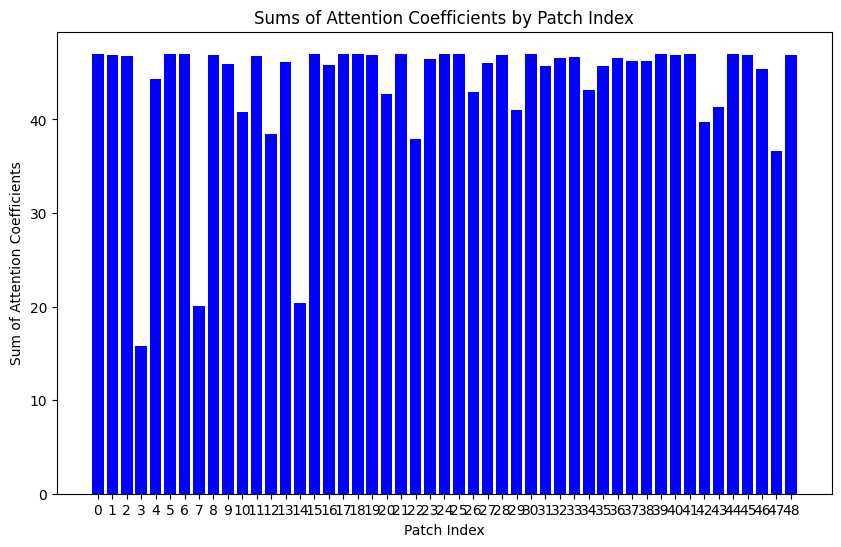

Predicted class for sample 47: 1.0
Row sums: [46.886997 46.816624 46.71939  15.98244  44.331512 46.930473 46.89658
 20.22549  46.839546 45.767185 40.76983  44.67327  46.920784 46.131798
 20.267426 46.928024 45.71989  46.938766 45.678856 46.848034 42.74387
 46.92917  37.83081  46.367622 46.869656 41.514355 42.95397  45.977196
 46.801556 40.983505 46.875504 43.382587 46.54418  46.58912  43.04835
 45.574547 46.540295 46.932602 46.698174 46.931896 46.81309  46.938286
 39.71291  41.36847  46.938328 46.838333 45.389194 36.45363  46.847015]


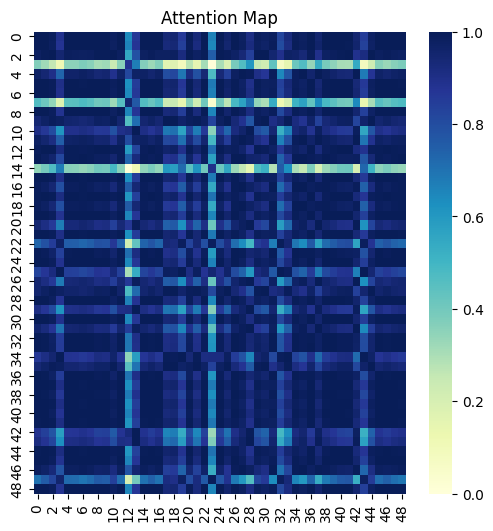

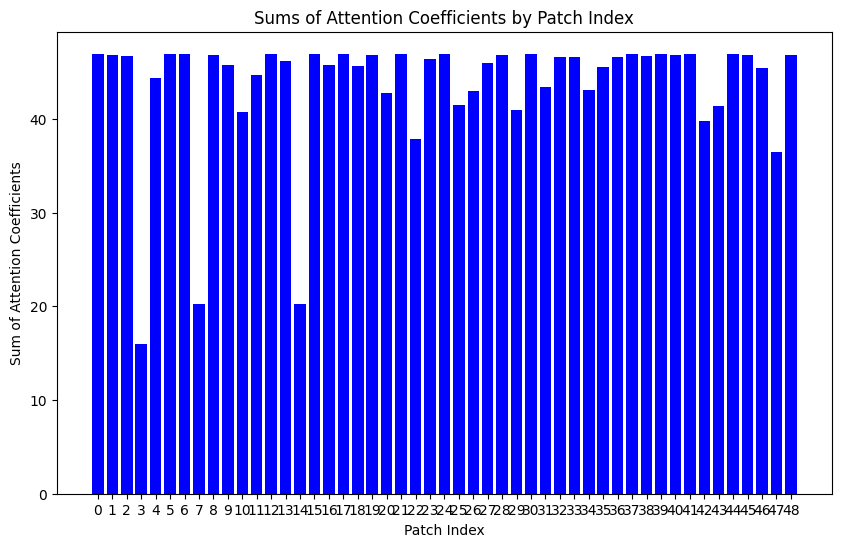

Predicted class for sample 48: 1.0
Row sums: [46.95236  46.903477 46.66015  16.419395 44.62687  46.97176  46.95803
 20.708448 46.920334 45.599155 41.870903 40.67744  46.92135  46.31312
 19.725752 46.97152  45.935253 46.960026 46.048176 46.926395 43.100742
 46.971664 37.372375 46.26266  43.00669  45.33087  43.30383  45.82697
 46.892086 41.389736 46.951916 45.23123  46.679565 46.718143 42.732582
 45.391647 46.676212 45.66171  46.79916  46.971752 46.90083  46.968002
 40.146725 41.76515  46.95826  46.91946  45.627308 35.971424 46.925674]


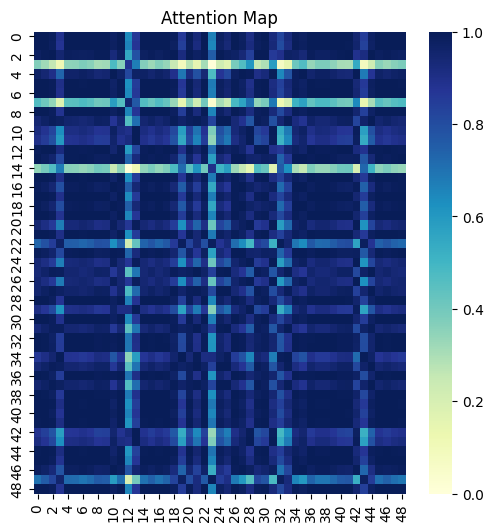

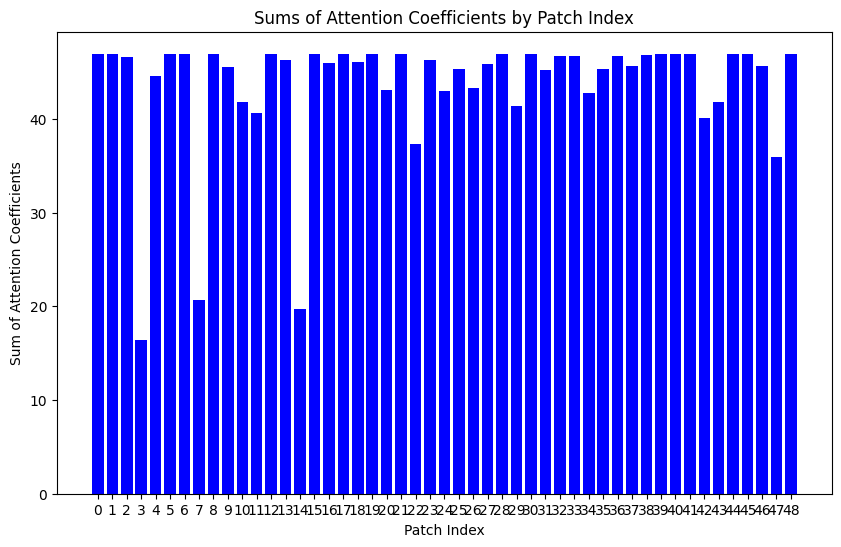

Predicted class for sample 49: 1.0
Row sums: [46.85776  46.82073  46.502155 16.73672  44.675407 46.86422  46.86131
 21.030308 46.834213 45.393116 45.587986 46.866096 46.792667 46.2859
 19.505795 46.865143 45.92954  46.692696 46.716763 46.838936 43.195457
 46.86476  37.08216  46.482918 44.543846 40.8714   43.39304  45.628307
 46.81139  41.5255   46.820904 46.84398  46.62462  46.65947  42.473545
 45.179604 46.62157  40.39969  39.67804  46.86345  46.818573 46.854362
 40.307693 41.892616 46.83951  46.833527 45.63645  35.67957  46.83837 ]


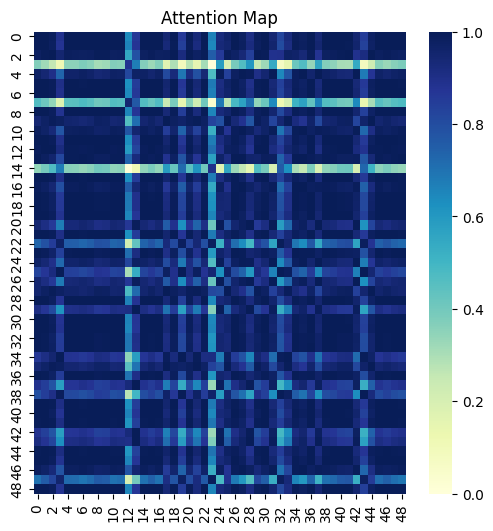

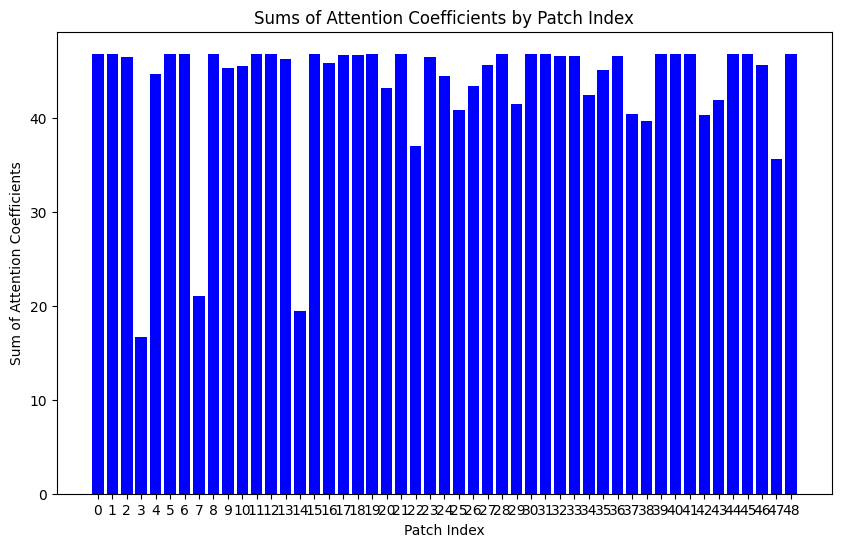

Predicted class for sample 50: 1.0
Row sums: [47.04871  47.0208   46.658413 18.067093 45.01998  47.046062 47.0507
 22.222809 47.031612 47.015724 31.657787 47.04079  46.96173  46.537758
 20.46447  47.04778  46.858177 47.02679  38.240913 47.035286 43.609234
 47.047035 37.409454 46.971245 46.87868  46.927574 43.798016 45.77919
 47.013123 42.0101   47.02094  46.631973 45.698524 46.880222 42.66775
 45.333057 46.846073 43.950207 47.003006 47.04479  47.01904  47.032246
 40.84098  42.362114 47.037148 47.048702 45.929714 36.047783 47.034855]


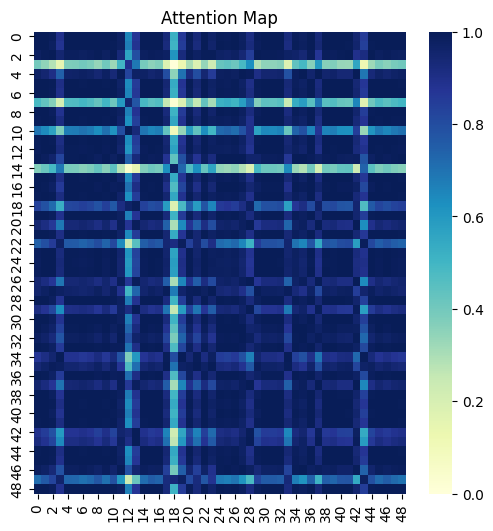

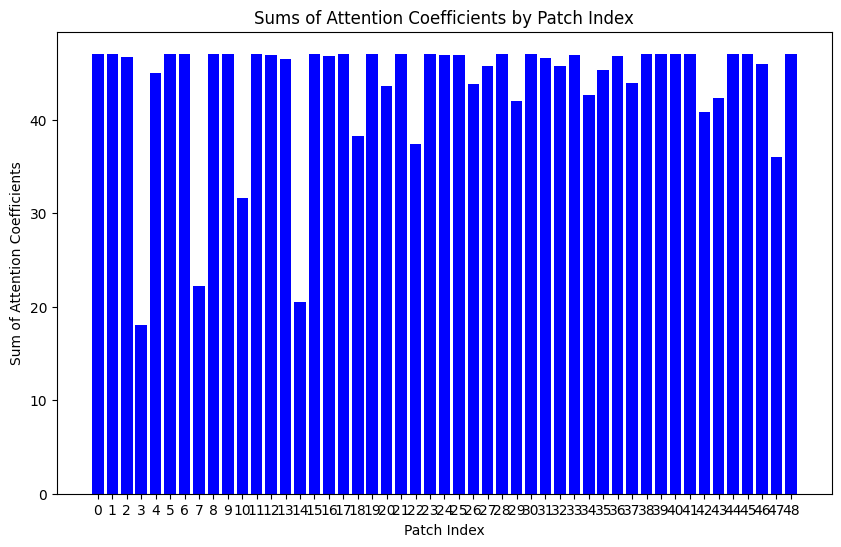

Predicted class for sample 51: 1.0
Row sums: [46.82233  46.807037 46.344334 17.334597 44.886883 46.804688 46.82195
 21.642899 46.81589  46.601795 43.24967  44.460075 46.69288  46.370533
 18.915548 46.81999  39.153286 46.821518 45.92251  42.83556  43.481037
 46.806427 36.55951  46.542004 46.191917 45.240665 44.787266 45.38427
 46.80144  41.875233 46.811867 44.89193  44.993526 46.689068 42.07773
 44.905144 46.658333 46.368683 39.109314 46.802486 46.80578  46.78333
 40.696083 42.229504 44.33946  46.815487 45.78289  35.1361   46.816372]


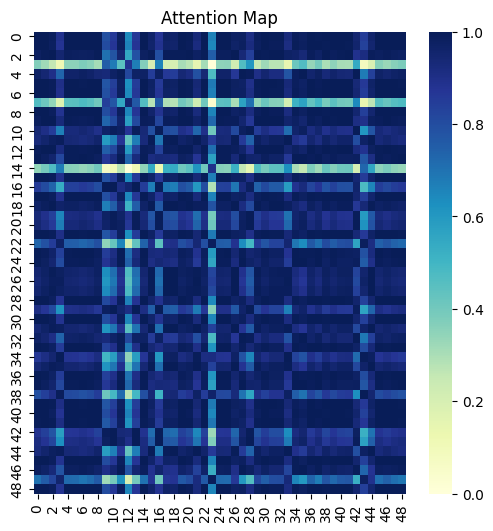

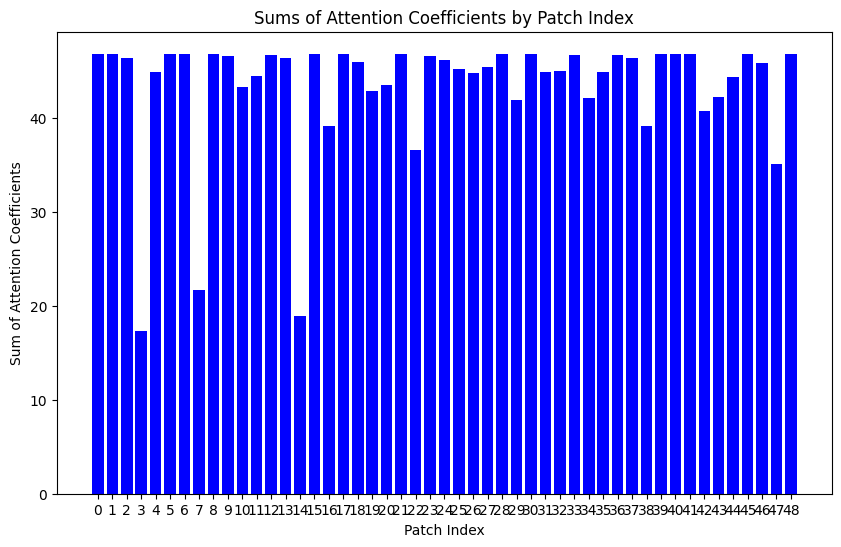

Predicted class for sample 52: 1.0
Row sums: [46.822964 46.7611   46.609344 16.185333 44.36868  46.85711  46.831013
 20.43562  46.781605 45.62163  40.899803 46.371494 46.832115 46.115845
 20.09719  46.855507 45.719112 46.858955 45.24277  46.78913  42.812893
 46.85627  37.619087 46.341232 46.745792 43.29087  43.019215 45.837143
 46.74751  41.080456 46.8092   46.49205  46.508537 46.550816 42.862503
 45.424496 46.504875 43.355053 45.91281  46.857983 46.757927 46.86051
 39.826797 41.45981  46.856865 46.78053  45.398865 36.23991  46.78823 ]


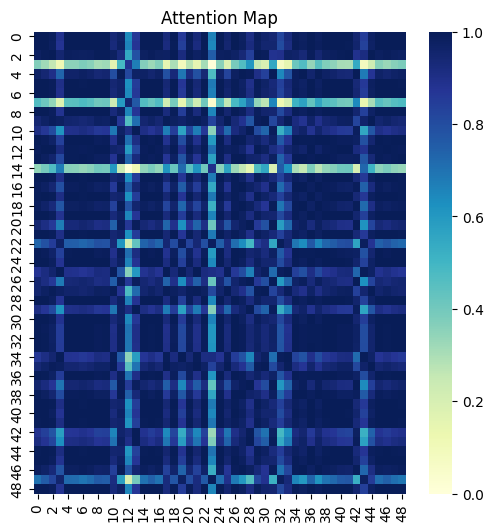

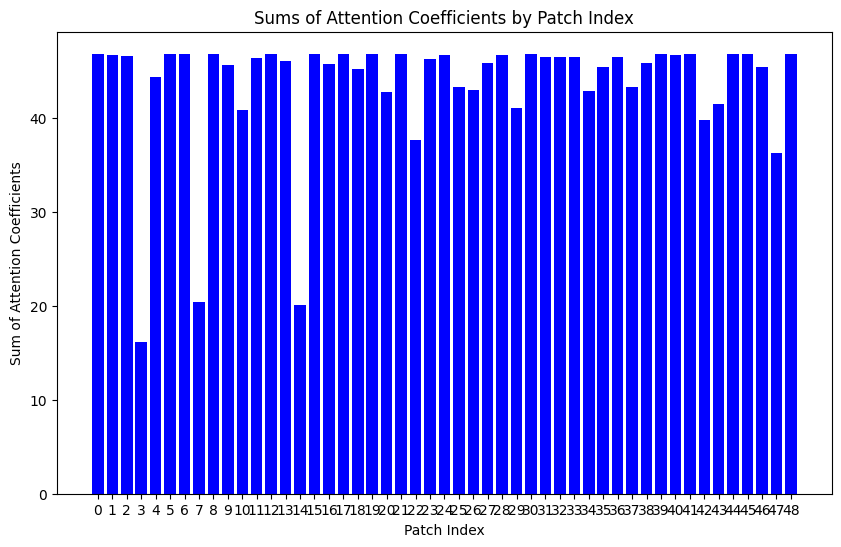

Predicted class for sample 53: 1.0
Row sums: [47.65469  47.63301  47.129047 13.974725 45.384495 47.63898  47.65499
 18.813982 47.64259  45.764507 37.55368  40.84374  46.80627  47.112915
 16.109524 45.854595 45.406883 46.281452 47.025448 47.612568 43.756176
 47.64075  45.12798  47.29401  47.247322 47.62939  43.974632 46.044033
 47.625877 41.901333 47.65291  42.6513   47.65108  47.4893   42.286865
 45.500546 47.46956  46.7556   47.653572 47.636726 47.631397 47.616627
 40.541843 45.818455 46.76138  47.64213  46.42607  34.400017 47.64531 ]


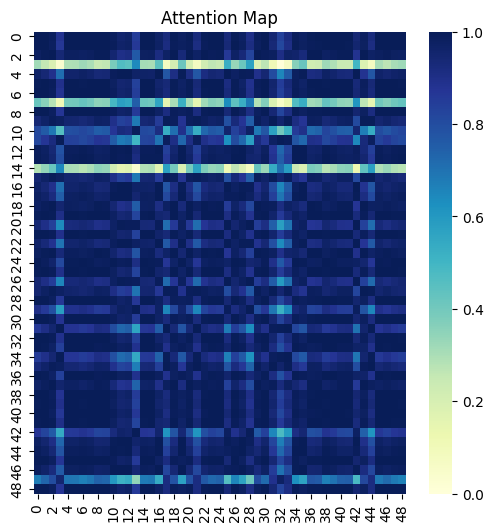

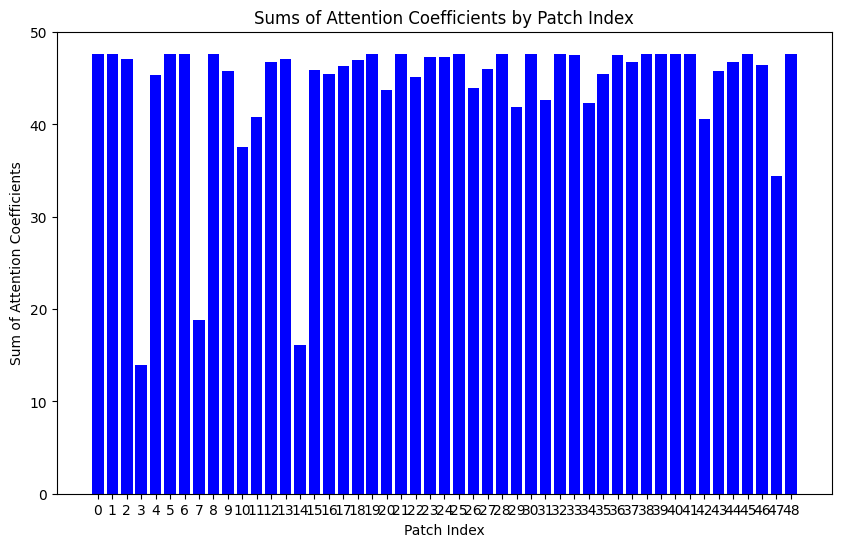

Predicted class for sample 54: 1.0
Row sums: [46.353756 46.35819  45.78001  17.852411 44.684902 46.315155 46.349888
 22.144981 46.359844 46.35404  22.01197  45.837543 46.170586 46.020203
 18.656937 45.087383 40.18282  46.025368 46.221924 46.359867 43.3765
 46.317913 35.94764  46.16465  46.137245 45.538017 43.455654 44.770153
 46.35606  41.861683 46.35822  46.359665 43.64253  46.281746 41.42291
 44.277542 46.258167 40.825626 46.29159  40.027363 46.357754 46.284153
 40.740543 42.19722  46.251656 44.85936  45.882374 34.54477  46.35988 ]


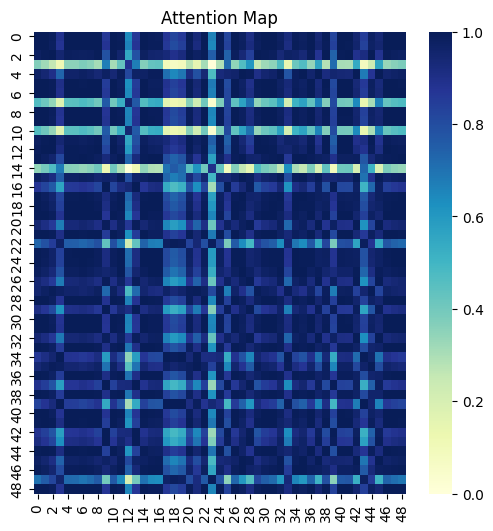

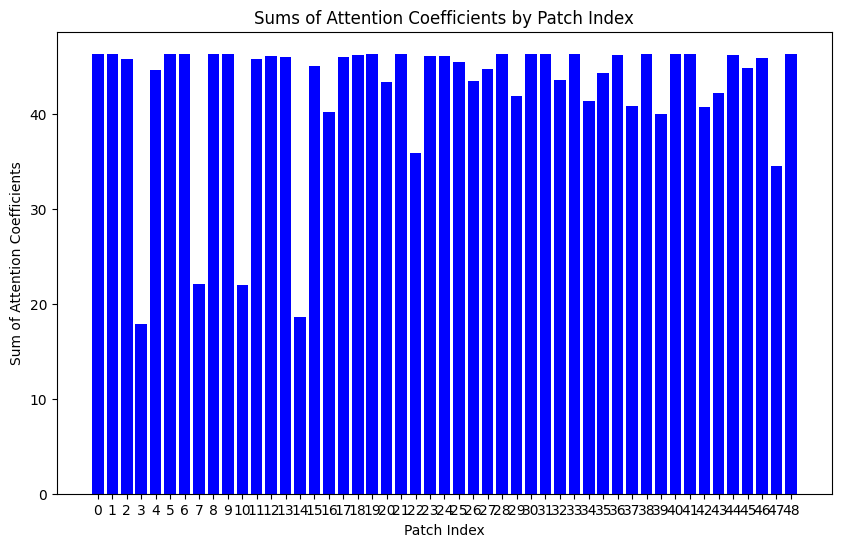

Predicted class for sample 55: 1.0
Row sums: [46.787624 46.734085 46.528114 16.386324 44.429806 46.81259  46.794174
 20.645626 46.752228 45.503555 46.130596 44.329224 46.772415 46.12697
 19.913982 46.81182  45.744663 46.576885 46.312702 46.758812 42.90341
 46.812206 37.421394 46.34238  43.389015 40.87362  43.106274 45.724888
 46.721928 41.196373 46.734314 46.762383 46.34331  46.540504 42.699677
 45.30163  46.49734  40.05134  45.020184 46.039764 46.731255 46.81164
 39.957935 41.57065  46.80433  46.75128  45.43428  36.037846 46.758026]


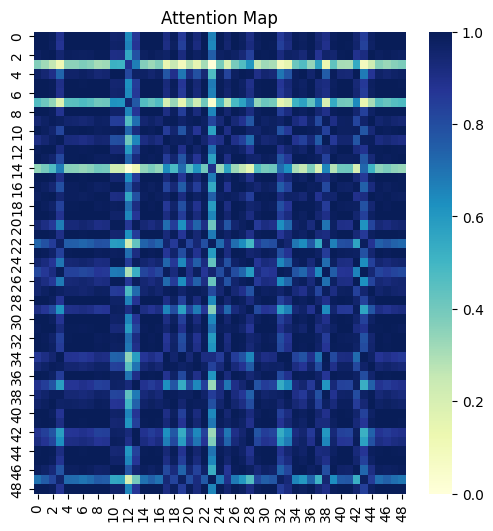

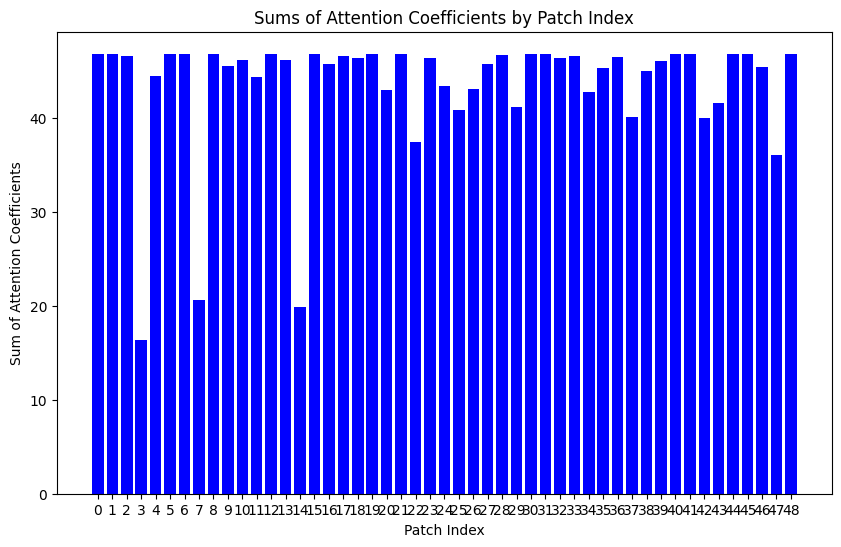

Predicted class for sample 56: 1.0
Row sums: [47.166393 47.110752 46.906864 16.187105 44.74686  47.192955 47.173252
 20.50007  47.129555 46.424072 27.304838 46.935356 45.512783 46.486248
 19.91067  46.969124 36.111668 46.189713 47.06133  47.00071  43.184376
 47.19251  37.64657  46.707428 47.18799  45.72895  43.580242 46.090977
 47.09817  41.438152 47.172714 39.070305 47.10369  46.911114 43.01336
 45.66053  46.86662  46.8536   44.16336  47.193356 47.10782  47.192493
 40.171917 43.557117 46.74056  47.144226 45.77588  36.241066 47.135567]


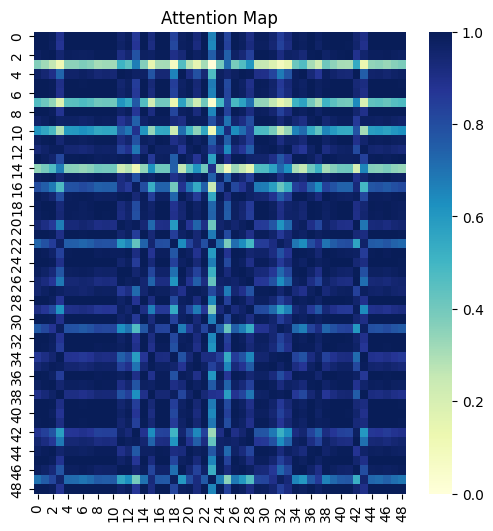

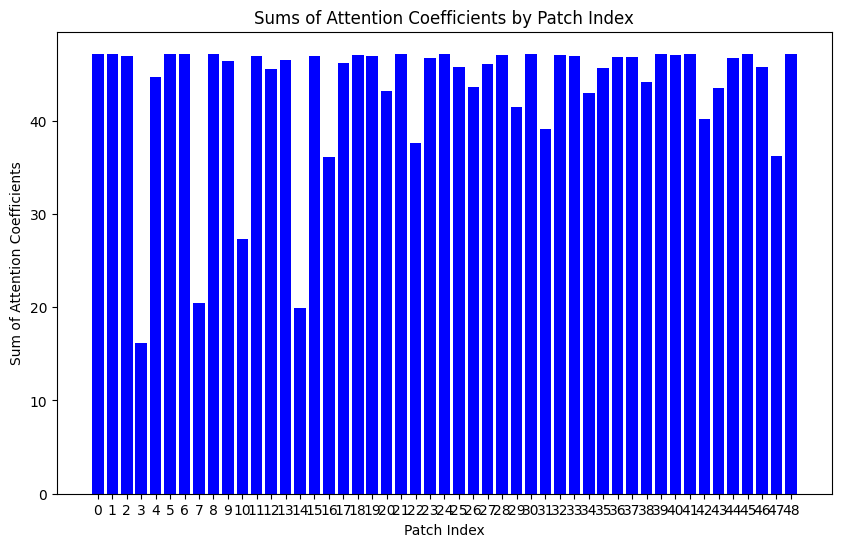

Predicted class for sample 57: 1.0
Row sums: [46.759422 46.734753 46.336895 16.99816  44.722797 46.752323 46.760746
 21.305166 46.744717 45.17633  39.799046 46.754185 46.658512 46.257168
 19.282543 44.79883  40.41172  46.060936 46.73226  46.748043 43.28791
 46.753536 36.77466  46.439125 46.146038 44.629105 43.48018  45.419476
 46.727554 41.65699  46.734886 46.70096  46.49579  46.598446 42.199345
 44.95633  46.564716 40.552933 45.997753 45.851196 46.733105 46.736057
 40.46259  42.016304 46.69477  44.984535 45.644577 35.370636 46.747654]


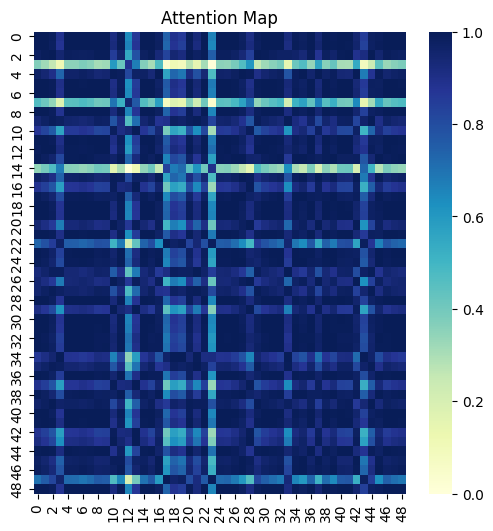

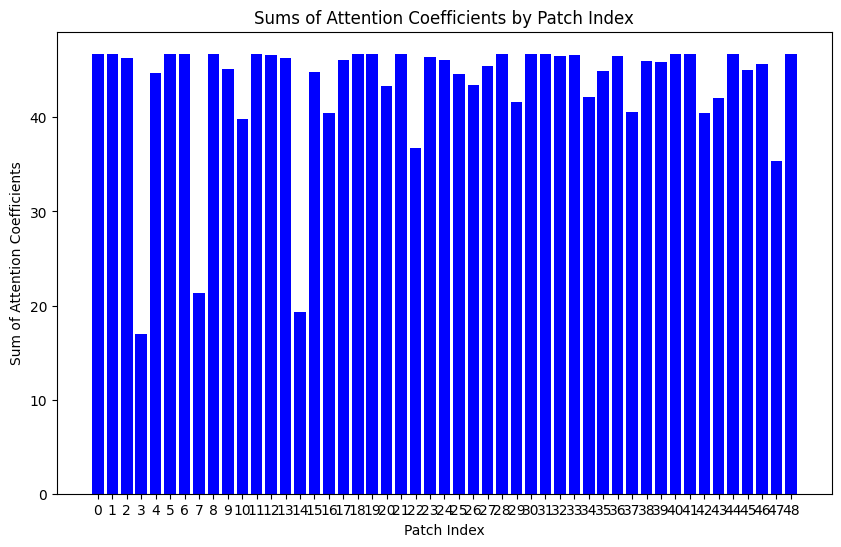

Predicted class for sample 58: 1.0
Row sums: [46.950333 46.89439  46.699795 16.209862 44.549026 46.977673 46.95729
 20.500849 46.91324  46.944336 30.388351 46.965004 45.798508 46.27315
 20.010517 46.973816 35.446186 46.88262  46.42592  43.942886 43.001442
 46.977177 37.571167 46.49276  46.155132 46.17913  43.20704  45.89837
 46.881794 41.27203  46.894627 46.764614 46.90695  46.695263 42.86686
 45.474846 46.65108  44.097813 43.431202 46.978134 46.891453 46.97775
 40.017906 41.651123 46.978462 46.94046  45.568653 36.182934 46.919273]


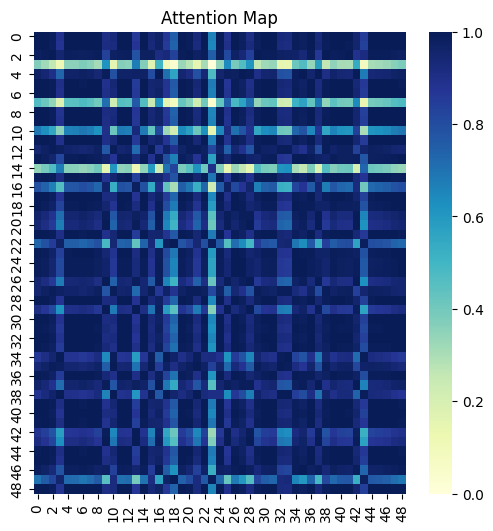

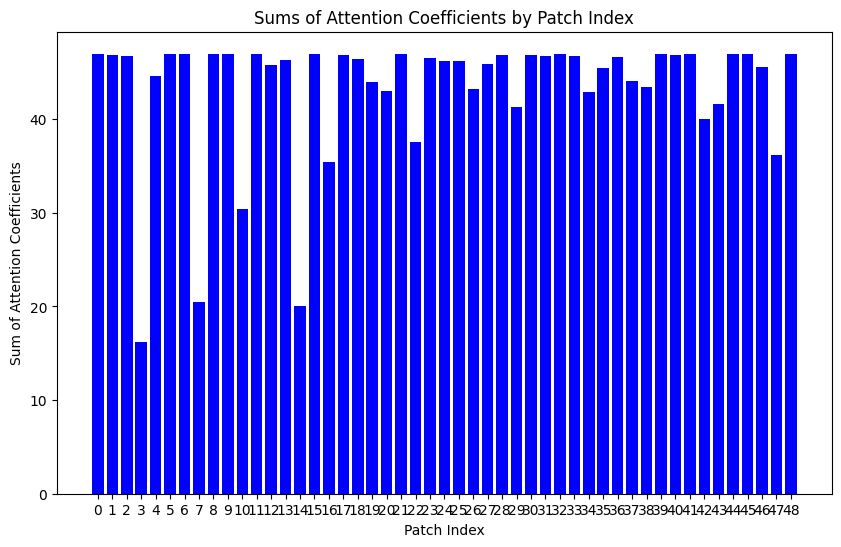

Predicted class for sample 59: 1.0
Row sums: [46.657288 46.642338 46.179325 17.28738  44.733902 46.639397 46.656853
 21.590845 46.64956  46.642506 22.864023 46.650192 46.52747  46.208977
 18.704033 45.81813  45.614666 46.605183 46.527473 46.44614  43.335938
 46.64115  38.107216 46.45938  46.10391  46.380802 45.232662 45.220875
 46.636814 41.739017 46.642437 45.862263 45.155643 46.525414 41.918396
 44.74252  46.494907 45.325043 45.37543  38.84232  46.641098 46.617973
 40.56632  42.09134  46.609554 46.657146 45.624813 34.975277 46.651524]


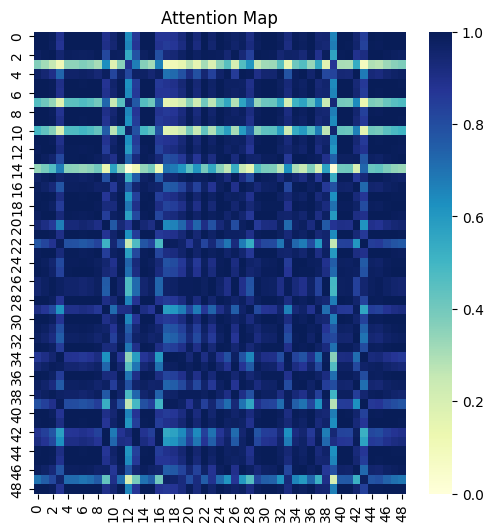

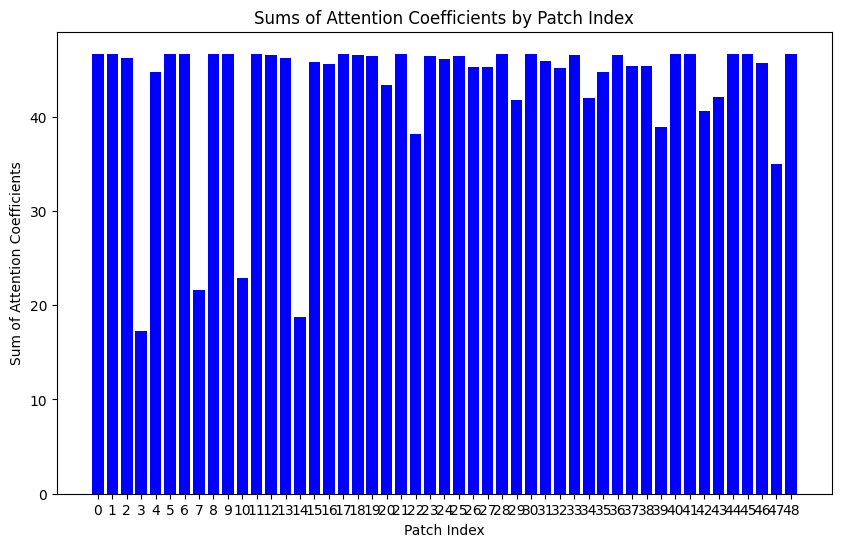

Predicted class for sample 60: 1.0
Row sums: [47.63419  47.581882 47.33997  16.149408 45.203568 47.656075 47.64036
 20.521545 47.599823 46.56753  25.568317 46.093777 44.350063 46.962128
 27.192348 47.656174 41.184483 43.970036 47.544872 47.648    43.615803
 47.655888 37.759903 47.183693 46.82962  45.731342 47.171047 46.48229
 47.56979  41.838192 47.582108 45.664734 47.587208 47.386414 43.28853
 46.0333   47.342155 46.304752 44.216732 47.407227 47.579067 47.653023
 40.54816  45.631725 47.64034  47.598892 46.246056 36.316948 47.605522]


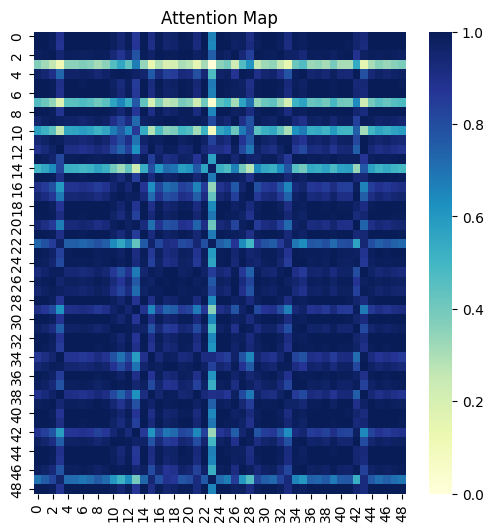

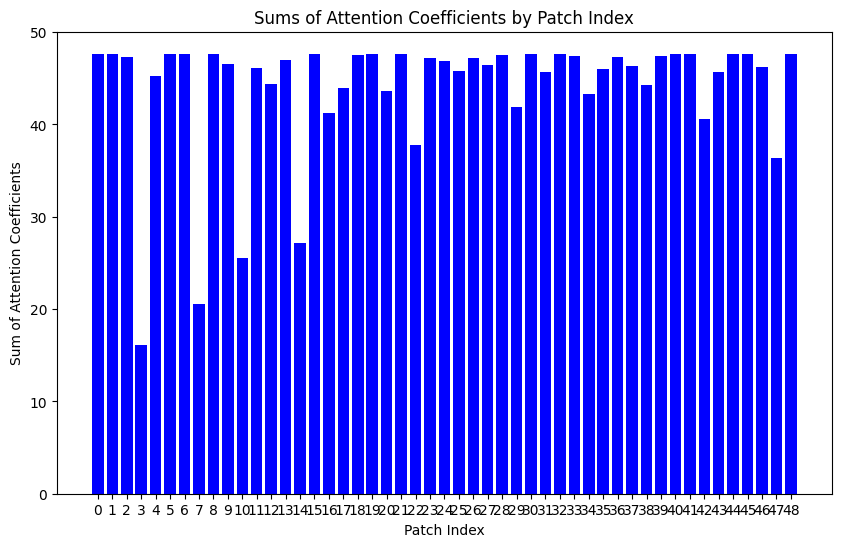

Predicted class for sample 61: 1.0
Row sums: [46.8269   46.775585 46.55329  16.42869  44.48936  46.849304 46.833042
 20.695063 46.793106 45.51472  46.443054 36.880375 46.80462  46.177483
 19.84309  46.848774 45.798107 46.805042 45.53247  46.799442 42.966778
 46.84905  37.384666 46.390717 43.76227  41.119896 43.169254 45.738453
 46.763805 41.26205  46.775806 46.772453 46.54708  46.586185 42.68889
 45.310745 46.54368  40.11784  46.032852 46.84948  46.772846 46.847095
 40.024487 41.63594  46.838703 46.792194 45.48957  35.99598  46.798683]


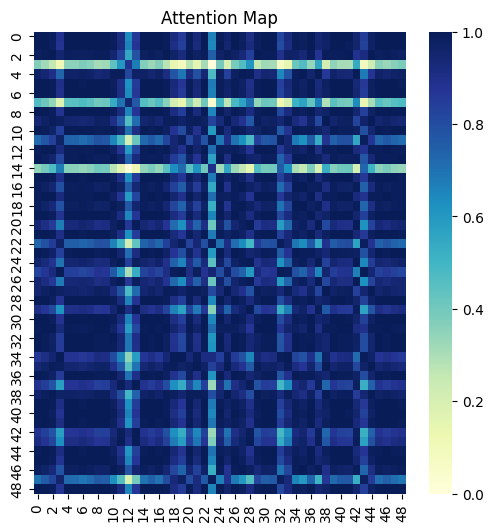

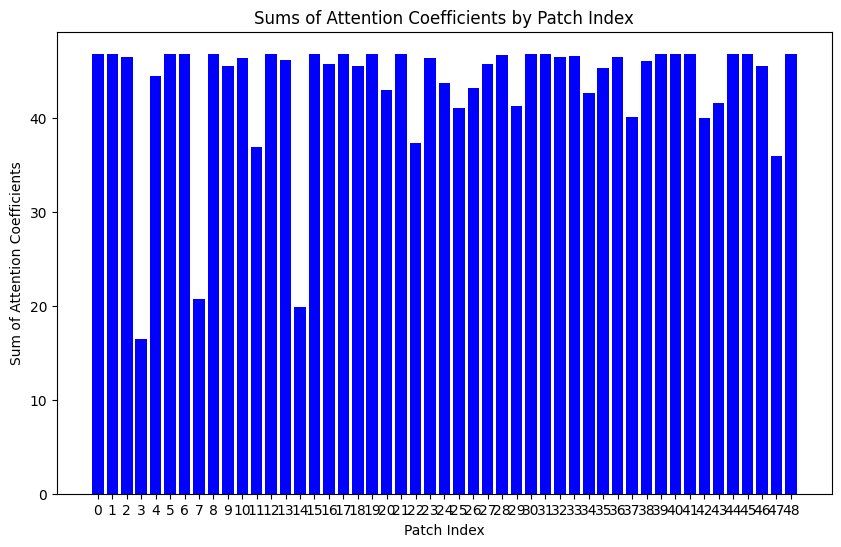

Predicted class for sample 62: 1.0
Row sums: [46.59105  46.558144 46.221027 16.86074  44.4809   46.593464 46.5939
 21.134907 46.570408 46.59236  21.029953 46.49709  46.51644  46.047455
 19.577068 46.11966  41.772995 46.421776 46.579662 43.395348 43.033344
 46.594193 42.723145 46.23735  45.93237  43.620987 36.622772 45.34702
 46.54956  41.395718 46.558304 46.5694   45.955204 46.406418 42.218056
 44.900536 46.37027  40.289932 46.038624 45.341206 46.556164 46.58188
 40.19952  41.75602  46.47319  46.571083 45.417633 35.505547 46.574158]


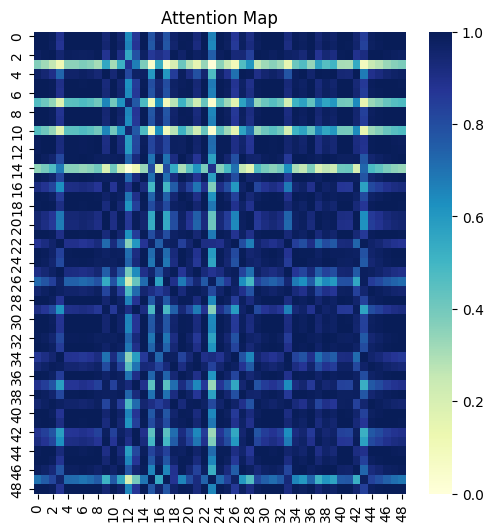

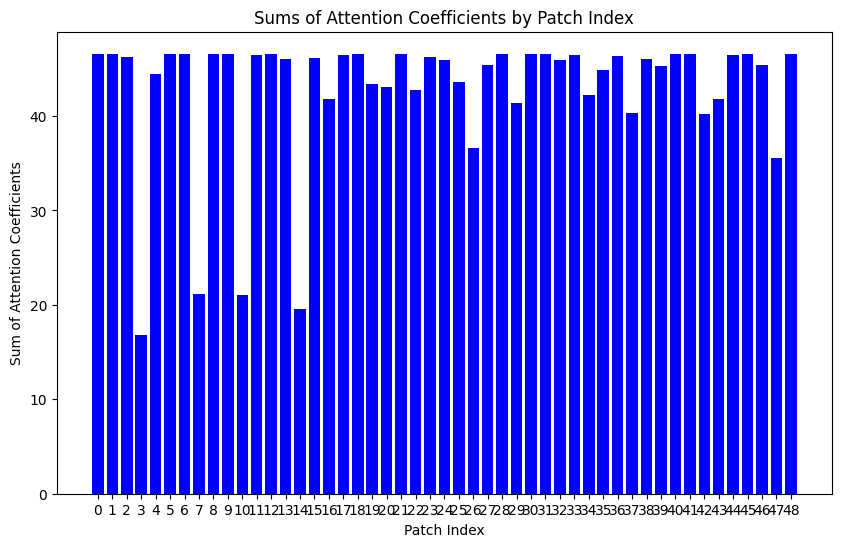

Predicted class for sample 63: 1.0
Row sums: [46.884663 46.871006 46.39567  17.269468 44.959423 46.865078 46.883972
 21.601677 46.877876 45.172924 46.68826  46.167107 46.74977  46.44034
 18.942165 46.868378 46.122158 46.839016 46.593636 46.87996  43.551815
 46.866917 36.573055 46.610558 43.89754  46.301224 43.741035 45.426548
 46.865677 41.941814 46.8711   46.884315 44.91494  46.755936 42.103165
 44.94407  46.725636 42.95472  46.60264  45.1377   46.86981  46.84276
 40.758617 42.297157 46.81738  46.877556 45.854813 35.148415 46.879723]


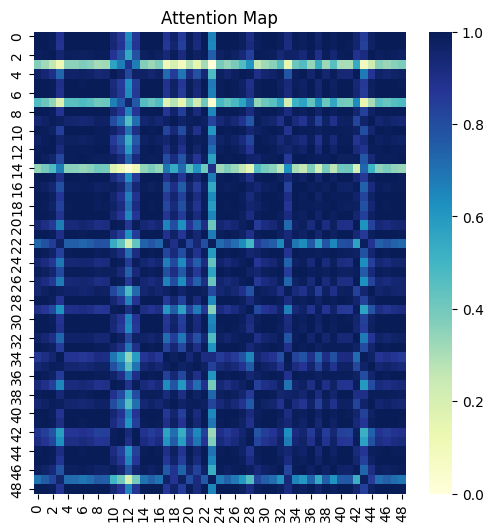

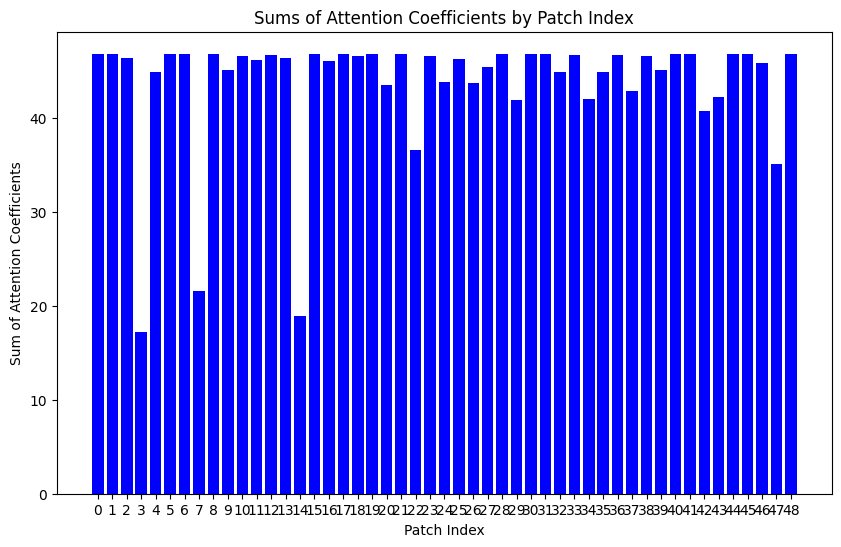

Predicted class for sample 64: 1.0
Row sums: [47.34513  47.308567 46.939816 14.994851 45.021202 47.34817  47.348328
 19.589674 47.322174 46.68241  18.864727 46.285664 36.087578 46.745182
 17.813747 47.29425  44.608376 44.94129  46.449066 46.35599  43.430557
 47.348953 36.772316 47.280033 46.721127 46.603767 43.643074 45.979366
 47.29907  41.63327  47.310856 47.33185  47.244434 47.140938 42.5412
 45.488613 47.101055 45.656933 46.379875 47.347103 47.30638  47.335606
 40.321842 42.053543 47.347668 47.32148  46.051662 35.18196  47.32633 ]


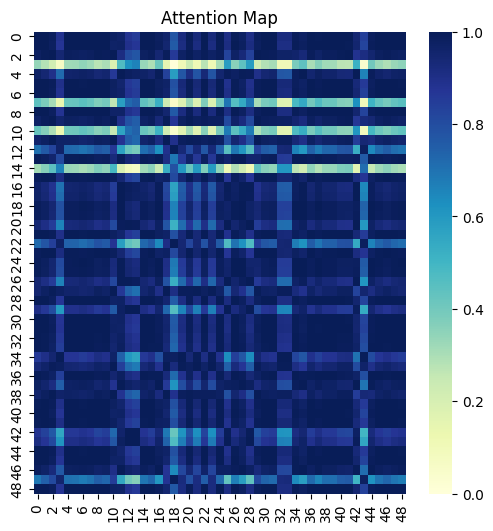

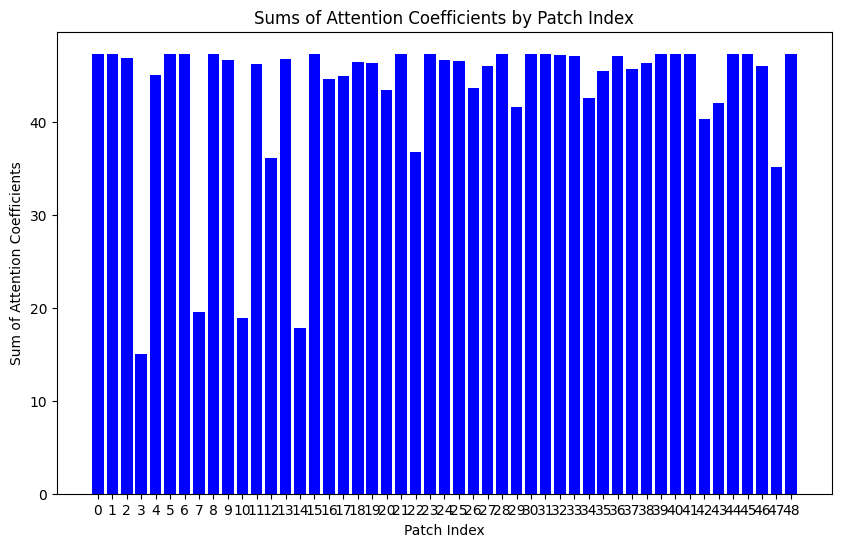

Predicted class for sample 65: 1.0
Row sums: [46.807026 46.73963  46.625202 16.082443 44.2932   46.84735  46.816086
 20.319044 46.7617   45.664692 40.764336 46.77748  46.83278  46.069946
 20.212936 46.845192 45.664387 46.816166 44.727726 46.769848 42.721523
 46.846207 37.729576 46.30158  46.853416 42.65811  42.929653 45.875805
 46.725094 40.97646  46.789097 43.888916 46.47454  46.518467 42.94123
 45.47123  46.470737 46.82839  46.66327  46.848595 46.73623  46.853725
 39.71583  41.35824  46.85258  46.760536 45.338238 36.355156 46.76887 ]


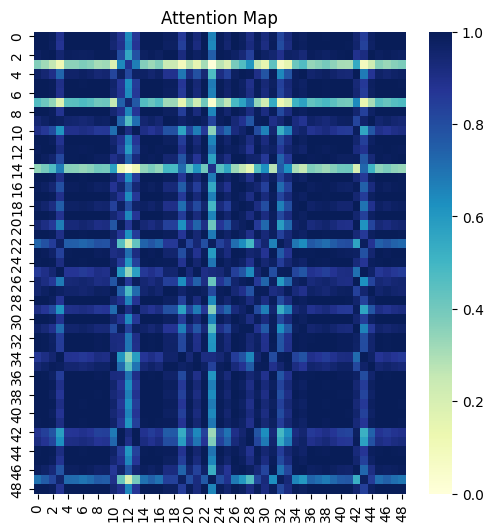

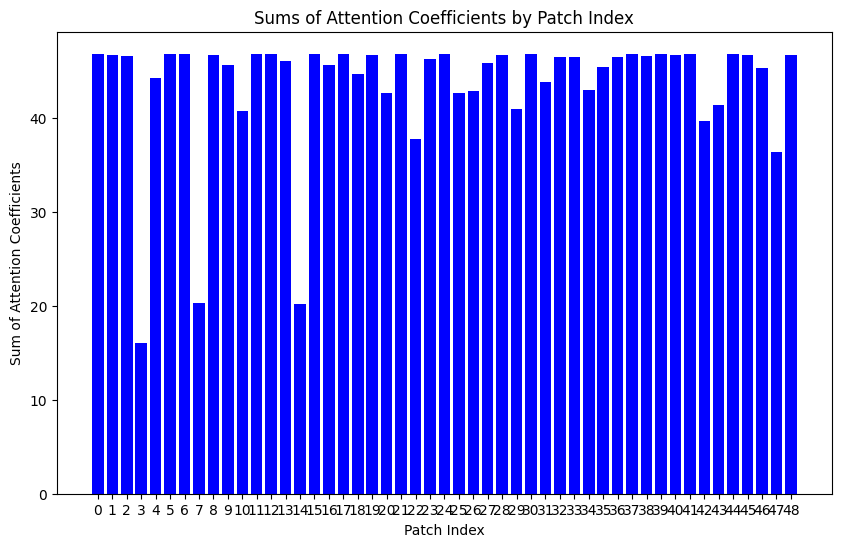

Predicted class for sample 66: 1.0
Row sums: [47.188168 47.10903  47.0612   15.61595  44.50471  47.240814 47.199284
 19.899523 47.13449  46.131287 40.8653   45.897457 45.82558  46.378716
 20.484837 47.237564 45.947247 47.21097  46.707497 47.1735   42.865166
 47.239075 38.18485  46.503765 47.06838  46.38347  43.081757 46.338474
 47.09241  41.053593 47.16701  44.72825  46.814724 46.862698 43.4226
 45.940758 46.81433  47.148804 46.995758 47.242767 47.105133 47.252808
 39.748802 41.933914 47.135223 47.133133 45.602413 36.799232 47.142834]


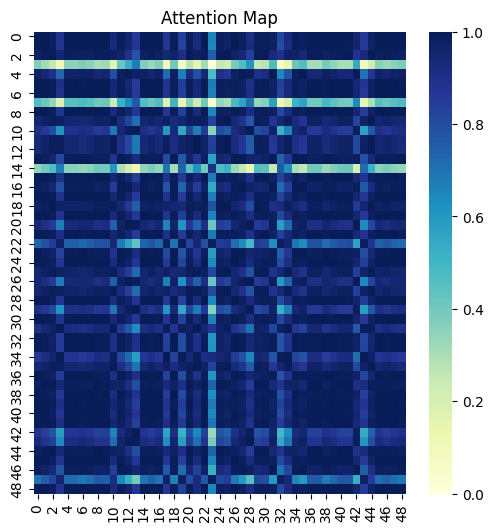

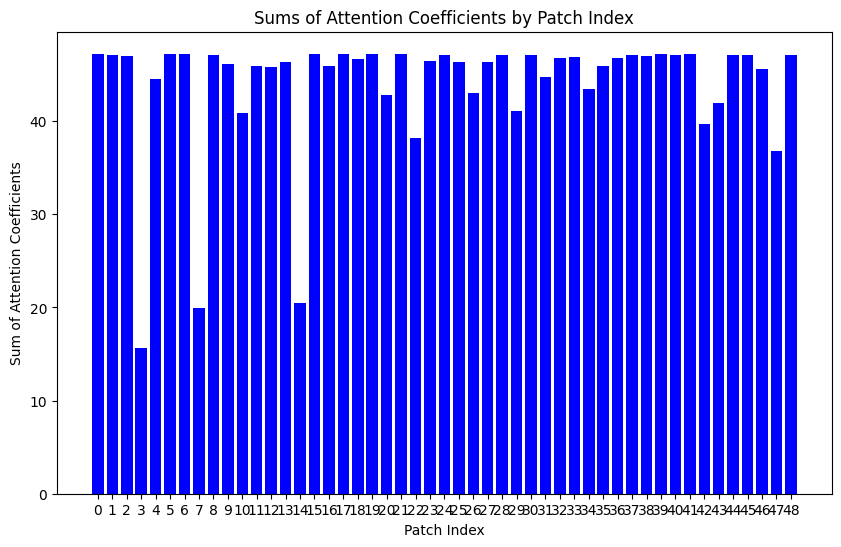

Predicted class for sample 67: 1.0
Row sums: [46.889057 46.85075  46.539677 16.6862   44.689    46.896873 46.89283
 20.983505 46.8646   45.434555 46.80657  46.85414  46.827442 46.309483
 19.53822  46.897675 45.950428 46.891953 45.9636   46.869465 43.202213
 46.897346 37.126633 46.508278 46.58003  44.55405  43.40064  45.6692
 46.84119  41.52563  46.85092  46.492077 46.651505 46.686787 42.51811
 45.221474 46.648426 45.75876  46.170128 46.89618  46.848537 46.88764
 40.303463 41.894127 46.873306 46.86389  45.65542  35.723526 46.86889 ]


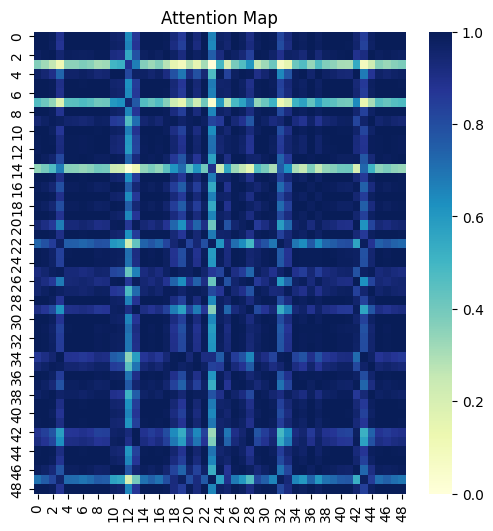

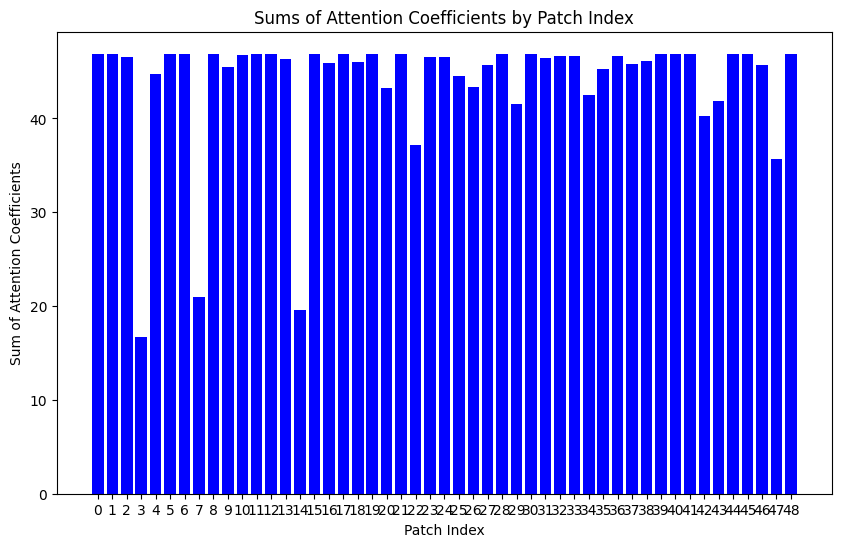

Predicted class for sample 68: 1.0
Row sums: [46.754684 46.719982 46.38913  16.838009 44.6089   46.75876  46.757828
 21.118904 46.732788 46.12892  45.704212 42.04293  46.68368  46.197792
 19.46002  46.75989  45.847057 46.76148  44.567226 46.73724  43.1446
 46.75941  36.98057  46.391197 45.371025 40.75972  43.340214 45.511654
 46.711063 41.490314 46.720146 46.36666  46.52985  46.563858 42.358574
 45.0624   46.526882 40.374268 46.65781  46.75785  46.717926 46.747837
 40.283047 41.854115 46.73212  46.73214  45.558098 35.58217  46.736717]


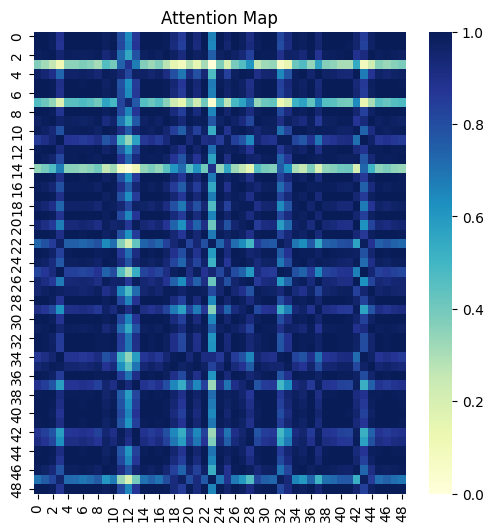

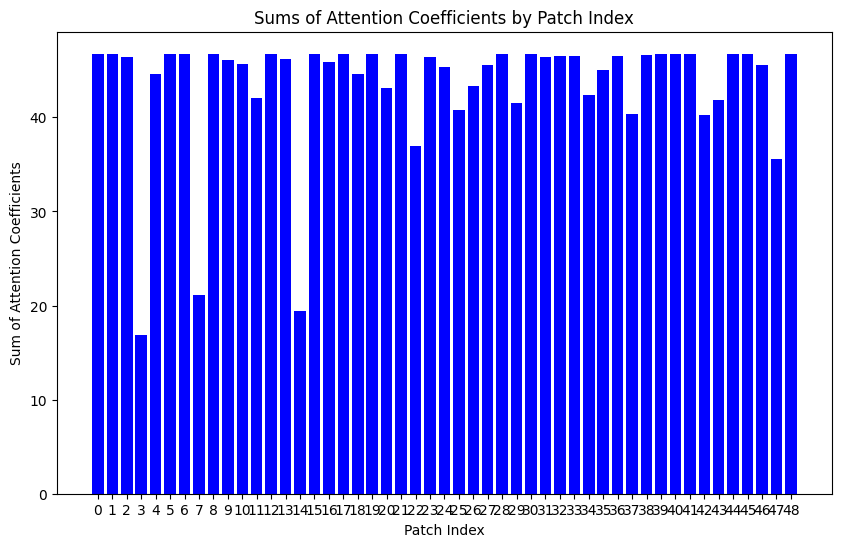

Predicted class for sample 69: 1.0
Row sums: [46.895805 46.90283  46.286194 17.67284  45.192997 46.853027 46.891346
 22.051558 46.903362 46.82831  22.830883 45.905178 46.69839  46.5631
 18.183777 46.538498 46.576073 43.750065 44.677467 45.662266 43.846375
 46.85603  41.342136 46.86822  42.634308 46.717514 43.913113 45.227367
 46.90104  42.28644  46.902935 45.979458 46.75082  46.828323 41.733047
 44.712143 46.804653 46.305977 41.90364  43.76892  46.90248  46.81955
 41.131924 42.63199  46.9033   44.285873 46.19536  34.579784 46.90366 ]


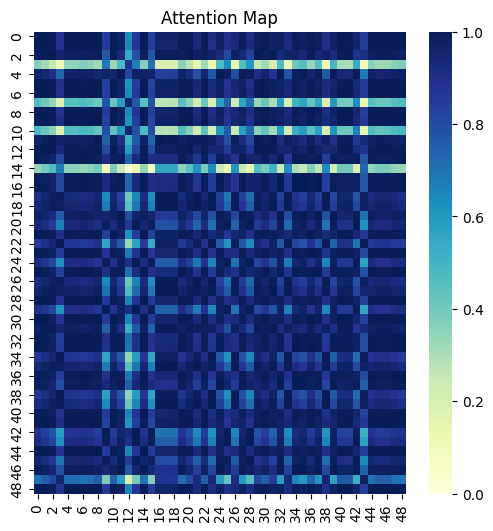

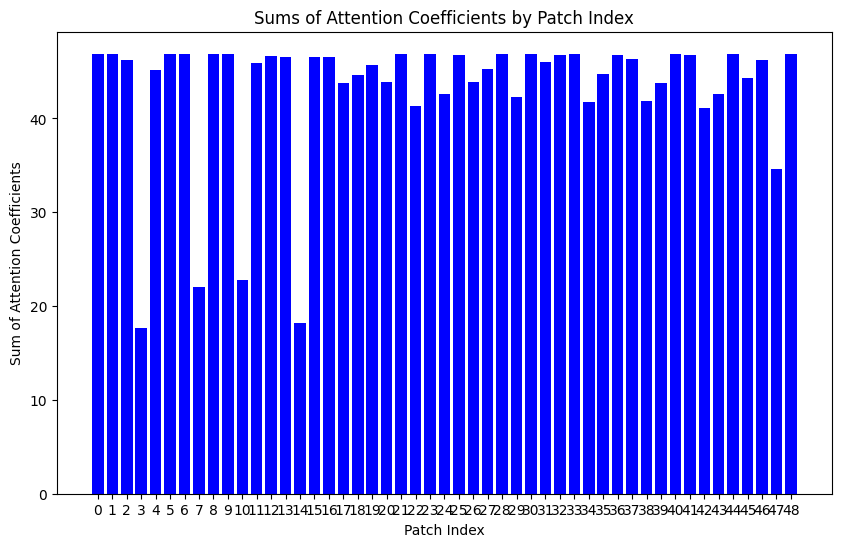

Predicted class for sample 70: 1.0
Row sums: [46.786057 46.74542  46.44937  16.566158 44.56116  46.79644  46.790245
 20.859953 46.75993  45.40342  44.839676 40.254787 46.73125  46.19377
 19.356285 46.797012 45.980507 44.95494  46.747124 45.559303 43.068558
 46.796787 37.043724 46.449703 46.179546 43.400978 43.371025 45.586685
 46.73546  41.38806  46.775986 41.63541  46.187626 46.576836 42.443398
 45.14129  46.537716 46.48039  37.066795 46.795902 46.743114 46.78843
 40.16419  41.757248 46.320835 46.762512 45.53354  35.636044 46.764446]


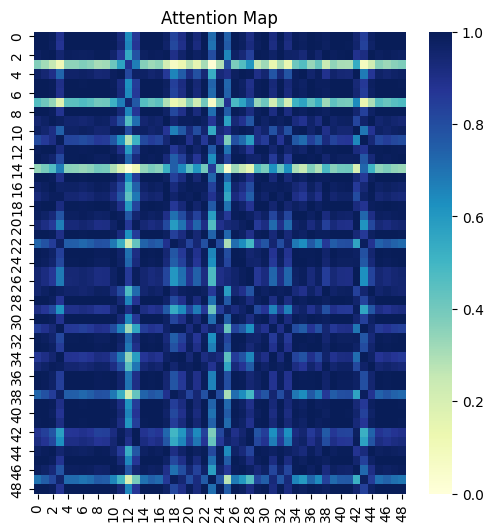

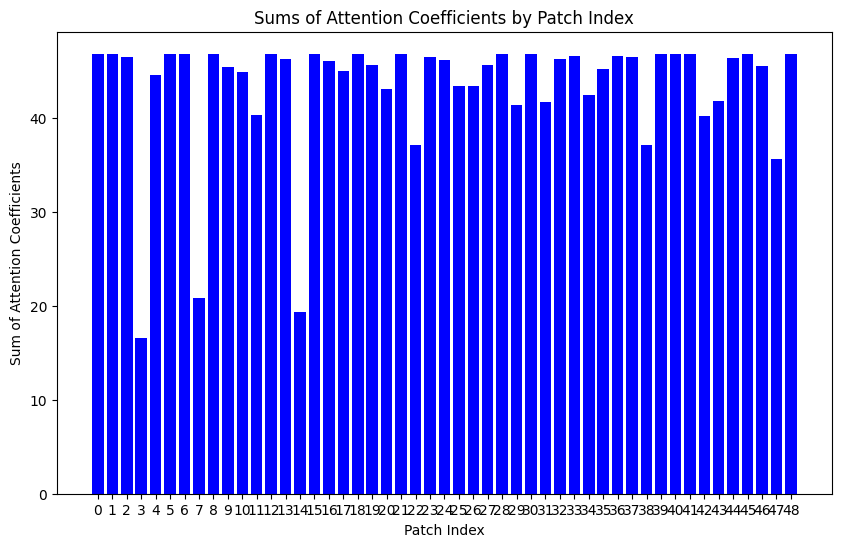

Predicted class for sample 71: 1.0
Row sums: [46.463703 46.415142 46.18662  16.562063 44.193233 46.483788 46.469414
 20.792618 46.431816 46.475437 24.186588 45.226826 46.37964  45.837135
 19.913403 46.483437 45.014267 45.56659  46.02263  46.343346 42.70643
 46.48363  37.17956  46.043953 46.23576  44.674862 42.904285 45.38271
 46.403896 41.03923  46.45249  45.853554 46.19528  46.23306  42.38622
 44.96184  46.1916   46.127457 46.27668  46.48385  46.412525 46.48075
 39.827606 42.288136 45.70865  46.430954 45.16817  35.816017 46.437115]


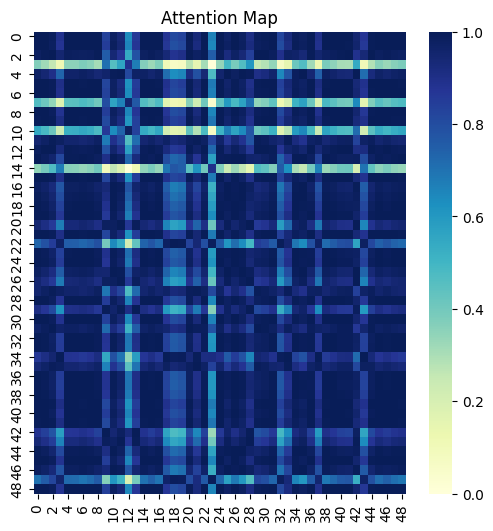

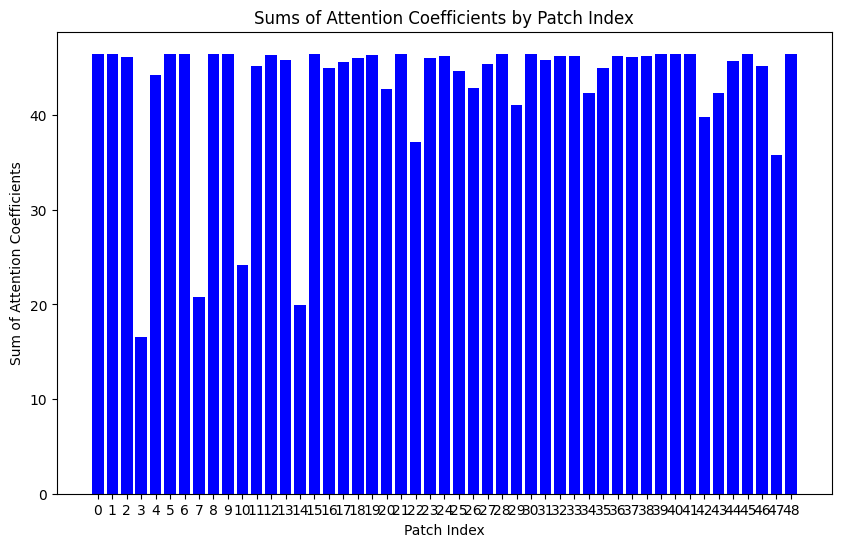

Predicted class for sample 72: 1.0
Row sums: [46.449295 46.442043 45.940815 17.76152  44.649513 46.423622 46.447533
 22.013186 46.05594  44.97114  22.341707 43.907887 39.590534 46.05135
 18.999144 46.33863  30.965338 45.884247 44.679966 46.426643 43.30398
 46.425743 36.28203  46.209446 46.413918 45.998363 43.485214 44.975834
 46.437904 45.236343 46.448635 35.69934  46.12687  43.99985  41.412327
 44.498703 46.356384 45.519405 44.671425 45.738804 43.041225 46.387653
 40.620556 42.100258 46.375282 46.446793 45.50033  34.88669  46.448208]


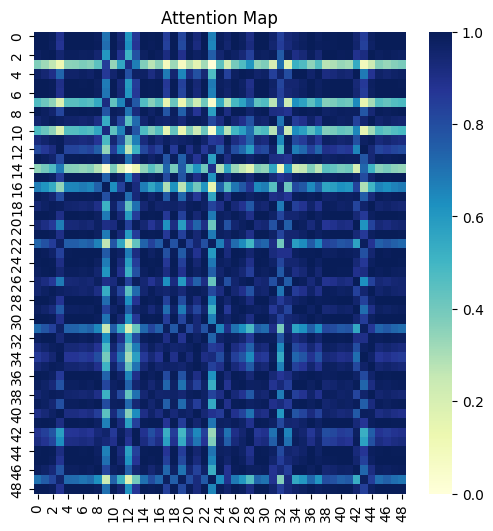

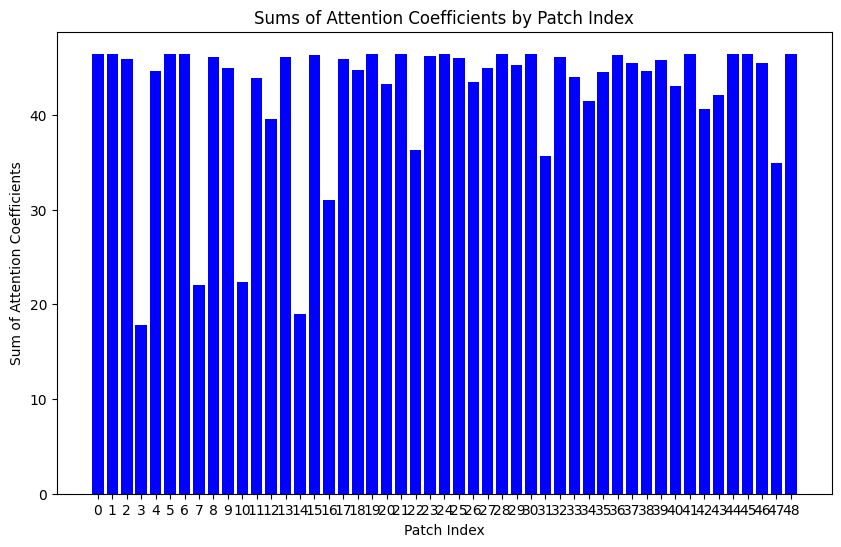

Predicted class for sample 73: 1.0
Row sums: [46.892902  46.817303  46.754642  15.8542595 44.278282  46.94217
 46.90343   20.090473  46.841705  45.826824  40.713387  46.05137
 46.942146  46.108845  20.39269   46.9392    45.68812   46.85474
 42.343624  46.85079   42.673195  46.940586  37.949337  46.3508
 46.9501    46.854057  42.885338  46.03292   46.801334  40.897984
 46.829704  46.691017  46.532864  46.57939   43.139256  45.63743
 46.528843  43.96538   46.917274  46.94394   46.813557  46.95275
 39.6186    41.285896  46.95155   46.84041   45.35144   36.576347
 46.849693 ]


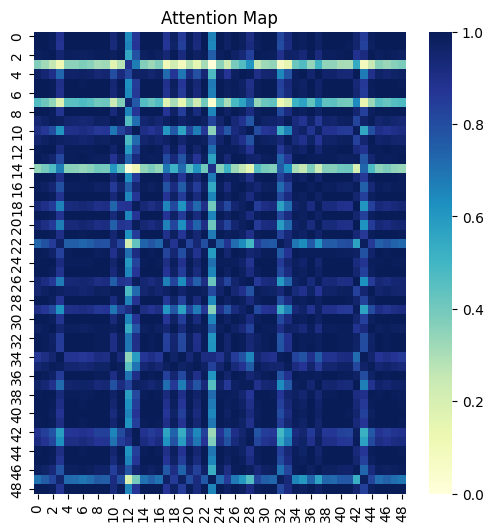

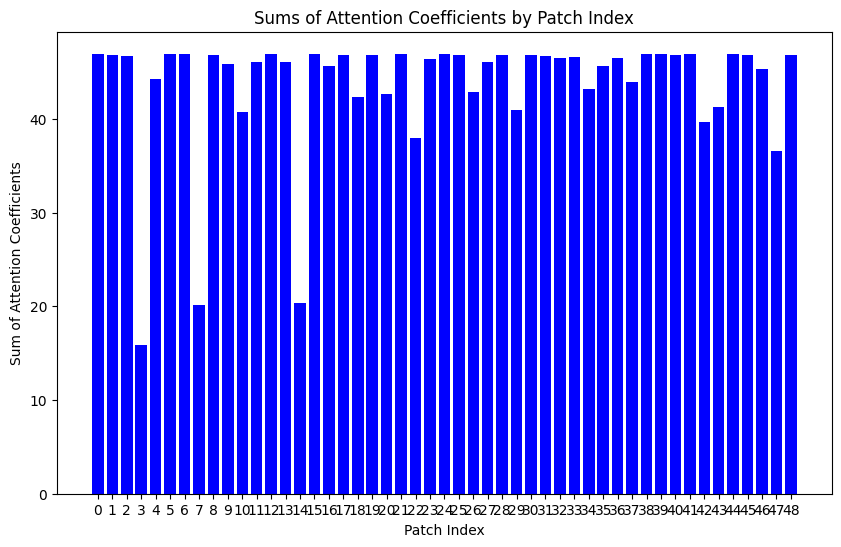

Predicted class for sample 74: 1.0
Row sums: [46.793537 46.77432  46.339054 17.150955 44.815258 46.78032  46.793873
 21.465542 46.78275  44.346134 32.59521  46.78941  46.676105 46.320618
 19.113419 46.78303  46.562057 28.40026  46.695904 46.785458 43.396393
 46.781837 36.6613   46.49649  43.884144 40.907345 43.58681  45.397663
 46.768055 41.778732 46.774433 43.87105  46.56672  46.64868  42.131348
 44.925713 46.616695 40.681824 46.734703 46.497856 46.7729   46.76111
 40.592014 42.135437 46.738384 46.78234  45.722412 35.248592 46.785145]


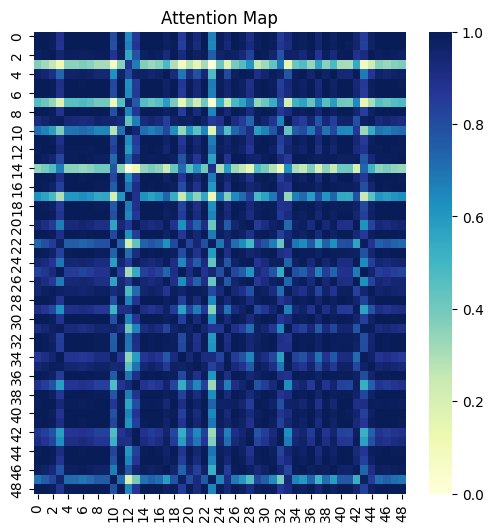

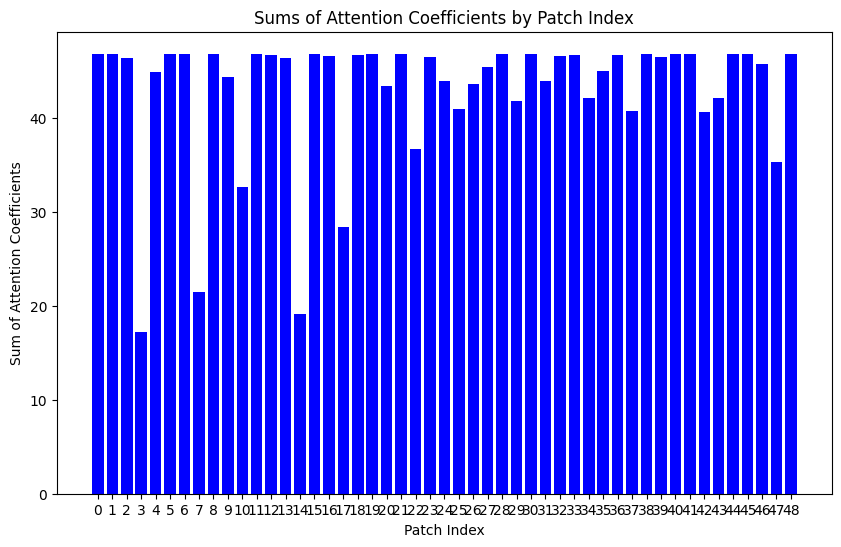

Predicted class for sample 75: 1.0
Row sums: [47.436214 47.452915 46.700047 14.906069 45.614338 47.378258 47.4296
 19.779013 47.45159  47.43717  41.98064  47.405804 45.966106 47.109386
 15.254522 46.03624  45.473495 45.95062  46.731647 47.44692  44.124344
 47.382126 45.548424 41.24394  47.009647 45.17895  45.65144  45.473877
 47.452408 47.391216 47.452915 47.451725 45.431656 47.386375 41.48961
 44.882366 47.362568 41.253696 45.401093 47.2698   47.452885 47.335876
 41.103073 42.774616 47.107563 47.43102  46.535603 33.433662 47.450493]


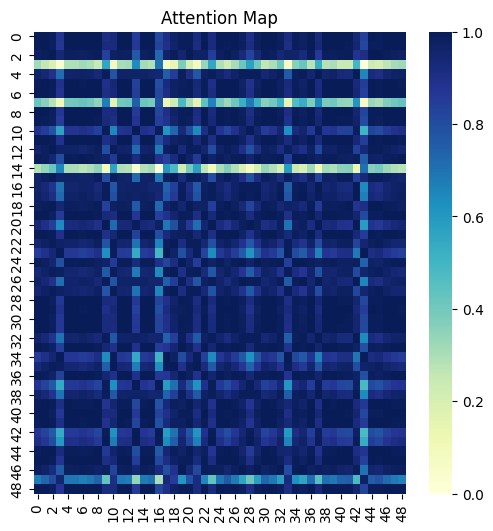

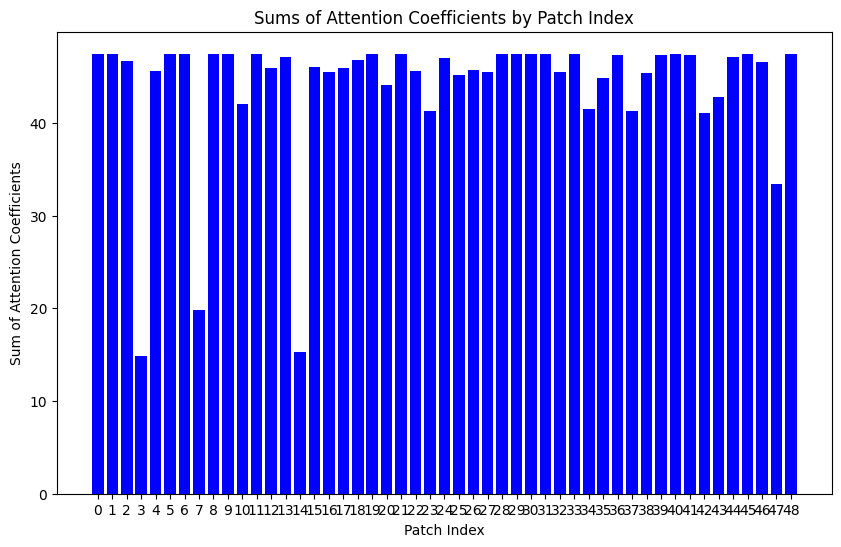

Predicted class for sample 76: 1.0
Row sums: [46.42134  46.381474 46.096287 16.805094 44.252506 46.431847 46.425484
 21.038929 46.397564 46.427753 36.890404 41.687977 46.369183 45.843403
 19.69006  46.431484 40.993244 46.429848 45.027977 46.40071  42.79746
 46.432163 36.960175 46.03975  46.40109  46.411083 42.991543 45.259666
 46.37173  41.15828  46.381653 46.41575  46.181755 46.21685  42.208344
 44.827507 46.17869  40.041553 39.850655 46.43103  46.37922  46.424255
 39.963795 41.51848  46.417603 46.05692  45.200054 35.590553 46.400116]


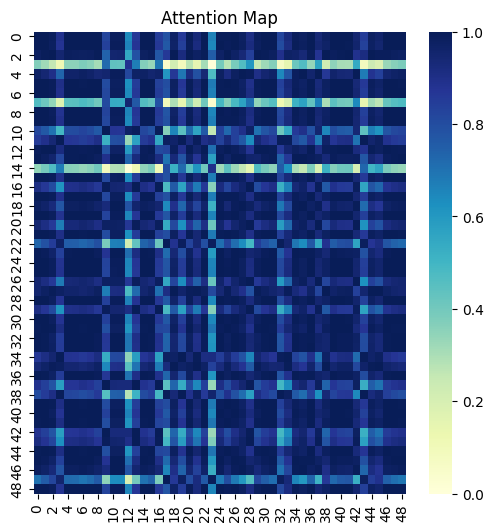

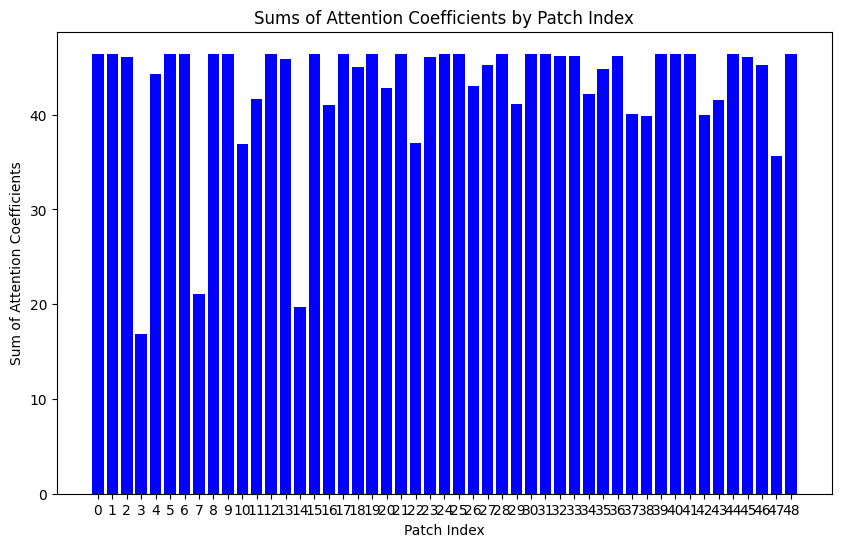

Predicted class for sample 77: 1.0
Row sums: [46.684227 46.66062  46.262455 17.324085 44.68237  46.676365 46.685394
 21.582548 46.67392  46.20777  41.492935 46.685642 38.923748 46.192486
 19.437078 46.6855   38.52393  42.403957 43.676163 46.68206  43.26895
 46.677605 36.787098 46.6321   46.64672  46.327156 45.957302 45.352627
 46.653645 41.661926 46.678017 45.7047   44.456253 46.52753  42.16226
 44.89364  46.494476 40.573853 46.23087  45.78043  46.659027 46.659893
 40.48481  42.016003 46.639584 46.685093 45.58991  35.39546  46.673073]


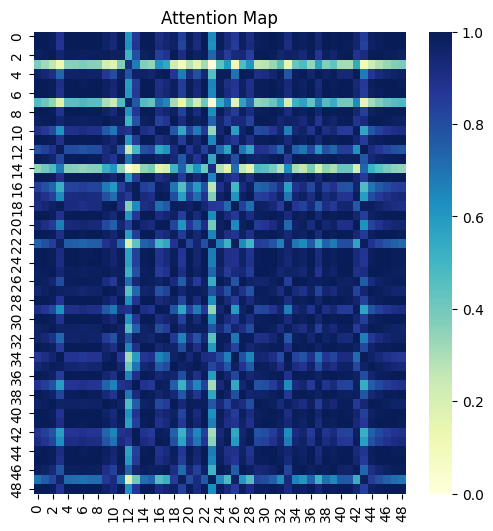

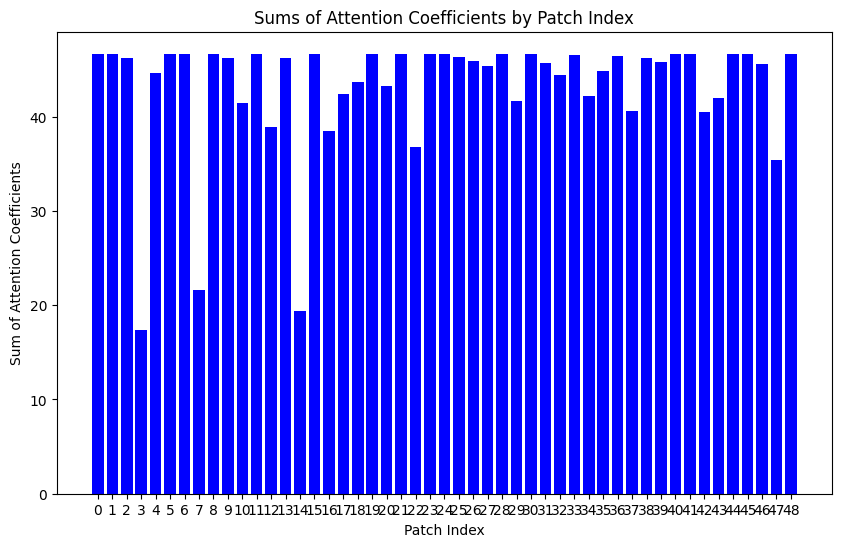

Predicted class for sample 78: 1.0
Row sums: [46.681473 46.597363 46.594906 15.524059 43.982788 46.7404   46.69355
 19.750261 46.62416  45.7156   44.467297 45.8252   46.757084 45.853065
 20.484997 46.73654  45.42644  44.444366 45.959114 46.634193 42.35817
 46.738327 37.985733 45.863785 46.081066 46.290012 42.57246  45.91354
 46.57996  40.568478 46.655243 37.837433 46.294205 46.343147 43.099346
 45.533085 46.28998  44.145126 36.398125 46.742752 46.593277 46.75568
 39.28159  40.9591   46.72776  46.75641  45.07536  36.626476 46.632984]


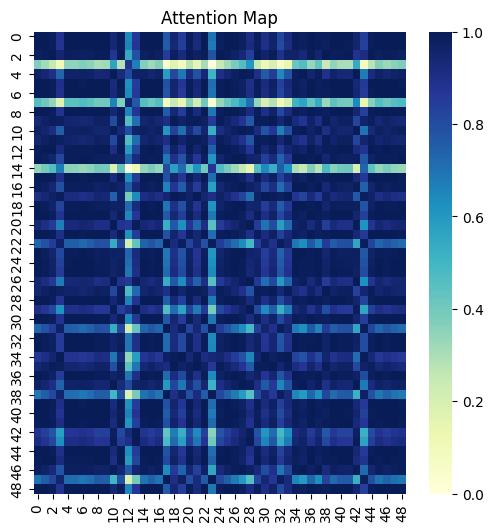

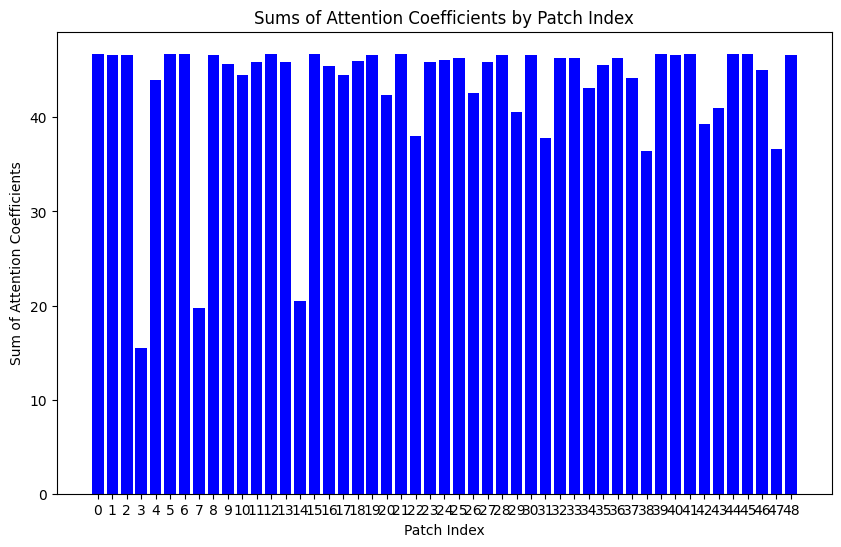

Predicted class for sample 79: 1.0
Row sums: [46.728466 46.669415 46.50211  16.276224 44.315334 46.759678 46.736027
 20.519608 46.696198 46.761715 20.39318  46.762012 46.730247 46.038853
 46.762012 46.76195  36.582424 46.014088 45.154293 44.65076  42.775887
 46.758984 37.518326 46.260117 45.907387 46.279152 35.88934  45.724392
 46.656322 41.059246 46.669662 46.733776 46.511604 44.432182 42.748806
 45.310574 46.42033  39.909653 46.39772  46.76089  46.666363 46.76176
 39.815933 41.435303 46.757027 46.12943  29.788376 36.143616 46.69545 ]


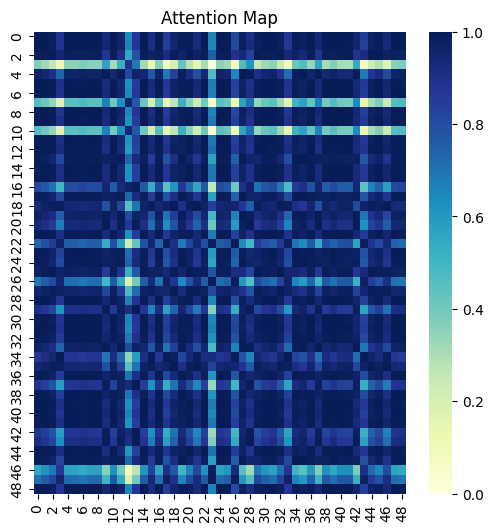

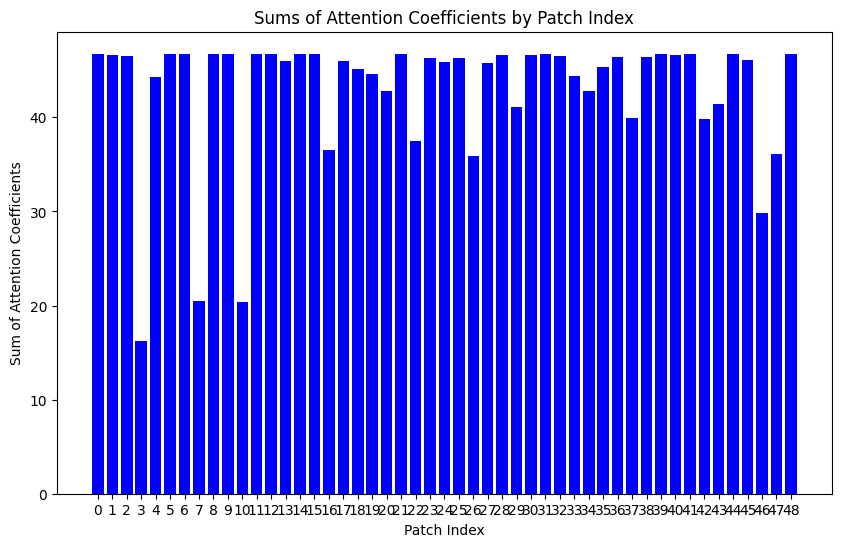

Predicted class for sample 80: 1.0
Row sums: [46.652523 46.612484 46.32092  16.737911 44.458553 46.662758 46.65666
 21.000465 46.626785 45.241802 43.247707 46.663193 46.59854  46.068756
 19.629545 46.66332  45.711075 46.570217 46.504875 46.63184  42.985485
 46.663097 37.063087 46.267345 44.512276 40.800686 43.181973 45.471516
 46.602673 41.326122 46.612667 44.542816 46.607124 46.446358 42.37761
 45.03305  46.407803 40.208416 46.224365 36.903297 46.610214 46.65486
 40.11711  41.690735 46.64175  46.625904 45.41774  35.677364 46.631237]


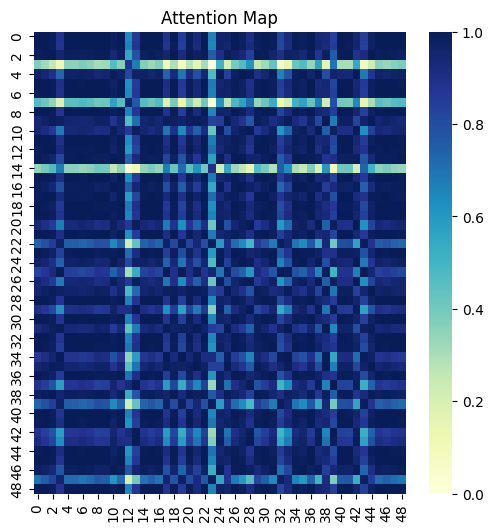

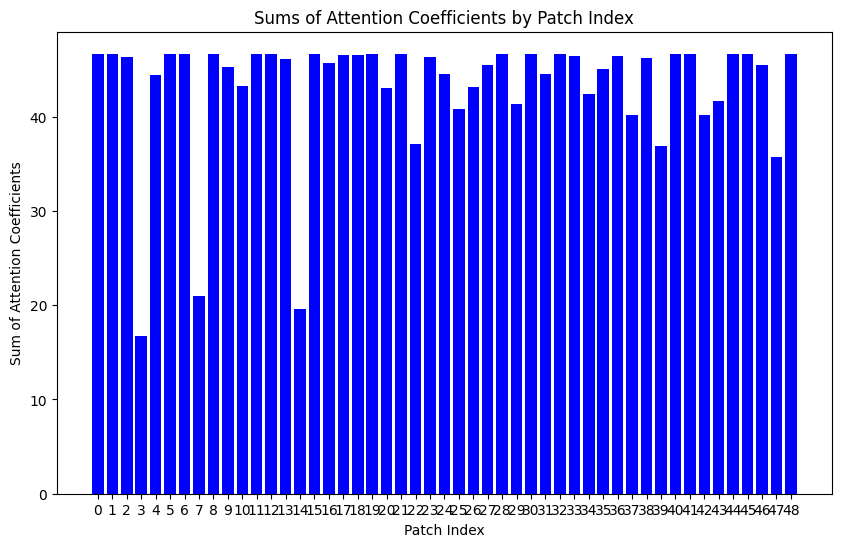

Predicted class for sample 81: 1.0
Row sums: [46.83025  46.786777 46.512226 16.635363 44.580563 46.84395  46.834972
 20.910809 46.80208  46.039402 46.536556 46.467308 46.784668 46.223896
 19.63553  46.84421  45.940926 46.842476 46.028065 46.80752  43.083714
 46.844128 37.207928 46.428013 45.123272 46.804707 43.28318  45.665813
 46.776337 41.40092  46.79796  40.70603  46.81154  46.612926 42.56005
 45.226906 46.572987 40.049328 43.268887 43.3959   46.78435  46.837578
 40.176384 41.770454 46.825676 46.801285 45.557907 35.811207 46.806877]


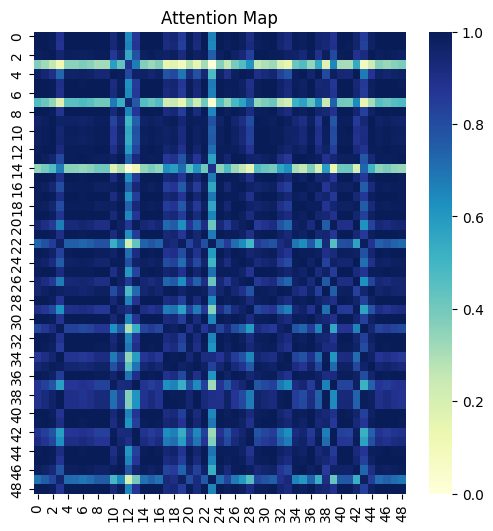

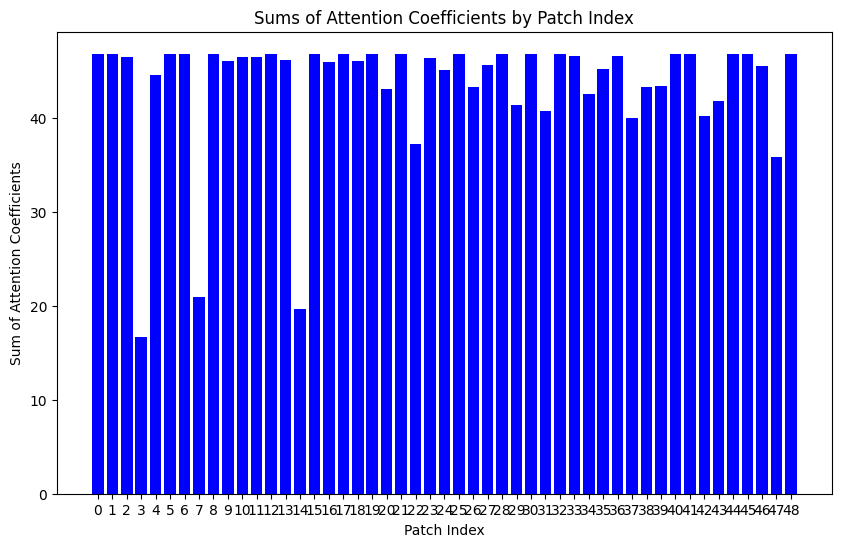

Predicted class for sample 82: 1.0
Row sums: [46.938335 46.900383 46.588512 16.912746 44.748745 46.945854 46.94205
 21.180367 46.914124 46.575825 45.290436 41.90108  44.92542  46.361954
 19.647686 46.946682 46.55483  46.595364 46.868923 45.711105 43.268757
 46.946342 37.191257 46.559807 46.76317  46.90875  43.84716  45.719196
 46.890892 41.60015  46.942524 36.858826 45.63423  46.73741  42.57327
 45.272163 46.18556  46.935818 46.923607 46.94515  46.89819  46.936523
 41.342056 46.235672 46.92212  46.91342  45.71085  35.790787 46.918373]


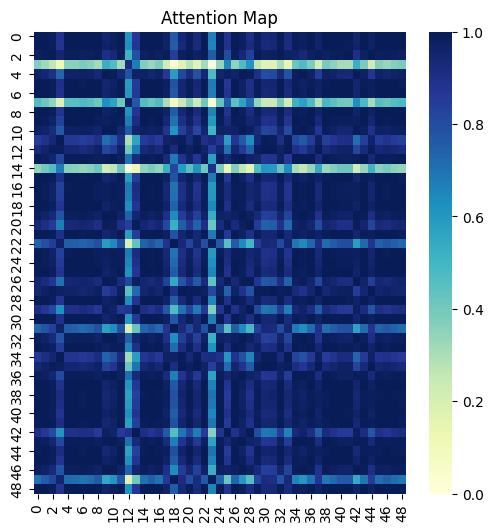

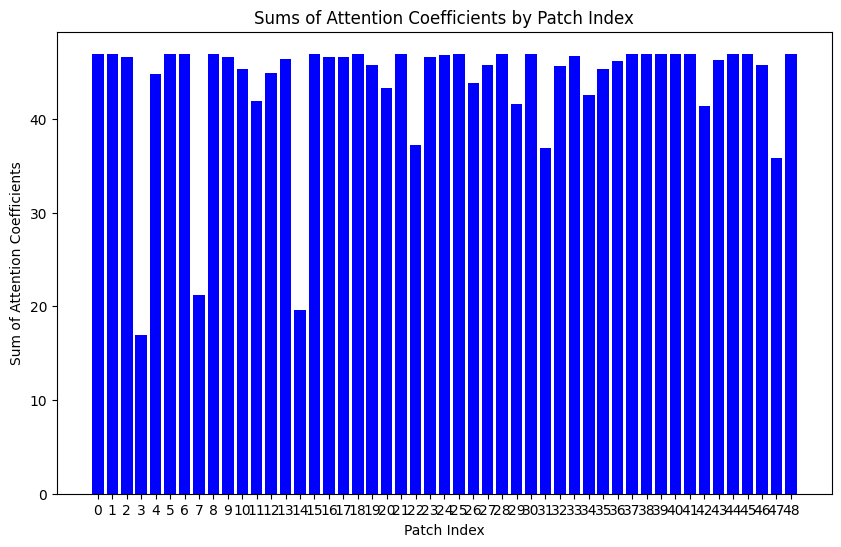

Predicted class for sample 83: 1.0
Row sums: [47.1297   47.05994  46.951324 15.868802 44.556583 47.172028 47.139126
 20.155664 47.08273  45.980354 40.985313 45.587803 38.580917 46.37288
 20.256332 47.16971  45.957924 47.11747  47.14863  47.09116  42.951717
 47.170795 37.944252 46.610092 47.041294 47.07822  43.16419  46.19402
 47.04494  41.170757 47.126656 43.295116 46.78741  46.83248  43.22171
 45.784485 46.78351  46.584023 46.771713 47.17337  47.05643  47.17913
 39.8847   41.560318 47.178486 47.081524 45.624435 36.55345  47.090145]


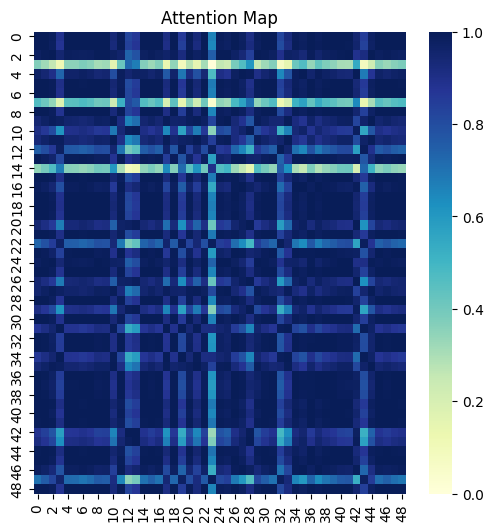

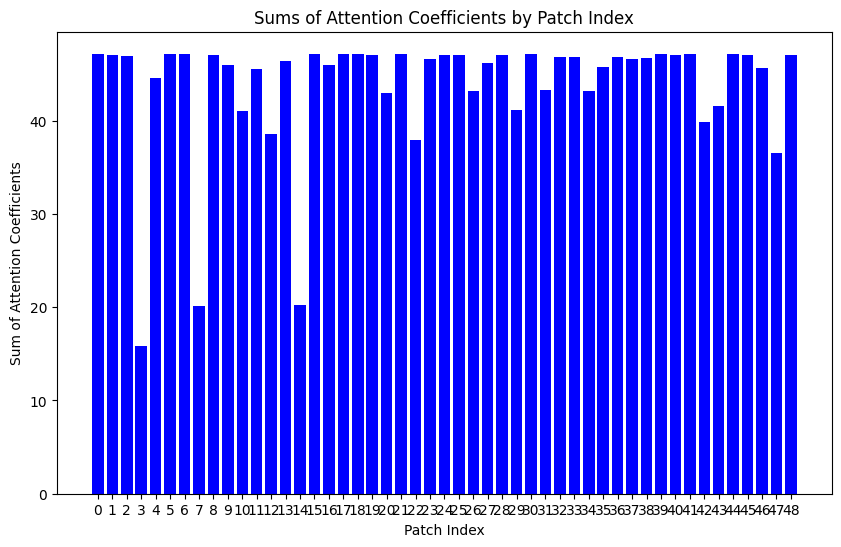

Predicted class for sample 84: 1.0
Row sums: [46.931854 46.88705  46.608665 16.16574  44.62948  46.946247 46.936745
 20.5101   46.90279  45.509552 41.201668 46.943237 39.795265 46.31019
 22.323902 46.547485 46.84795  41.49008  40.370926 46.21357  43.099995
 46.5449   45.781986 46.371544 45.855618 43.70886  45.732147 45.74439
 46.87632  41.381504 46.887253 46.93533  46.901043 41.73241  42.569557
 45.295925 46.667713 40.225872 46.751957 45.84685  46.26633  46.93993
 40.13153  41.758797 46.92792  46.90198  45.480198 39.76564  46.907738]


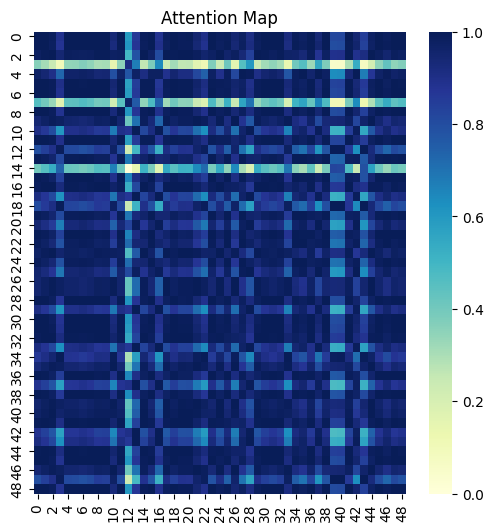

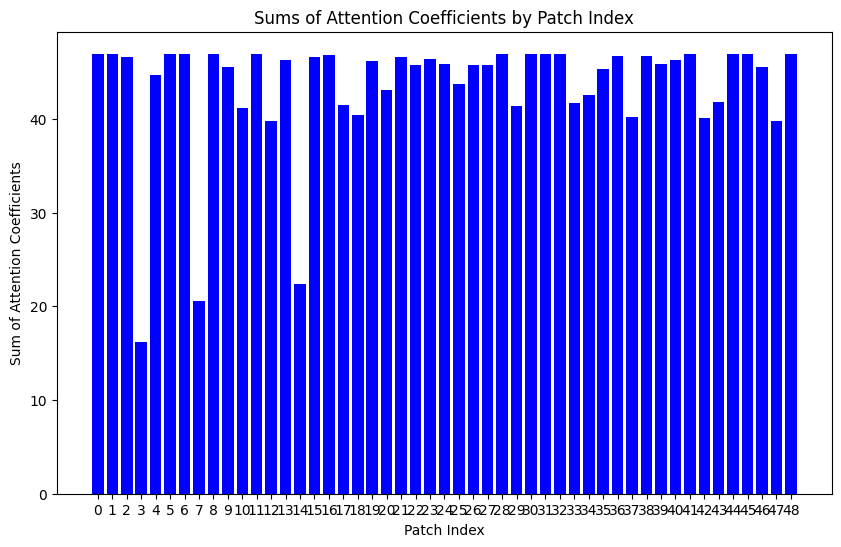

Predicted class for sample 85: 1.0
Row sums: [46.87334  46.851433 46.43152  17.06604  44.85721  46.86295  46.87414
 21.386875 46.860634 45.249264 42.921673 35.777897 46.7631   46.38401
 19.156494 46.86541  46.052338 46.51309  46.430717 46.86365  43.42377
 46.86433  36.755947 46.56369  45.009285 40.59838  43.61599  45.496296
 46.844692 41.79215  46.851555 45.58241  46.68975  46.720066 42.233852
 45.02591  46.687088 40.68681  44.19482  46.861176 46.849895 46.845028
 40.596336 42.151756 46.823368 46.81648  45.775887 35.34003  46.8633  ]


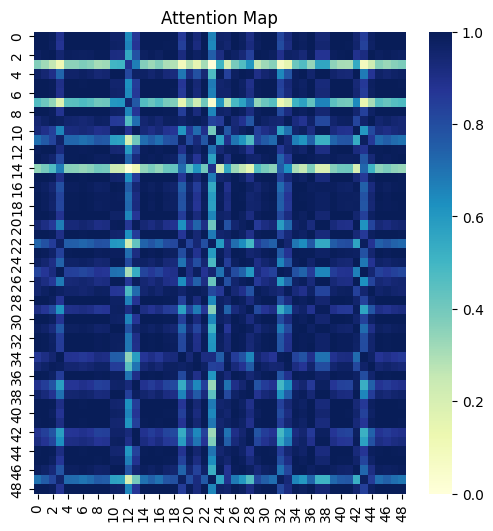

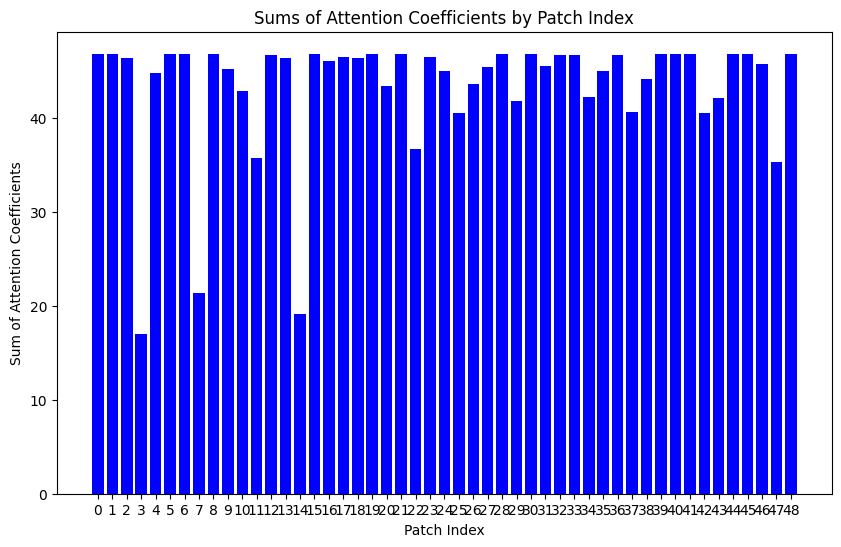

Predicted class for sample 86: 1.0
Row sums: [46.149746 46.129566 45.720837 17.318478 44.22369  46.13884  46.15037
 21.544483 46.13816  44.581245 41.901424 42.703644 46.041435 45.68473
 19.280016 43.251175 43.160664 44.383343 44.816784 46.140957 42.84943
 46.14021  36.38981  45.85623  46.07302  45.784523 43.03381  44.81924
 46.12324  41.2833   45.77824  41.48222  45.44817  43.798058 41.676025
 44.366074 45.97378  40.221336 46.000164 38.21115  46.128128 46.121197
 40.134384 41.628624 46.100025 46.148483 45.966522 35.021004 46.140633]


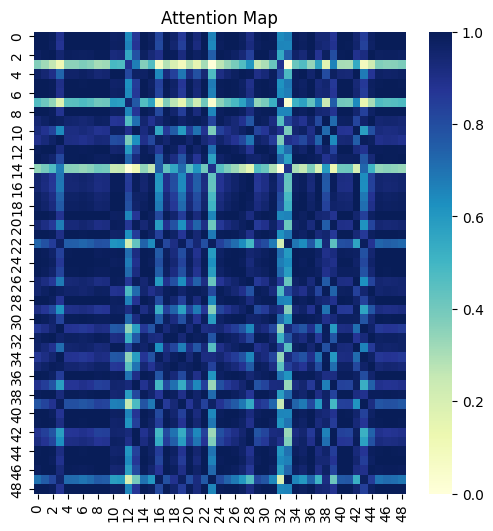

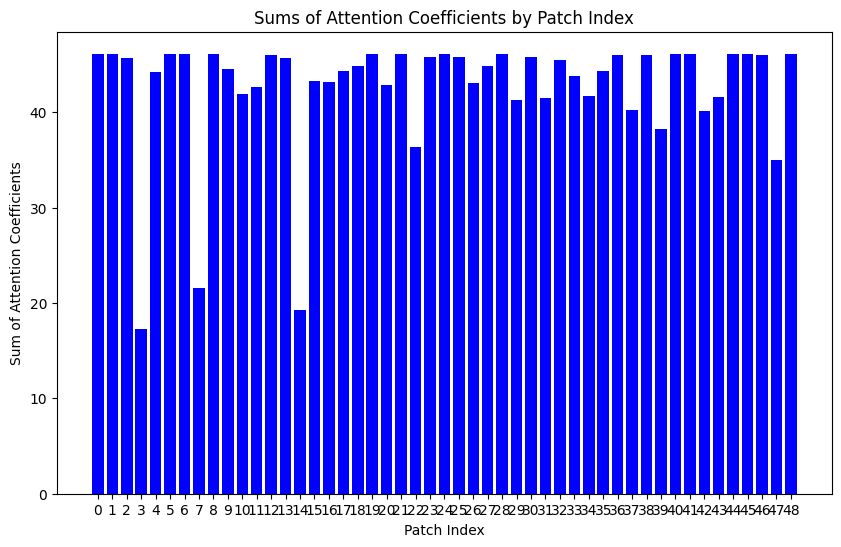

Predicted class for sample 87: 1.0
Row sums: [46.869106 46.81864  46.58923  16.425129 44.5362   46.890476 46.875088
 20.699299 46.83593  45.543427 45.902596 46.88688  46.84384  46.223354
 19.8191   46.890045 45.844578 46.83754  46.69551  46.84217  43.012608
 46.890278 37.384895 46.43602  42.53396  41.13069  43.215275 45.768456
 46.807    41.30589  46.818863 46.55361  46.591774 46.63069  42.705093
 45.33834  46.58839  40.160038 39.158497 46.890587 46.815933 46.887737
 40.066544 41.680275 46.878887 46.83503  45.53631  35.9929   46.841423]


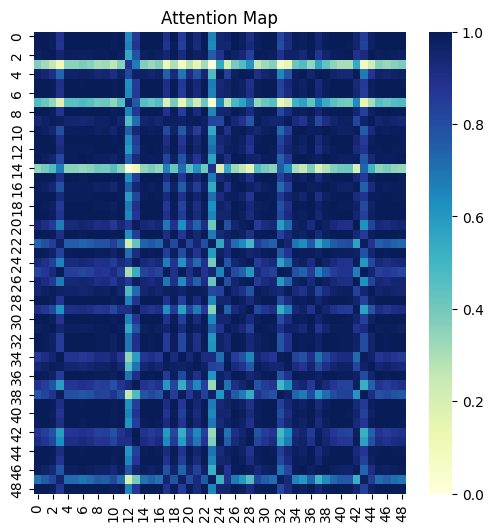

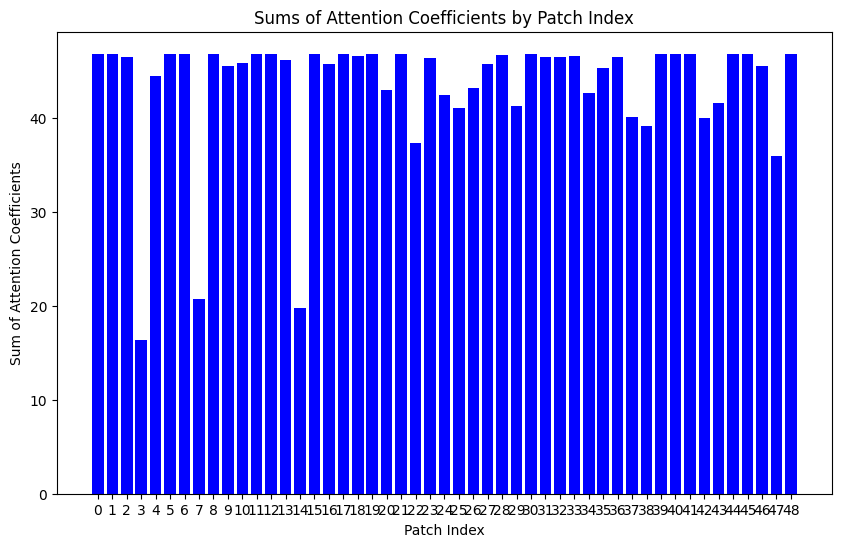

Predicted class for sample 88: 1.0
Row sums: [47.17527  47.104053 46.99552  15.395488 44.55576  47.218628 47.184906
 19.749424 47.127308 46.00964  40.92291  46.516373 34.571735 46.40416
 19.868078 47.216244 45.98177  47.226215 47.186287 47.135906 42.923065
 47.217365 37.843037 46.37191  43.73392  45.087284 43.1392   46.226673
 47.088753 41.111526 47.22186  46.287678 46.826294 46.872208 43.20664
 45.810673 46.68845  47.14944  46.92964  47.220016 47.10047  47.226
 39.80352  41.50775  47.225475 47.12608  45.642357 36.429466 47.134872]


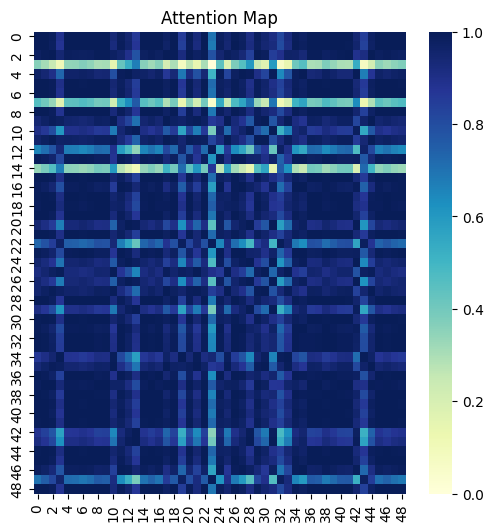

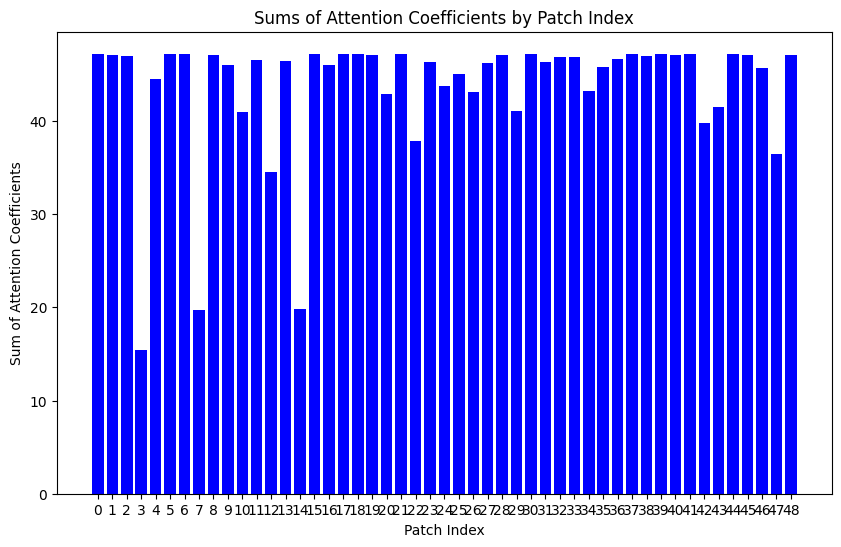

Predicted class for sample 89: 1.0
Row sums: [47.006916 46.940323 46.813667 16.034962 44.480633 47.045925 47.01579
 20.297703 46.9622   45.833935 41.674984 46.53671  47.028145 46.269745
 20.138203 47.0439   45.861927 47.049072 44.460297 46.970264 42.89542
 47.044853 37.793385 46.502323 46.876453 46.859234 43.105408 46.04879
 46.925888 41.13434  46.99039  44.436153 46.67571  46.719677 43.069145
 45.637146 46.671898 44.353214 39.39937  47.047073 46.936947 47.05151
 39.86185  41.519676 47.05009  46.96105  45.53363  36.40409  46.9693  ]


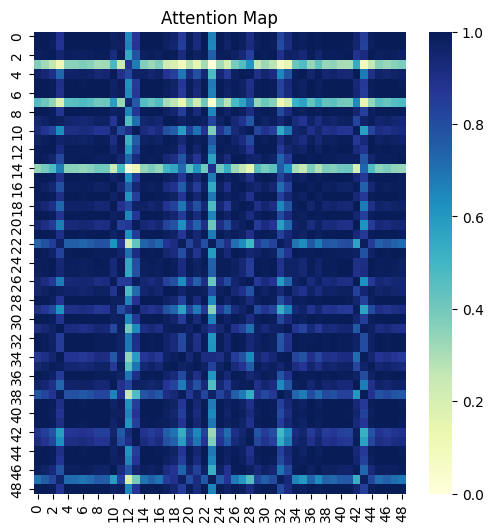

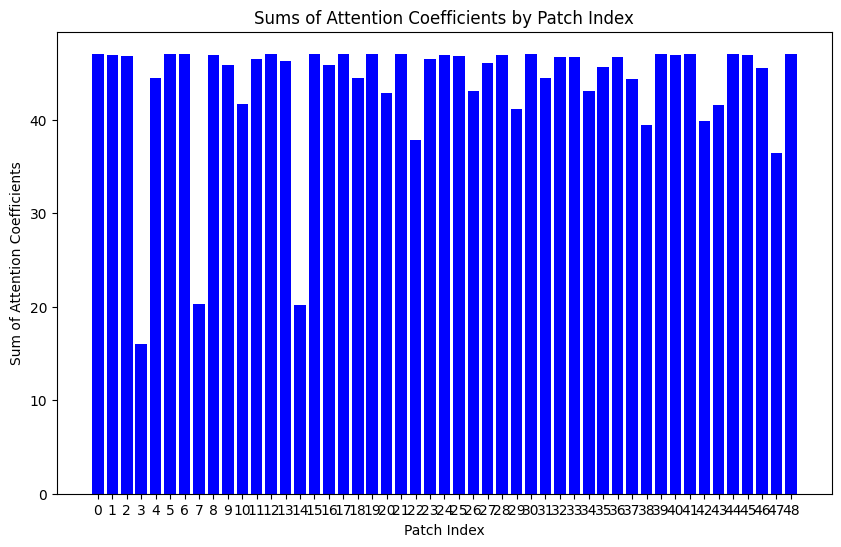

Predicted class for sample 90: 1.0
Row sums: [46.860218 46.83252  46.451584 16.94835  44.78123  46.85629  46.862072
 21.256714 46.84336  45.29771  43.179066 39.95305  46.76732  46.33944
 19.285362 46.858162 45.998444 46.776623 45.91832  46.84703  43.33065
 46.85735  36.875572 46.525696 45.127872 40.697197 43.52483  45.540142
 46.824787 41.685165 46.83266  46.31124  46.6577   46.689743 42.31964
 45.07818  46.654892 40.572556 39.922806 46.8549   46.83075  46.84147
 40.48155  42.047462 46.822422 46.84282  45.715736 35.464874 46.8466  ]


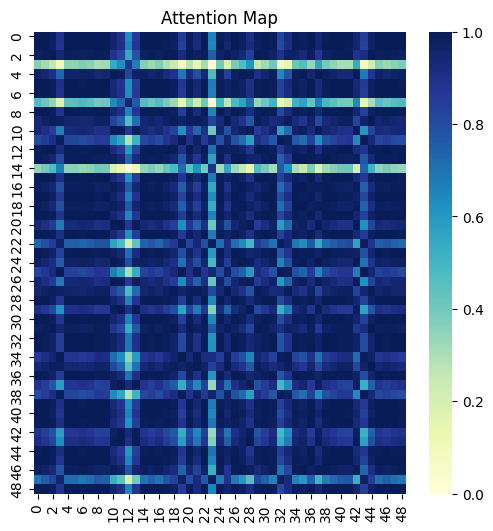

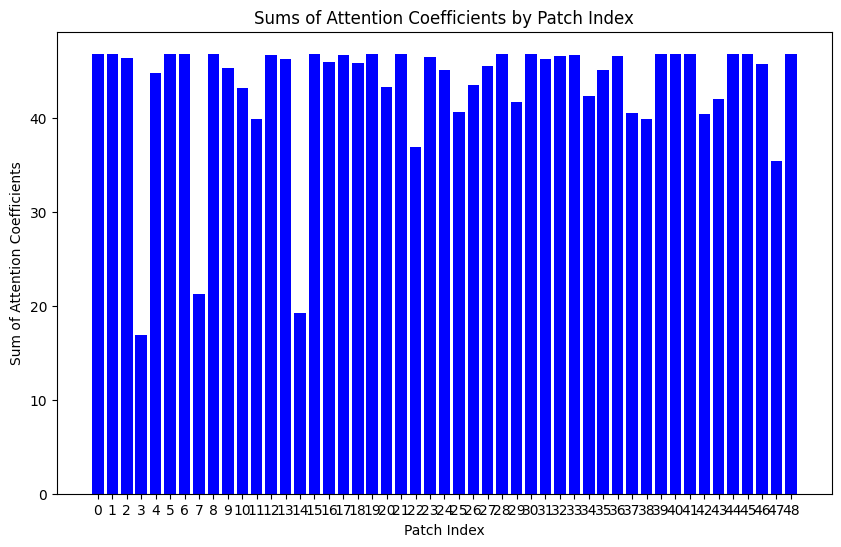

Predicted class for sample 91: 1.0
Row sums: [47.12446  47.09964  46.68763  16.830757 45.04252  47.11661  47.125725
 21.194674 47.109734 45.492508 41.733395 47.1001   47.019352 46.61199
 18.90689  46.927593 38.31684  29.685213 46.15531  47.12442  43.575294
 47.11789  36.847176 47.11974  40.18298  46.06636  43.771847 45.742832
 47.092342 41.90858  47.105415 46.03231  47.10801  46.960777 42.428333
 45.266026 46.926342 40.780888 47.00217  47.114967 47.097977 47.099648
 40.688633 42.27569  47.078655 47.12339  45.98541  35.4034   47.11269 ]


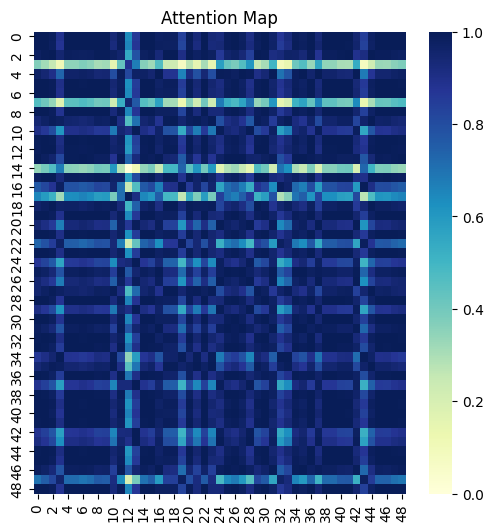

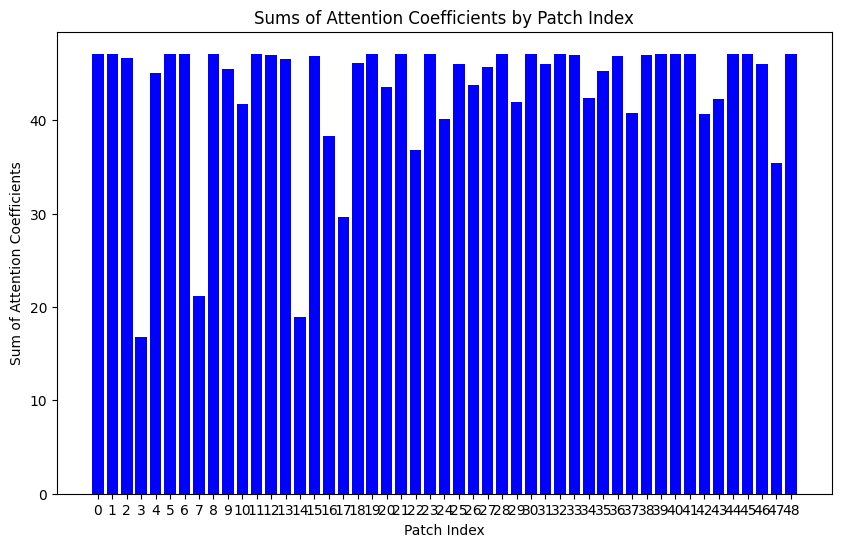

Predicted class for sample 92: 1.0
Row sums: [46.72501  46.67979  46.42058  16.607176 44.4668   46.740868 46.730064
 20.87053  46.695564 45.361195 45.900787 46.33264  46.685757 46.11143
 19.72866  46.740925 45.74407  46.504784 45.749454 46.701202 42.972313
 46.740932 37.21022  46.316597 43.77288  41.40236  43.171375 45.58794
 46.66907  41.29361  46.679985 46.141853 46.16642  46.503048 42.516953
 45.15483  46.4627   40.164726 46.41285  42.37721  46.677303 46.735615
 40.07256  41.66216  46.7247   46.694748 45.443993 35.823715 46.70053 ]


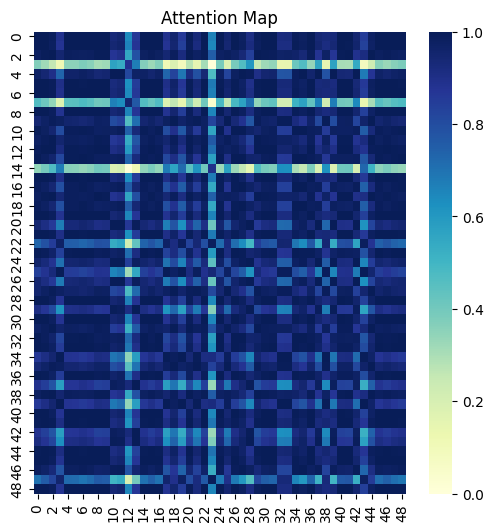

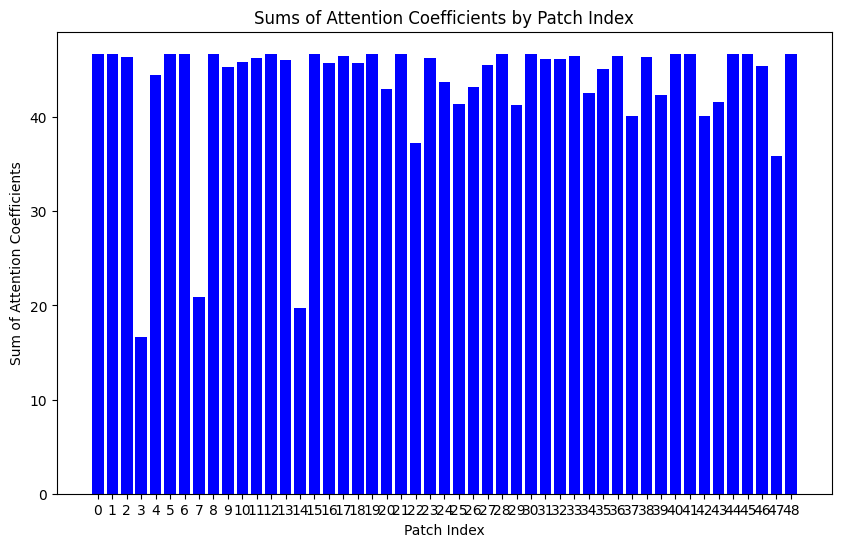

Predicted class for sample 93: 1.0
Row sums: [46.802113 46.741974 46.579353 16.229885 44.368916 46.83438  46.809856
 20.48003  46.761986 45.584816 40.913795 46.162624 46.806335 46.104843
 20.061623 46.83295  45.711285 46.75961  46.801575 46.769318 42.820065
 46.833637 37.57112  46.32807  46.440006 46.59499  43.025555 45.80137
 46.728683 41.093864 46.795204 46.178802 46.49347  46.535206 42.818375
 45.38684  46.48985  44.2194   45.91645  46.835144 46.73887  46.836906
 39.844074 41.471947 46.832516 46.760937 45.39324  36.191887 46.76844 ]


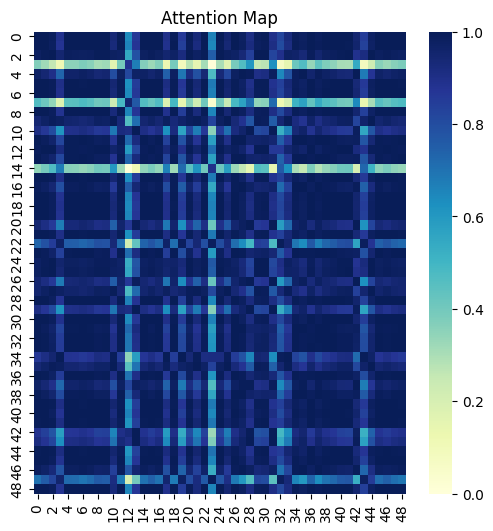

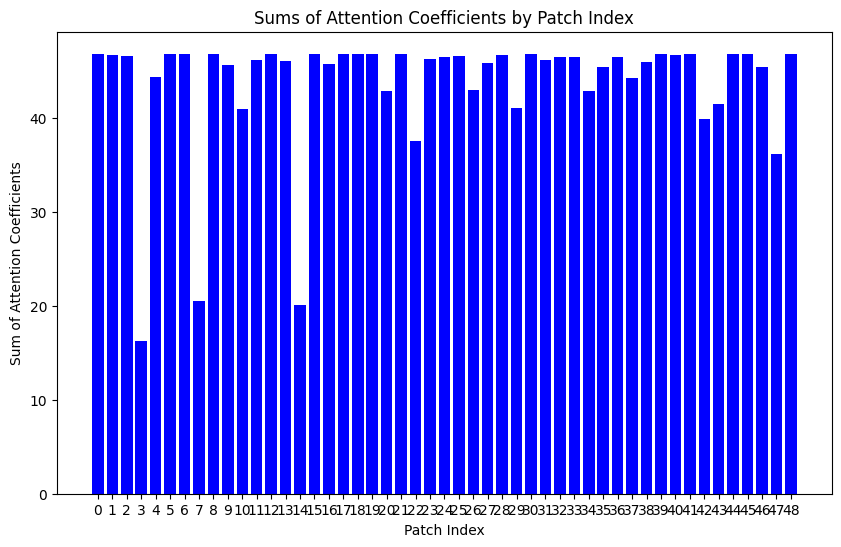

Predicted class for sample 94: 1.0
Row sums: [47.72469  47.653816 47.466084 12.402612 44.872242 47.76296  47.733837
 17.235191 47.677376 46.30331  40.863308 46.77119  47.677124 46.905754
 16.753979 47.76124  46.45812  47.48675  46.358353 44.821655 43.06095
 47.762062 36.952114 47.59044  47.159935 45.915504 43.301113 46.55655
 47.638172 42.97607  40.229286 36.723793 47.765327 47.410778 43.06985
 46.071793 47.103558 47.613678 47.600548 47.763885 47.65016  47.766136
 39.587666 45.7541   47.744972 47.67614  46.071644 35.348103 47.684975]


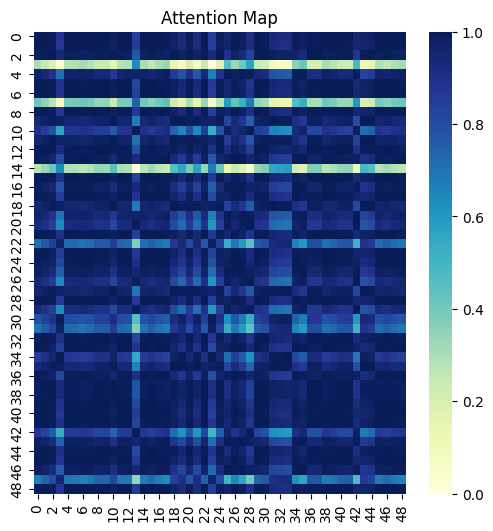

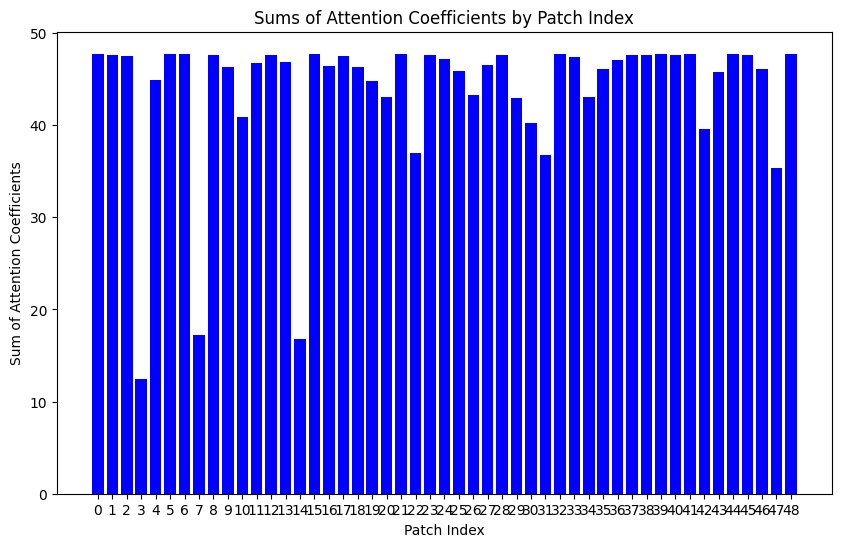

Predicted class for sample 95: 1.0
Row sums: [47.27051  47.227013 46.952877 17.127277 45.018536 47.284218 47.27523
 21.369814 47.242325 46.87568  39.632393 46.41011  43.207184 46.663773
 20.34148  47.220062 44.586803 46.811554 47.27547  47.03009  43.519527
 47.2844   45.320198 47.056953 46.434692 47.24557  43.719288 46.108074
 47.216576 41.83422  47.227207 47.26764  47.26083  47.053085 43.0135
 45.67028  47.013123 46.263103 46.423595 47.283886 47.224598 47.277863
 40.607937 42.204296 47.188255 47.24153  45.99712  36.310146 47.24712 ]


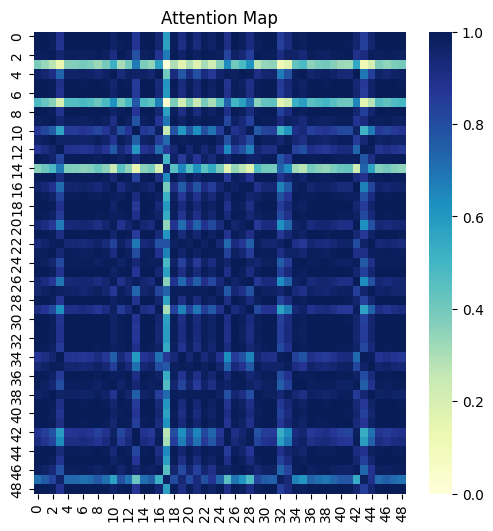

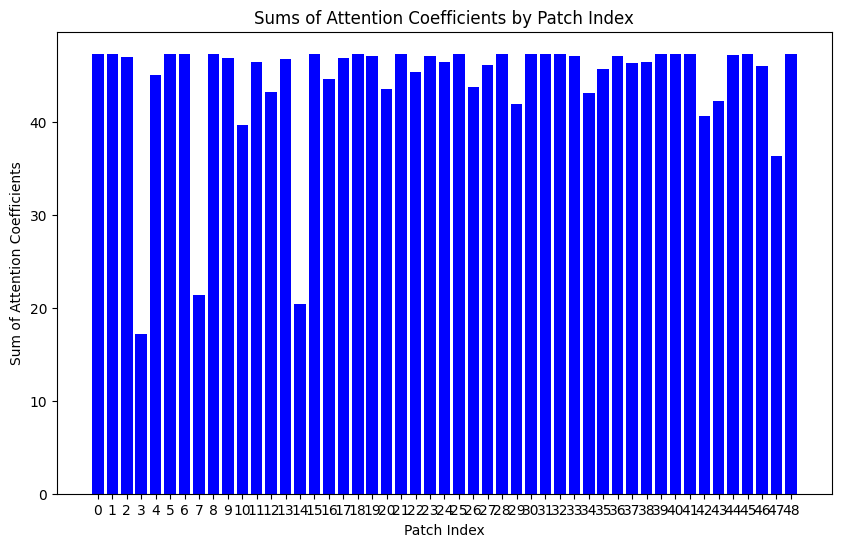

Predicted class for sample 96: 1.0
Row sums: [47.326595 47.308277 46.854248 17.391237 45.322483 47.311607 47.32669
 21.719105 47.316517 46.282036 34.021378 46.11079  43.810856 46.850777
 19.072681 46.674988 45.02014  45.336895 46.45812  46.418526 43.881058
 47.313232 38.97172  47.29683  46.740192 46.793354 44.103317 45.88568
 47.302097 42.238277 47.308388 47.229572 43.93206  47.182526 42.53354
 45.40081  47.150288 41.104248 45.329575 47.309544 47.306877 47.291256
 41.033775 42.60044  46.885227 47.306847 46.243877 35.486744 47.318836]


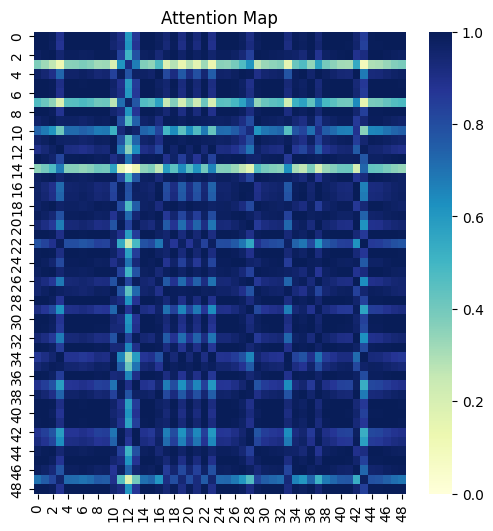

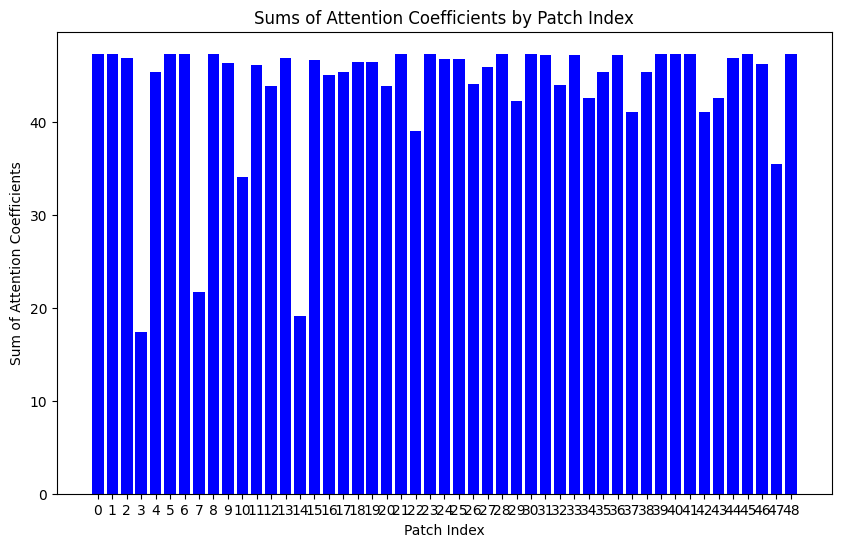

Predicted class for sample 97: 1.0
Row sums: [47.233124 47.195457 46.84346  15.400899 44.92889  47.237988 47.236576
 19.920204 47.209316 45.65127  41.404102 47.021755 31.451786 46.633595
 18.077045 45.91445  42.016506 42.21362  47.191494 44.15345  43.36015
 47.238667 47.06545  46.540302 44.78075  46.950996 46.983337 45.903683
 47.185818 41.589695 47.200584 40.252106 45.9744   47.148983 42.52395
 45.422234 46.987362 40.39627  47.027843 47.238865 47.193237 47.226513
 40.29876  41.978893 47.209854 46.180477 43.710102 35.265205 47.213573]


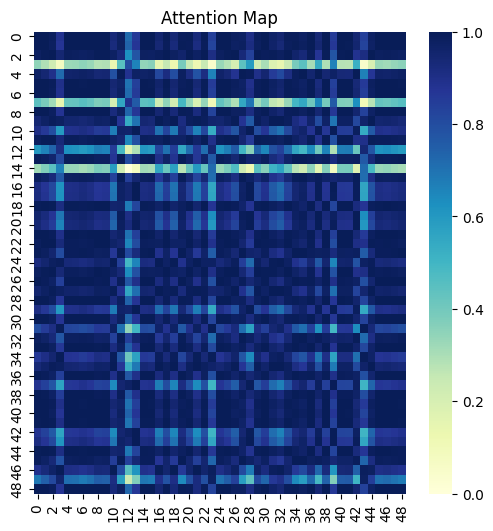

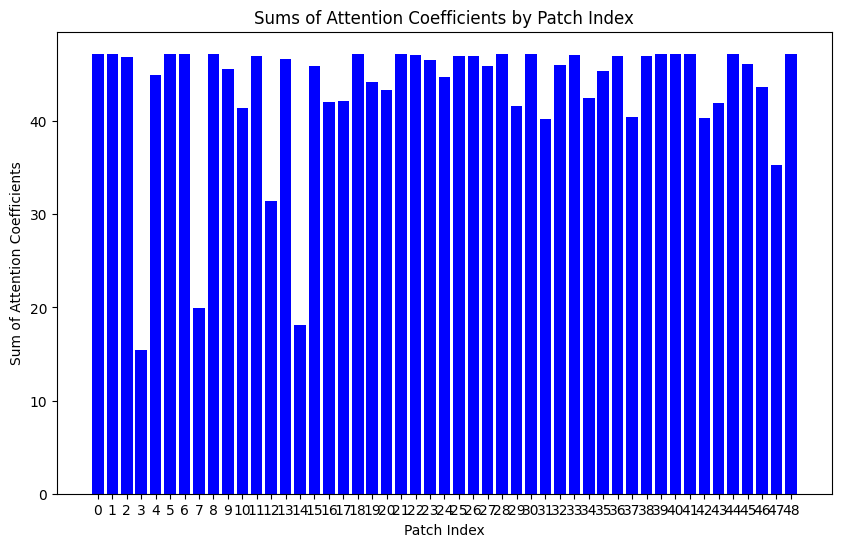

Predicted class for sample 98: 1.0
Row sums: [46.586918 46.54153  46.28712  16.591825 44.33733  46.60318  46.592026
 20.84114  46.557335 45.237244 41.00432  46.601395 46.549286 45.9747
 19.79258  46.30388  43.38269  44.5241   42.582214 46.562992 42.8499
 46.60322  37.486725 46.17912  45.85208  44.94815  43.048016 45.462055
 46.530807 41.17916  46.541733 46.512646 45.324696 46.365013 42.41622
 45.03262  46.32477  40.0556   46.391926 42.099556 46.539043 46.598206
 39.963863 41.545963 46.587566 45.263798 42.946712 35.775307 46.562317]


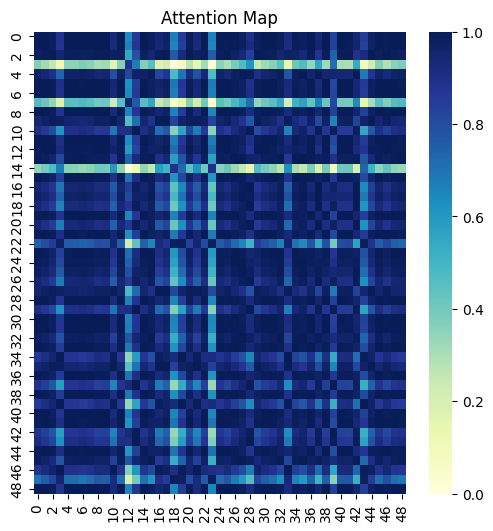

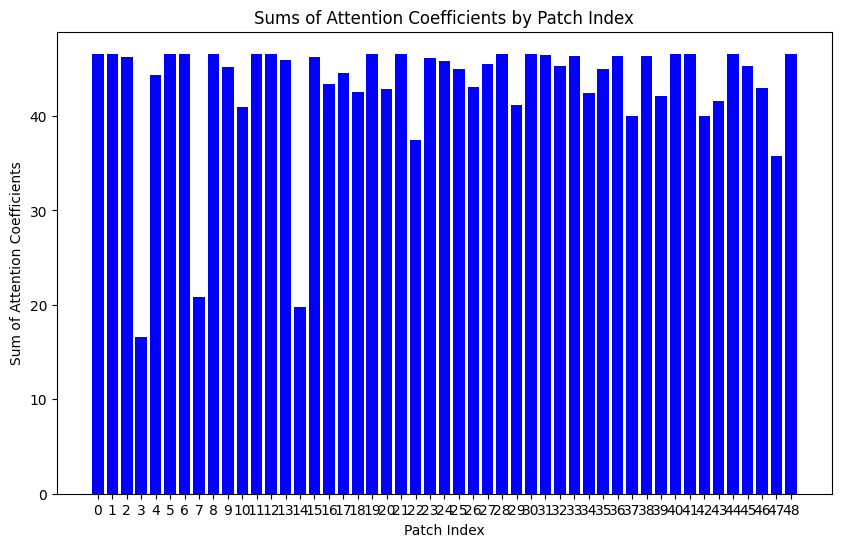

Predicted class for sample 99: 1.0
Row sums: [46.860905 46.779102 46.76372  16.035934 44.198586 46.917435 46.87258
 20.216019 46.805233 45.87817  40.634975 46.902378 45.07582  46.04715
 20.684057 46.81322  44.97652  37.200798 44.9717   46.320545 42.590748
 46.91548  38.143307 46.9048   46.49453  42.89741  42.802864 46.07697
 46.76211  40.81894  46.779427 45.846504 46.481796 46.529915 43.25697
 45.69498  46.477646 39.640614 46.89668  46.937305 46.775112 46.93163
 39.54479  41.205677 46.937115 45.20006  46.837738 36.784996 46.813824]


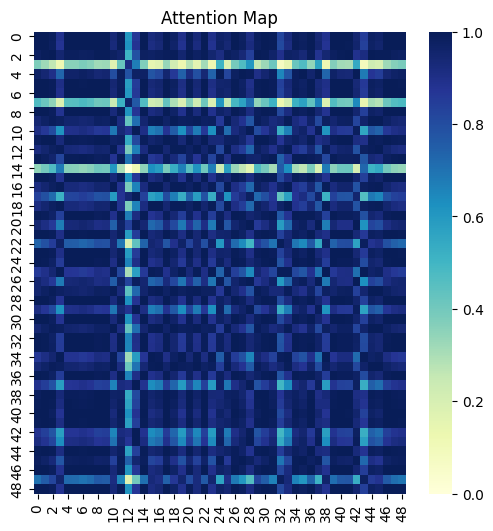

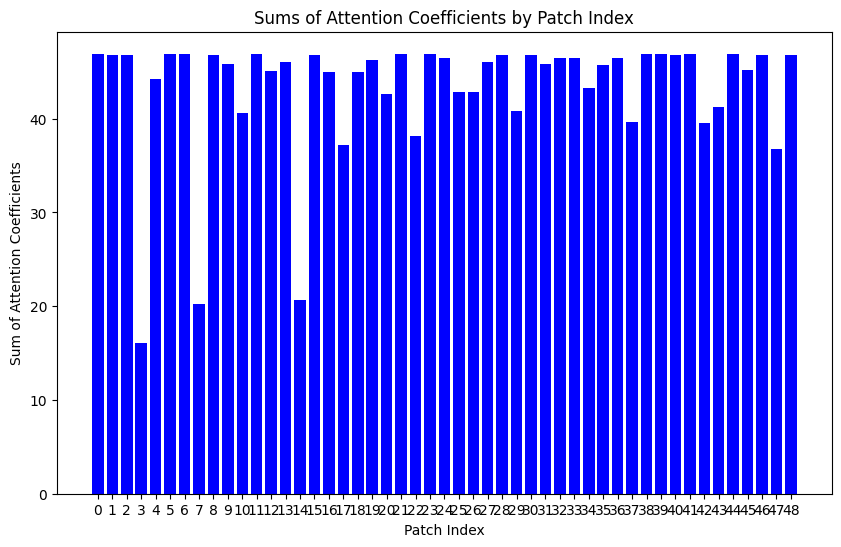

Predicted class for sample 100: 1.0
Row sums: [46.812748 46.80394  46.29867  17.336569 44.94703  46.78791  46.81119
 21.677105 46.81098  46.80402  26.335287 45.76375  39.21691  46.39632
 18.905258 46.041534 41.458603 46.31323  46.43757  45.556473 43.558407
 46.79001  36.448624 46.5604   46.295635 45.142178 43.74538  45.31483
 46.799454 41.964855 46.804016 46.760853 43.589447 46.69881  41.974907
 44.827934 46.670185 45.360474 46.80556  46.785286 46.802944 46.76313
 40.791477 42.316914 46.774616 46.80333  45.826004 35.027954 46.81079 ]


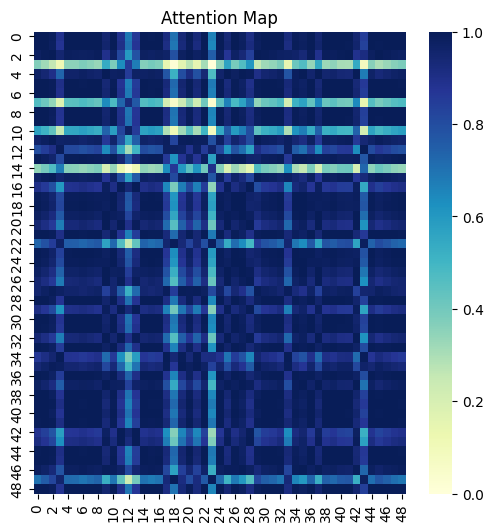

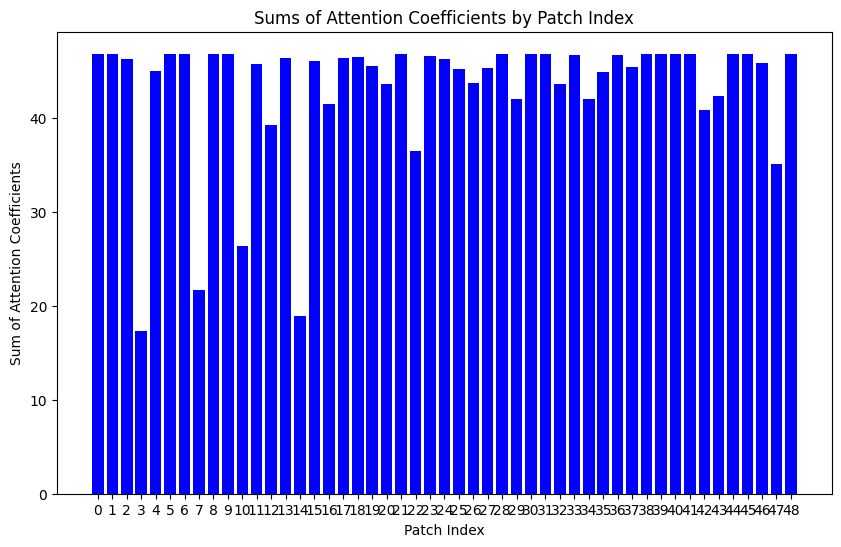

Predicted class for sample 101: 1.0
Row sums: [46.905857 46.859837 46.599525 16.527843 44.61888  46.922203 46.911022
 20.811749 46.87587  45.52958  42.412247 41.922703 46.86698  46.28372
 19.693192 46.922234 45.9117   46.862976 45.27255  46.88161  43.106922
 46.922253 37.298733 46.491554 44.3729   40.91422  43.308277 45.758633
 46.84895  41.409286 46.860043 46.57509  46.57057  46.68052  42.656403
 45.321106 46.639618 40.31296  45.982864 46.922016 46.85731  46.917038
 40.17489  41.781933 46.90637  46.875042 45.607903 35.89978  46.880928]


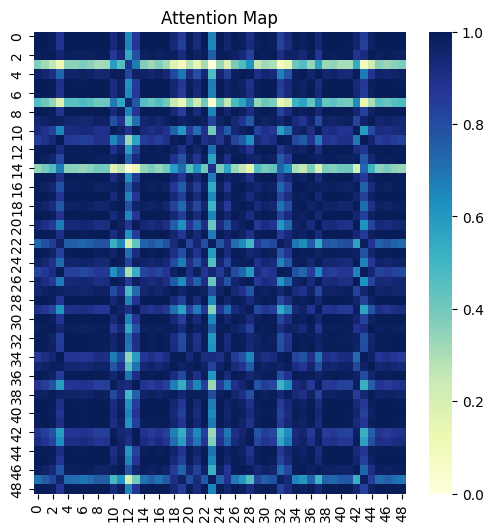

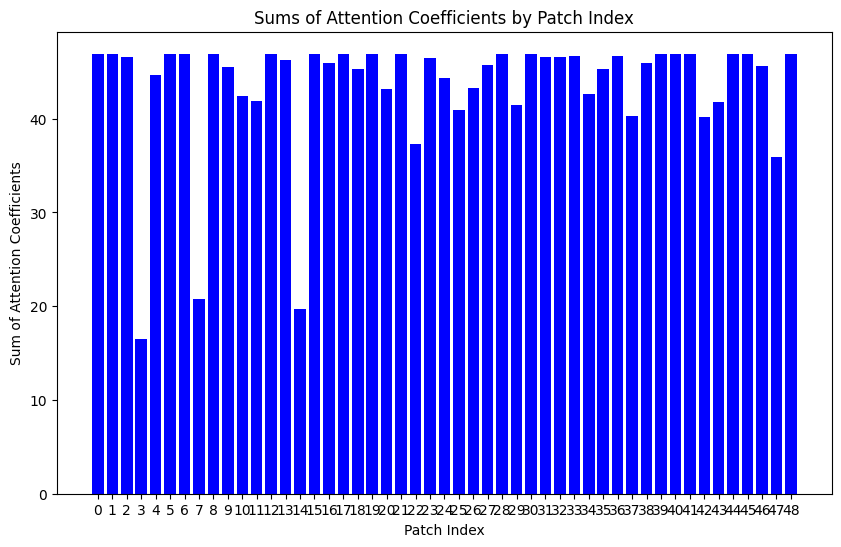

Predicted class for sample 102: 1.0
Row sums: [47.010143 46.95138  46.773407 16.15685  44.57162  47.04049  47.0176
 20.445576 46.97104  45.758858 41.08803  45.485886 46.825138 46.3162
 20.02979  47.039253 45.921497 47.01767  47.04208  46.978218 43.010998
 47.03985  37.649696 46.53961  46.93377  46.087654 43.218166 45.979176
 46.93829  41.26975  47.002655 46.87588  46.704758 46.746346 42.953167
 45.557587 46.70115  44.338787 46.76852  47.041126 46.948326 47.041954
 40.008278 41.651253 47.040012 46.97001  45.602055 36.25796  46.97736 ]


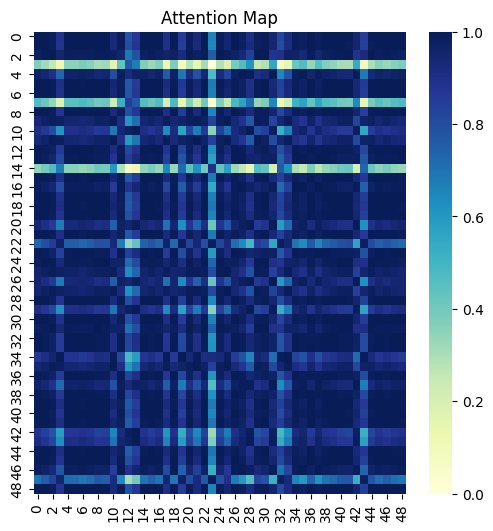

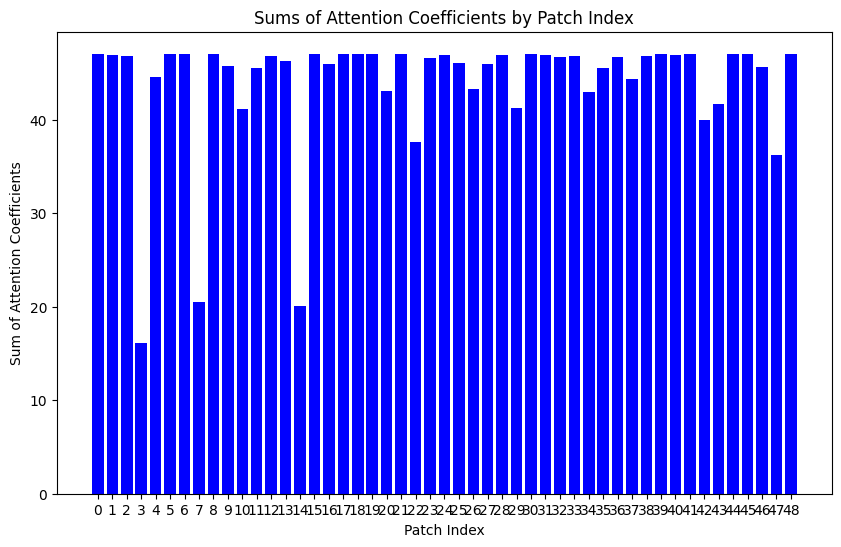

Predicted class for sample 103: 1.0
Row sums: [46.983936 46.963627 46.5334   17.374298 44.988827 46.971794 46.984447
 21.663088 46.97282  46.946884 41.040375 46.032017 43.63844  46.503864
 19.252033 46.97469  34.940544 46.588615 46.94309  45.71363  43.56399
 46.973263 36.83111  46.68146  46.60208  46.790783 43.7551   45.592075
 46.95716  41.941475 46.96497  46.97332  45.39073  46.835526 42.318398
 45.119495 46.81773  46.796036 45.04724  46.969925 46.962154 46.953053
 40.7522   45.444275 46.61131  46.97195  45.90112  35.413948 46.97488 ]


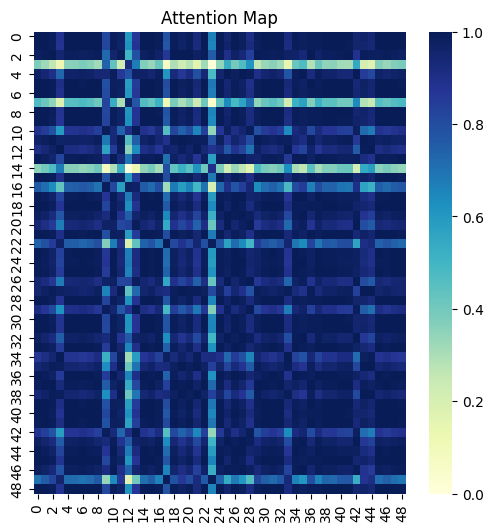

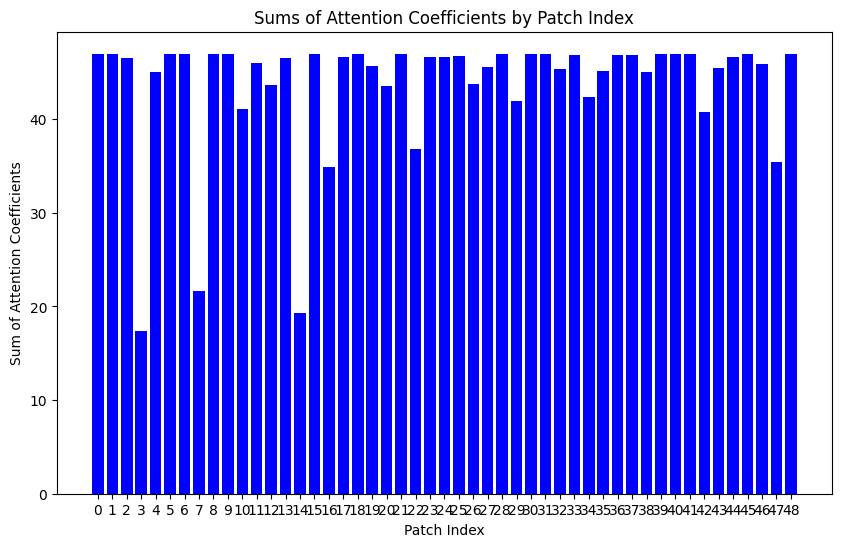

Predicted class for sample 104: 1.0
Row sums: [46.524433 46.470844 46.273106 16.509909 44.192204 46.54995  46.53104
 20.724857 46.488953 45.78296  38.8816   46.544746 46.511856 45.868866
 19.924562 46.54911  45.490818 37.562714 46.34427  46.495537 42.686024
 46.54953  37.287544 46.082077 46.207592 40.96225  42.88615  45.483868
 46.45872  41.00239  46.47107  43.758648 46.435535 46.278427 42.5022
 45.067276 46.23562  39.87331  46.11267  29.833109 46.468018 46.549446
 39.781216 41.371487 46.542606 46.487904 45.184097 35.918907 46.49475 ]


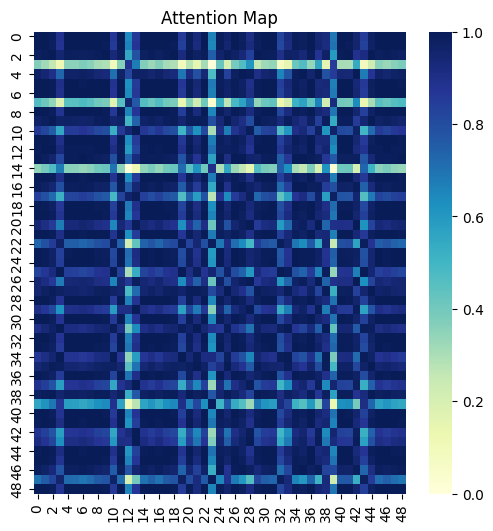

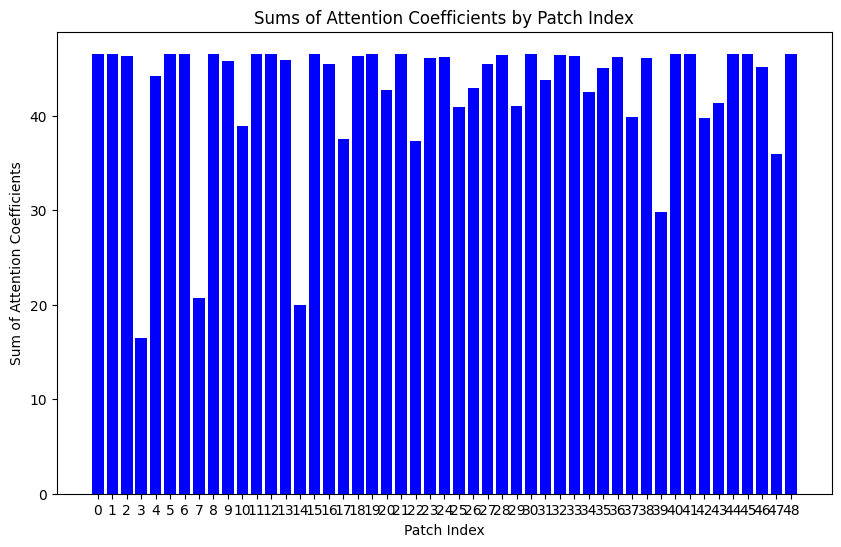

Predicted class for sample 105: 1.0
Row sums: [46.679585 46.60841  46.523487 16.037848 44.13715  46.724377 46.68935
 20.252274 46.631523 45.590664 40.638416 46.533394 46.73342  45.9246
 20.335358 46.721794 45.515034 46.72045  44.786083 46.640095 42.563572
 46.723003 37.76012  46.159428 46.69028  42.069748 42.77174  45.7969
 46.593243 40.819885 46.651318 45.450855 46.335533 46.380417 42.913406
 45.401367 46.331333 46.642456 46.43291  46.7259   46.604855 46.732986
 39.56168  41.20114  46.733776 46.630295 45.18657  36.397827 46.639065]


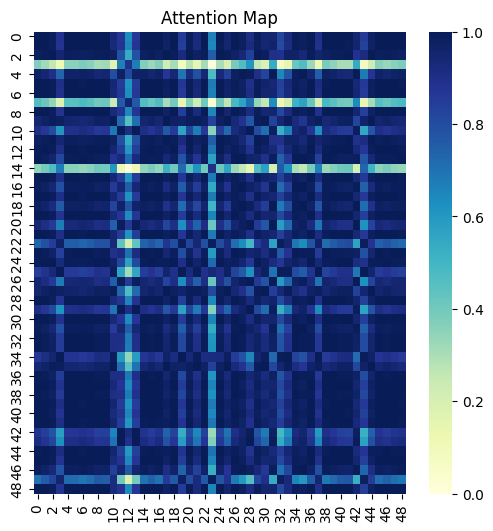

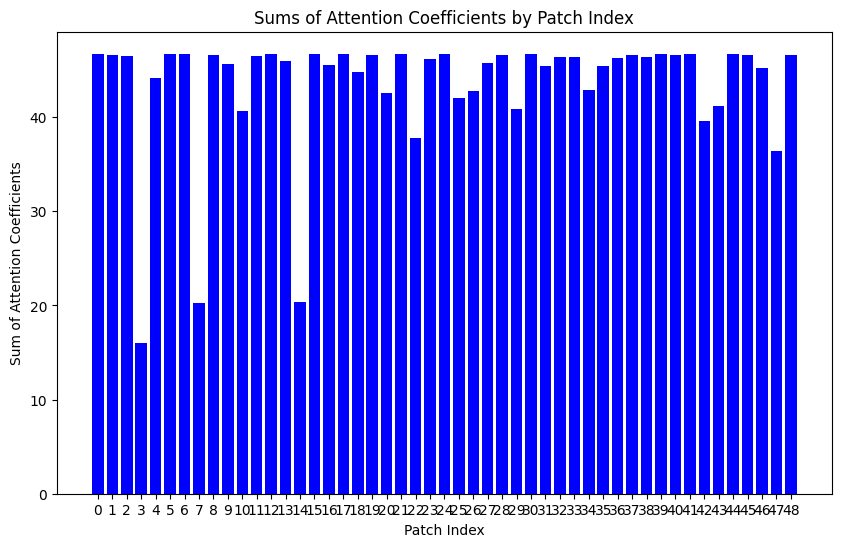

Predicted class for sample 106: 1.0
Row sums: [47.11055  47.062244 46.811558 16.440132 44.780113 47.12908  47.116096
 20.744    47.07896  47.080788 43.69912  46.11068  32.734726 46.47215
 19.76557  46.731457 44.726227 46.31649  47.126152 45.50102  43.247047
 47.129032 45.05474  47.101574 46.344112 46.483517 43.13101  45.96995
 47.050938 41.527546 47.06246  46.272945 45.879124 46.877518 42.852654
 45.53092  46.835606 45.341877 40.55836  47.129017 47.059624 47.124832
 40.27811  41.90486  44.700844 47.11074  45.78442  36.054985 47.084244]


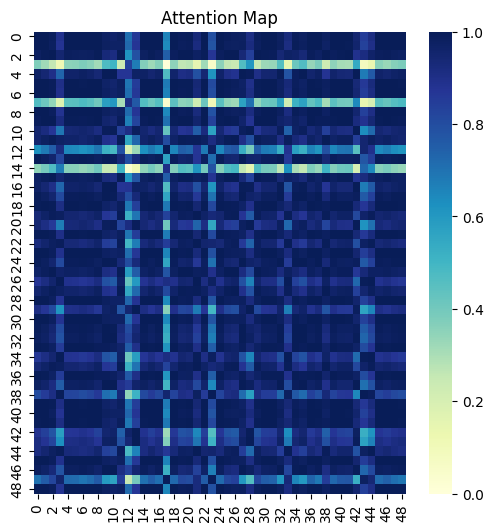

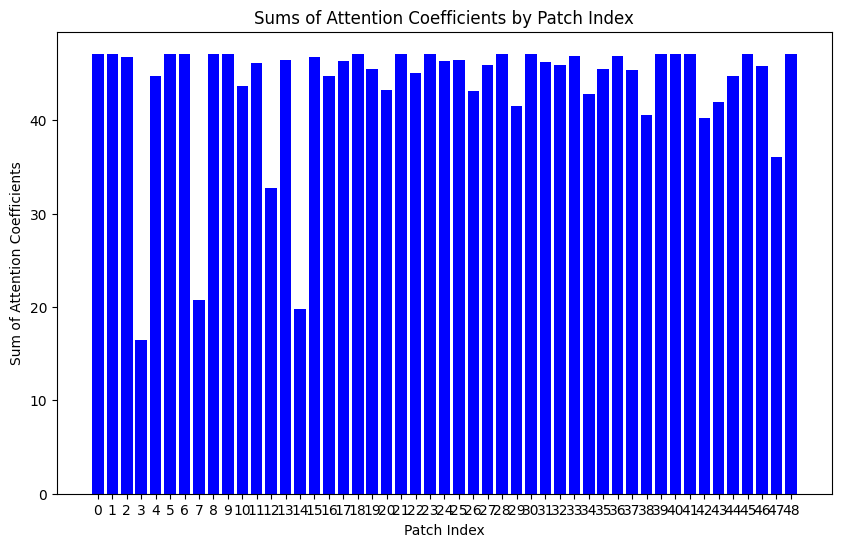

Predicted class for sample 107: 1.0
Row sums: [46.72849  46.70545  46.2981   17.083145 44.715244 46.719666 46.729527
 21.385048 46.714947 46.04887  27.286335 46.72723  46.623173 46.23622
 19.228783 46.72197  36.85391  46.672153 44.861683 46.718082 43.28979
 46.72096  36.723602 46.415848 46.55844  46.119385 43.480877 45.376404
 46.698536 41.66818  46.705574 46.700523 46.206516 46.572617 42.150955
 44.911972 46.5395   40.569878 46.59795  41.872543 46.70387  46.702606
 40.479984 42.025528 46.681736 45.283855 46.481216 35.31923  46.71772 ]


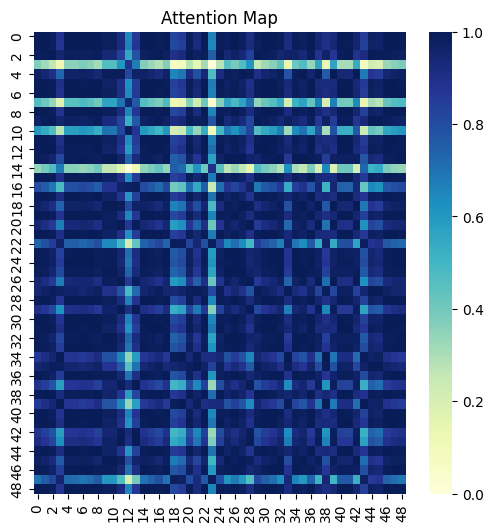

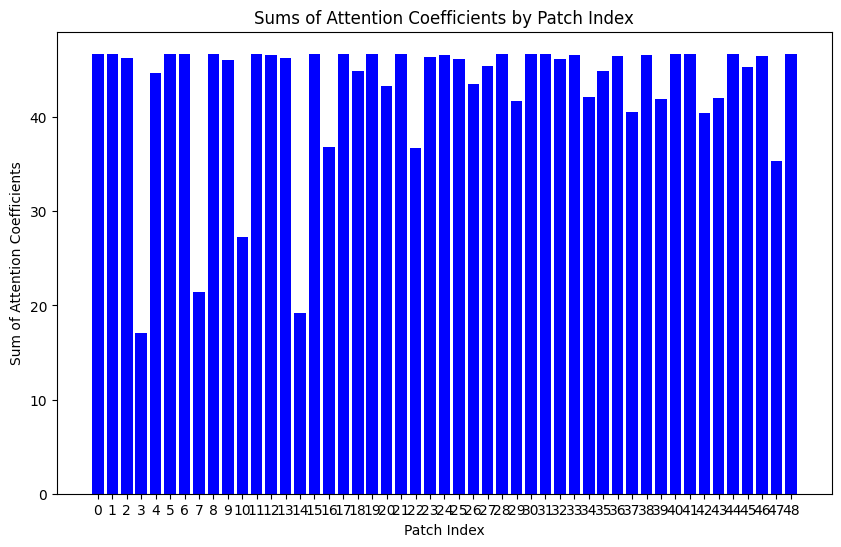

Predicted class for sample 108: 1.0
Row sums: [46.9354   46.878716 46.69313  16.534794 44.54161  46.963818 46.942513
 20.765549 46.89775  45.83488  40.636528 46.314728 40.061653 46.25723
 20.170769 46.962738 31.78782  45.366955 46.470856 46.93215  43.004932
 46.96327  37.634563 46.47639  46.495224 45.65799  43.208973 45.901524
 46.866024 41.28971  46.878952 46.639103 46.638153 46.67884  42.8958
 45.482254 46.63463  45.81696  41.39985  46.96436  46.87576  46.964516
 40.046875 41.665546 46.932987 46.905846 45.55548  36.254406 46.90386 ]


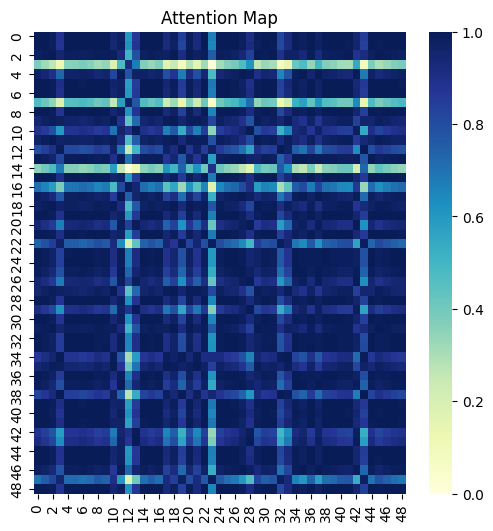

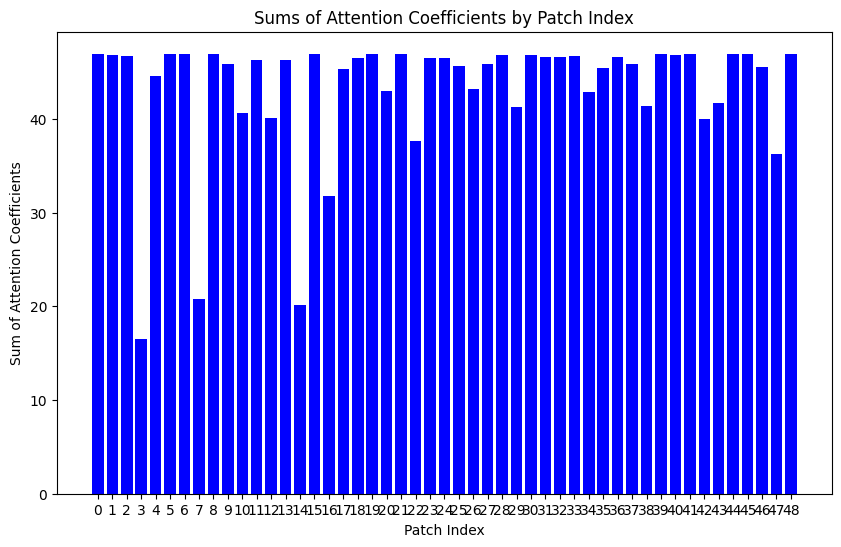

Predicted class for sample 109: 1.0
Row sums: [46.590683 46.547817 46.28889  17.245796 44.406467 46.60489  46.595398
 21.411835 46.562843 45.255283 41.152985 46.603764 46.549347 46.000145
 21.297844 46.586945 41.914295 41.51257  42.234123 46.516983 42.955406
 46.60502  37.33756  46.198364 45.881084 45.456398 43.148773 45.4762
 46.53759  41.323807 46.548008 46.50673  46.347706 46.378174 42.48907
 45.054302 46.33931  40.225887 46.2054   40.124264 46.545444 46.599213
 40.136223 41.68213  46.58813  44.02496  46.39317  35.992603 46.567566]


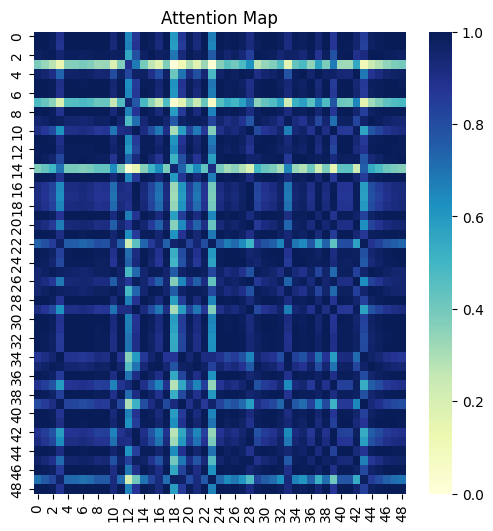

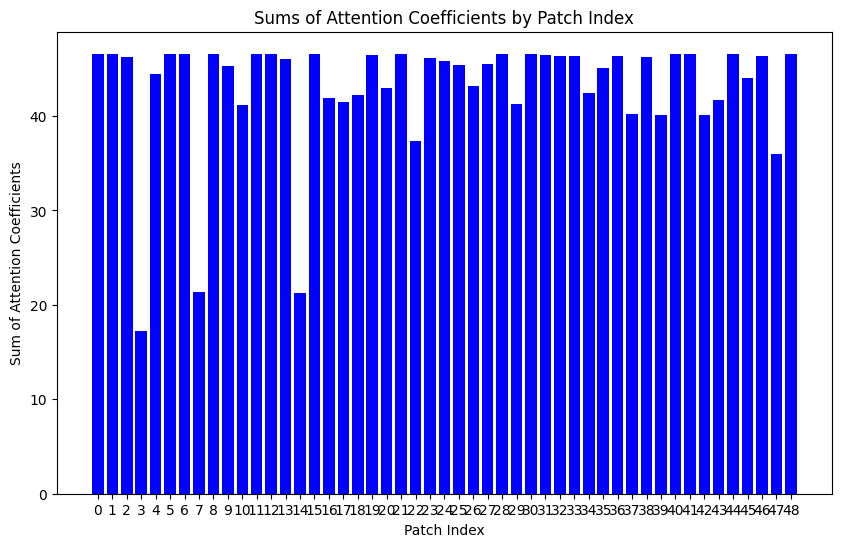

Predicted class for sample 110: 1.0
Row sums: [46.735237 46.71932  46.260464 17.212736 44.793133 46.718266 46.734962
 21.530676 46.72682  45.050392 41.609486 46.728745 46.607563 46.28003
 18.74033  46.72133  44.77063  38.71816  46.592403 46.619804 43.38571
 46.71998  39.43638  43.393475 46.17395  45.80229  43.574734 45.302002
 46.71362  41.978516 46.719425 46.696697 43.62987  46.60011  41.99464
 44.823193 46.56917  40.688267 46.555195 40.08497  46.718033 46.697235
 40.59896  42.133232 46.672955 45.705585 45.69073  35.03826  46.728886]


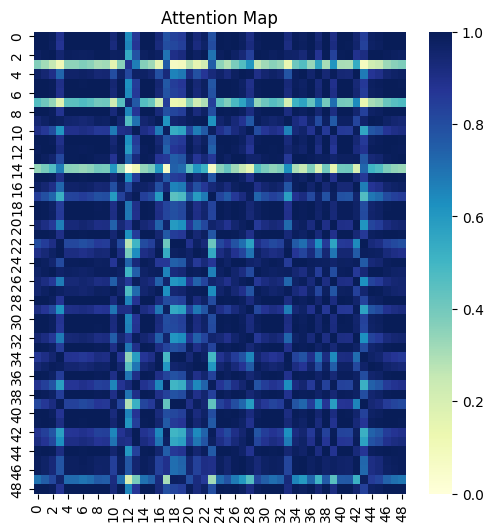

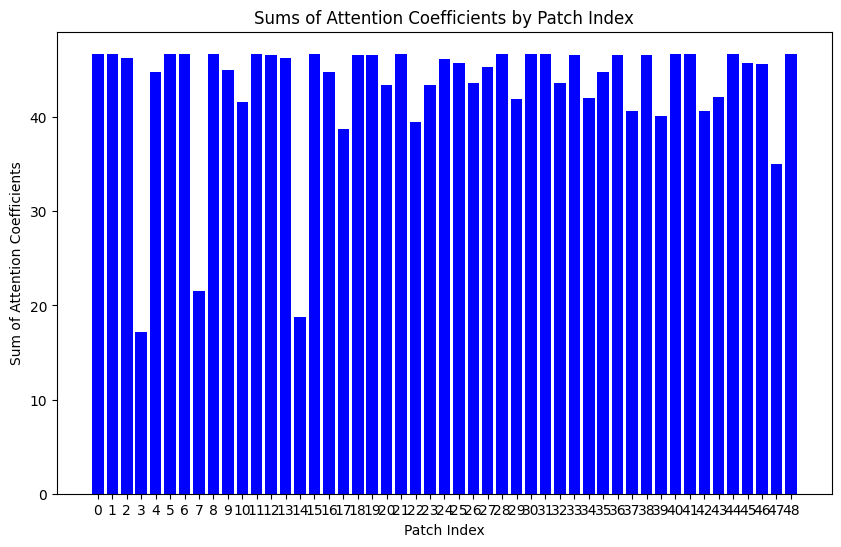

Predicted class for sample 111: 1.0
Row sums: [47.072598  47.003036  46.894962  15.8901415 44.50742   47.11483
 47.082005  20.169884  47.02576   45.92722   40.94709   46.89833
 36.675156  46.31806   20.266441  47.11251   45.904396  47.045242
 47.044758  47.034164  42.90751   47.113598  37.91512   46.554543
 46.746517  47.116615  43.119328  46.140186  46.98808   41.131977
 47.06335   45.043335  46.731323  46.776257  43.17724   45.731987
 46.727436  46.964985  46.825676  47.116165  46.999535  47.12192
 39.849773  41.52036   47.12129   47.02456   45.571945  36.528103
 47.033157 ]


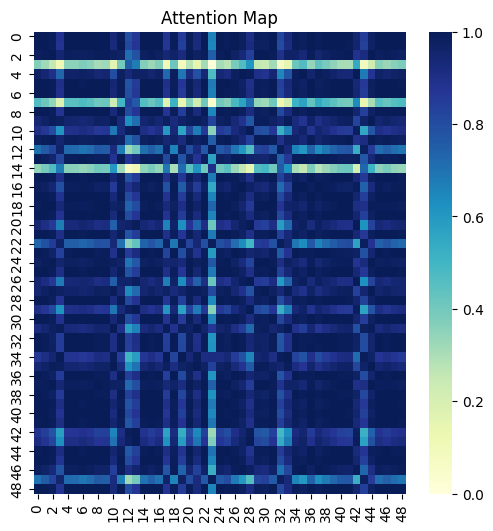

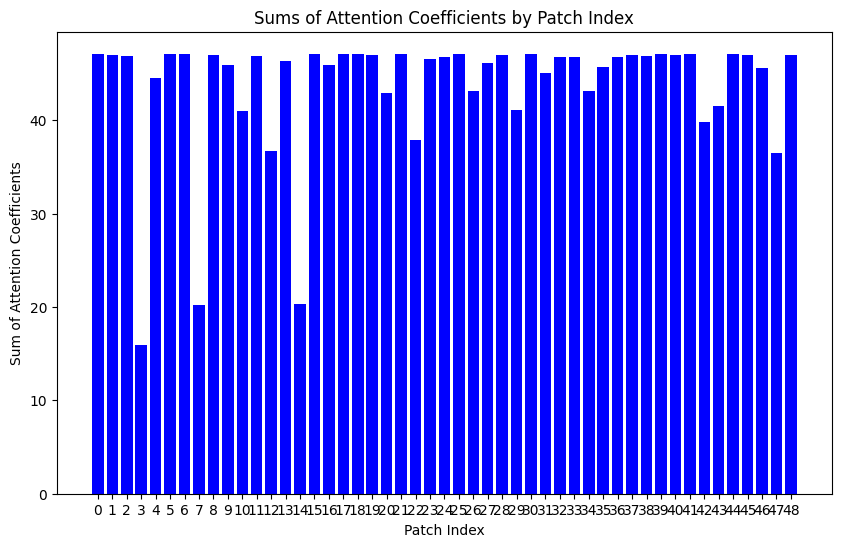

Predicted class for sample 112: 1.0
Row sums: [47.23498  47.225616 46.70797  17.215939 45.31692  47.209785 47.233433
 21.607243 47.23135  45.433315 42.273754 46.393326 46.941166 46.805553
 18.57308  47.213634 46.60437  45.76705  45.148975 45.781124 43.89297
 47.21193  36.57198  45.97396  47.212128 45.080803 44.084602 45.6967
 47.220955 42.26082  47.226433 46.573864 47.2083   47.11699  42.259922
 45.195904 47.087486 46.176495 41.088654 47.20711  47.22458  47.18447
 41.06015  42.621246 47.064297 47.234184 46.219334 35.11032  47.232777]


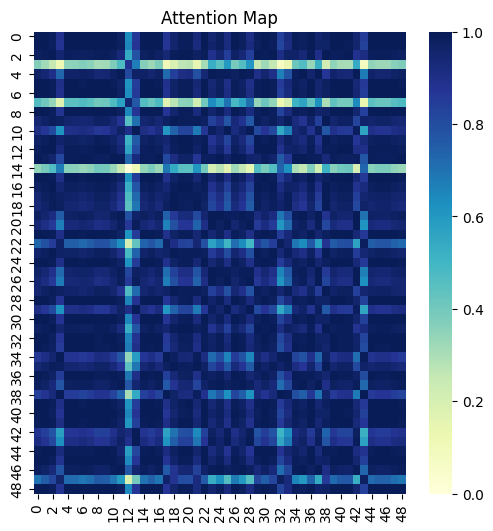

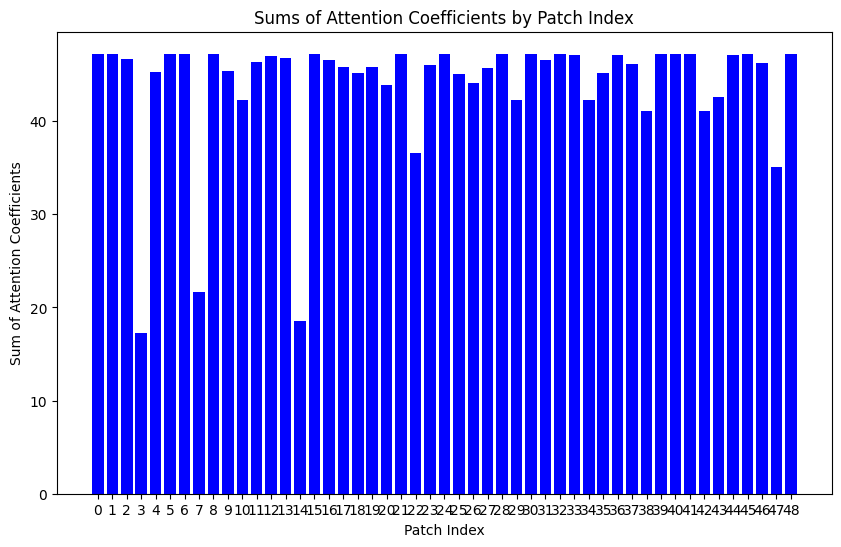

Predicted class for sample 113: 1.0
Row sums: [46.447033 46.4033   46.14421  16.66529  44.232685 46.461834 46.451878
 20.899384 46.418606 46.449963 41.31881  42.335423 46.406414 45.84761
 19.968199 46.461964 36.626015 46.205547 41.581203 46.424072 42.76232
 46.46194  37.108383 46.048576 45.68195  45.594467 42.95827  45.324547
 46.392895 41.10872  46.403496 46.257866 45.19802  46.230965 42.309635
 44.898823 46.191532 46.28575  41.09572  46.461594 46.400887 46.456306
 39.904896 41.47191  45.88472  46.417816 45.192825 35.750084 46.42342 ]


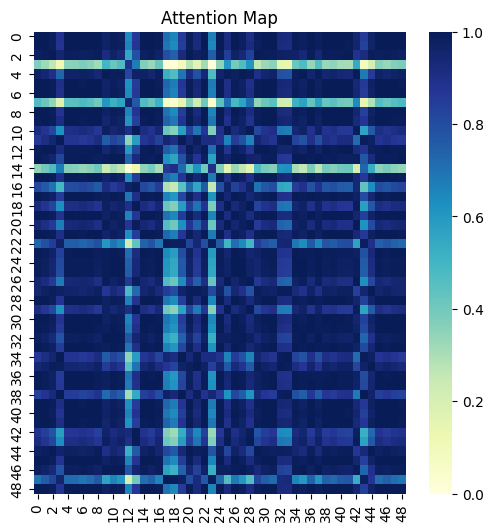

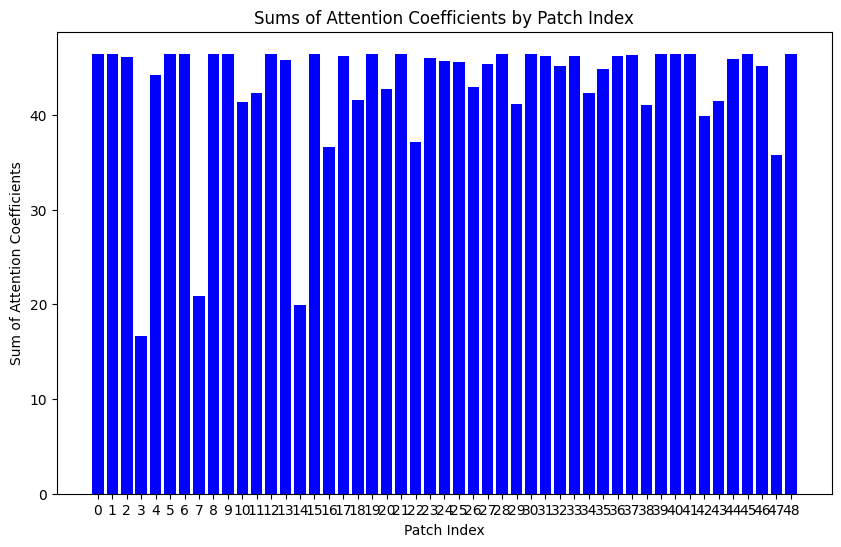

Predicted class for sample 114: 1.0
Row sums: [46.700348 46.662586 46.35877  17.006454 44.54067  46.70822  46.70408
 21.243338 46.676228 45.27561  39.80212  45.67501  43.73886  46.130947
 19.800926 37.553474 41.866787 45.80586  46.709534 46.632317 43.081757
 46.708675 37.12026  46.326107 46.299644 45.47589  43.276466 45.50566
 46.65318  41.436474 46.662758 46.57797  46.527054 46.50142  42.414658
 45.06668  46.463745 40.327576 45.691517 46.70756  46.66041  46.699272
 40.236973 41.798115 46.685295 44.14617  45.489006 35.741352 46.68045 ]


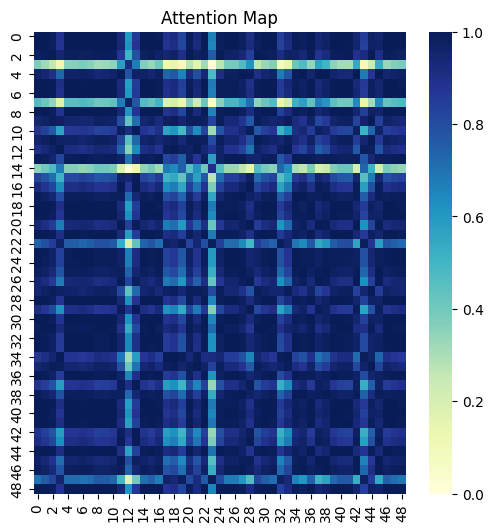

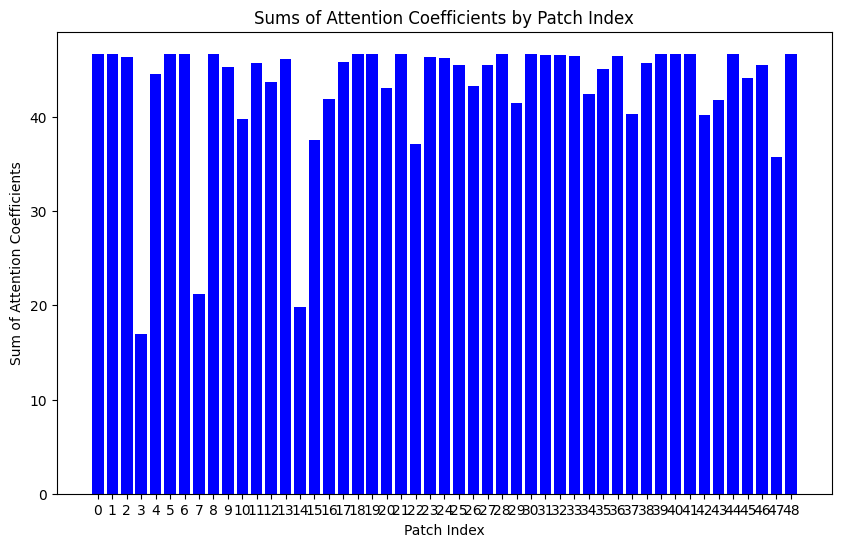

Predicted class for sample 115: 1.0
Row sums: [46.527897 46.49123  46.180546 16.892666 44.383335 46.53459  46.531437
 21.134827 46.504555 46.517776 35.280453 46.5363   46.464943 45.96501
 19.5282   46.53547  46.44453  30.438435 46.38875  46.50922  42.93058
 46.535107 36.91418  46.158684 45.424473 40.646835 43.124516 45.323368
 46.482014 41.291477 46.4914   41.19034  46.41033  46.332344 42.22324
 44.882847 46.295055 40.18643  46.35487  31.286318 46.4891   46.52509
 40.096127 41.651806 46.510654 46.50379  45.32699  35.531113 46.50867 ]


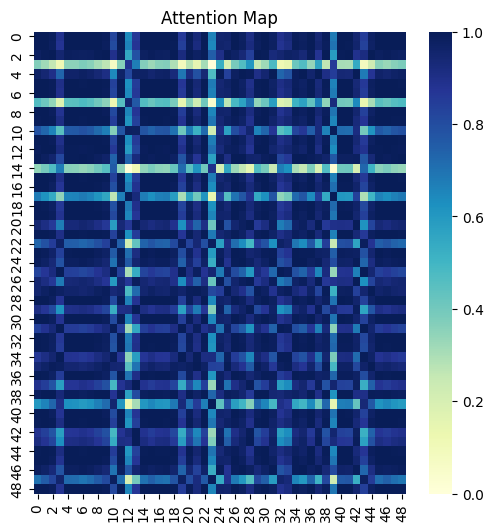

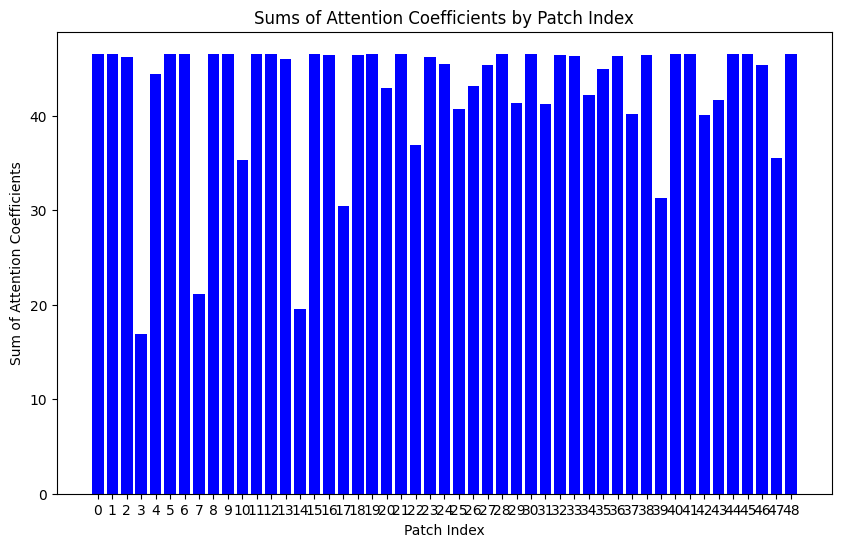

Predicted class for sample 116: 1.0
Row sums: [47.166546 47.113907 46.831295 13.486054 44.60152  47.186188 47.17254
 18.19965  47.13217  45.641277 40.821953 47.18374  47.12681  46.46523
 32.036427 46.777664 46.81813  38.74987  45.609512 41.62822  42.913013
 47.186134 36.456894 47.17304  46.32536  45.016422 42.578938 45.896378
 47.10154  41.01988  47.114143 46.95021  43.503494 46.911232 42.43694
 45.40902  46.865166 40.408226 44.641727 47.182533 47.11104  47.18108
 39.644806 41.43523  47.06307  47.175808 45.70783  34.895744 47.137936]


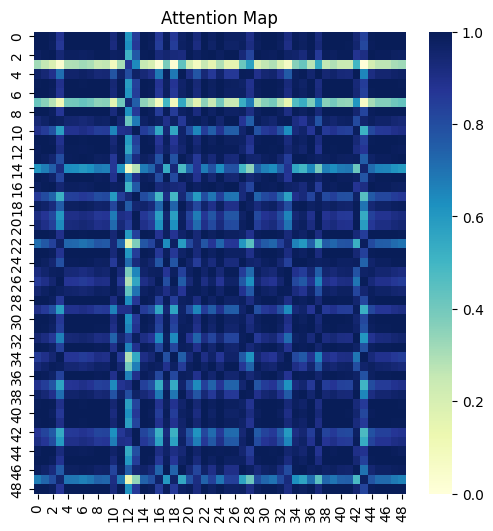

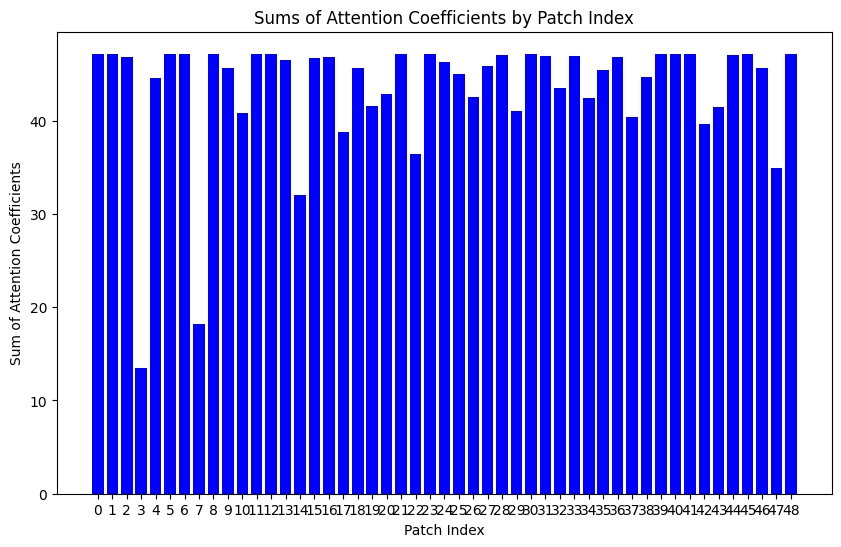

Predicted class for sample 117: 1.0
Row sums: [46.169018 46.132793 45.83125  17.03235  44.067493 46.175964 46.172543
 21.227753 46.145927 44.768055 44.9826   42.095417 46.108517 45.61654
 19.602192 46.17679  45.273502 45.80615  45.18394  46.15053  42.644997
 46.17645  36.75142  45.806362 43.837788 40.406914 42.834904 44.9938
 46.123714 41.039757 46.13296  45.36969  45.94304  45.97669  41.959465
 44.56304  45.940105 39.957253 45.00435  29.16329  46.130695 46.166862
 39.868786 41.392685 46.152905 46.032536 44.99155  35.39253  46.14999 ]


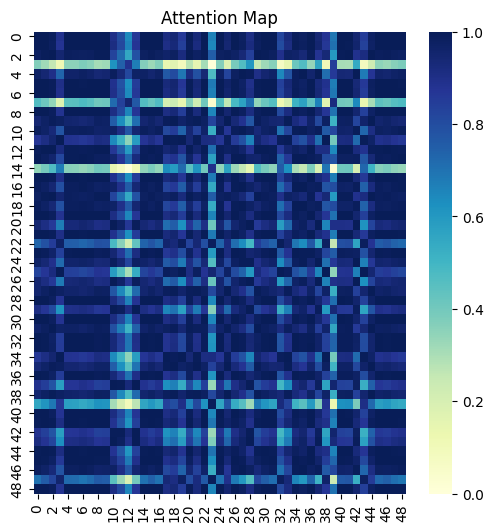

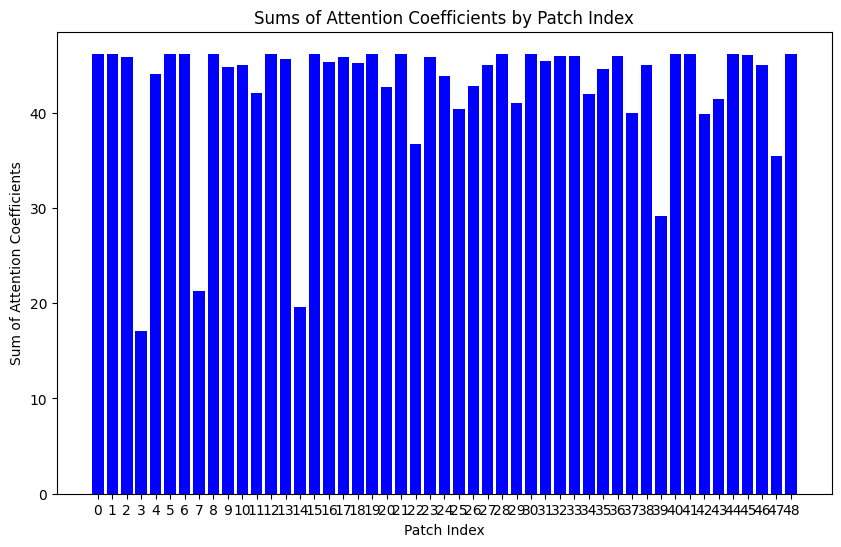

Predicted class for sample 118: 1.0
Row sums: [46.603138 46.57735  46.192448 17.082975 44.57286  46.59763  46.6047
 21.36105  46.587605 45.049015 45.22235  39.317814 46.507294 46.09859
 19.304798 46.59962  45.765347 46.568157 45.539368 46.591045 43.14912
 46.59875  36.725582 46.280228 45.21147  40.502052 43.339813 45.288944
 46.56999  41.532196 46.577484 45.960415 46.40863  46.43973  42.10511
 44.831825 46.405907 40.43806  43.98561  46.595695 46.575665 46.582253
 40.348537 41.888344 46.562843 46.587017 45.488686 35.331093 46.590645]


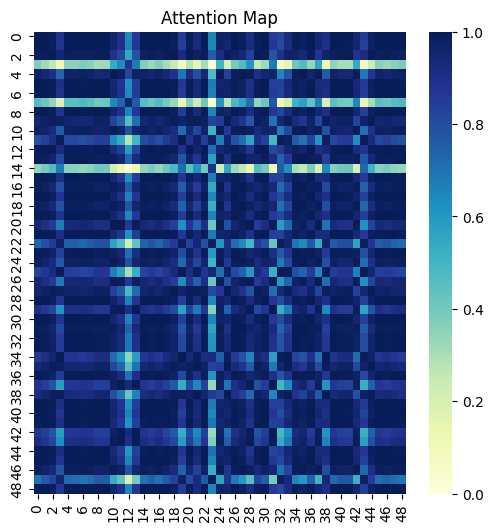

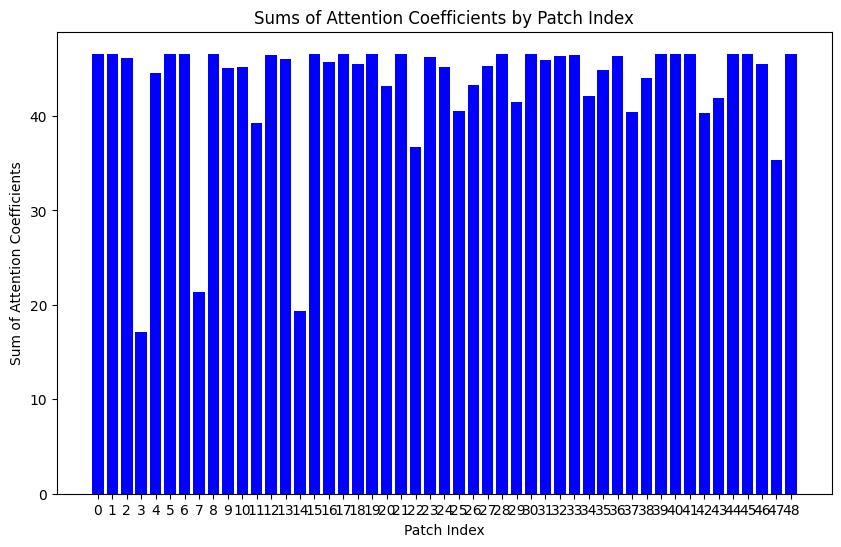

Predicted class for sample 119: 1.0
Row sums: [46.849888 46.80951  46.513386 16.707994 44.632057 46.86009  46.854046
 20.988186 46.823936 46.302    44.7262   46.86059  46.79482  46.259933
 19.543314 46.860676 45.930943 46.187004 46.7008   46.82904  43.143288
 46.860443 37.14121  46.460705 46.310112 41.03036  43.341843 45.65286
 46.799603 41.466854 46.809692 44.140423 46.43691  46.641663 42.519688
 45.208733 46.602688 40.338028 46.304222 43.275616 46.807217 46.852024
 40.245823 41.83516  46.838688 46.823196 45.601723 35.73963  46.828434]


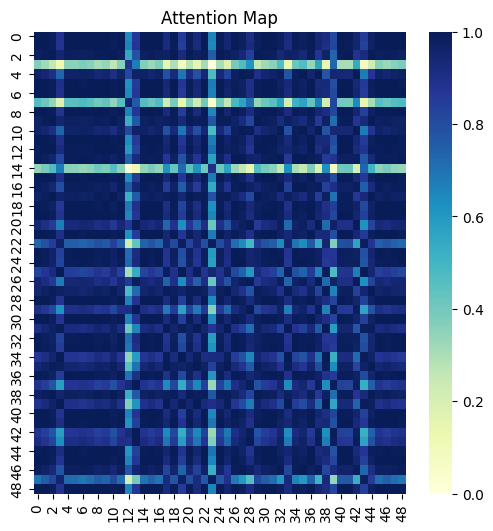

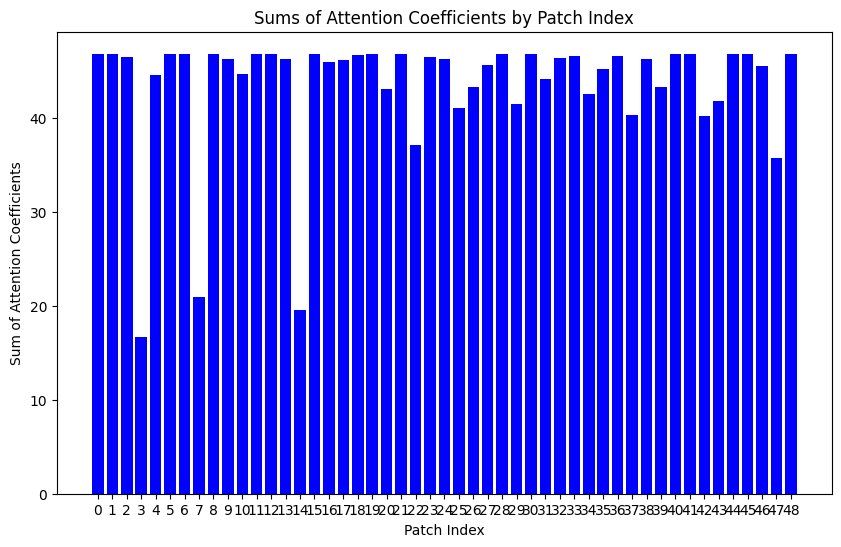

Predicted class for sample 120: 1.0
Row sums: [47.001736 46.951344 46.716938 16.401937 44.656155 47.022747 47.007675
 20.690327 46.978878 45.975937 41.225628 46.70445  46.97486  46.353516
 19.765348 47.022835 45.303818 42.81773  40.307575 46.974873 43.12282
 47.02257  37.434425 46.56729  46.243988 46.50864  43.326786 45.887714
 46.93969  41.405163 46.95156  46.93173  46.267826 46.76285  42.796963
 45.453506 46.72037  40.25204  46.986313 47.022827 46.948635 47.019737
 40.157955 41.781937 47.0106   46.486156 45.662483 36.032173 46.97413 ]


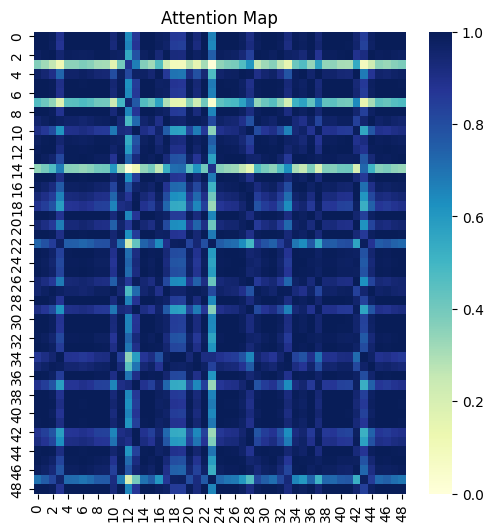

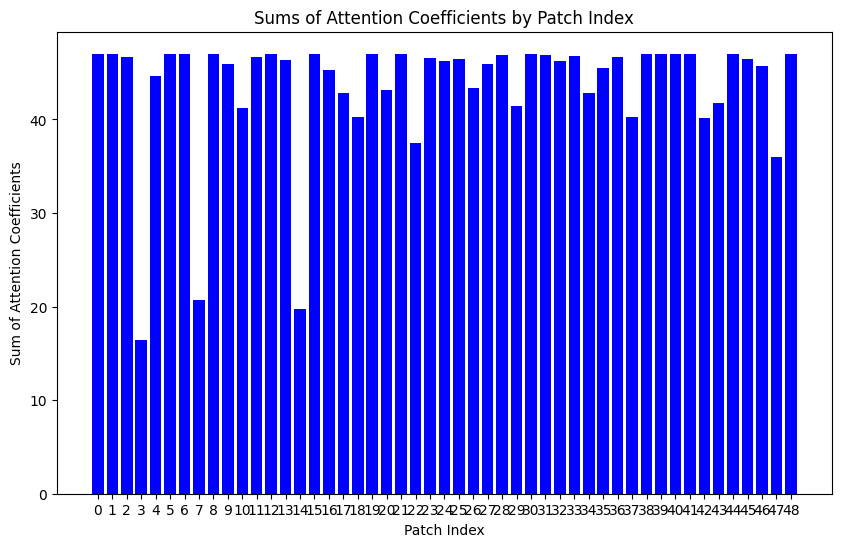

Predicted class for sample 121: 1.0
Row sums: [47.663128 47.633408 47.163292 12.809972 45.241917 47.655136 47.66477
 17.778751 47.645367 45.786312 45.611652 47.63781  43.10284  47.064438
 15.350964 47.252144 47.652225 47.30299  47.118793 44.08197  43.54073
 47.65655  47.642757 46.733368 47.029602 47.661804 43.768528 46.074844
 47.624794 41.610077 47.661396 47.26478  47.453598 47.4707   42.255253
 45.52525  47.430515 47.64026  47.657215 47.653297 47.63144  47.63602
 40.19805  43.218258 47.643883 47.64478  46.336266 34.178207 47.64889 ]


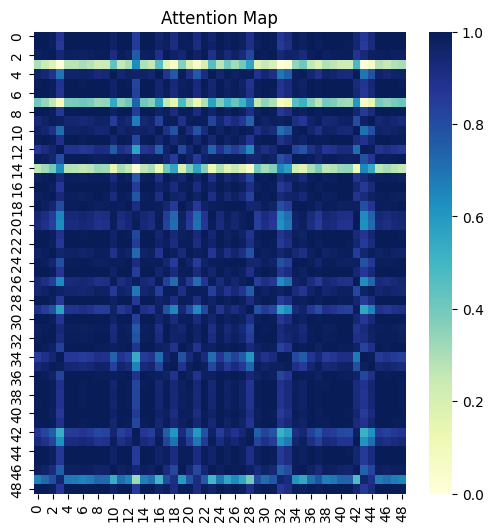

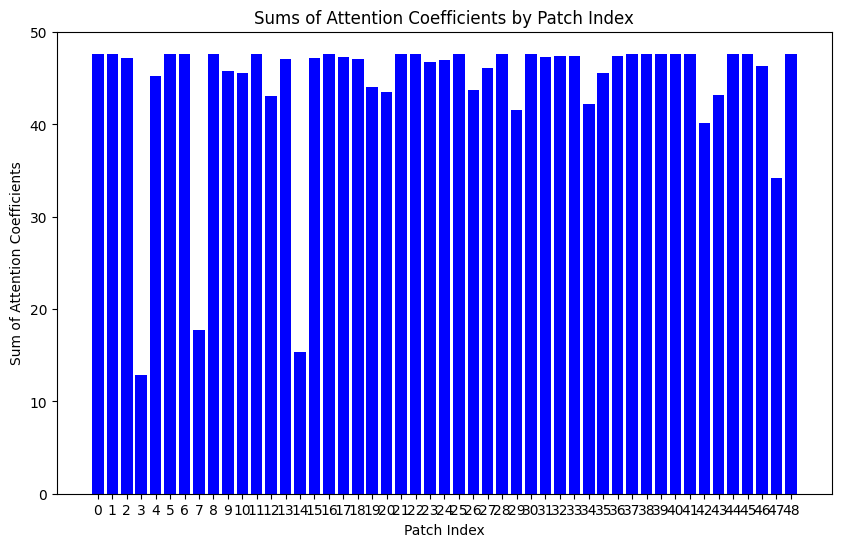

Predicted class for sample 122: 1.0
Row sums: [46.827538 46.781235 46.525578 16.55863  44.54631  46.844376 46.83277
 20.831076 46.797337 45.76392  39.630554 46.367573 46.768524 46.205696
 31.389002 46.744377 31.464607 45.45515  45.272705 43.602146 43.04025
 46.8444   37.27178  46.413086 46.081333 45.09763  46.4746   45.690678
 46.770313 41.349586 46.78144  46.75481  46.00483  46.601795 42.605675
 45.255875 46.56093  40.21314  46.30127  45.99597  46.778698 46.839504
 40.12037  41.720684 46.828873 46.411293 43.994526 35.878204 46.802418]


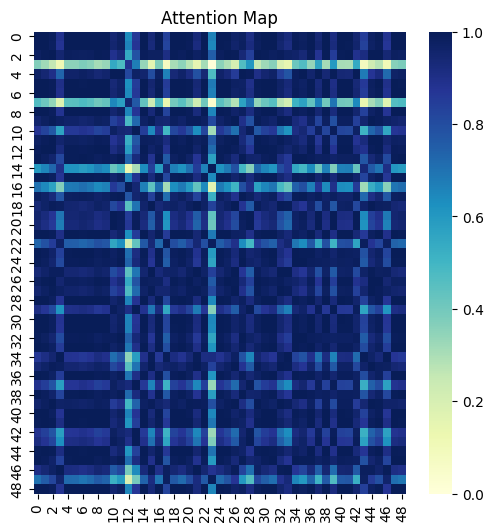

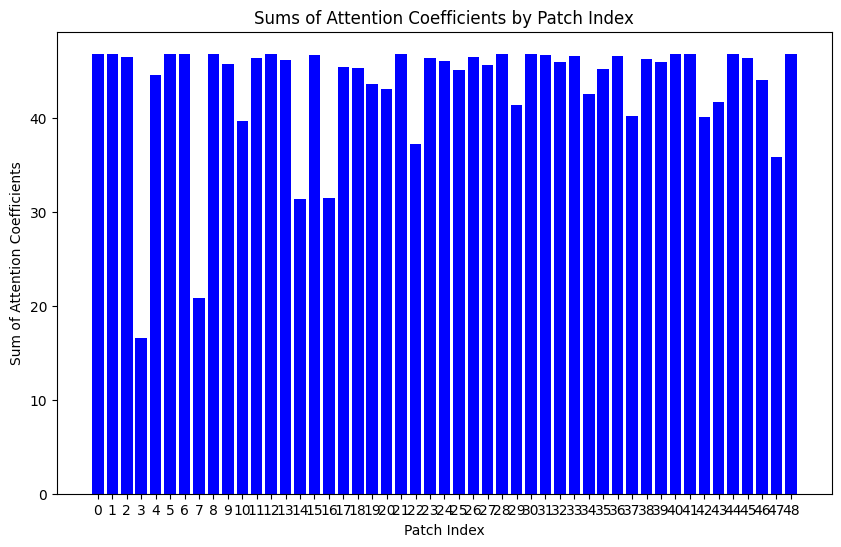

Predicted class for sample 123: 1.0
Row sums: [47.303867 47.269382 46.919735 16.627062 45.104874 47.306618 47.306873
 20.989922 47.28222  45.76723  37.703907 47.25521  47.298935 46.736618
 19.373775 47.307922 47.159943 44.766296 47.093872 47.239426 43.59865
 47.307365 37.233307 46.934605 47.179203 46.656864 43.84891  46.01073
 47.26041  41.896244 47.304558 41.349525 47.227337 47.11095  42.758522
 45.546406 46.13472  47.021694 47.18777  47.3056   47.267315 47.29467
 41.28209  40.346703 47.277885 47.28157  46.08033  35.80008  47.286144]


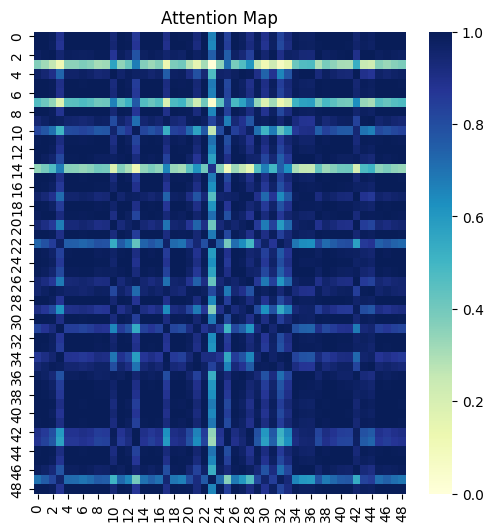

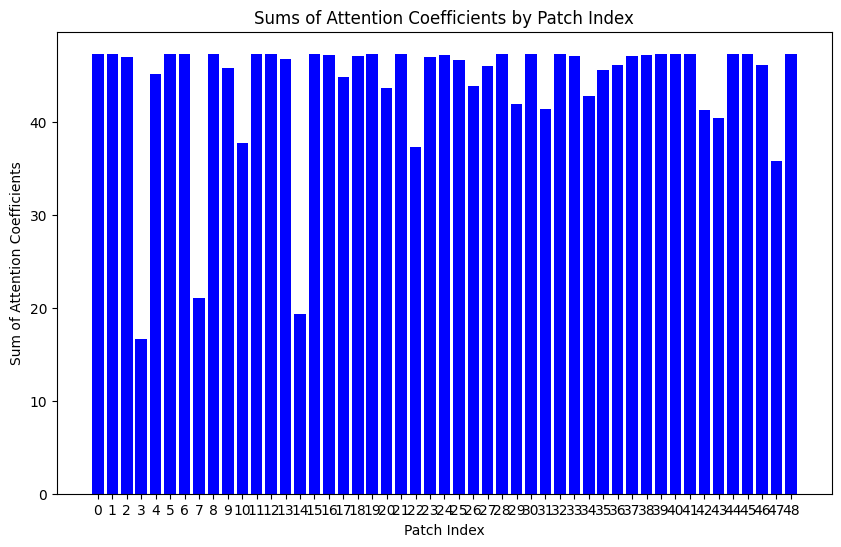

Predicted class for sample 124: 1.0
Row sums: [47.015205 46.99206  46.57263  16.906626 44.96373  47.005722 47.01619
 21.259474 47.001656 45.318085 46.546837 43.67209  46.90627  46.51442
 18.89722  47.00812  45.952595 47.01368  42.622116 47.004814 43.510735
 47.007072 36.765354 42.58513  46.402428 46.997314 43.70548  45.627834
 46.985077 41.858505 46.992764 47.015987 43.812157 46.857117 42.323265
 45.15192  46.823406 41.290253 46.611755 46.94223  46.99047  46.98806
 40.648403 42.222538 46.966526 47.00365  47.016163 35.32789  47.004448]


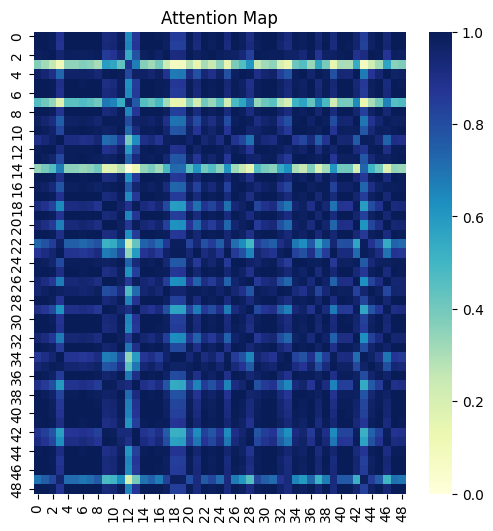

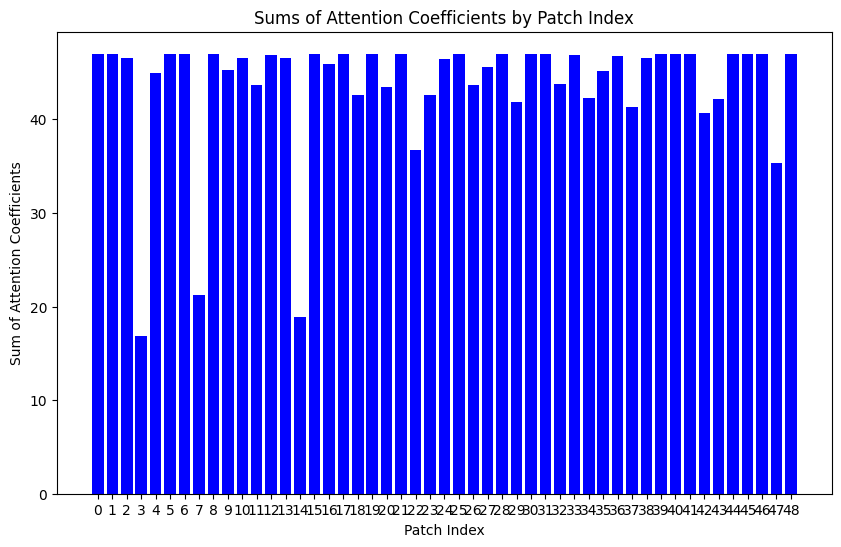

Predicted class for sample 125: 1.0
Row sums: [46.709797 46.652447 46.474407 16.320948 44.317345 46.73916  46.717052
 20.564339 46.671654 45.473682 45.960636 41.780754 46.70671  46.02987
 20.02432  46.737984 45.64255  46.57843  45.336273 46.67866  42.78467
 46.738552 37.472076 46.24901  44.584476 44.126194 42.988163 45.69093
 46.639645 41.074116 46.652687 41.299793 46.41093  46.451694 42.70685
 45.275223 46.407394 39.928024 41.293373 46.73976  46.64946  46.740368
 39.83457  41.448936 46.734905 46.670647 45.32901  36.09716  46.677826]


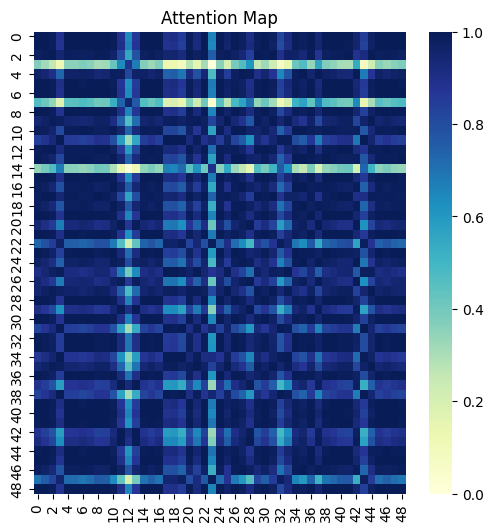

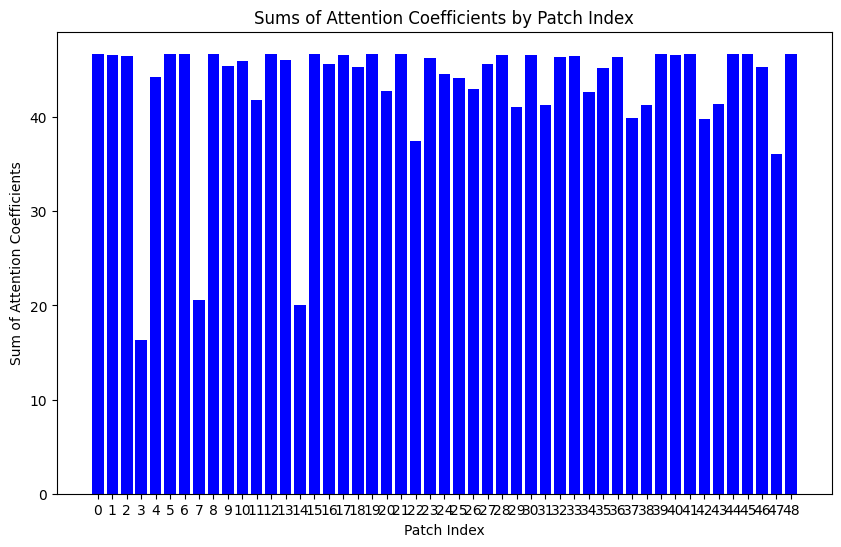

Predicted class for sample 126: 1.0
Row sums: [47.279934 47.257294 46.829227 16.92019  45.214703 47.269554 47.280804
 21.29475  47.266777 47.08744  28.967955 45.009804 45.810417 46.777996
 19.081226 47.246243 41.376083 46.63666  47.180252 46.346176 43.74796
 47.27096  36.952744 46.962112 46.60101  45.277534 45.646    45.873646
 47.250355 42.079273 47.265816 47.249386 46.886345 47.12242  42.541103
 45.393005 47.088604 46.189144 46.59398  47.26776  47.25571  47.251343
 40.856842 43.134953 47.28028  47.26631  46.155163 35.509983 47.269524]


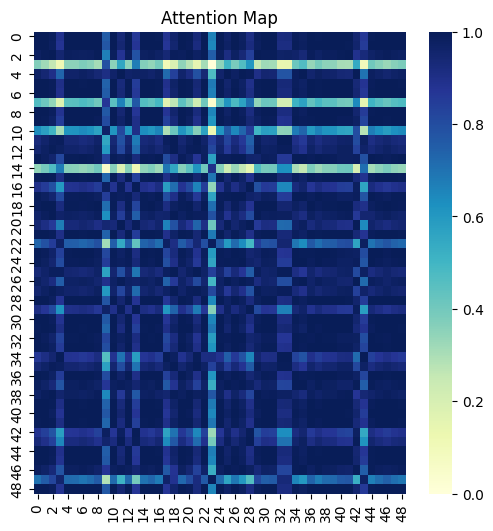

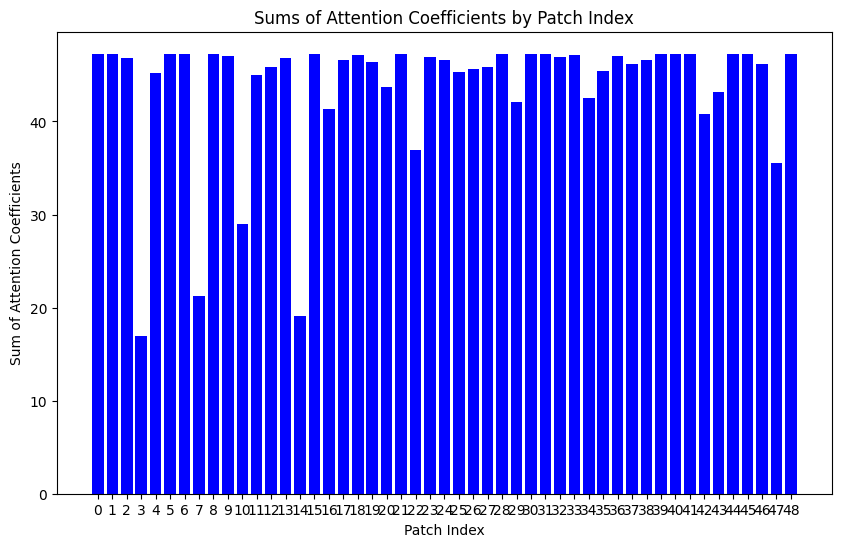

Predicted class for sample 127: 1.0
Row sums: [46.697765 46.651493 46.39979  16.601704 44.430004 46.71482  46.703014
 20.856659 46.667564 45.346455 44.330578 43.63055  46.661797 46.078842
 19.741835 46.714767 45.710087 46.701904 46.06027  46.673325 42.93397
 46.71483  37.213245 46.28505  45.459267 40.785572 43.133175 45.572193
 46.640606 41.254677 46.6517   45.55224  46.435364 46.47277  42.510914
 45.14094  46.43211  40.125847 44.676907 46.71469  46.648968 46.710155
 40.0337   41.623283 46.69974  46.666733 45.40914  35.828377 46.672638]


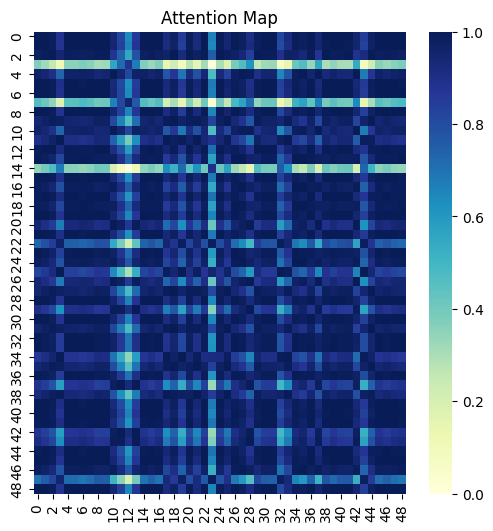

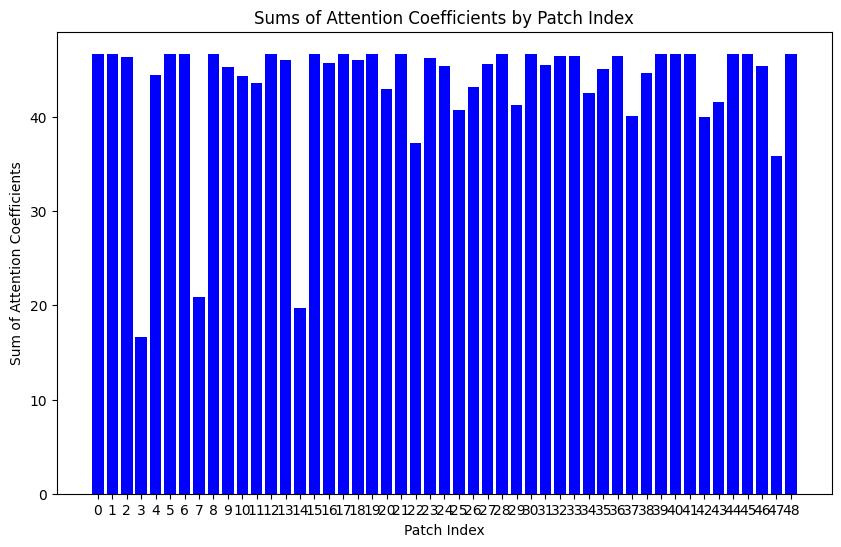

Predicted class for sample 128: 1.0
Row sums: [46.868347 46.789387 46.75014  15.783406 44.219505 46.921406 46.87949
 20.01265  46.81474  45.840687 40.639183 45.19416  46.899612 46.06656
 20.485826 46.91809  45.640804 46.85823  46.811775 46.824196 42.606
 46.919632 38.01755  46.28174  46.76915  46.859695 42.81908  46.043724
 46.772854 40.82433  46.8974   45.58024  46.49749  46.544987 43.179565
 45.653873 46.489384 45.06318  46.60071  46.923405 46.785503 46.933823
 39.541496 41.213467 46.937756 46.813385 45.30081  36.64961  46.82306 ]


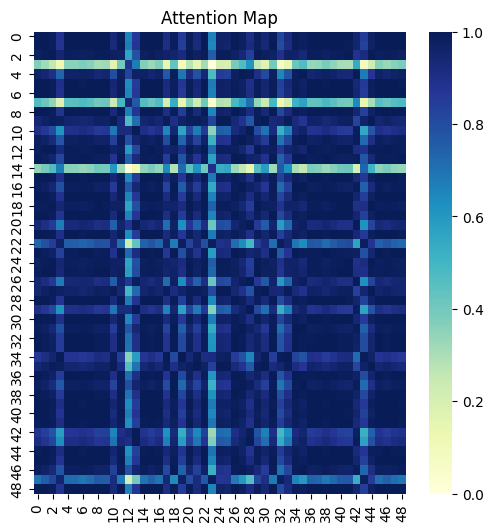

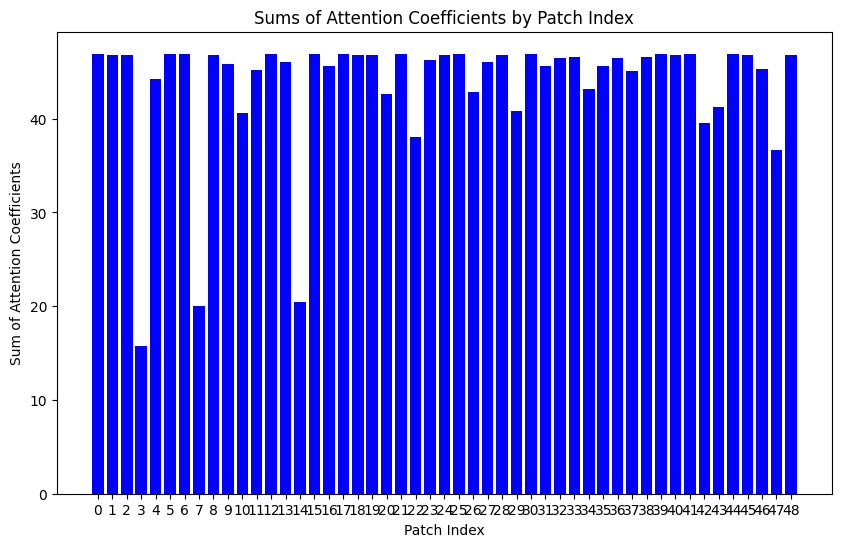

Predicted class for sample 129: 1.0
Row sums: [47.02125  46.959682 46.79907  16.136292 44.548954 47.05465  47.029217
 20.409801 46.98014  45.794346 41.213425 47.051857 47.027397 46.311234
 20.023664 47.05314  45.91142  47.057377 46.352745 46.987637 42.97824
 47.05386  37.68969  46.53816  46.890503 43.664833 43.186577 46.013268
 46.946102 41.2288   46.98296  46.31267  46.70642  46.748898 42.99626
 45.594177 46.70274  44.166386 38.48561  47.055466 46.956512 47.05754
 39.96281  41.61189  47.053375 46.979065 45.58847  36.29553  46.98674 ]


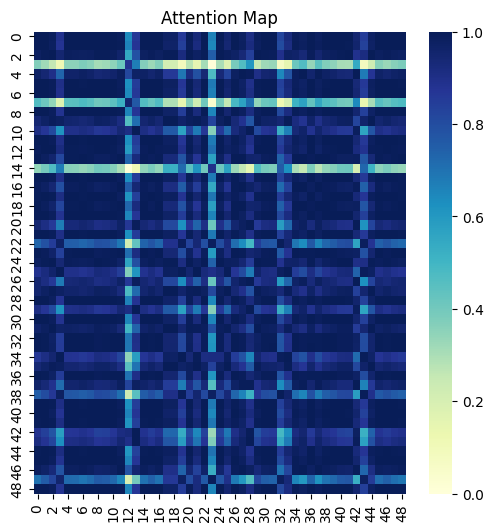

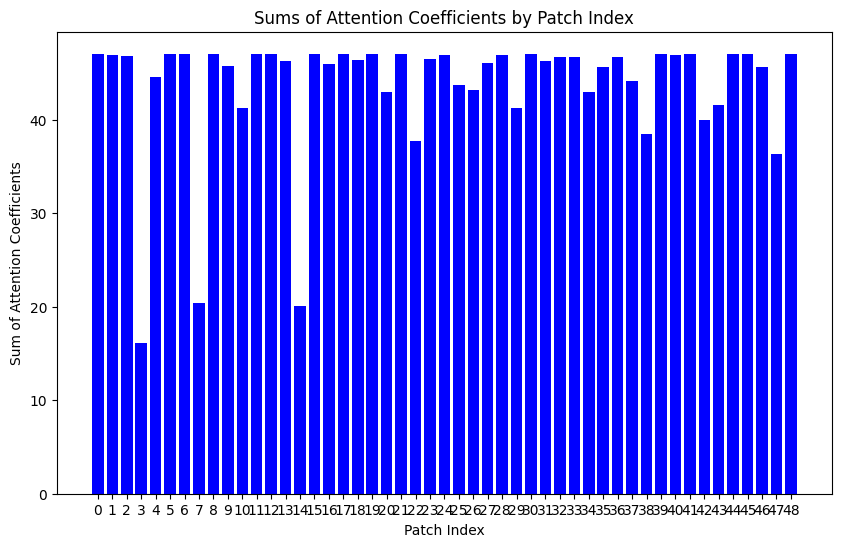

Predicted class for sample 130: 1.0
Row sums: [46.824528 46.75236  46.669212 15.969261 44.256157 46.87012  46.83444
 20.200914 46.77578  45.730328 40.684303 43.15942  46.864296 46.06099
 20.321312 46.867474 45.64729  46.870987 44.952263 46.78447  42.668144
 46.86871  37.84381  46.29827  46.77815  45.633095 42.878193 45.937992
 46.737003 40.909065 46.80712  46.68575  46.476288 46.521667 43.033684
 45.539696 46.472363 46.852245 46.64435  46.871674 46.74876  46.878998
 39.640087 41.29364  46.879963 46.77454  45.31559  36.47229  46.783424]


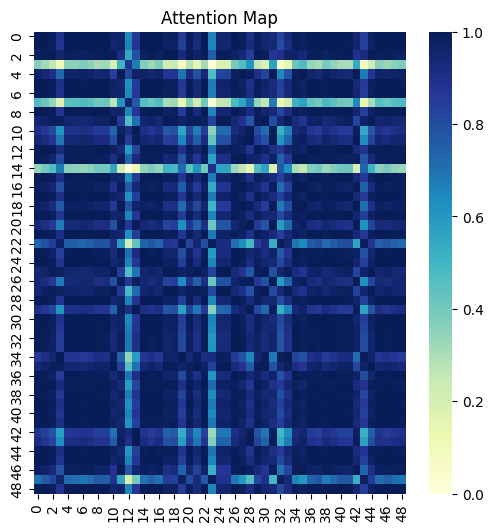

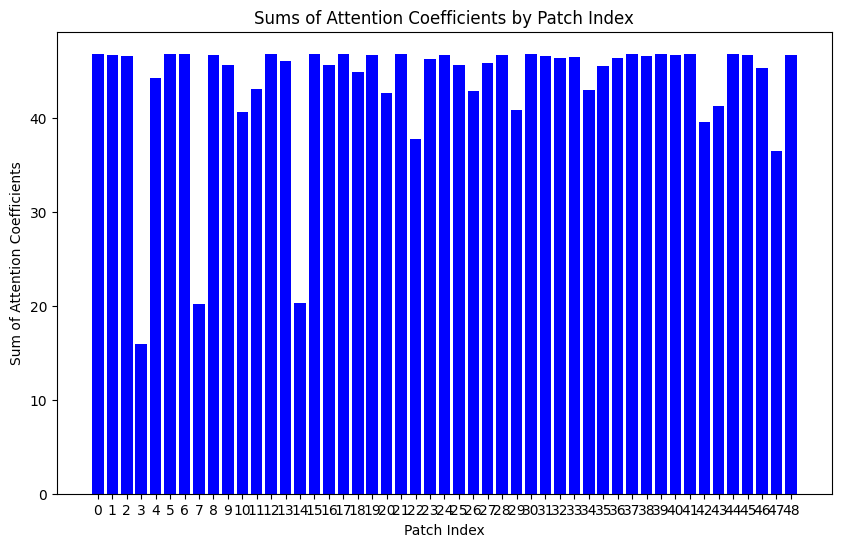

Predicted class for sample 131: 1.0
Row sums: [47.147156 47.056583 47.082    15.348015 44.332268 47.212357 47.16033
 19.60768  47.08529  46.198315 40.621258 47.19276  47.237324 46.273754
 20.417995 43.392513 46.538437 45.67714  46.650143 42.603424 42.65484
 47.21     46.71677  46.86308  46.056053 46.923935 45.842075 46.398533
 47.037987 40.812298 47.121822 47.19588  47.122467 46.78724  43.535286
 46.013393 46.74943  47.210545 43.631702 47.21505  47.052216 47.230286
 39.49004  43.80795  46.64496  47.083755 45.46434  36.914944 47.09477 ]


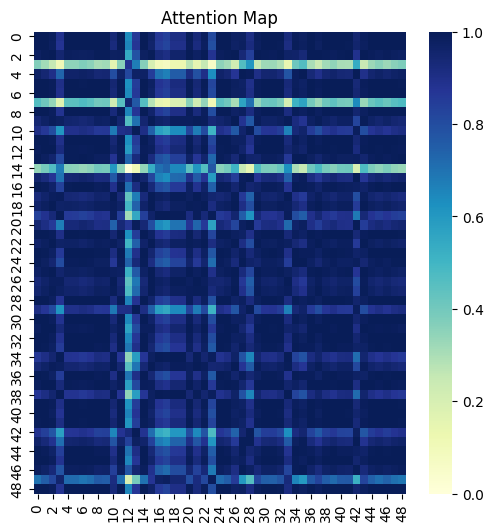

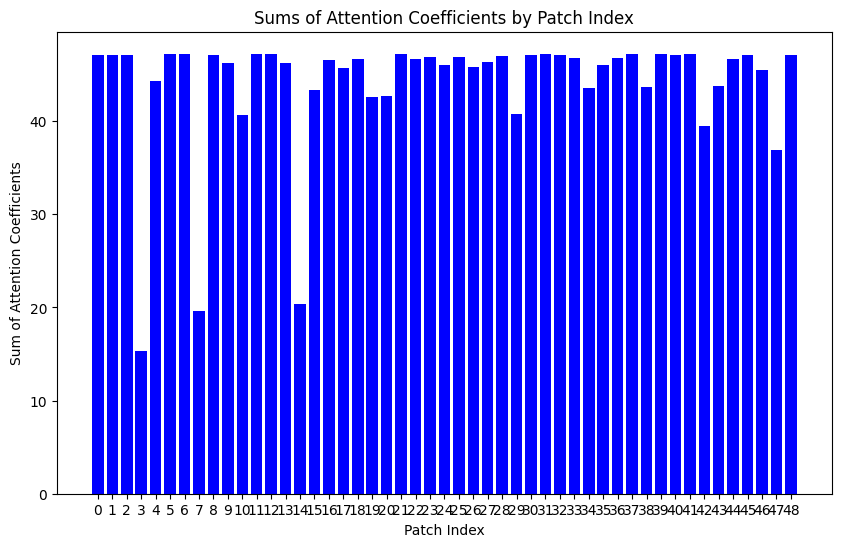

Predicted class for sample 132: 1.0
Row sums: [46.624027 46.59496  46.231342 16.956526 44.554073 46.622124 46.62618
 21.238956 46.606148 46.25635  24.767345 46.46059  46.537735 46.100914
 19.418331 46.56813  42.471176 45.8769   46.502155 46.579433 43.11699
 46.62307  36.818497 46.286602 46.016457 46.55235  43.3093   45.34023
 46.587032 41.487713 46.5951   46.619495 45.92819  46.450706 42.1783
 44.887455 46.415775 40.386242 46.62566  46.148903 46.593136 46.608456
 40.296146 41.8464   46.590477 44.498028 45.480957 35.427628 46.609512]


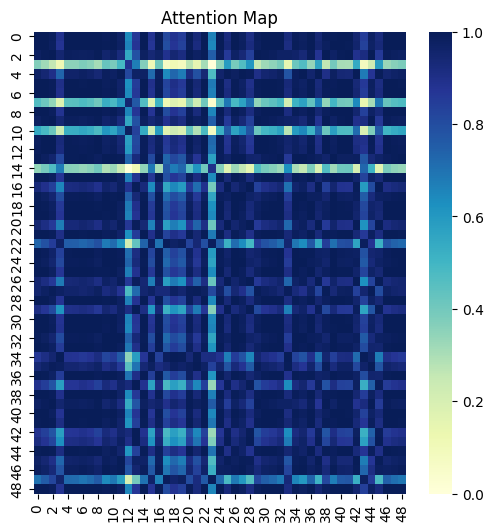

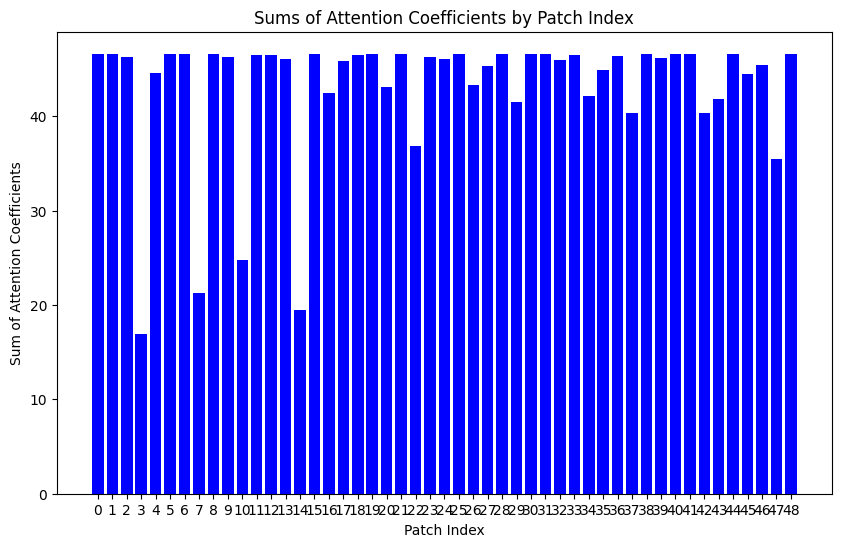

Predicted class for sample 133: 1.0
Row sums: [47.45224  47.410103 47.058685 14.052542 45.005543 47.460262 47.456333
 18.765356 47.42539  47.209766 35.566067 46.32518  45.116848 46.808968
 17.090094 46.699085 47.425022 46.94982  47.444138 47.220585 43.351032
 47.46083  42.805683 44.31474  46.741585 47.002213 46.848003 46.08456
 47.399548 41.486244 47.44466  36.01498  44.32108  47.22838  42.56486
 45.584    47.201397 46.78794  44.6862   47.459446 47.407665 47.449627
 40.127632 44.07097  47.36363  47.424606 46.08118  34.995117 47.43011 ]


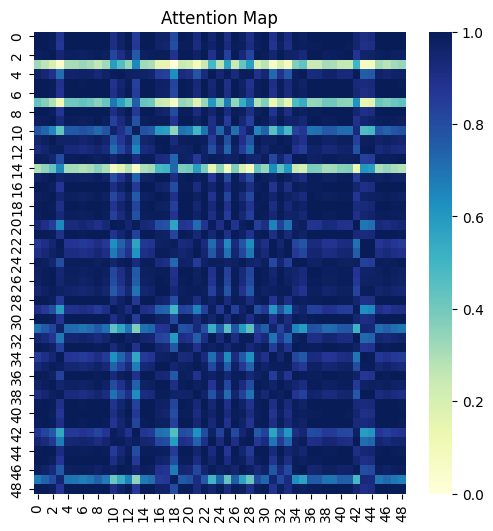

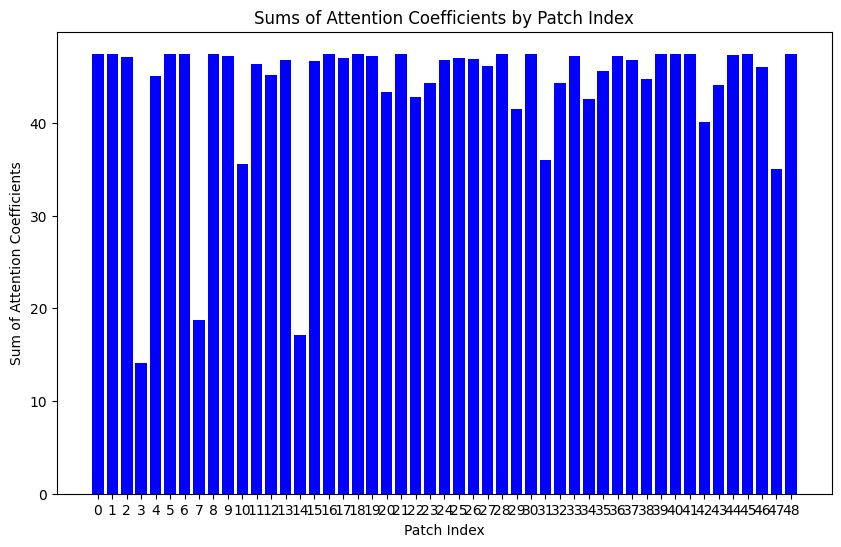

Predicted class for sample 134: 1.0
Row sums: [47.199684 47.187527 46.69245  17.173098 45.25955  47.177826 47.198666
 21.556591 47.197075 46.28885  42.026253 47.169285 31.218391 46.757046
 18.872093 46.094547 36.305214 38.675014 42.41048  44.344925 43.8324
 47.179794 36.692352 46.92827  46.65108  45.52255  44.1711   45.70015
 47.182407 42.198517 47.187614 47.176743 44.254345 47.07388  42.311855
 45.207306 47.043613 41.088215 47.065594 46.940067 47.18638  47.154194
 40.997242 42.55922  47.12759  44.714314 46.165924 35.24726  47.195732]


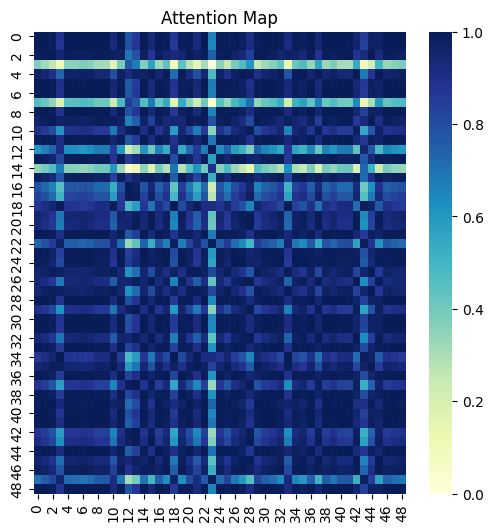

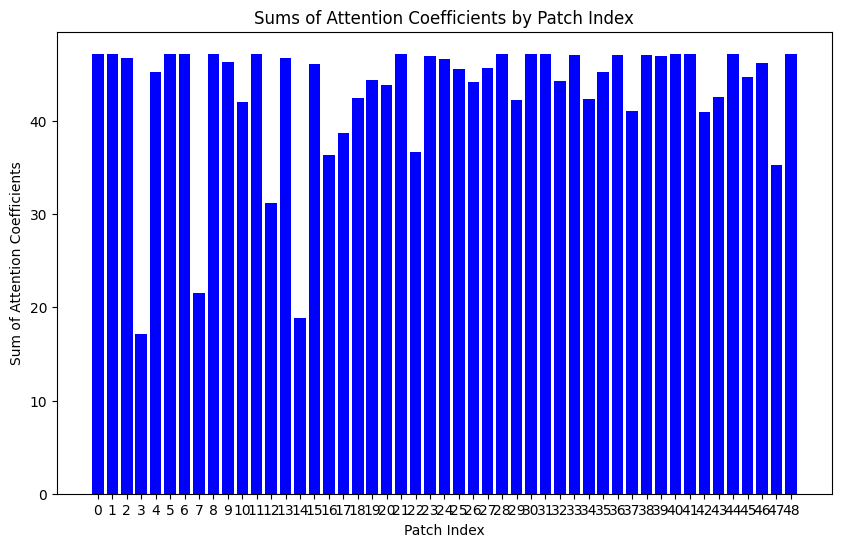

Predicted class for sample 135: 1.0
Row sums: [47.29023  47.227375 47.03828  14.509268 44.686737 47.322765 47.29821
 19.041363 47.248394 45.956154 40.97145  44.69609  41.150158 46.548885
 18.60428  47.321426 46.12747  47.32392  45.87119  47.254776 43.021854
 47.322075 37.312836 46.21623  42.81221  47.176907 43.24282  46.191162
 47.213383 41.16516  47.204197 46.804604 46.96386  47.00828  42.963963
 45.741463 46.994984 46.44665  47.059864 47.323452 47.224113 47.324394
 39.820625 41.57188  44.420494 47.24729  45.786465 35.831116 47.255154]


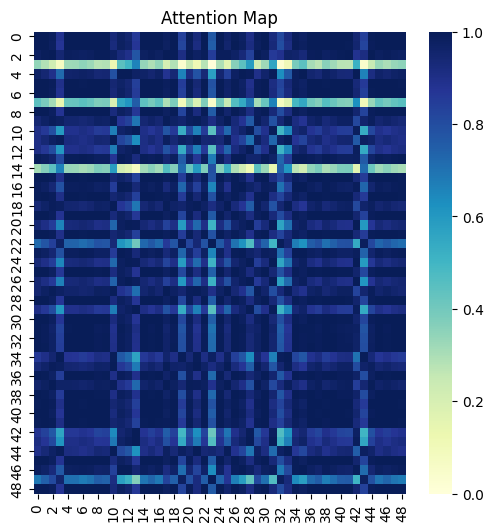

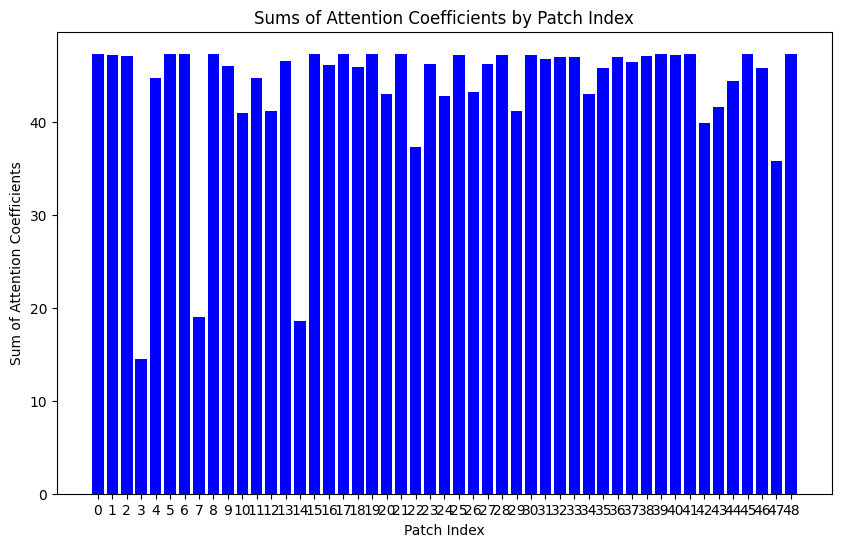

Predicted class for sample 136: 1.0
Row sums: [46.90276  46.85615  46.600025 16.51925  44.609974 46.919785 46.90804
 20.801876 46.872353 45.533405 44.474155 46.917793 46.865723 46.277534
 19.70779  46.919754 45.904667 46.863884 46.738426 46.87816  43.096714
 46.919804 37.31196  46.485992 42.756504 40.9771   43.298206 45.761906
 46.845165 41.398167 46.856358 45.604977 46.057842 46.675694 42.66496
 45.325394 46.63461  40.256508 46.722565 46.91964  46.853603 46.914948
 40.16332  41.770973 46.90431  46.809006 45.60032  35.913765 46.877464]


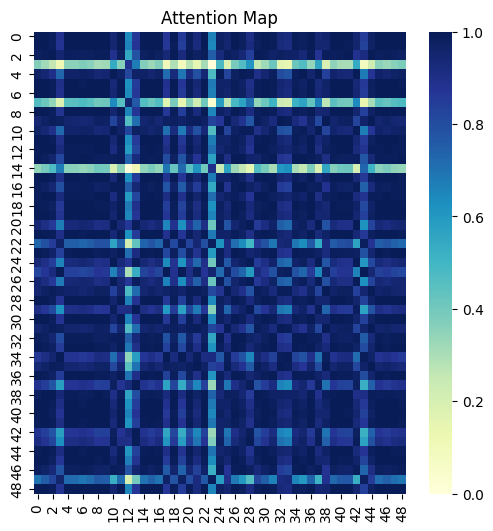

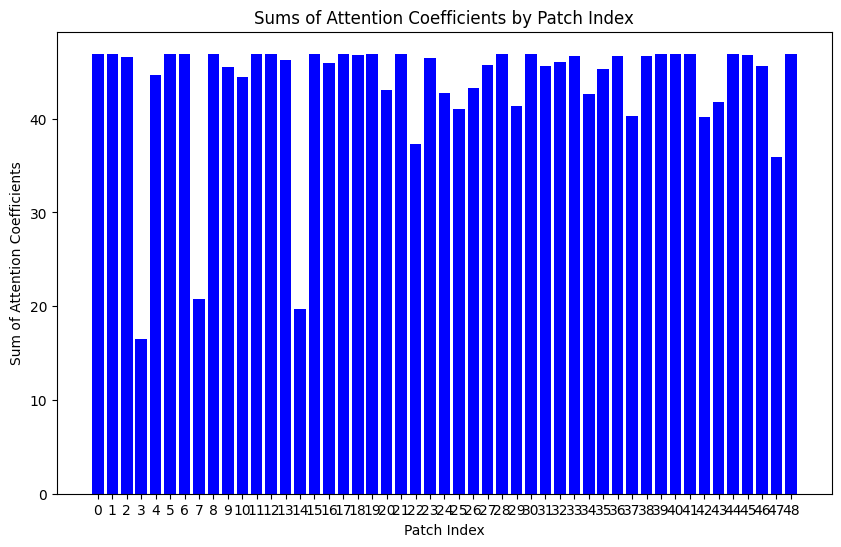

Predicted class for sample 137: 1.0
Row sums: [46.939034 46.92396  46.455986 17.182129 44.99071  46.920887 46.938587
 21.523327 46.931244 46.319786 25.116135 46.356697 46.807682 46.48548
 18.987406 43.78174  42.984165 46.843513 45.24051  45.84696  43.57273
 46.922657 36.631012 46.657967 46.379093 46.387882 43.765438 45.489067
 46.91838  41.95212  46.92406  46.88899  42.365063 46.805748 42.16561
 45.00699  46.774883 40.918415 45.109463 46.912014 46.922703 46.8992
 40.76167  42.309723 46.769444 46.93889  45.893772 35.205086 46.933235]


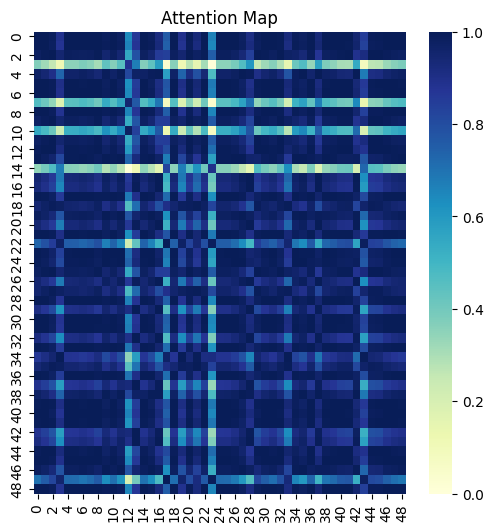

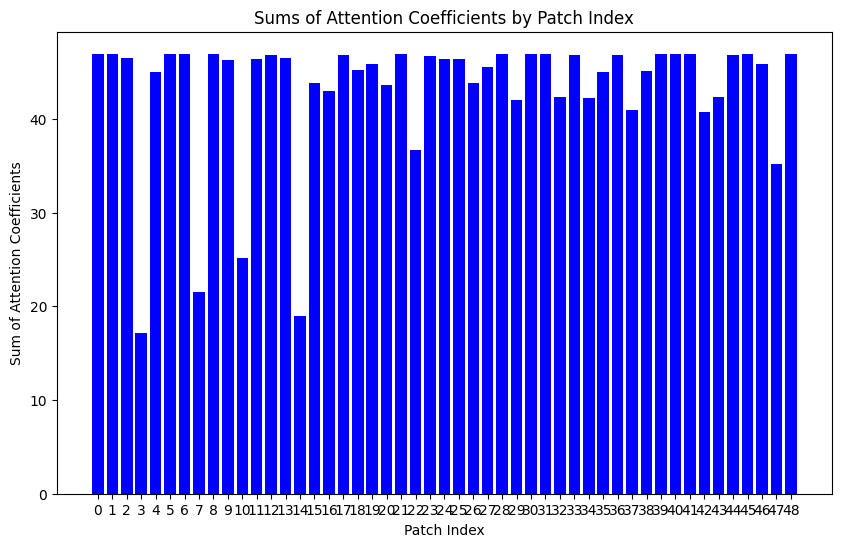

Predicted class for sample 138: 1.0
Row sums: [46.532528 46.47407  46.309322 16.300953 46.001823 46.563477 46.54002
 20.52731  46.493565 46.22809  40.081028 45.52938  46.53455  45.85022
 20.141617 46.562134 41.394657 46.43762  37.563183 46.500694 42.620888
 46.562786 37.432377 46.069115 45.72015  46.03545  42.82316  45.541176
 46.46112  40.920906 46.49739  46.53779  44.02583  46.27202  42.601624
 45.13241  46.229496 41.448494 41.46294  46.074455 46.505863 46.565582
 39.689224 41.293373 46.56094  46.49254  45.151596 36.073162 46.49984 ]


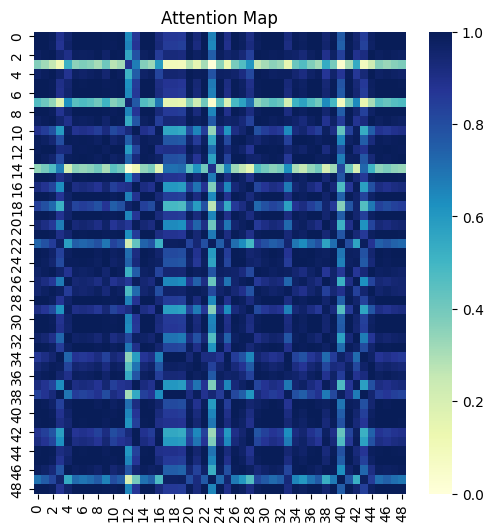

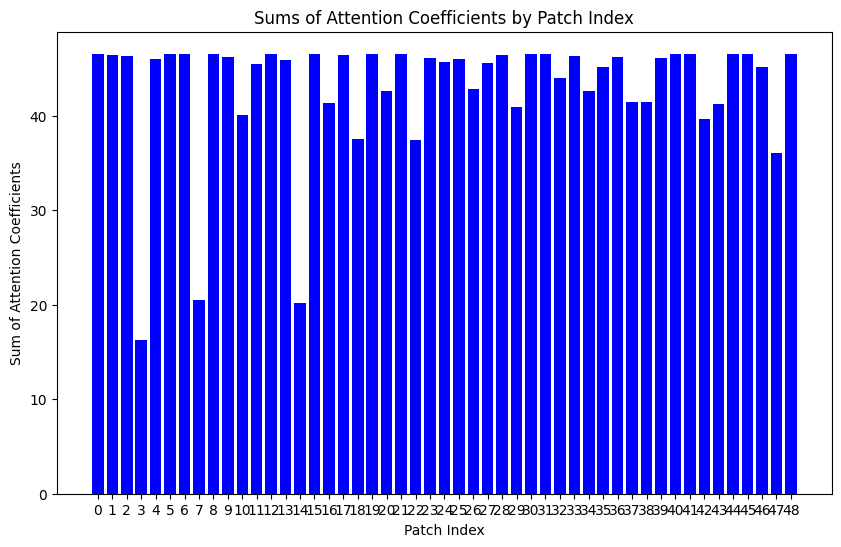

Predicted class for sample 139: 1.0
Row sums: [47.003075 46.96221  46.667515 16.834686 44.775566 47.013702 47.007305
 21.110254 46.976784 45.572197 41.425964 47.01406  46.93564  46.409473
 19.60459  46.412754 46.616375 46.40751  43.65899  47.01408  42.13208
 47.014038 46.921326 46.972744 43.93176  43.648746 40.02363  45.80543
 46.95221  45.634037 46.94272  46.937954 45.152996 46.79316  42.662975
 45.36021  46.75396  40.470737 45.562443 44.764233 46.959892 47.005806
 40.37835  41.971104 46.930614 46.92383  45.748573 35.858067 46.981327]


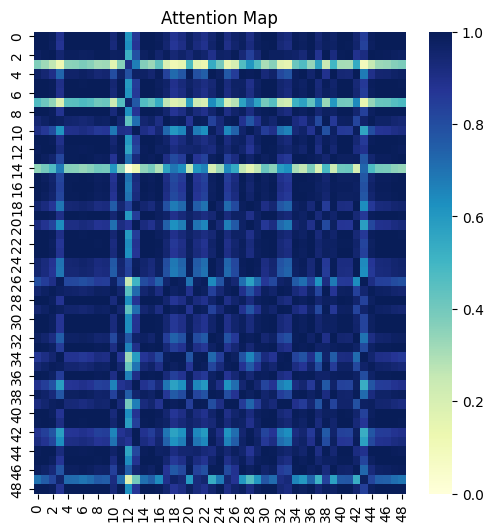

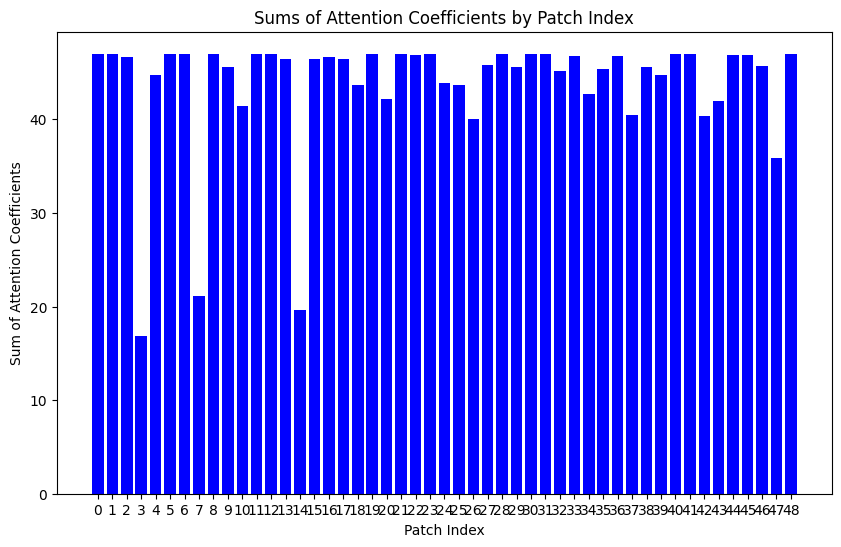

Predicted class for sample 140: 1.0
Row sums: [46.86042  46.80118  46.630577 16.22599  44.43085  46.891563 46.86799
 20.485586 46.820953 45.627346 40.97027  46.484924 46.861347 46.16675
 20.029106 46.890244 45.773613 46.82696  44.49646  46.828182 42.880013
 46.890877 37.57633  46.389492 46.662453 42.17865  43.085827 45.845478
 46.78803  41.1507   46.82798  45.482937 46.55433  46.595875 42.84507
 45.427994 46.550724 45.23676  46.574734 46.892258 46.79811  46.89351
 39.898296 41.52952  46.883247 46.819912 45.455666 36.19246  46.827316]


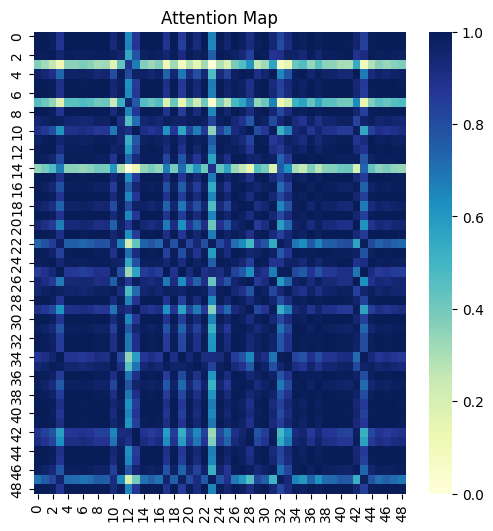

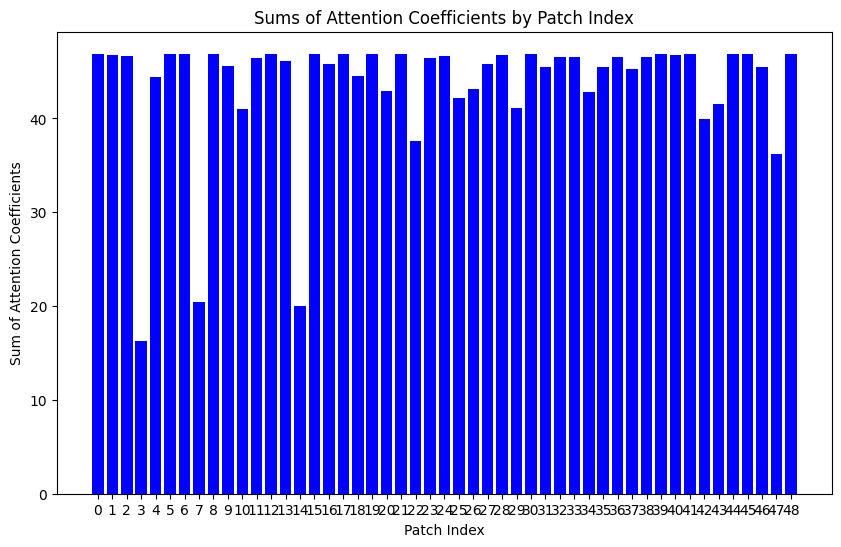

Predicted class for sample 141: 1.0
Row sums: [46.59033  46.530277 46.374096 16.29012  44.179817 46.62293  46.598095
 20.514538 46.55023  45.394985 37.894367 46.615135 46.596466 45.898125
 20.122477 46.62145  45.508347 45.64519  46.39434  46.55754  42.647522
 46.622154 37.48092  46.11934  39.760315 41.137444 42.850807 45.60837
 46.51704  40.93989  46.530525 44.236088 46.283367 46.324776 42.665764
 45.19985  46.279774 39.796665 45.96919  46.623726 46.527187 46.62577
 39.703472 41.31391  46.62174  46.548992 45.19349  36.116756 46.556664]


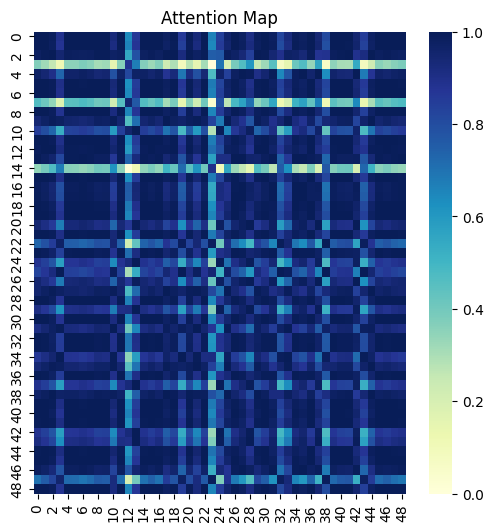

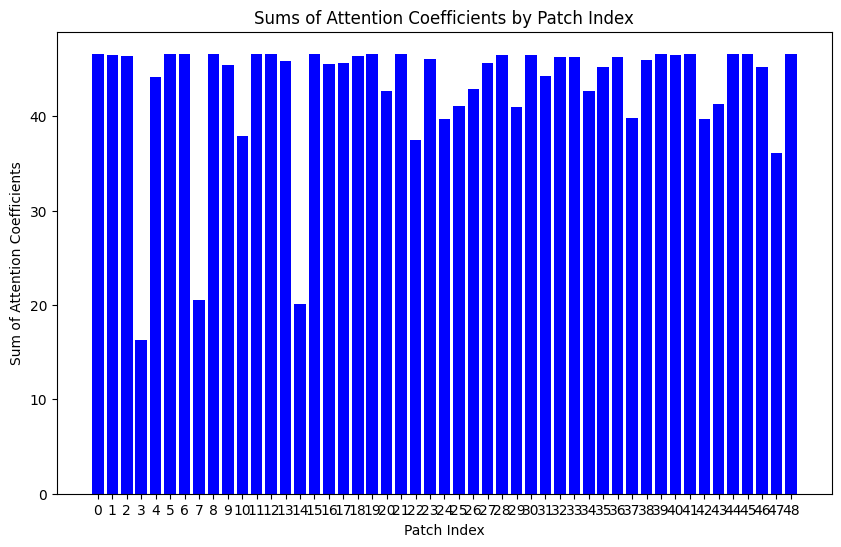

Predicted class for sample 142: 1.0
Row sums: [46.81992  46.777348 46.497387 16.668835 44.582363 46.83265  46.824486
 20.944683 46.797176 46.809883 32.363873 46.49265  46.473137 46.218945
 19.617073 46.161194 43.080513 46.74772  46.486794 45.88439  43.090008
 46.832874 37.186115 46.421837 46.41359  45.99798  43.28892  45.648403
 46.76707  41.411446 46.819572 40.078194 46.485676 46.605392 42.539387
 45.20871  46.565777 45.372593 39.01345  46.83226  46.774967 46.825832
 40.189625 41.780098 46.310207 46.83173  45.556107 35.789413 46.797104]


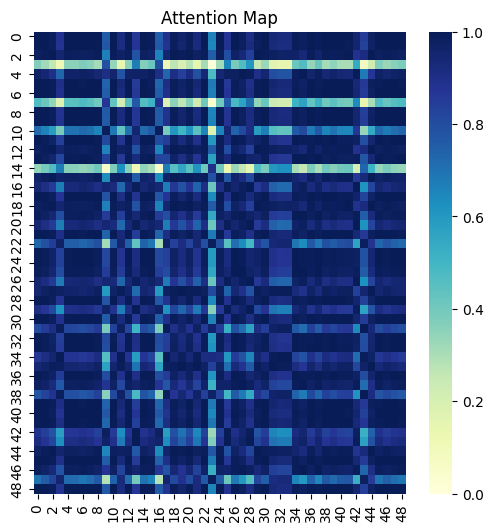

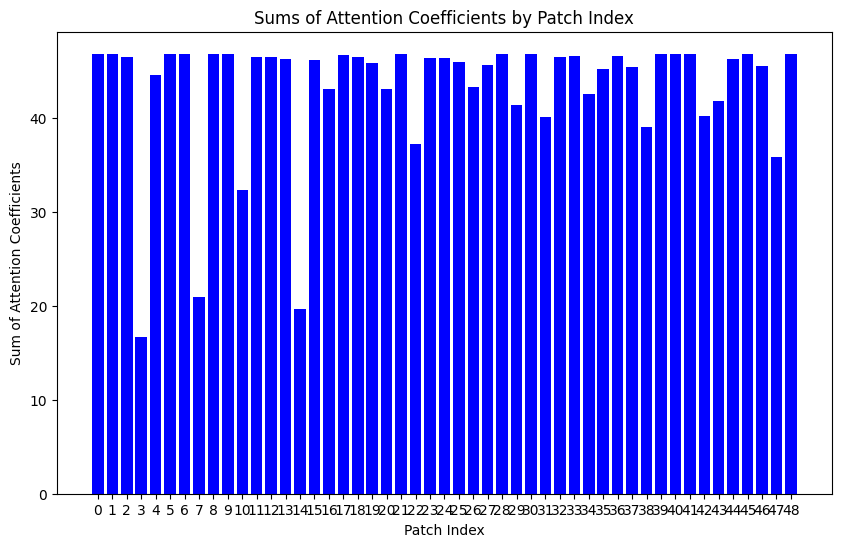

Predicted class for sample 143: 1.0
Row sums: [47.160465 47.133656 46.73778  16.8706   45.062614 47.155    47.162113
 21.224518 47.144295 46.036976 41.74955  47.162785 33.25572  46.638546
 19.214611 43.751534 43.323143 44.721184 47.16278  46.34222  43.592957
 47.156147 47.042725 46.826283 46.522175 46.93425  43.789753 45.806698
 47.126026 41.924835 47.13379  46.99592  46.94618  46.991203 42.5281
 45.335693 46.956223 42.71003  46.945675 47.1535   47.13191  47.139233
 40.704353 42.29217  47.120407 47.154243 46.008423 35.56924  47.14745 ]


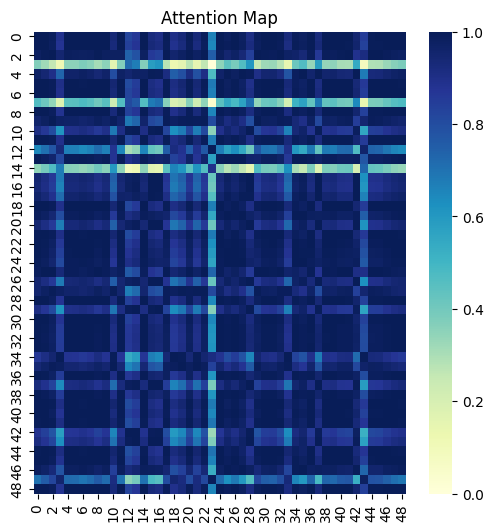

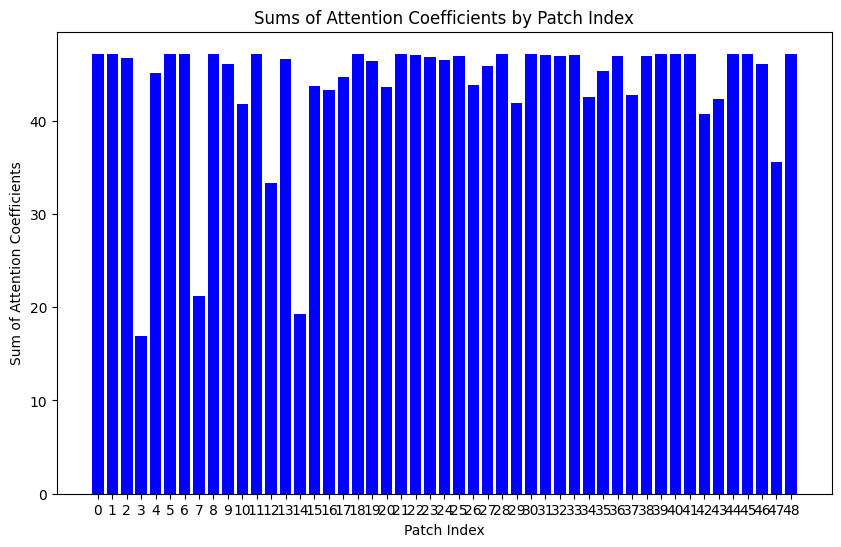

Predicted class for sample 144: 1.0
Row sums: [47.24227  47.22726  46.74556  17.079798 45.25811  47.22326  47.241737
 21.463686 47.234596 47.168854 21.389027 47.080128 47.106674 46.781075
 18.582382 47.226543 47.22038  44.417034 45.240135 46.00331  43.814293
 47.225094 36.660656 47.239098 46.37751  46.90899  46.381687 45.753445
 47.221626 42.165382 47.239414 40.60977  47.12119  47.107235 42.342644
 45.258797 47.07583  46.636562 39.975822 47.22094  47.225998 47.20086
 40.95493  42.529125 44.840256 47.240036 46.17814  35.196865 47.236584]


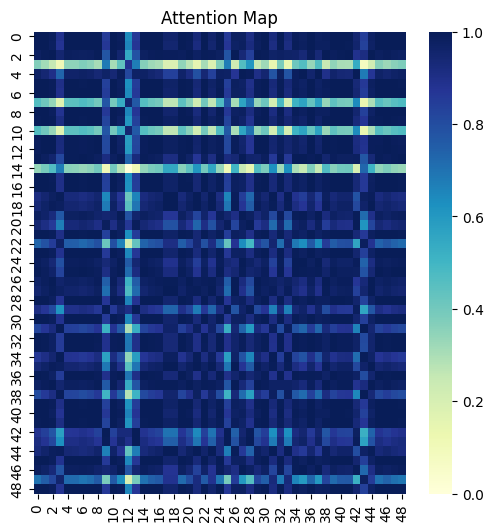

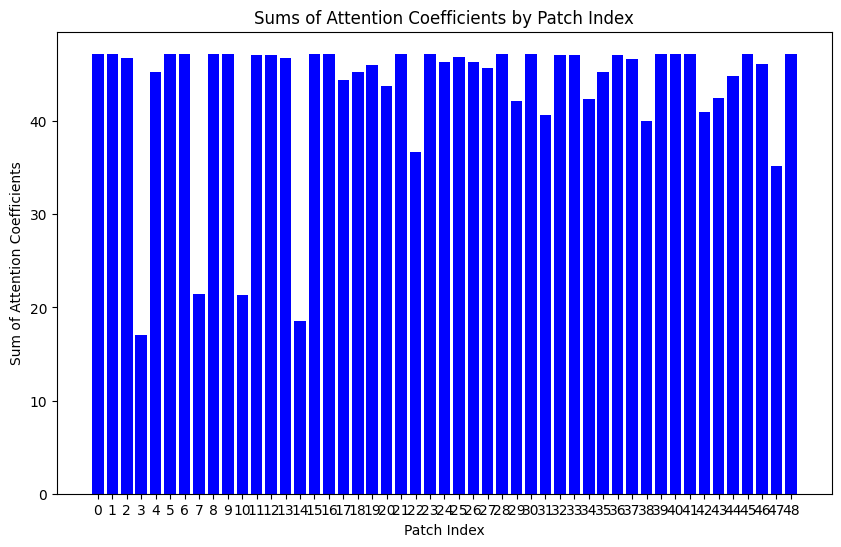

Predicted class for sample 145: 1.0
Row sums: [46.282276 46.266216 45.82618  17.419764 44.391247 46.266556 46.282124
 21.665369 46.27428  45.54482  22.749445 46.253254 46.16053  45.83751
 19.122978 46.253468 40.892624 46.151005 45.66954  45.866535 43.022312
 46.26817  36.354424 46.005184 45.90932  45.459675 43.206203 44.90095
 46.260574 41.45856  46.26631  46.09429  46.181793 46.14941  41.70445
 44.43843  46.119213 41.792667 46.272373 46.264503 46.264935 46.24652
 40.30992  41.803596 46.26704  46.274673 45.264175 34.971718 46.27573 ]


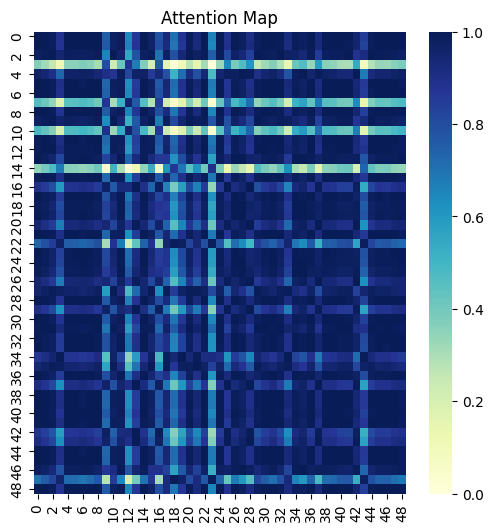

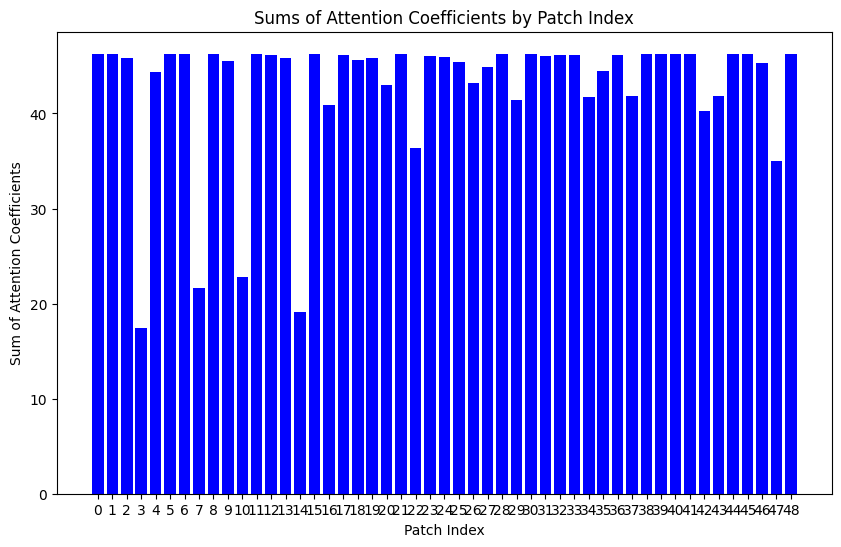

Predicted class for sample 146: 1.0
Row sums: [47.435852 47.3737   47.20416  15.958906 44.91592  47.469093 47.443844
 20.29502  47.394512 46.31111  41.042248 47.38598  37.65242  46.71411
 19.985348 47.467697 33.483257 44.549534 46.38886  47.468437 43.31171
 47.468334 37.902378 46.945286 47.433025 46.539623 43.678154 46.398106
 47.35995  42.770367 47.460144 39.11702  46.79654  43.326794 43.313297
 45.968964 47.112797 42.32686  38.73173  47.46988  47.370487 47.47162
 40.231068 41.915855 47.467213 47.276447 45.97702  36.483147 47.401062]


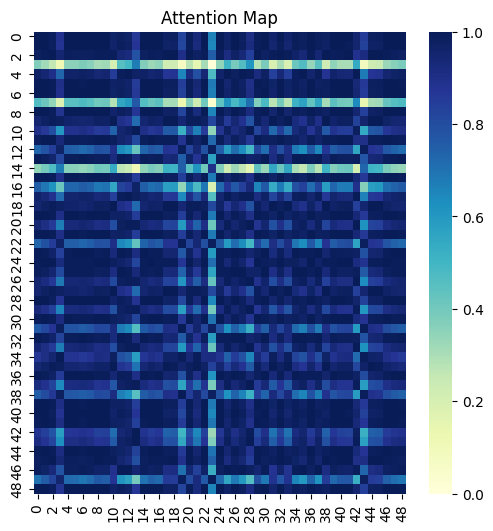

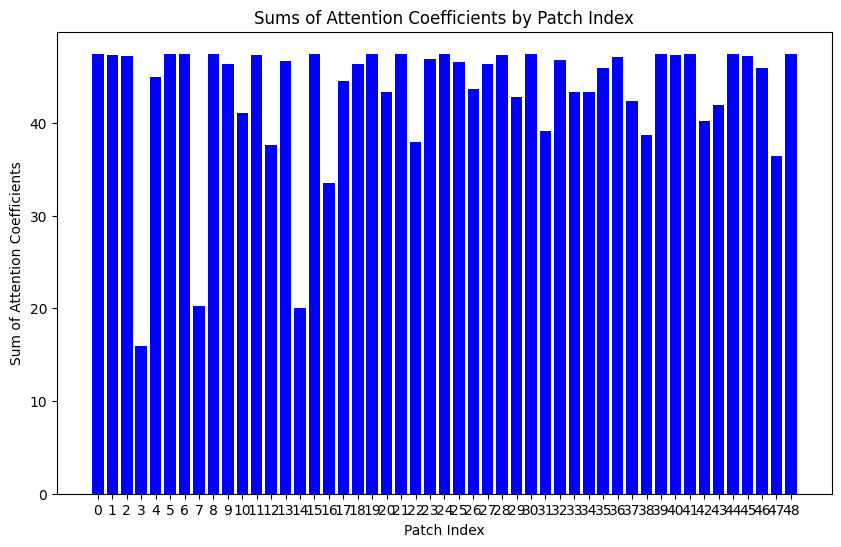

Predicted class for sample 147: 1.0
Row sums: [46.98463  46.933918 46.702152 16.390978 44.636887 47.006027 46.990627
 20.677729 46.9513   45.648495 44.09897  41.363747 46.958855 46.33497
 19.78415  47.0056   45.953754 47.004265 44.024017 46.95757  43.103497
 47.005833 37.43529  46.50747  44.813835 41.649582 43.307457 45.875183
 46.922215 41.38603  46.97035  42.08743  46.705715 46.744873 42.790123
 45.441917 46.702312 46.418392 44.832592 47.006134 46.931274 46.76631
 40.13905  41.76275  46.994244 46.950394 45.643486 36.03484  46.956818]


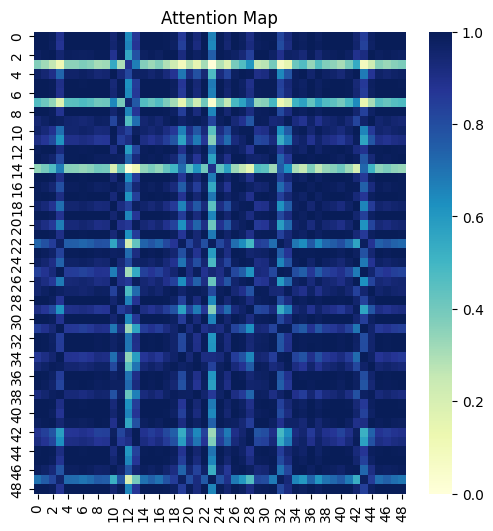

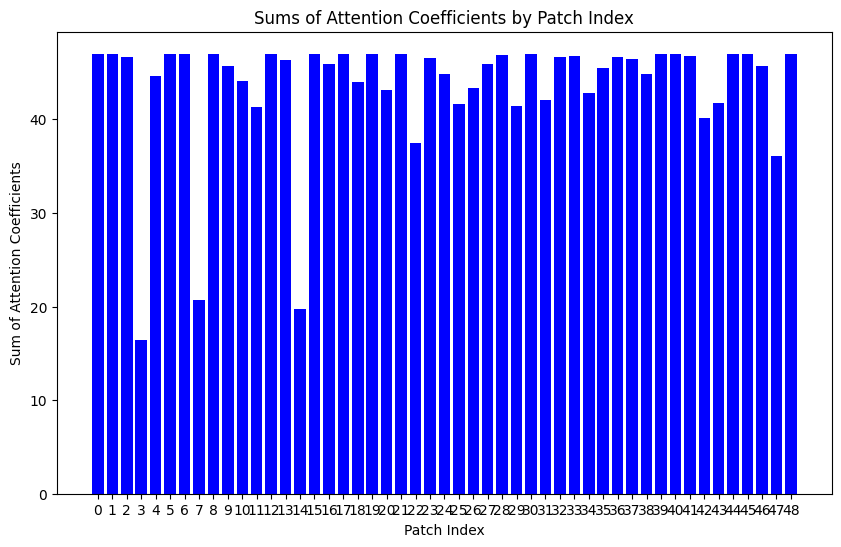

Predicted class for sample 148: 1.0
Row sums: [47.06773  46.99999  46.87985  15.91938  44.5227   47.107933 47.076805
 20.203087 47.022198 45.90369  40.930206 46.548225 45.261734 46.323177
 20.234623 47.10907  38.272976 45.33457  46.570274 44.82896  42.928402
 47.106808 37.87394  46.557556 47.081154 43.261078 43.139576 46.118
 46.985348 41.15743  47.056572 40.6794   46.946    46.776817 43.14348
 45.70736  46.728596 46.627995 47.09659  47.109154 46.99656  47.11406
 39.877796 41.75503  46.39797  47.021027 45.582085 36.48619  47.02941 ]


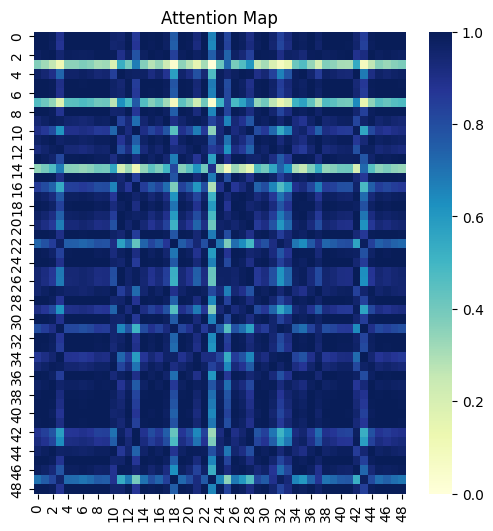

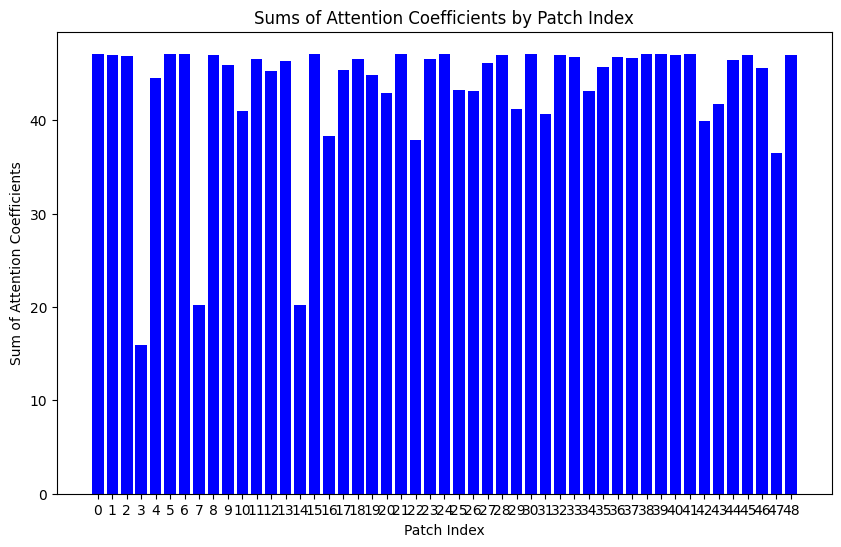

Predicted class for sample 149: 1.0
Row sums: [46.53909  46.475945 46.34229  16.240458 44.100094 46.57525  46.54743
 20.453648 46.496758 45.382145 40.142845 46.56614  46.555023 45.83116
 20.209202 46.57344  45.437256 43.520687 46.335773 46.50442  42.562424
 46.574295 37.529938 46.05543  42.780754 41.16517  42.766254 45.592304
 46.462185 40.85161  46.4762   44.707275 46.23549  46.264603 42.681904
 45.18975  46.218674 39.70729  44.736214 39.175632 46.472725 46.579834
 39.614033 41.226143 46.577293 46.495552 45.119785 36.172066 46.5035  ]


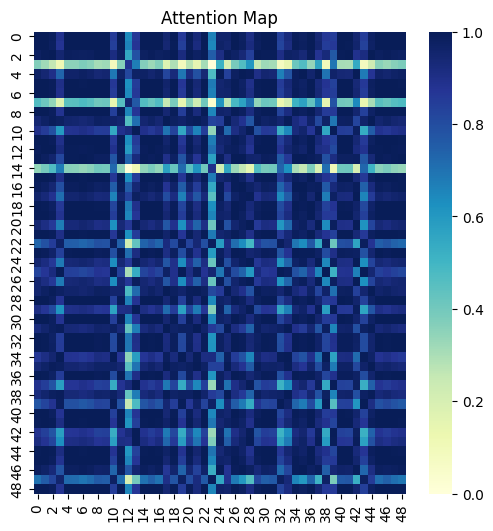

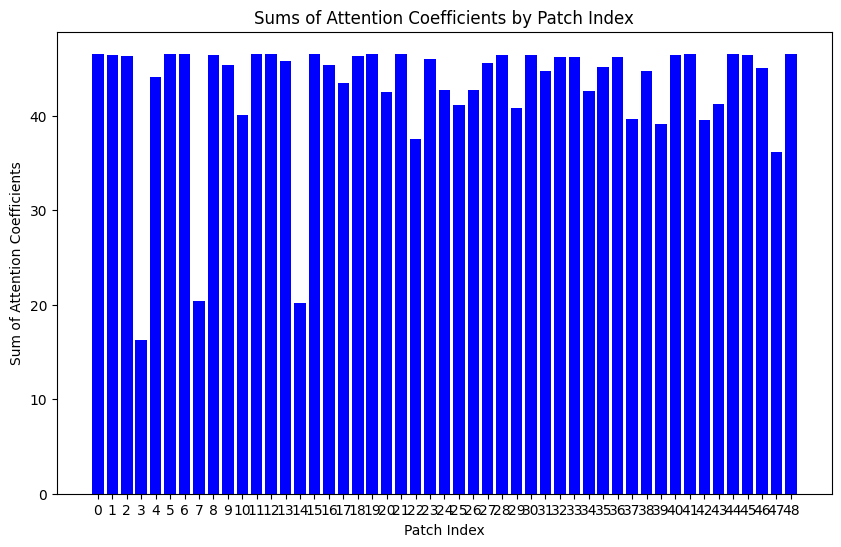

Predicted class for sample 150: 1.0
Row sums: [47.063583 47.055405 46.534615 17.213945 45.17289  47.037357 47.061848
 21.599062 47.060772 45.478676 38.089806 47.043022 46.90964  46.6437
 18.550098 47.04129  43.37141  44.58824  45.062145 47.06224  43.76307
 47.039543 36.458378 47.062763 45.180584 46.27784  43.952892 45.52721
 47.050976 42.145496 47.05548  46.718334 47.04017  46.94986  42.11024
 45.028942 46.920956 41.044952 46.60367  42.45358  47.05443  47.011665
 40.95475  42.502827 46.983334 45.40052  46.065174 35.00582  47.06208 ]


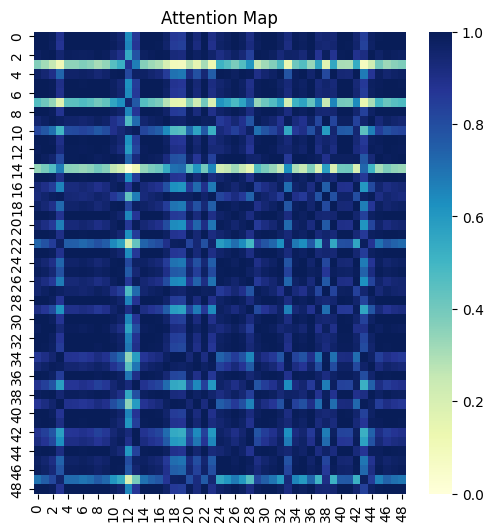

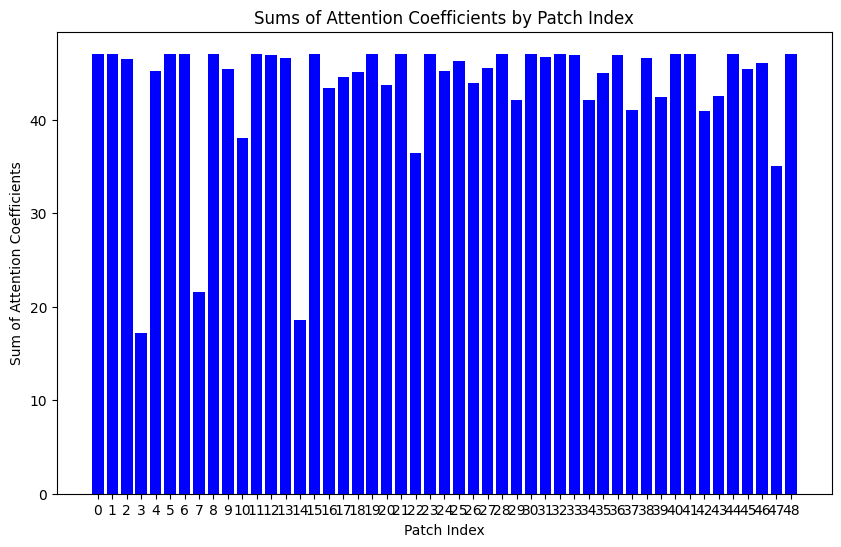

Predicted class for sample 151: 1.0
Row sums: [46.806705 46.754566 46.538284 16.375385 44.460423 46.830055 46.813
 20.642834 46.77473  46.01092  41.049583 46.825718 46.787018 46.152927
 19.89867  46.70115  33.48777  39.792595 46.714714 46.768105 42.935184
 46.829754 37.39997  46.367054 45.812878 45.126984 46.553795 45.727905
 46.742645 41.227978 46.80386  43.360126 46.787975 46.563576 42.689106
 45.301994 46.52081  46.81781  46.809917 46.83029  46.75179  46.82831
 39.988804 41.602386 46.422867 46.80905  45.462883 36.014973 46.777977]


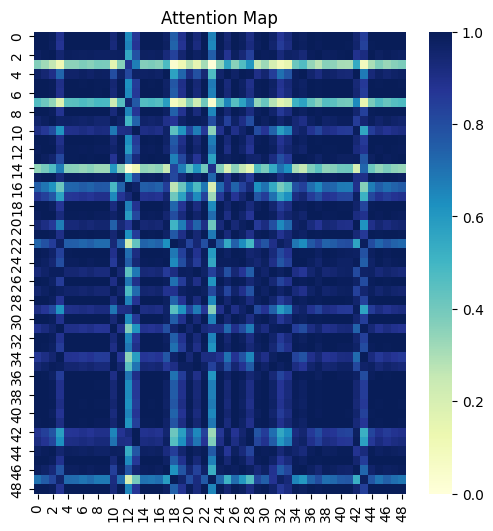

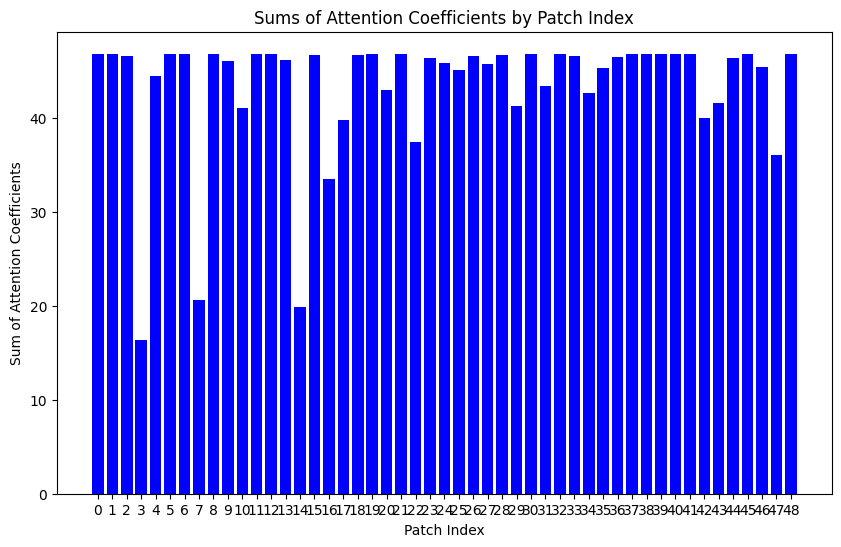

Predicted class for sample 152: 1.0
Row sums: [47.134296 47.11253  46.688427 17.36082  45.112503 47.123566 47.135063
 21.660997 47.121716 45.497456 41.86018  45.86609  42.8912   46.644
 19.257406 47.12607  46.664757 45.270573 46.90071  44.75398  43.675297
 47.12497  36.943356 46.665707 47.050297 46.916954 43.869568 45.746296
 47.1058   42.040264 47.13024  47.072723 44.96441  46.98101  42.460125
 45.272476 46.947952 42.357376 46.750423 47.12177  47.111    47.105408
 40.84252  42.400547 47.134647 47.133556 46.03396  35.517868 47.124367]


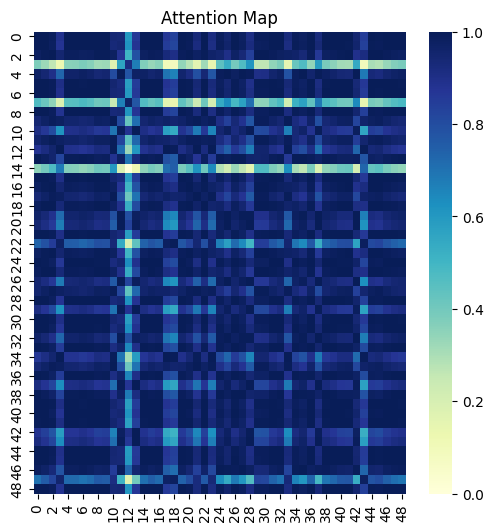

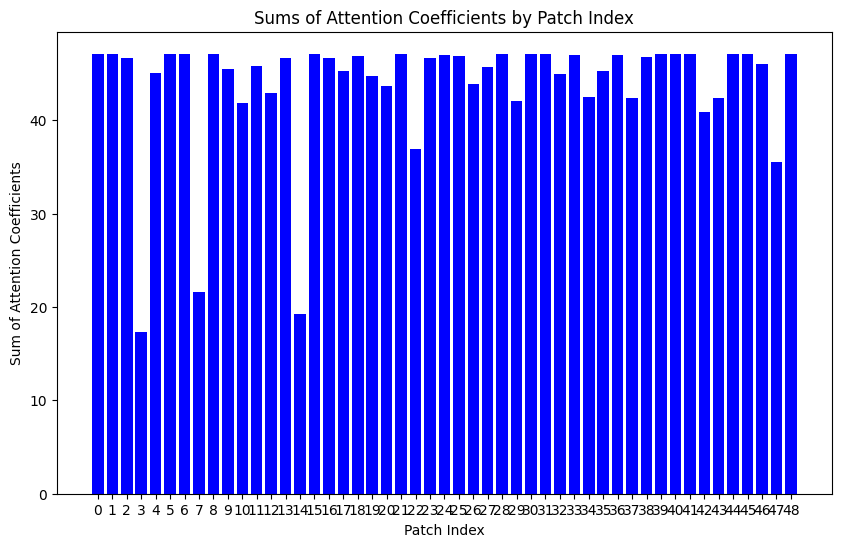

Predicted class for sample 153: 1.0
Row sums: [47.091152 47.05825  46.707104 16.96779  44.94073  47.092712 47.09392
 21.264875 47.07059  45.85939  32.278072 46.024506 38.428177 46.538868
 19.448647 47.08405  39.828587 46.52348  47.089863 45.70485  43.464115
 47.093506 37.131187 46.732376 46.420002 47.030453 43.66145  45.807476
 47.049603 41.79467  47.058414 46.892815 45.392784 46.90444  42.593143
 45.348404 46.86768  43.637444 46.382435 47.09164  47.056263 47.0804
 40.57606  42.161858 46.94763  47.083897 45.896496 35.71373  47.07435 ]


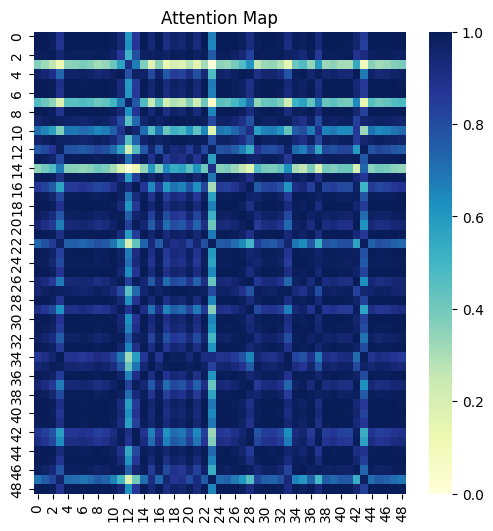

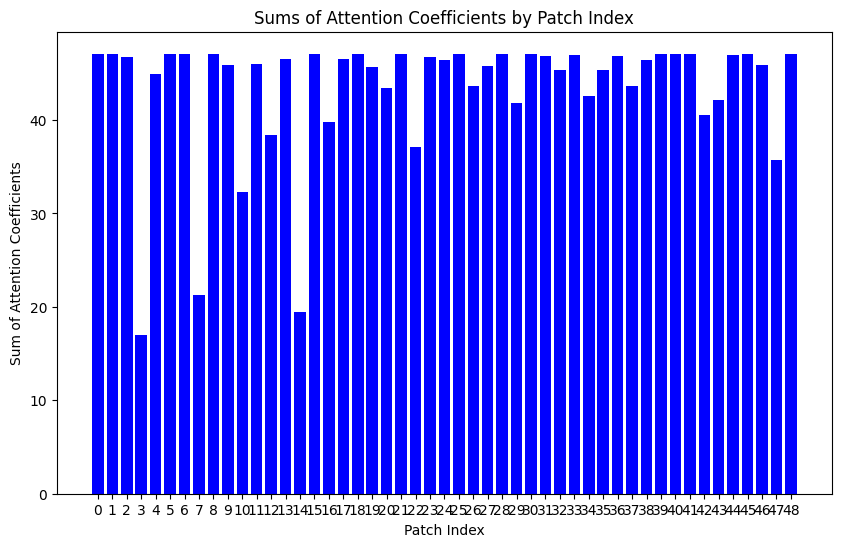

Predicted class for sample 154: 1.0
Row sums: [46.548977 46.517185 46.173985 16.969942 44.457317 46.55025  46.55164
 21.229767 46.53064  40.382614 28.30646  44.688114 46.471516 46.01261
 19.449862 46.551624 45.67302  46.5442   46.354008 46.53325  43.018658
 46.551037 36.831867 46.20073  46.057125 45.467007 43.211002 45.29742
 46.5088   41.390583 46.51734  46.374836 46.44465  46.36792  42.16459
 44.85015  46.33221  40.291065 46.50069  45.12129  46.51525  46.538155
 40.201164 41.74881  46.521534 46.48607  45.387733 35.445644 46.53276 ]


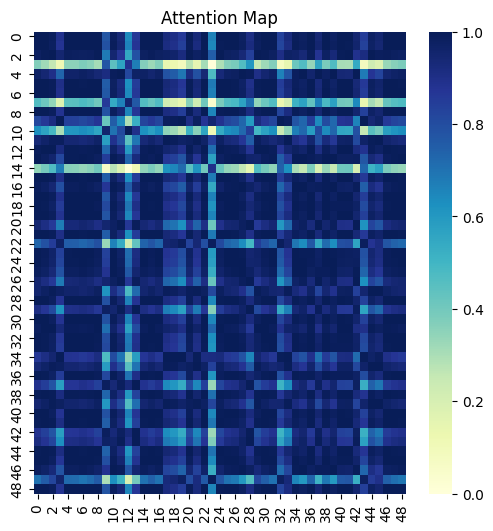

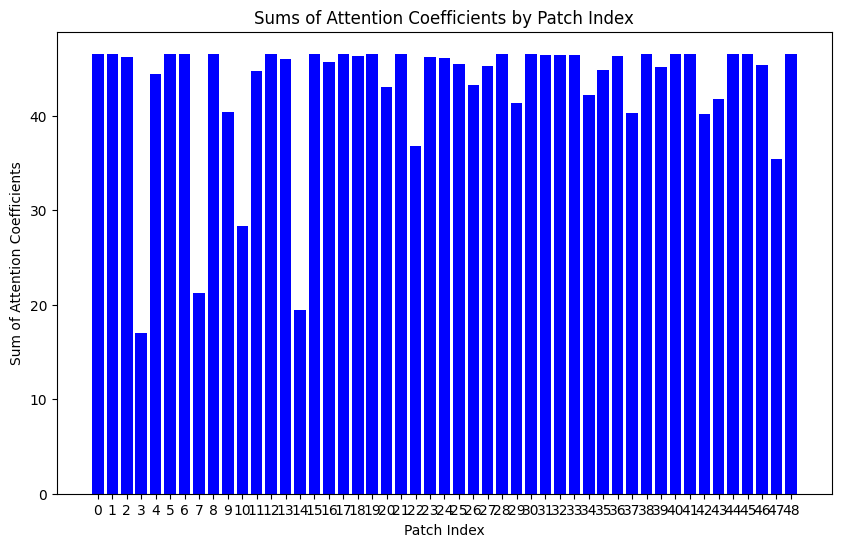

Predicted class for sample 155: 1.0
Row sums: [46.89707  46.832554 46.695908 16.110867 44.405537 46.934013 46.90559
 20.364538 46.853825 45.714947 40.907837 43.32294  46.91332  46.17375
 20.128418 46.932163 45.77132  46.93592  45.33777  46.861652 42.83561
 46.933037 37.705193 46.402893 46.925465 41.597622 43.04367  45.92963
 46.818493 41.089783 46.89095  43.87427  46.573425 46.616608 42.958
 45.518425 46.569687 46.90823  46.694427 46.935043 46.829266 46.938694
 39.827488 41.4719   46.93609  46.852703 45.447006 36.32241  46.86071 ]


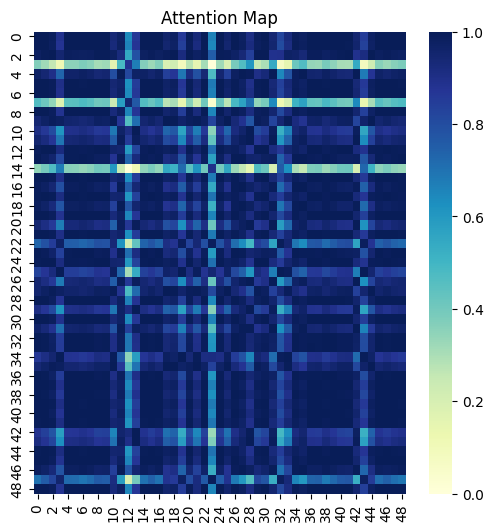

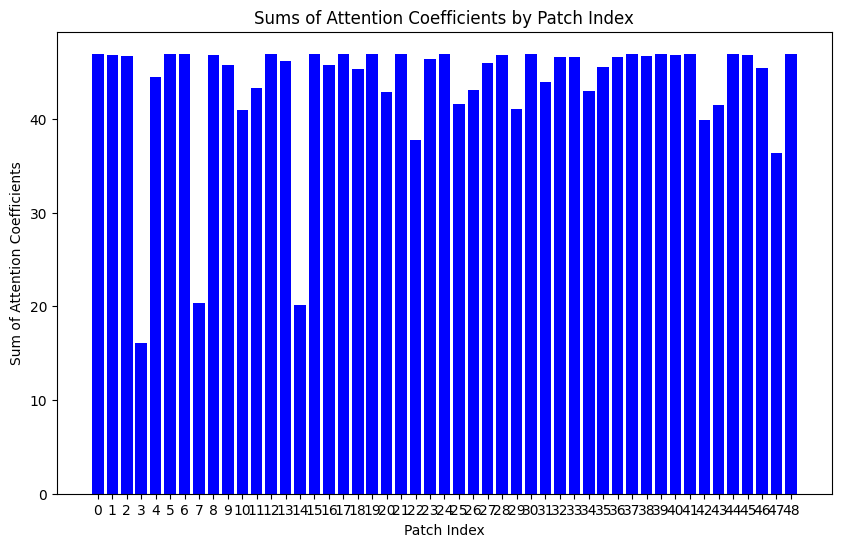

Predicted class for sample 156: 1.0
Row sums: [46.835194 46.78326  46.564953 16.418522 44.490383 46.858276 46.841446
 20.684586 46.800957 45.528942 43.776993 45.490948 46.814713 46.18229
 19.85279  46.85769  46.830708 45.047005 45.764057 46.807358 42.965588
 46.85799  37.40262  46.396275 46.328465 45.249157 43.16832  45.752285
 46.77137  41.258953 46.783478 46.38748  46.836597 46.5926   42.705814
 45.325287 46.54989  43.05478  45.917267 44.62574  46.78049  46.85639
 40.020252 41.633224 46.848274 46.800034 45.49254  36.01378  46.80659 ]


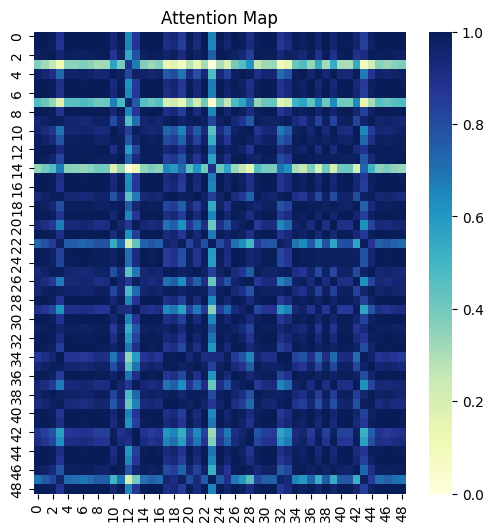

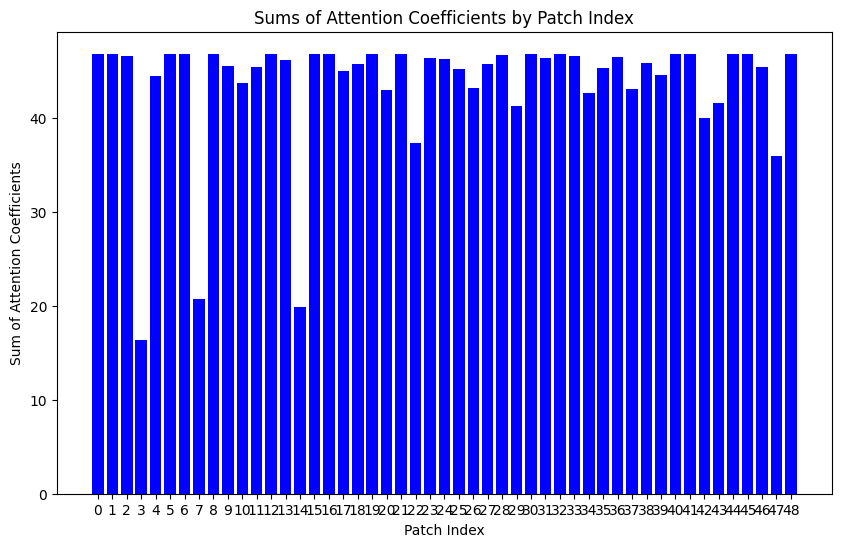

Predicted class for sample 157: 1.0
Row sums: [46.9027   46.858067 46.588627 16.545134 44.631115 46.917507 46.90761
 20.833096 46.87371  45.5125   46.129936 43.300594 46.859726 46.2882
 19.675571 46.917675 45.918476 46.874596 46.59825  46.87929  43.123363
 46.917637 37.270348 46.494423 46.798756 40.816902 43.32424  45.742523
 46.847424 41.42907  46.85827  44.778957 46.64843  46.68151  42.632225
 45.303238 46.641068 40.289536 46.798767 46.91723  46.855595 46.911606
 40.1965   41.80108  46.900078 46.872902 45.616226 35.871212 46.878624]


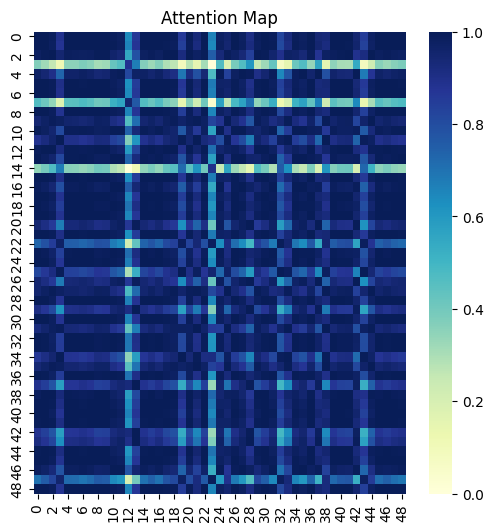

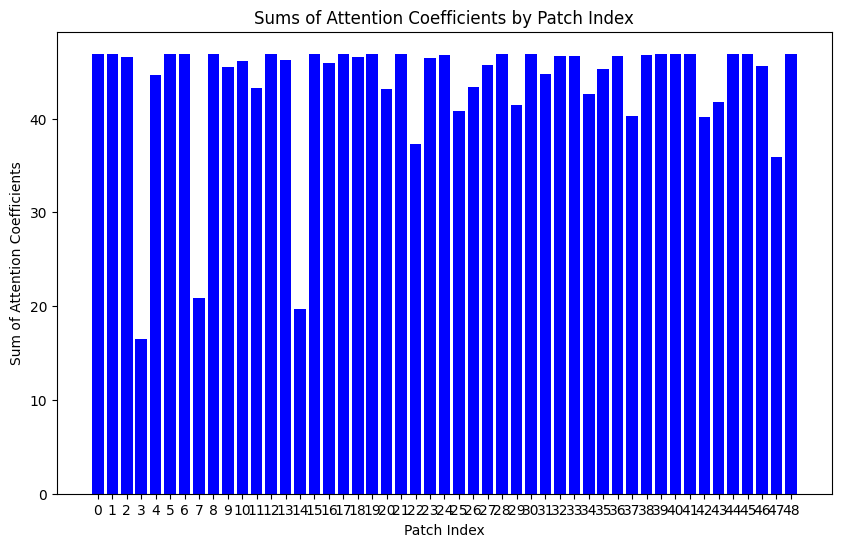

Predicted class for sample 158: 1.0
Row sums: [46.78166  46.76891  46.291275 17.311747 44.87765  46.761295 46.780827
 21.63526  46.7755   46.554516 25.552341 46.77963  46.645226 46.34468
 18.965261 43.297184 42.58579  46.76366  44.537052 46.777477 43.481144
 46.76317  36.51671  46.51286  46.6941   46.508427 43.668934 45.32527
 46.763752 41.88269  46.76903  43.26853  46.03838  46.656204 42.0177
 44.84481  46.626366 40.796425 46.78169  43.50399  46.76775  46.73869
 40.707417 42.235565 46.713108 46.50122  46.778038 35.09952  46.777256]


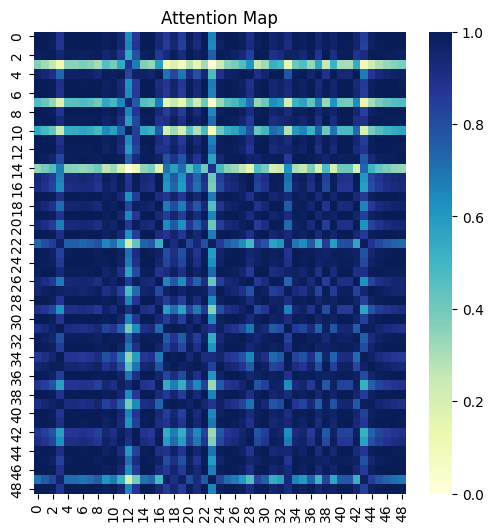

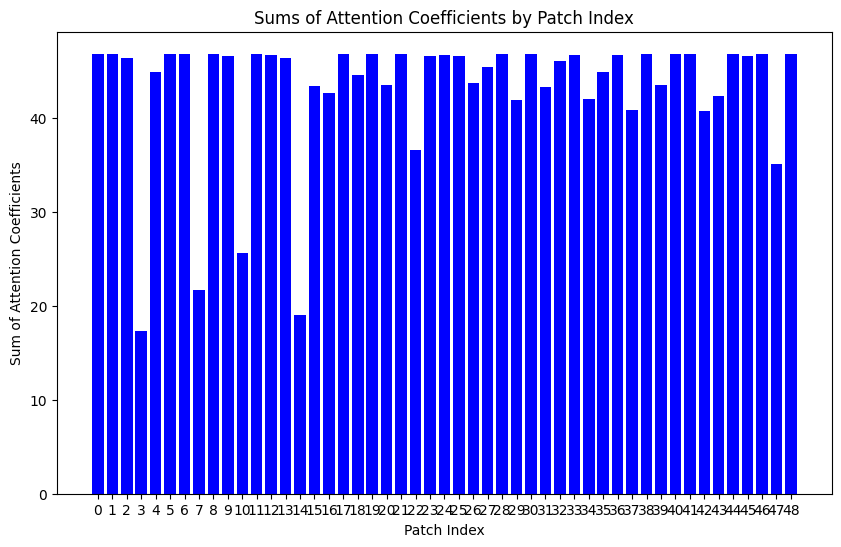

Predicted class for sample 159: 1.0


In [69]:
for i in range(len(X_train)):
    single_sample = torch.tensor(X_train[i:i+1].astype(np.float32))
    with torch.no_grad():
        prediction = attention_model(single_sample).squeeze()
        predicted_class = (torch.round(torch.sigmoid(prediction))).item()
        print(f"Predicted class for sample {i}: {predicted_class}")
